## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [49]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, \
MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split,\
StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler
from sklearn.neighbors import LocalOutlierFactor

In [50]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [51]:
runs = [306125, 319579, 321312]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [52]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 306125
Loading 319579
Loading 321312
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [53]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [54]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [55]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [56]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [57]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [58]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007
319579 2018-07-13 04:27:45 2018-07-14 01:00:07 1 3173 3173
321312 2018-08-15 20:55:17 2018-08-16 01:55:14 1 773 773


Reindexing the dataframe after removing some lines:

In [59]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [60]:
print len(int_lumi2.index)

6953


Filling end time column:

In [61]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [62]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [63]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

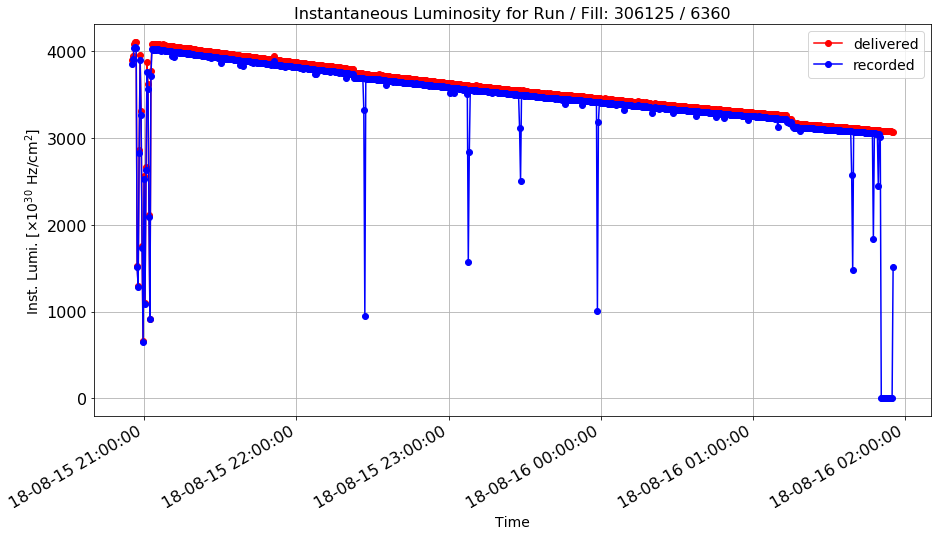

In [64]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 321312]["time"], 
               int_lumi2[int_lumi2["run"] == 321312]["delivered"], 
               int_lumi2[int_lumi2["run"] == 321312]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

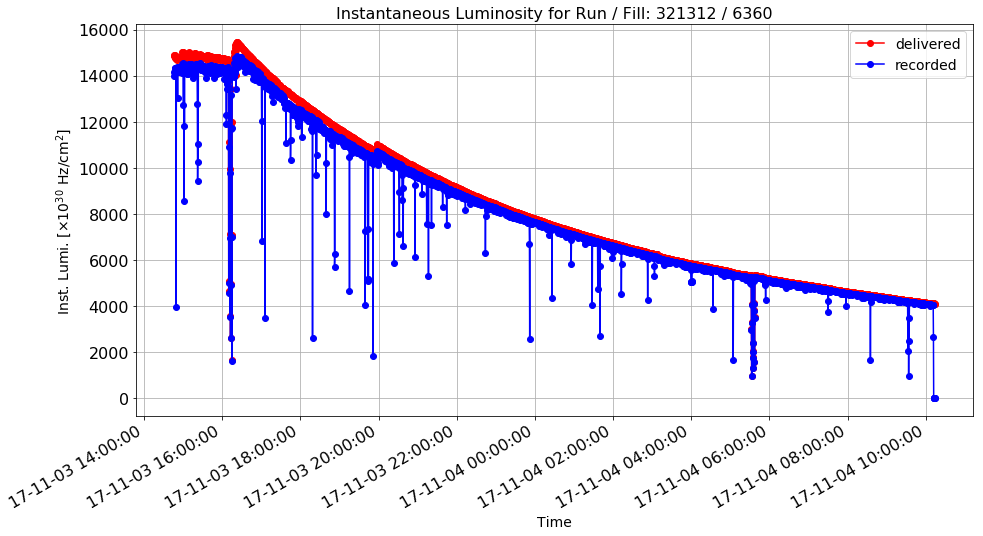

In [65]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 306125]["time"], 
               int_lumi2[int_lumi2["run"] == 306125]["delivered"], 
               int_lumi2[int_lumi2["run"] == 306125]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[2], int_lumi2["fill"].iloc[2])))

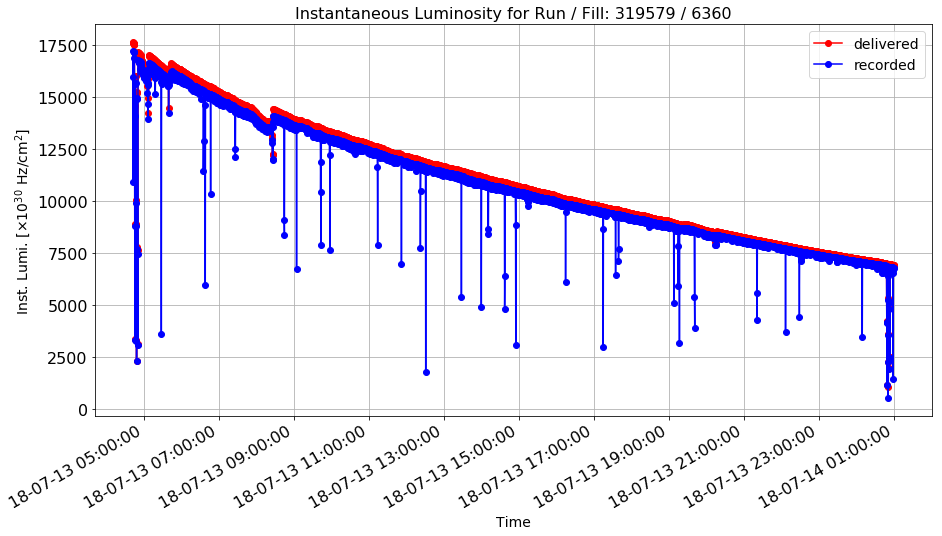

In [66]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 319579]["time"], 
               int_lumi2[int_lumi2["run"] == 319579]["delivered"], 
               int_lumi2[int_lumi2["run"] == 319579]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[1])))

In [67]:
#int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [68]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [69]:
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'm',value=r'-')
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'p',value=r'+')
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [70]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
#df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

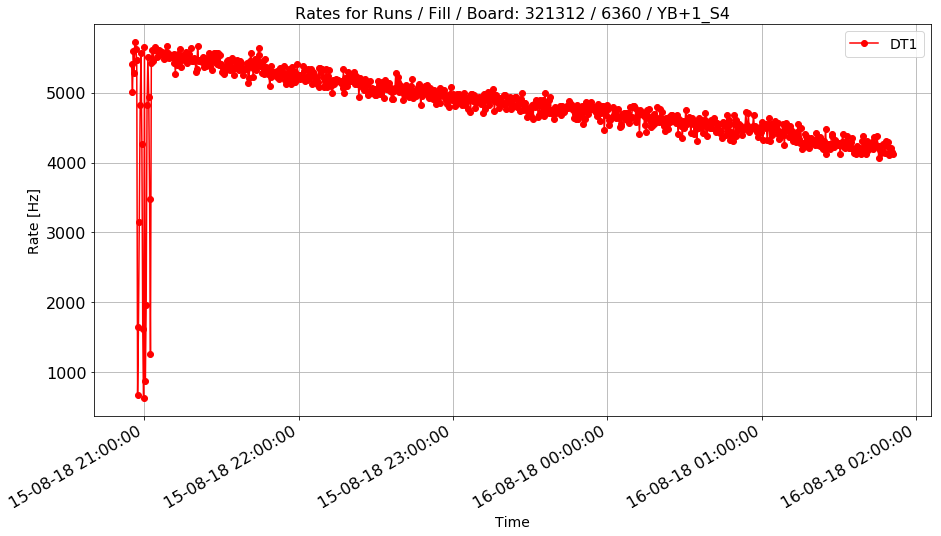

In [71]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 321312], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  ("321312", int_lumi2["fill"].iloc[2], "YB+1_S4"))

Associating a LS and an instantaneous luminosity to each rate:

In [72]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [73]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [74]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-11-03 14:46:12 2018-08-16 01:55:14
Duplicates: 1551287


In [75]:
print len(df_rates_noduplicates)

26293


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [76]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000


Removing the few cases not assigned and that are still at -1:

In [77]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

26243


Save in a csv file:

In [78]:
#df_rates.to_csv("df_rates_issues.csv", sep='\t')
#df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [79]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [80]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000
1410000
1440000
1470000
1500000
1530000
1560000


Save another backup copy:

In [81]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [82]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

In [83]:
#print df_rates[df_rates.ls <= 0]
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [84]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [85]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [86]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [87]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]]\
.size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3",\
                                         "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [88]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [89]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [90]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [91]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [92]:
print len(df_rates)

41580


Uncomment to check just one case:

In [93]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [94]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    errors = []
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        if (run[i] == 306125):
            rule = rule & (df_temp.lumi > 6000)
        if (run[i] == 319579):
            rule = rule & (df_temp.lumi > 10000)
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0)) #append anomalous fit,\
                                                #then normal fit, and ratio of the two
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        errors.append(df_temp[rule]["errRatio"])
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
    a, b, c = inter[0], inter[1], 1-inter[0]/inter[1]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c) #anomalous cs, normal cs, ratio of the two

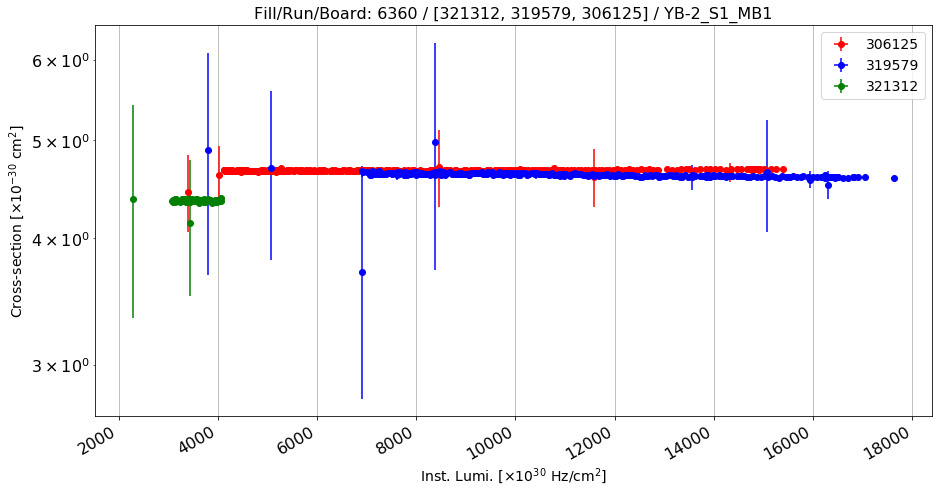

Anomalous CS: 4.67288101215 , Normal CS: 4.61401104424 , Ratio: -0.0127589568682


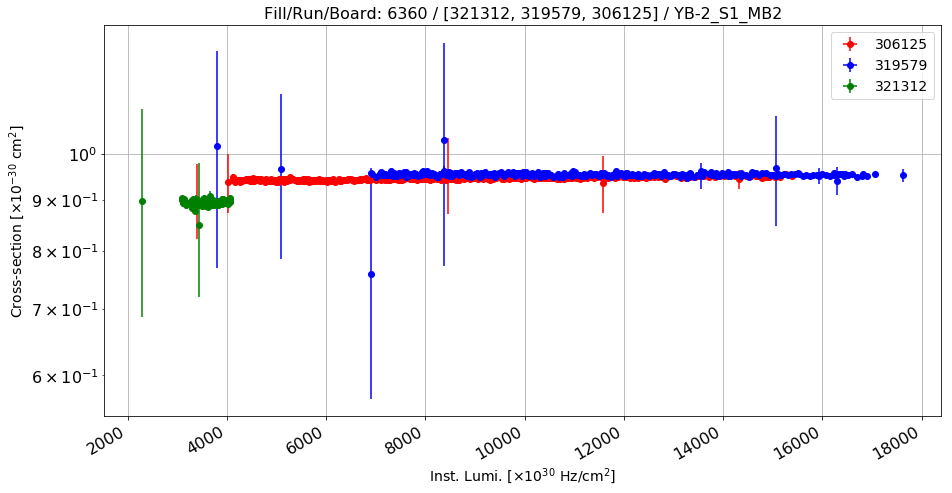

Anomalous CS: 0.946096324341 , Normal CS: 0.953831892849 , Ratio: 0.00810999146232


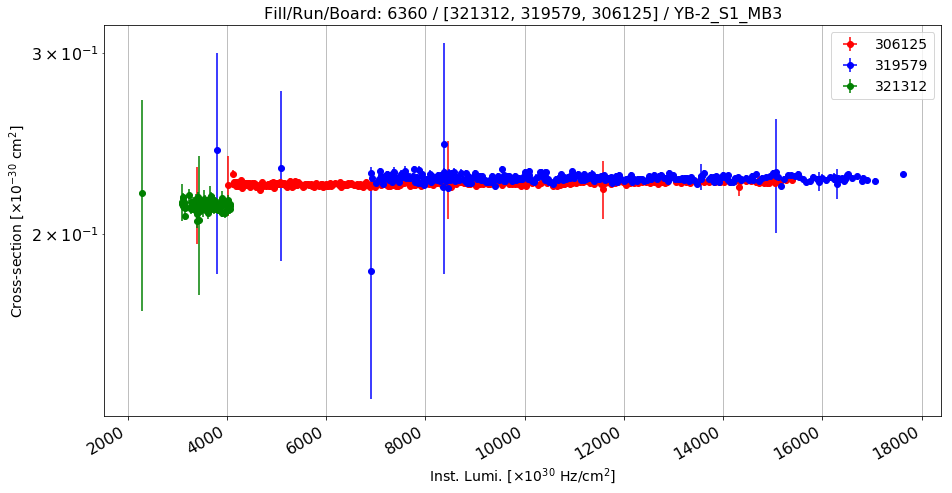

Anomalous CS: 0.224153891914 , Normal CS: 0.226806424309 , Ratio: 0.0116951378358


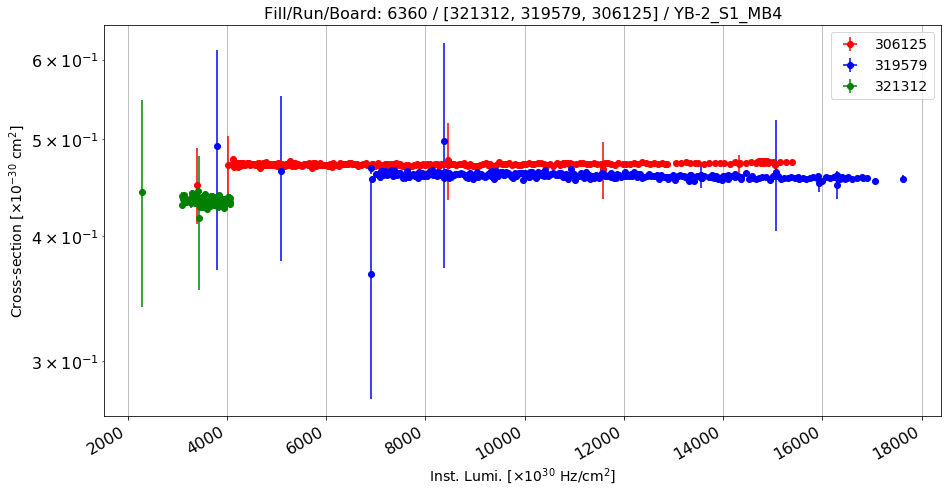

Anomalous CS: 0.472515792172 , Normal CS: 0.459107351062 , Ratio: -0.0292054594177


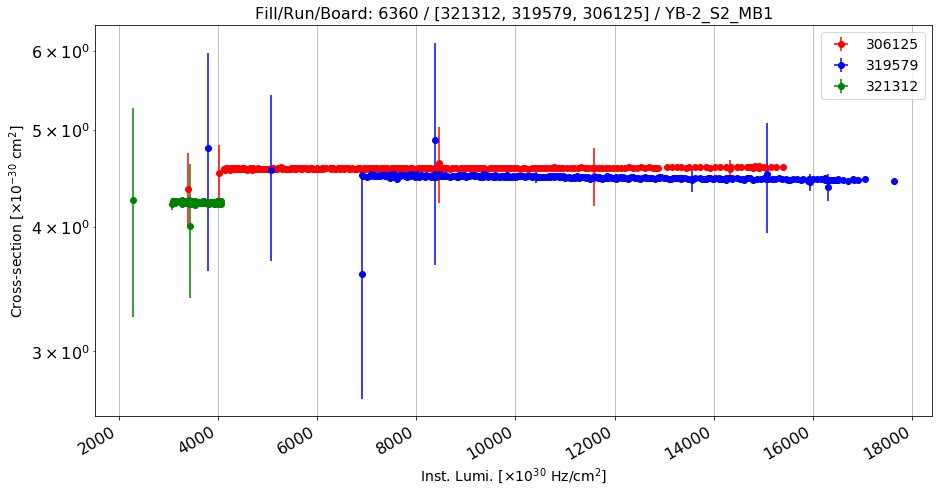

Anomalous CS: 4.58097948331 , Normal CS: 4.47496512399 , Ratio: -0.0236905442578


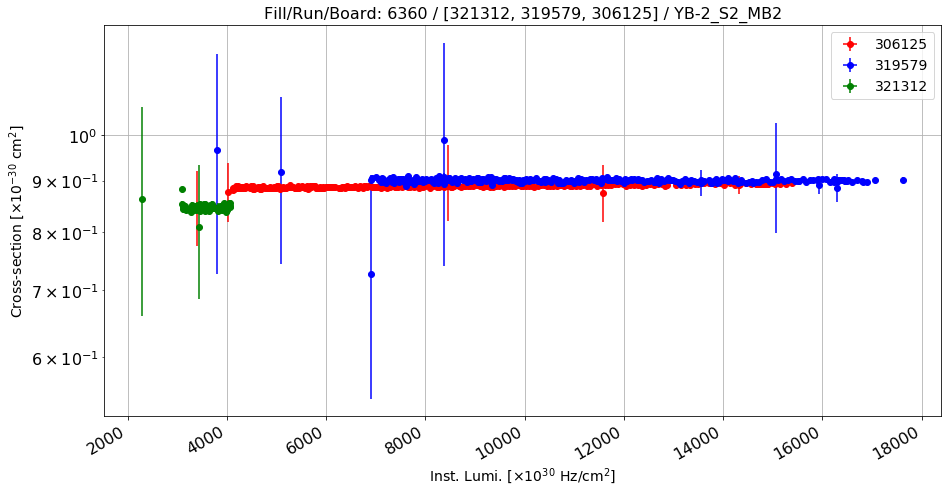

Anomalous CS: 0.890911268504 , Normal CS: 0.901251441596 , Ratio: 0.0114731279363


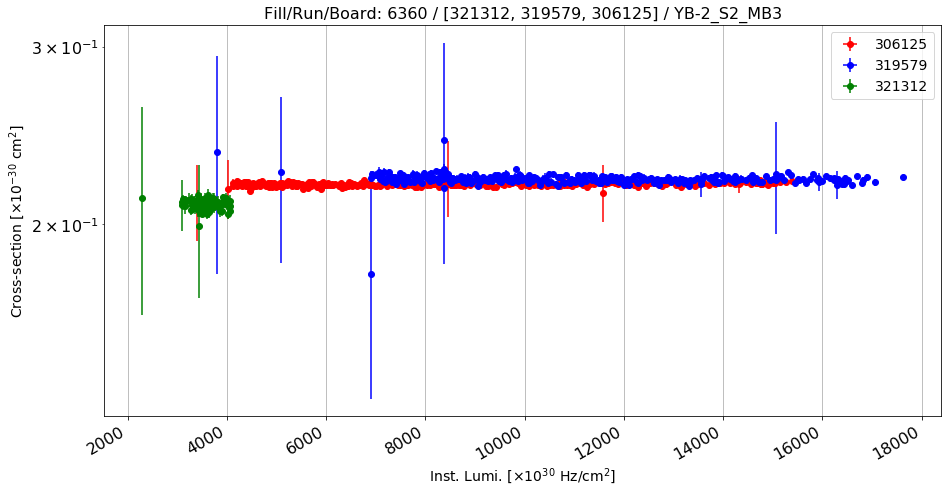

Anomalous CS: 0.219330596571 , Normal CS: 0.221615971731 , Ratio: 0.0103123215488


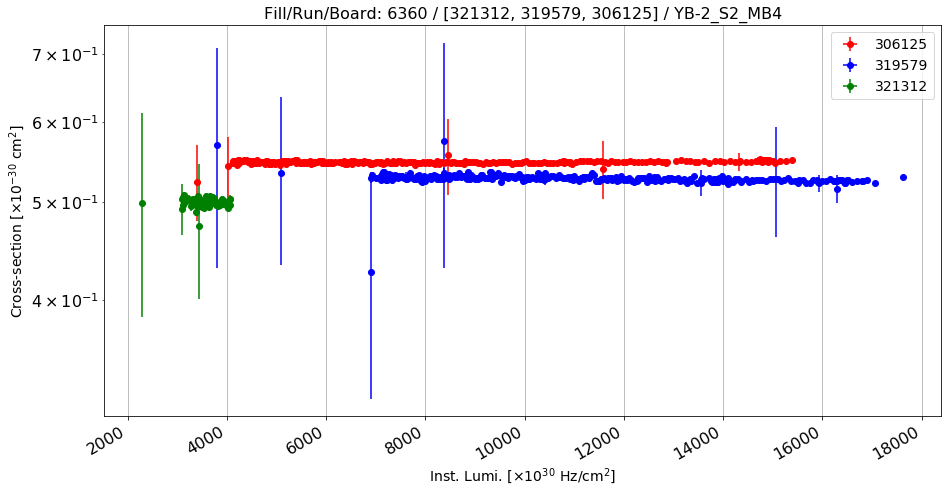

Anomalous CS: 0.547290440268 , Normal CS: 0.52613827291 , Ratio: -0.0402026775975


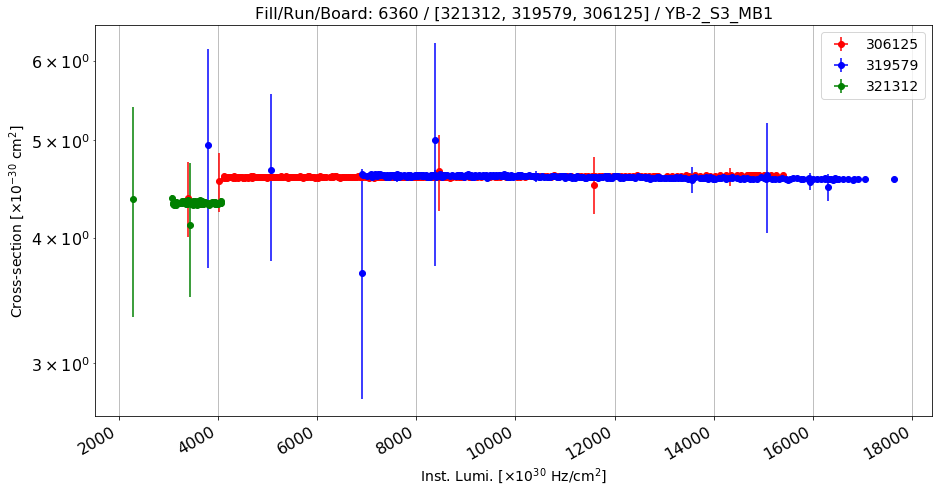

Anomalous CS: 4.60367821508 , Normal CS: 4.59027648701 , Ratio: -0.00291959059558


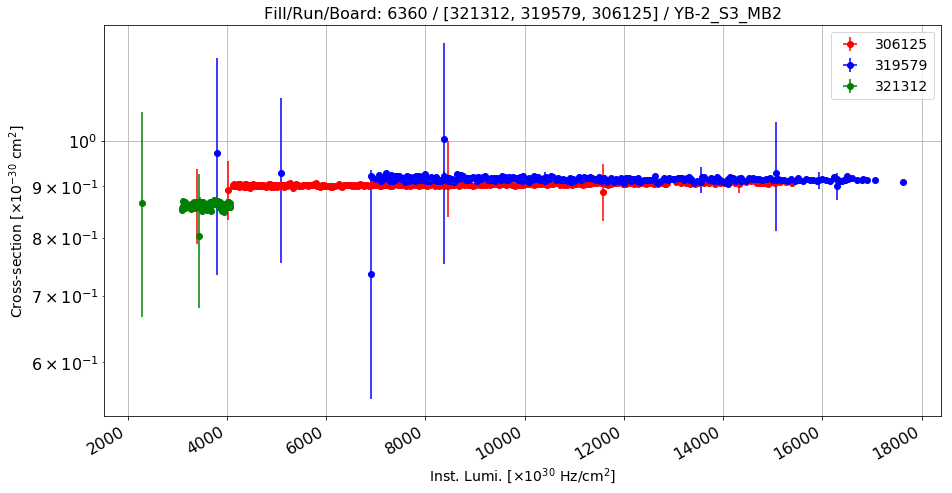

Anomalous CS: 0.904406392301 , Normal CS: 0.914471853513 , Ratio: 0.0110068573164


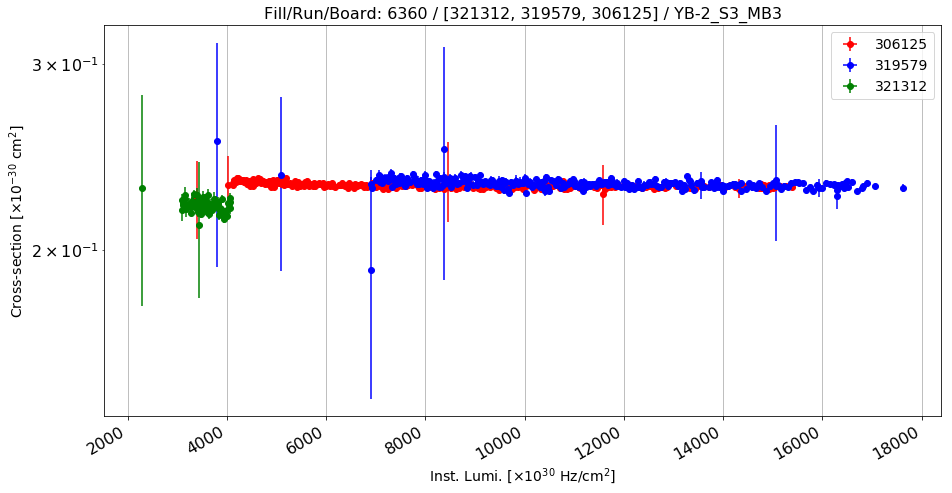

Anomalous CS: 0.229879839999 , Normal CS: 0.23061326153 , Ratio: 0.00318030943215


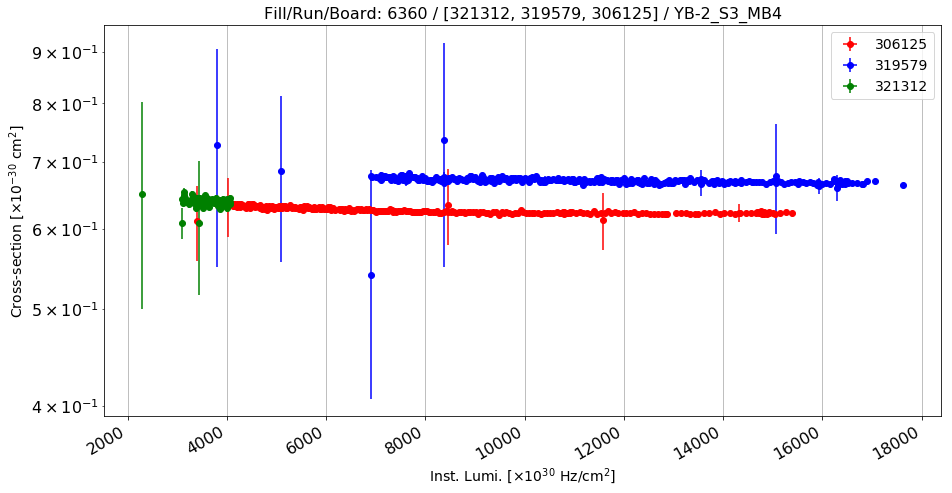

Anomalous CS: 0.623741031998 , Normal CS: 0.669135038351 , Ratio: 0.0678398286603


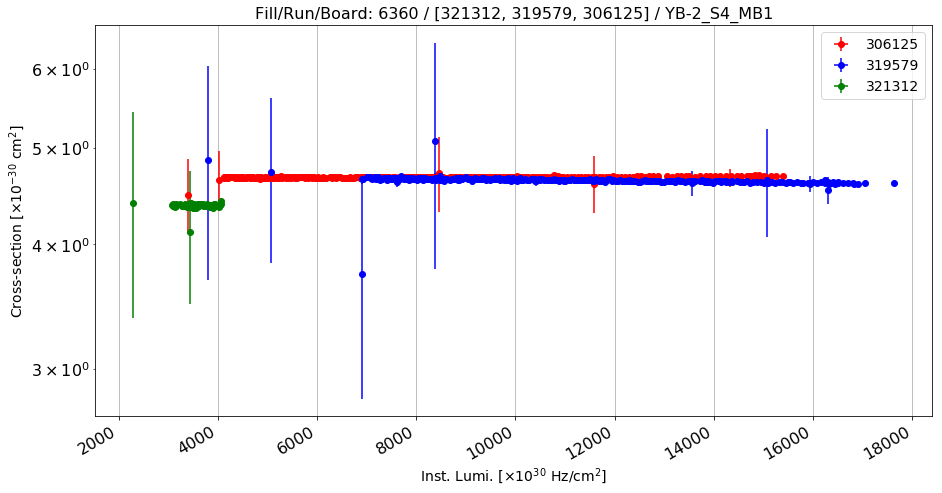

Anomalous CS: 4.67566411273 , Normal CS: 4.62997493375 , Ratio: -0.00986812663876


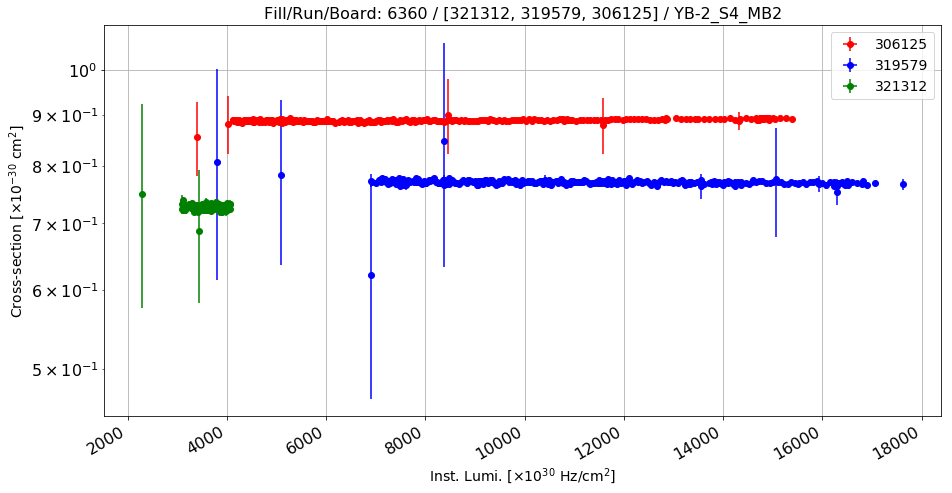

Anomalous CS: 0.889533033675 , Normal CS: 0.769671161018 , Ratio: -0.155731276847


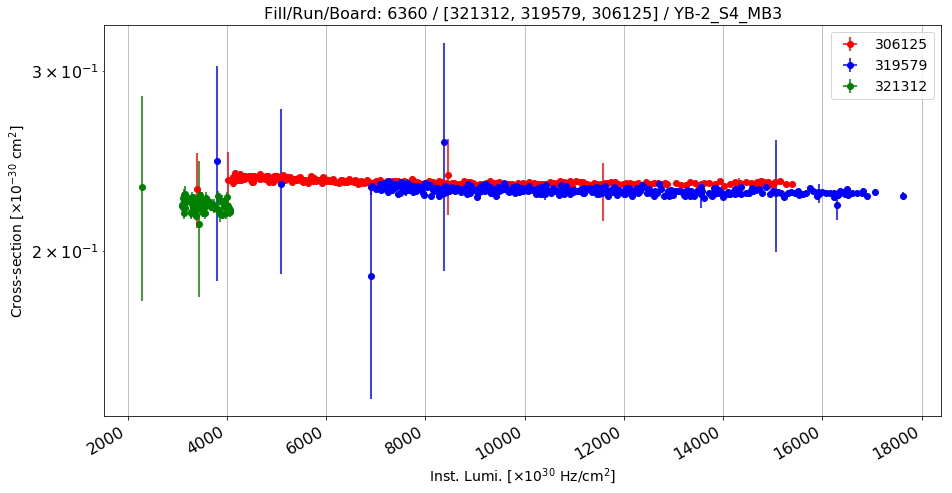

Anomalous CS: 0.233172985407 , Normal CS: 0.228514755281 , Ratio: -0.0203848111294


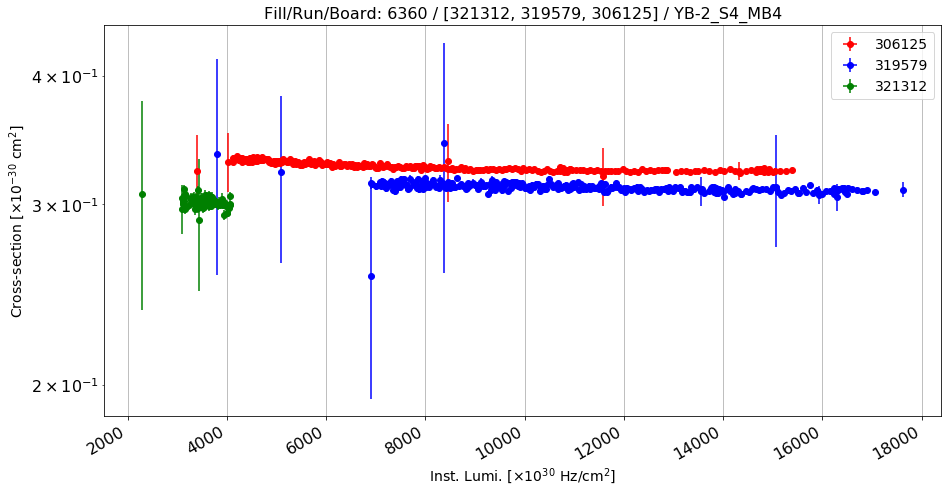

Anomalous CS: 0.325054190532 , Normal CS: 0.310531446336 , Ratio: -0.0467673865794


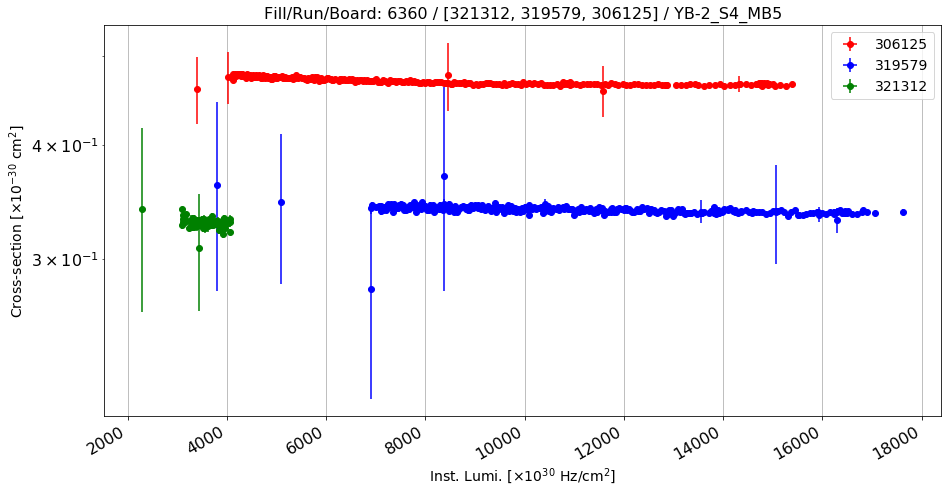

Anomalous CS: 0.46754293734 , Normal CS: 0.33847733343 , Ratio: -0.381312398683


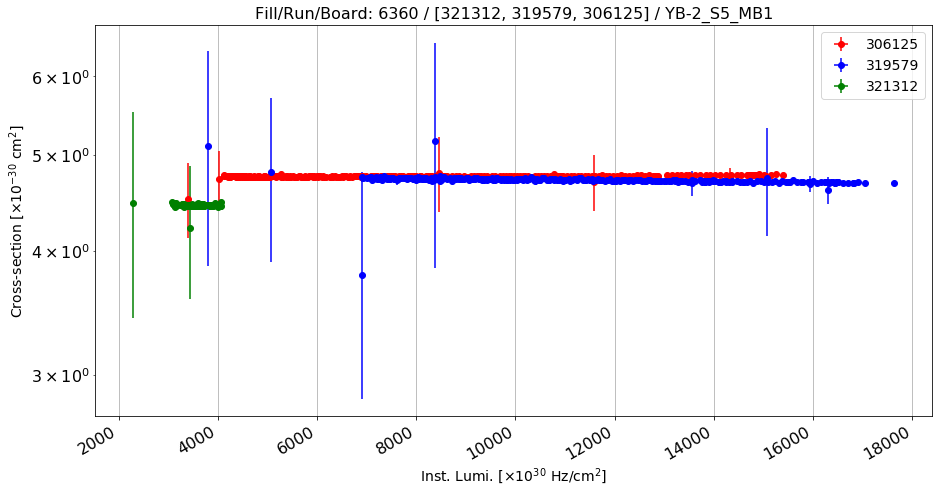

Anomalous CS: 4.76299118019 , Normal CS: 4.7100224264 , Ratio: -0.0112459663645


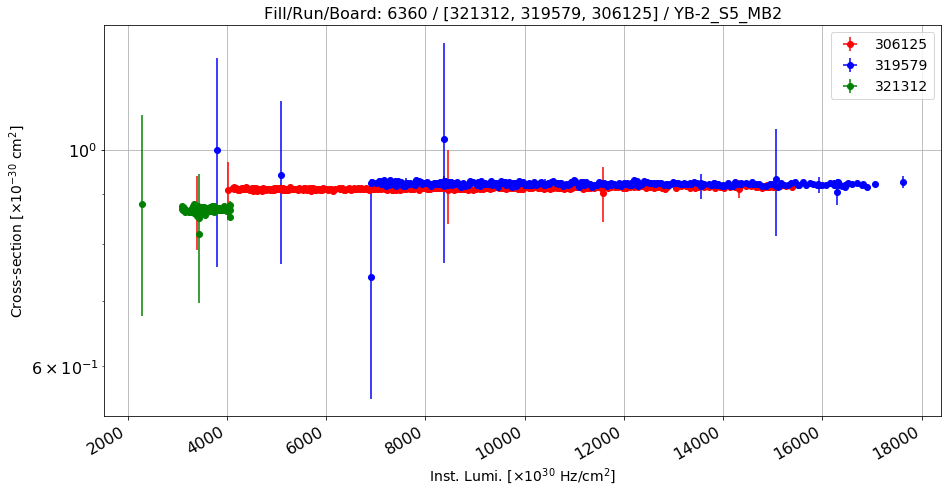

Anomalous CS: 0.913571751314 , Normal CS: 0.922391885143 , Ratio: 0.00956224135452


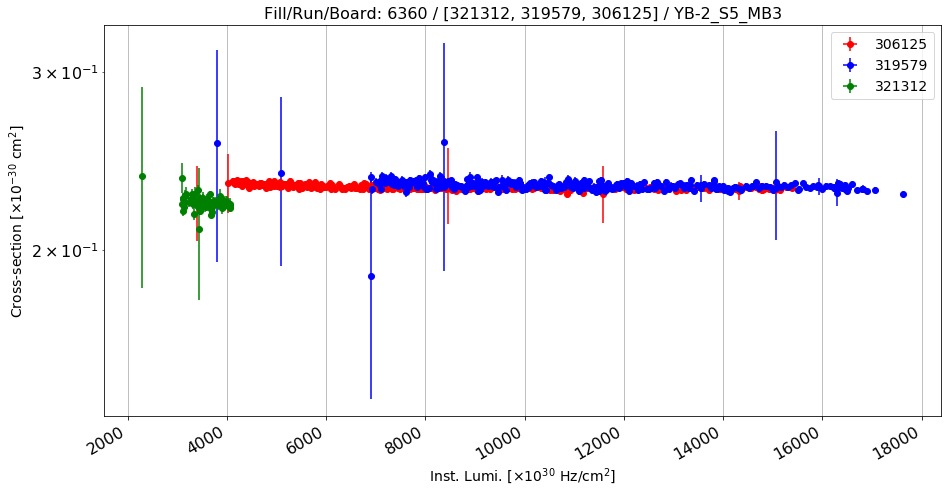

Anomalous CS: 0.230239933228 , Normal CS: 0.231212330651 , Ratio: 0.00420564690599


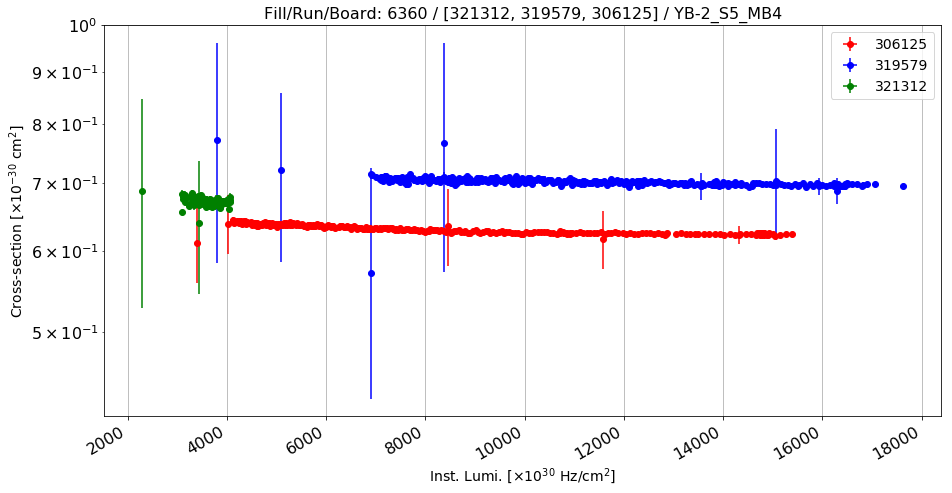

Anomalous CS: 0.627044150887 , Normal CS: 0.699581319608 , Ratio: 0.103686543205


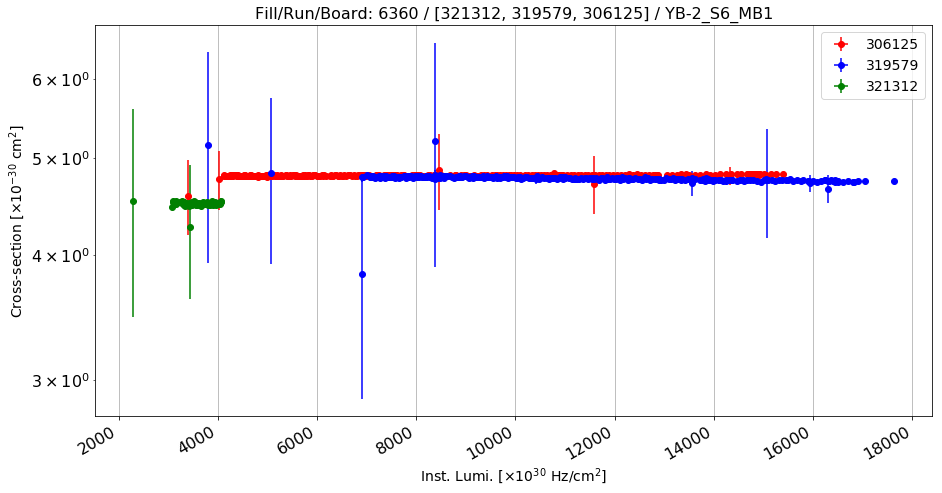

Anomalous CS: 4.80689256765 , Normal CS: 4.7600729582 , Ratio: -0.00983590164888


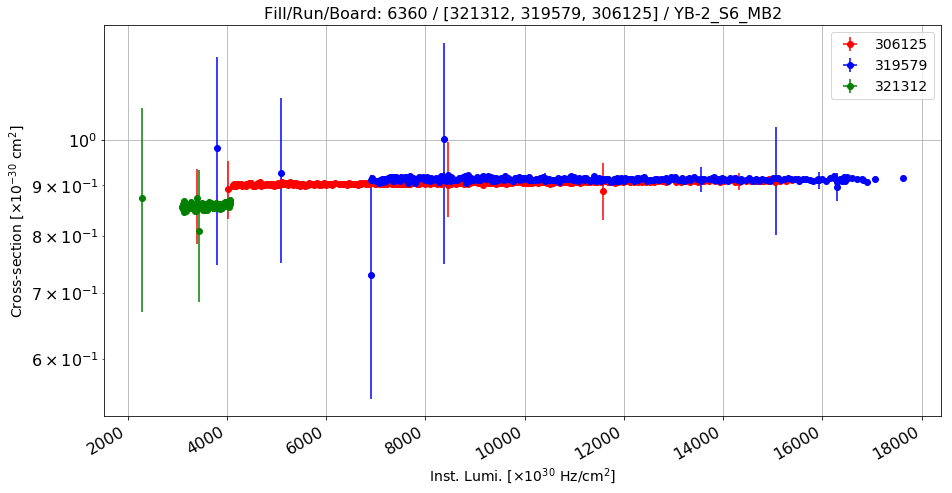

Anomalous CS: 0.905745923434 , Normal CS: 0.912733683374 , Ratio: 0.00765585851345


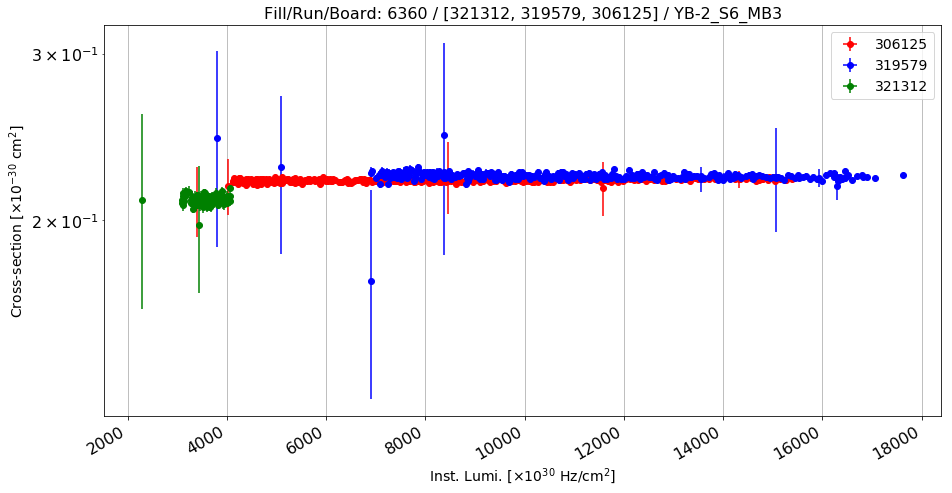

Anomalous CS: 0.220512352445 , Normal CS: 0.222534892759 , Ratio: 0.00908864353404


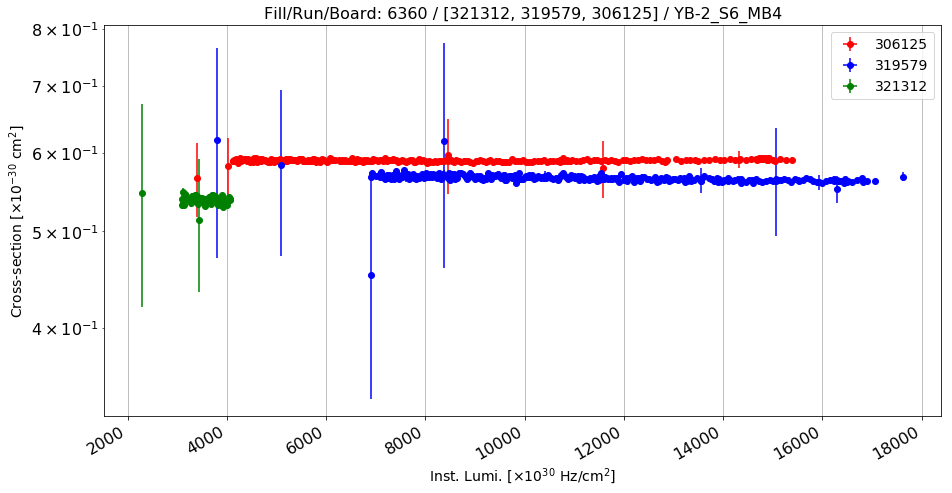

Anomalous CS: 0.589434169642 , Normal CS: 0.564417559114 , Ratio: -0.0443228778488


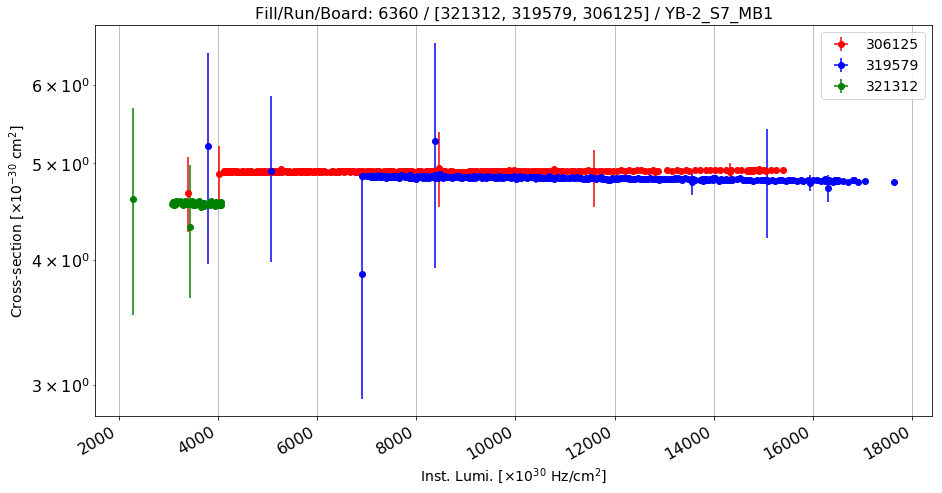

Anomalous CS: 4.91392360933 , Normal CS: 4.82278962062 , Ratio: -0.0188965299929


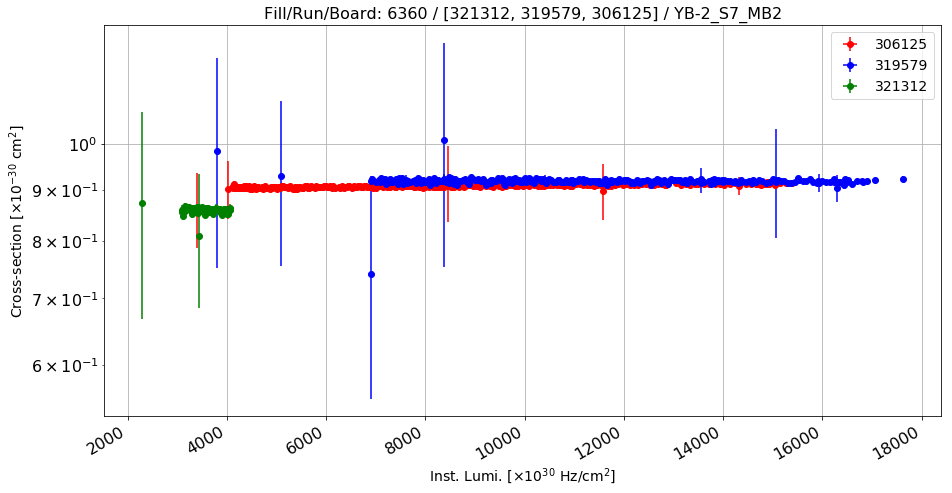

Anomalous CS: 0.9090082869 , Normal CS: 0.91797868689 , Ratio: 0.00977190442214


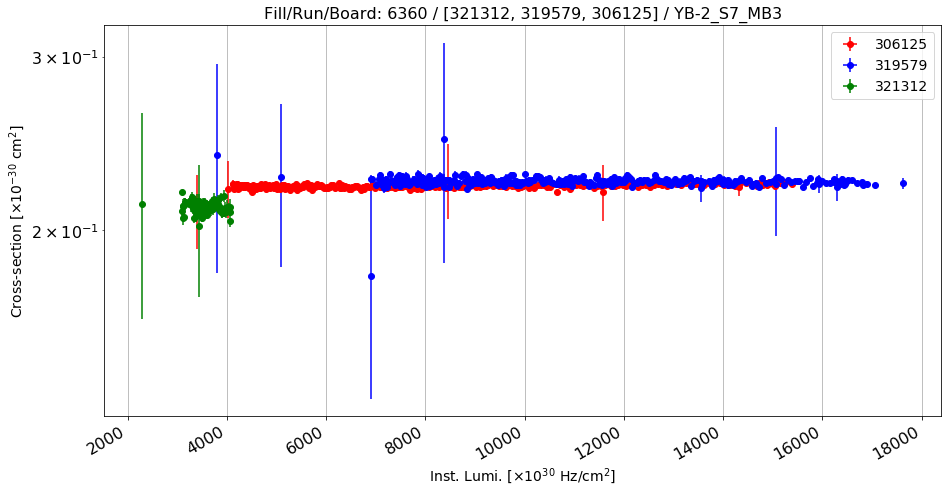

Anomalous CS: 0.221943303401 , Normal CS: 0.224222164344 , Ratio: 0.0101634062369


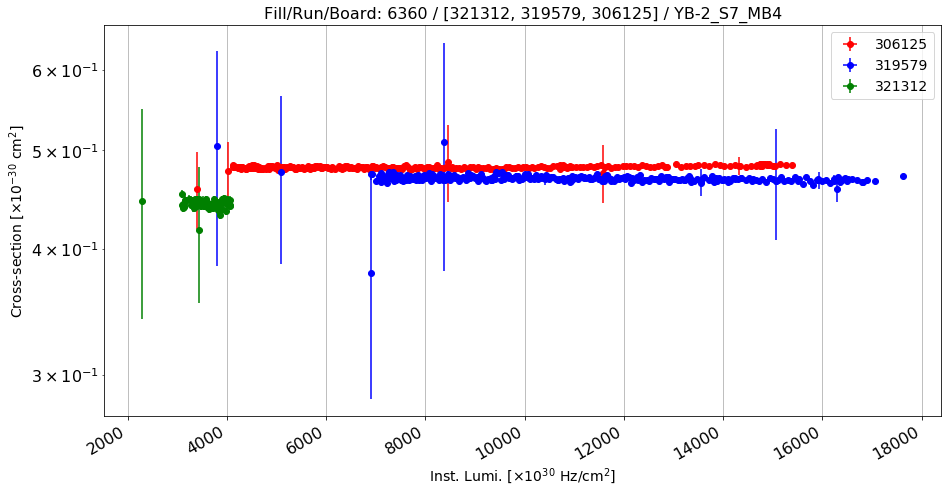

Anomalous CS: 0.481588998927 , Normal CS: 0.468421344167 , Ratio: -0.0281107061484


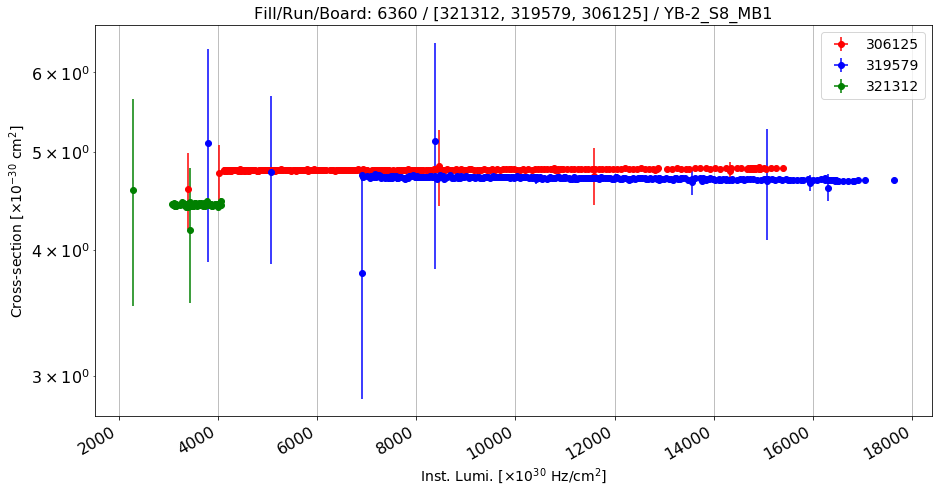

Anomalous CS: 4.80820818064 , Normal CS: 4.70494039926 , Ratio: -0.0219487969281


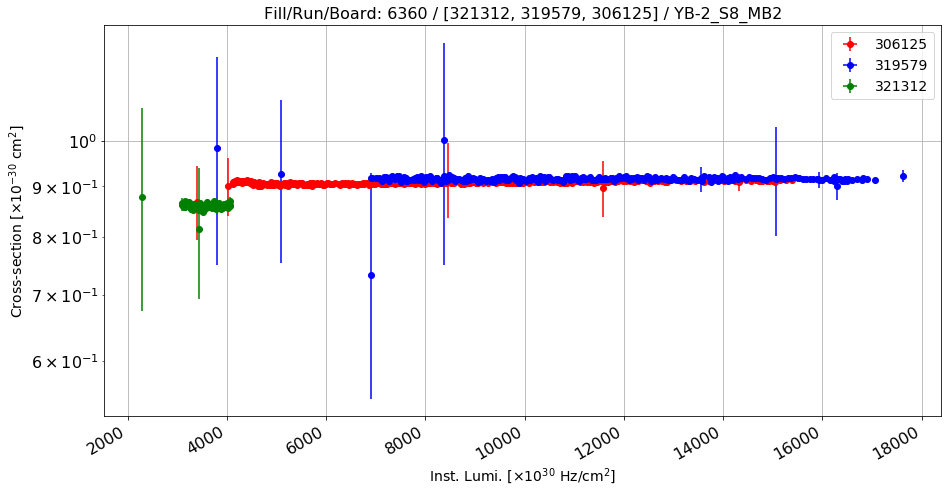

Anomalous CS: 0.909005626841 , Normal CS: 0.916383085139 , Ratio: 0.0080506268803


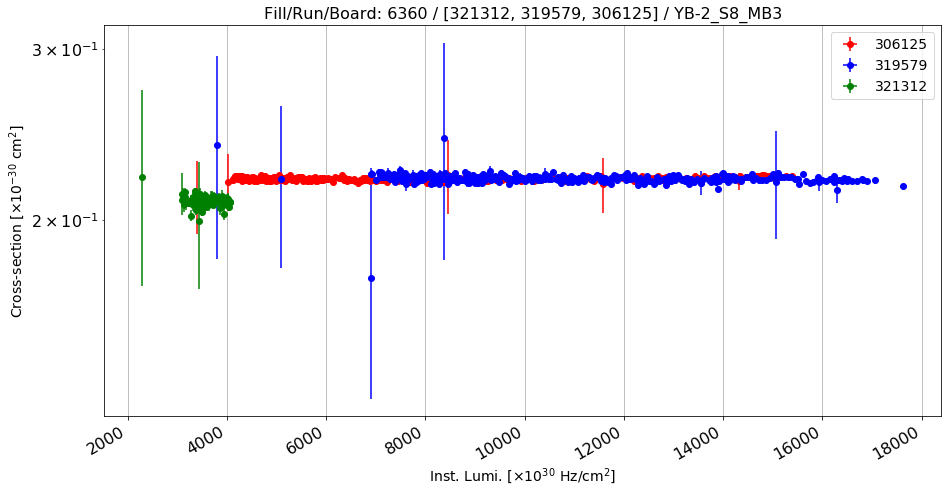

Anomalous CS: 0.220579630246 , Normal CS: 0.220248225106 , Ratio: -0.00150468926557


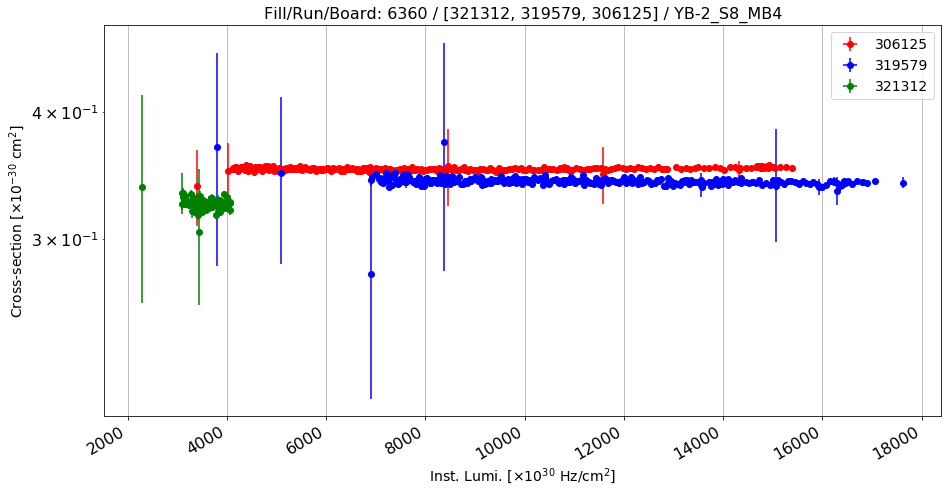

Anomalous CS: 0.351791207142 , Normal CS: 0.341503589293 , Ratio: -0.0301244794228


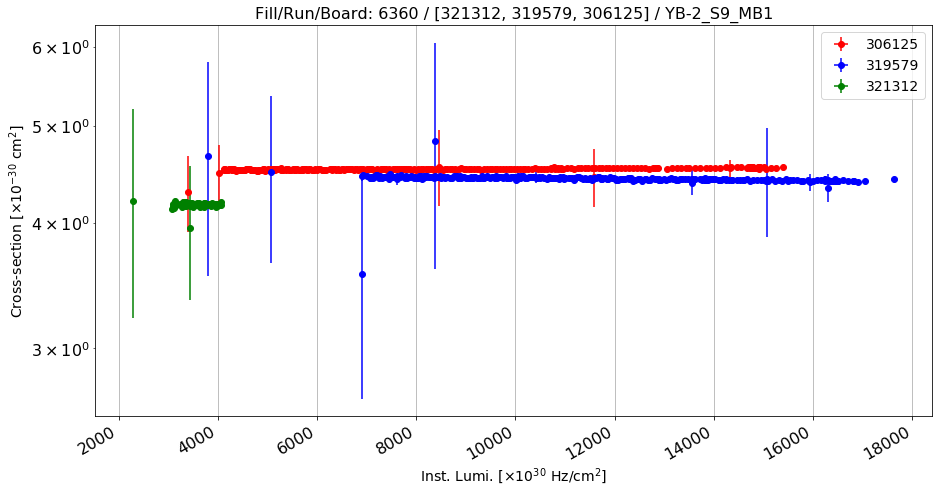

Anomalous CS: 4.53371417396 , Normal CS: 4.42645023294 , Ratio: -0.0242324967827


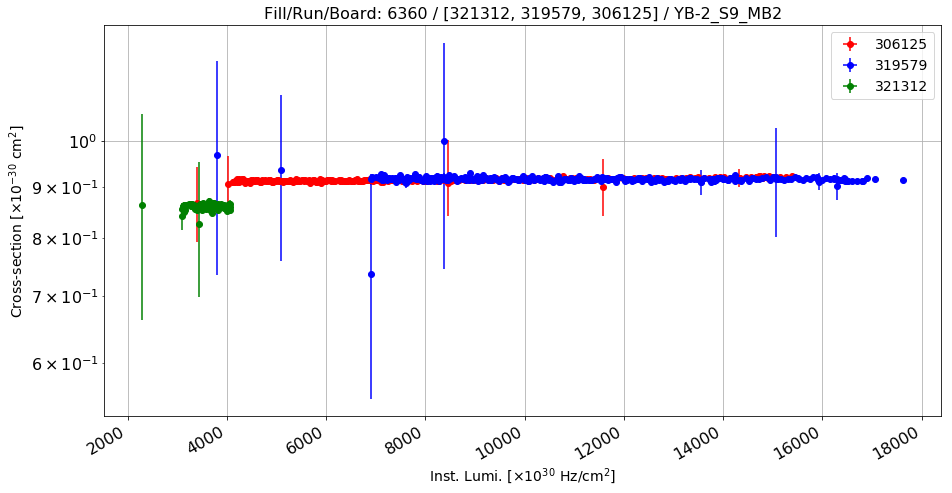

Anomalous CS: 0.916204950646 , Normal CS: 0.915623528403 , Ratio: -0.000635001422855


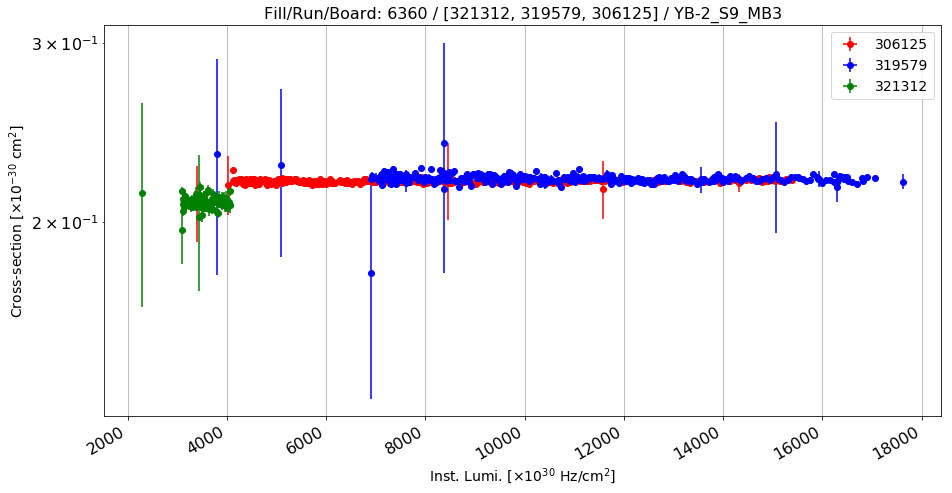

Anomalous CS: 0.219514028344 , Normal CS: 0.220525735826 , Ratio: 0.00458770709242


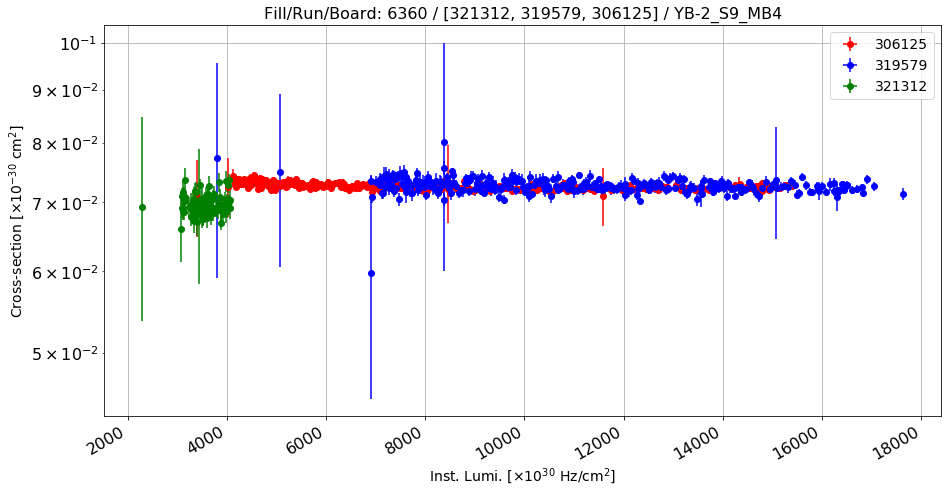

Anomalous CS: 0.0724206601701 , Normal CS: 0.0725177772543 , Ratio: 0.0013392176085


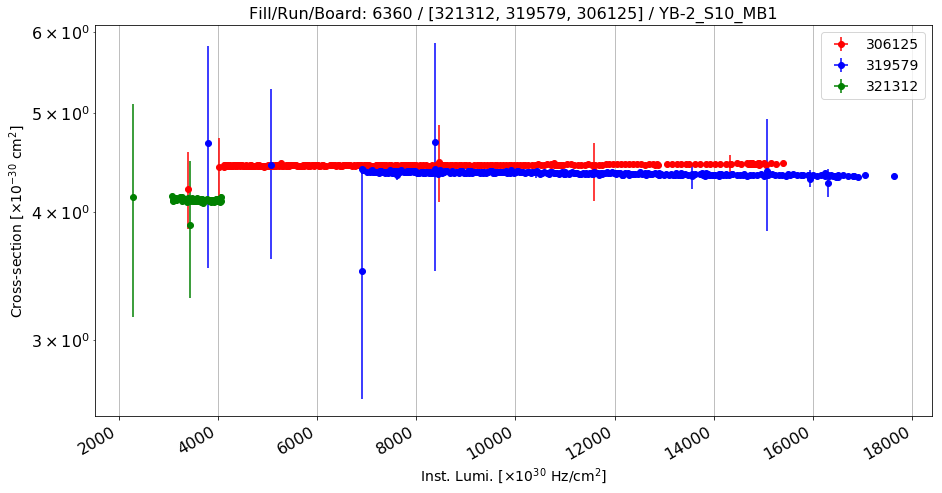

Anomalous CS: 4.45125197358 , Normal CS: 4.35888151994 , Ratio: -0.0211913201155


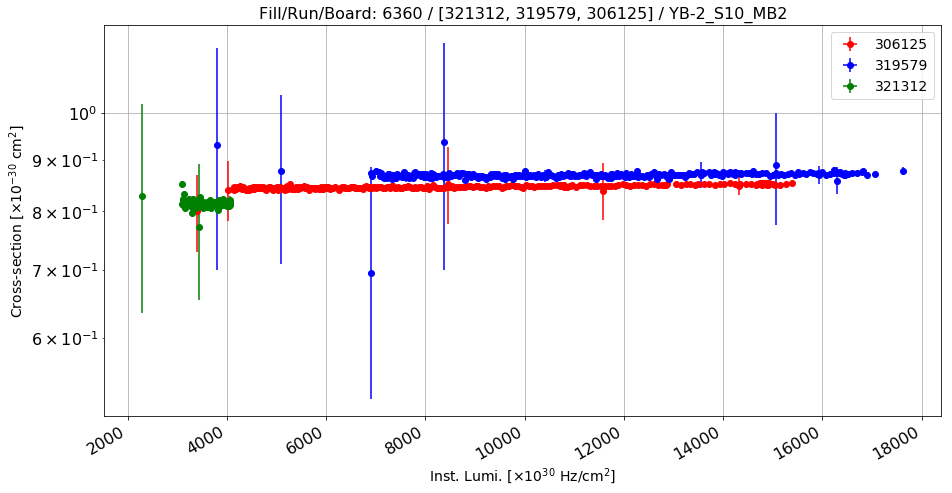

Anomalous CS: 0.847281921659 , Normal CS: 0.869920623711 , Ratio: 0.0260238709545


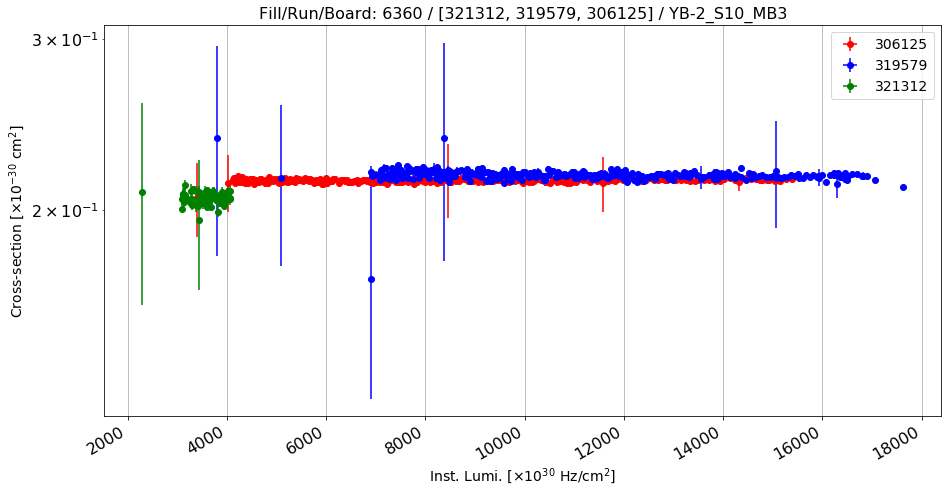

Anomalous CS: 0.21449293285 , Normal CS: 0.216990536817 , Ratio: 0.0115101976487


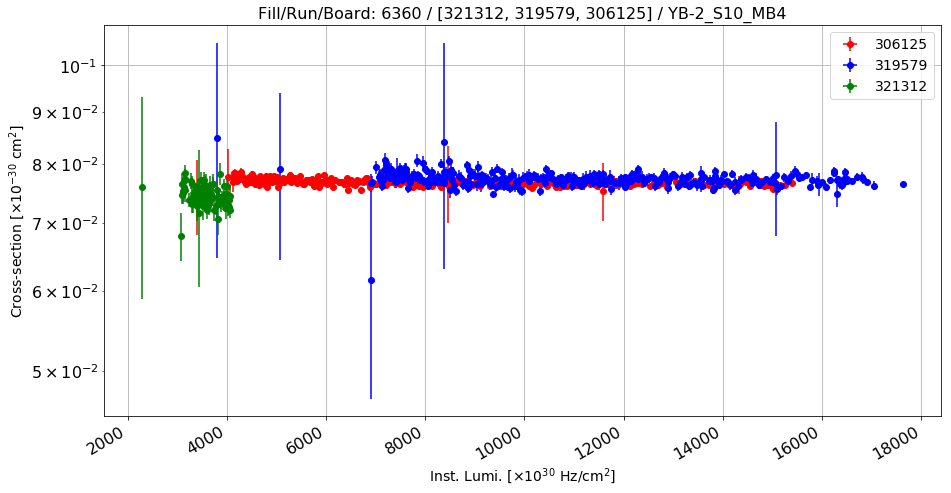

Anomalous CS: 0.0765232573559 , Normal CS: 0.0771074082101 , Ratio: 0.00757580714607


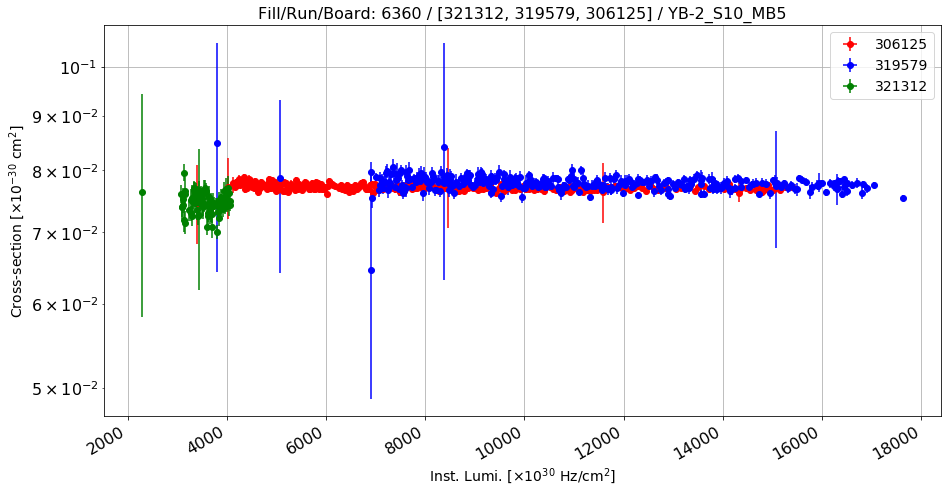

Anomalous CS: 0.0770422099025 , Normal CS: 0.0776126134677 , Ratio: 0.00734936680704


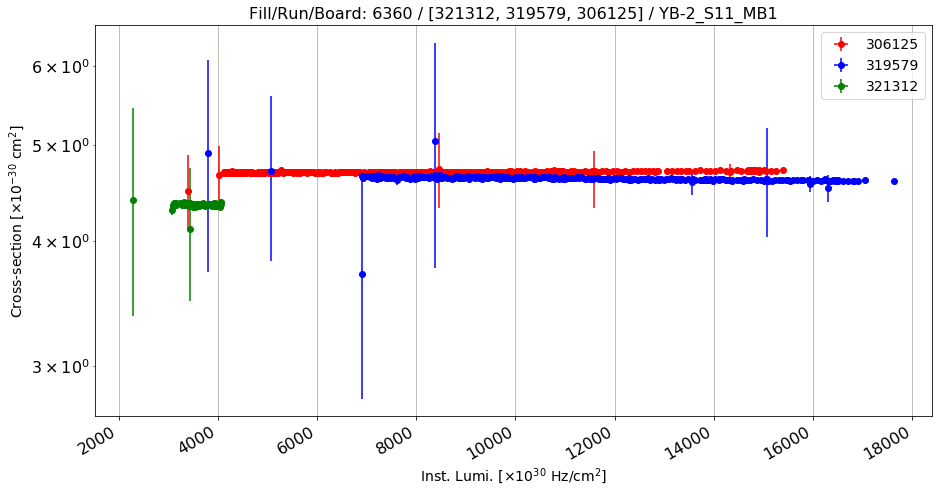

Anomalous CS: 4.69743405659 , Normal CS: 4.61553496525 , Ratio: -0.0177442250906


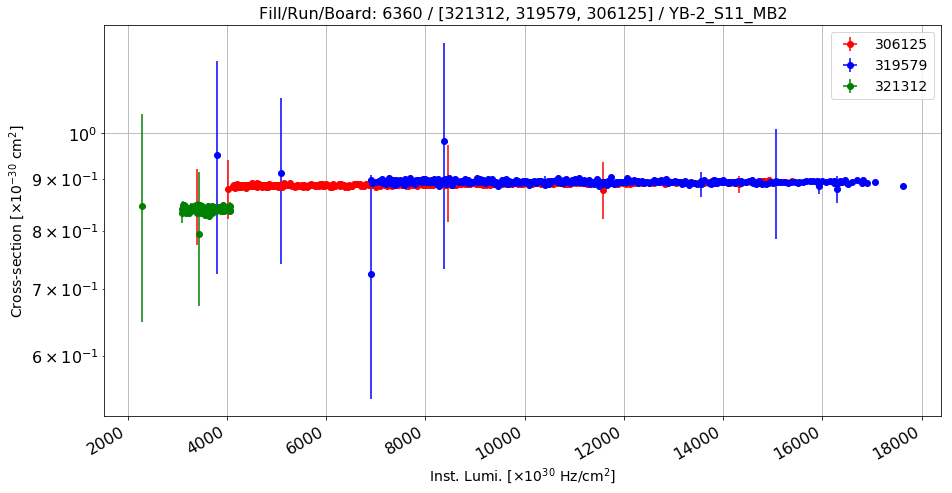

Anomalous CS: 0.890757083125 , Normal CS: 0.89440354982 , Ratio: 0.00407698146561


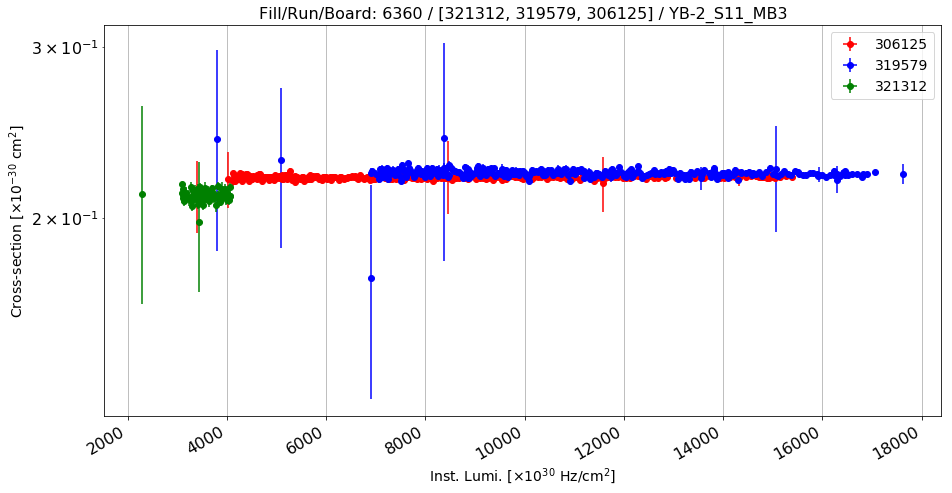

Anomalous CS: 0.220071739728 , Normal CS: 0.22216956501 , Ratio: 0.00944245122821


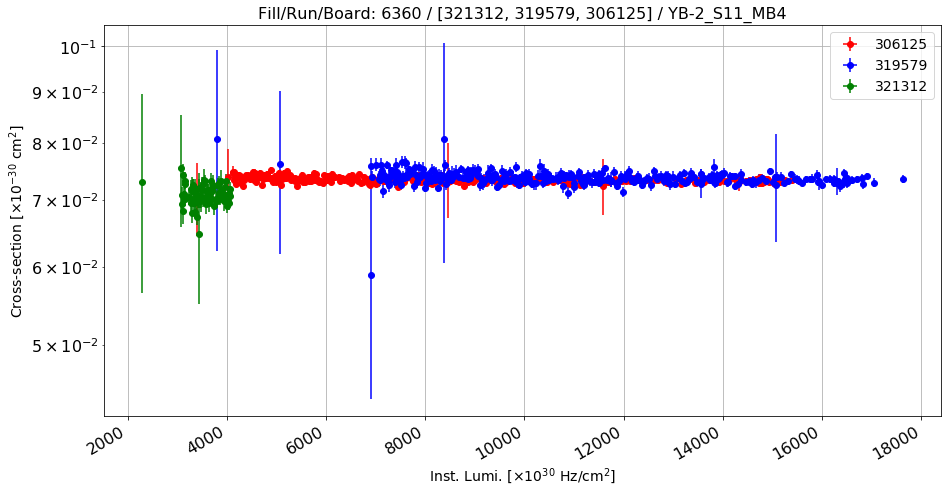

Anomalous CS: 0.0733119062098 , Normal CS: 0.0735178952428 , Ratio: 0.00280188969444


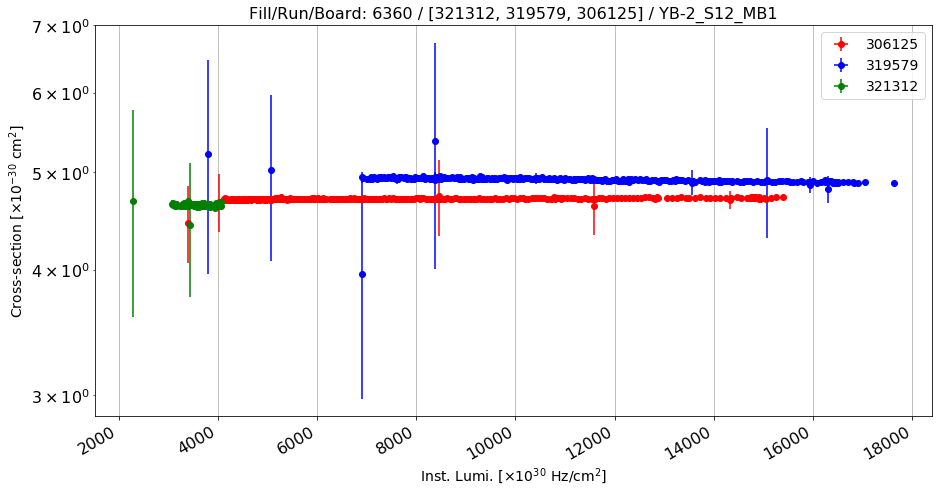

Anomalous CS: 4.70967829354 , Normal CS: 4.908006094 , Ratio: 0.0404090371252


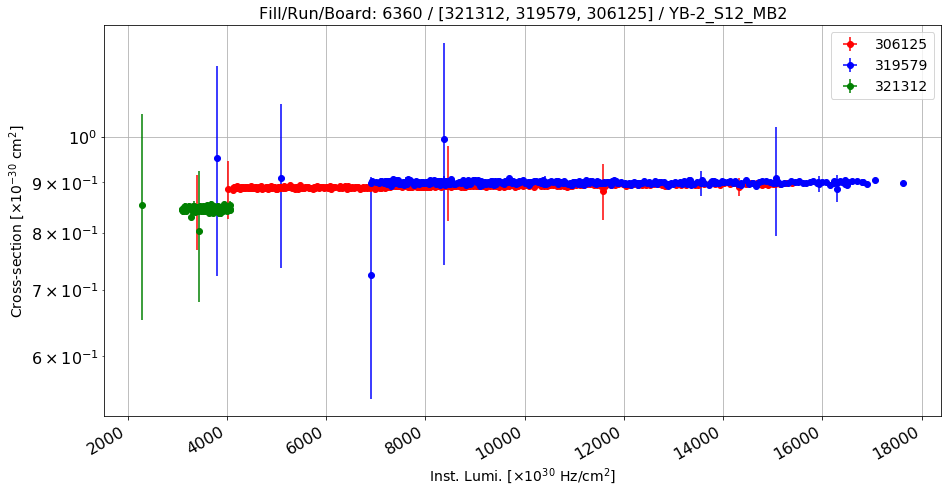

Anomalous CS: 0.893095203788 , Normal CS: 0.899669318394 , Ratio: 0.00730725664579


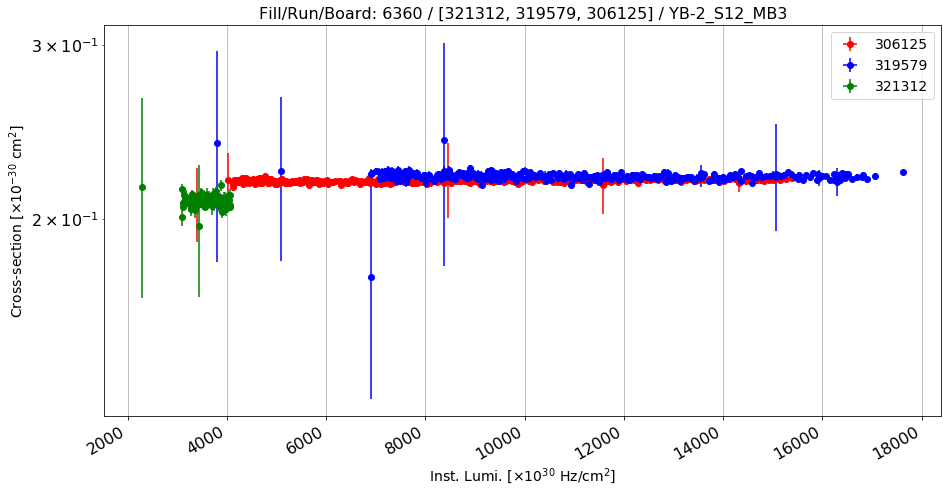

Anomalous CS: 0.218527278303 , Normal CS: 0.220556003804 , Ratio: 0.00919823294765


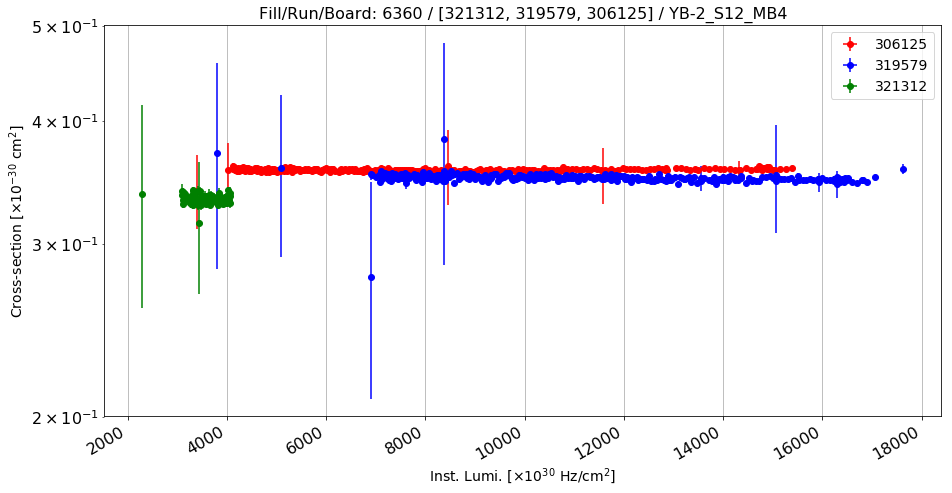

Anomalous CS: 0.356974044916 , Normal CS: 0.349769851013 , Ratio: -0.0205969550631


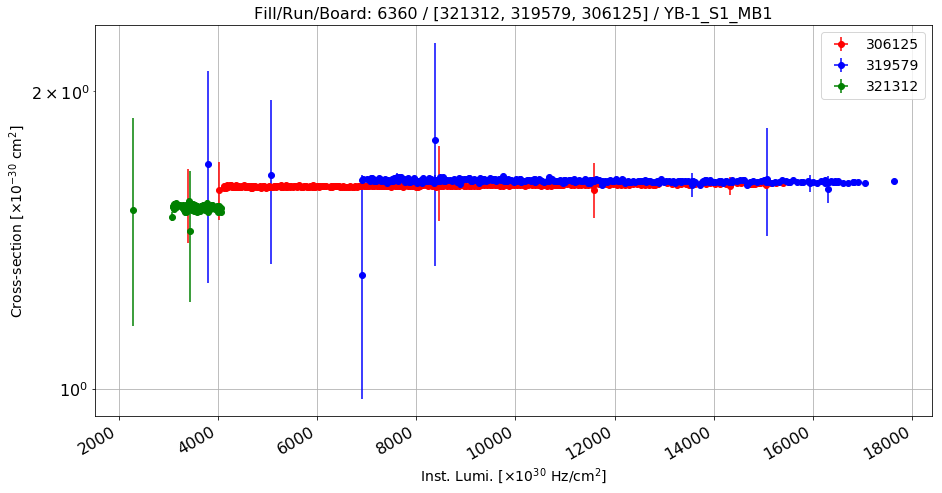

Anomalous CS: 1.60740519823 , Normal CS: 1.62211835761 , Ratio: 0.00907033652208


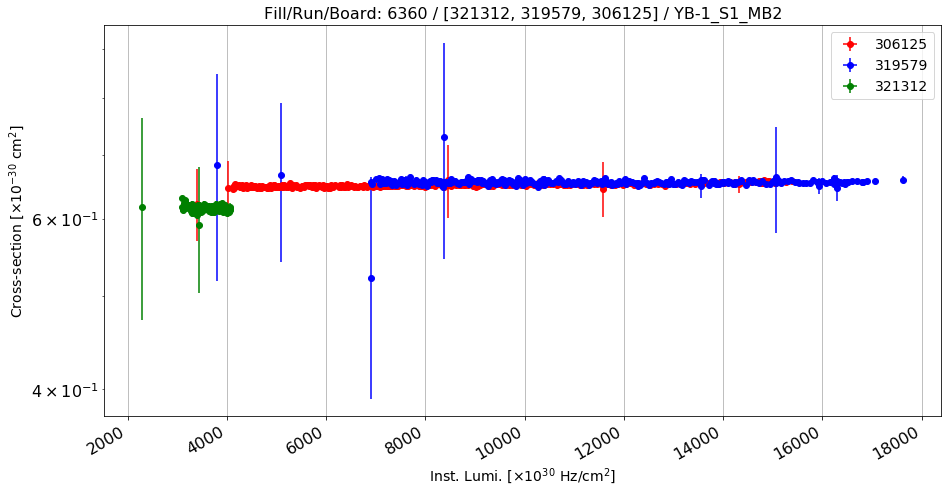

Anomalous CS: 0.651820769414 , Normal CS: 0.655175978187 , Ratio: 0.0051210802659


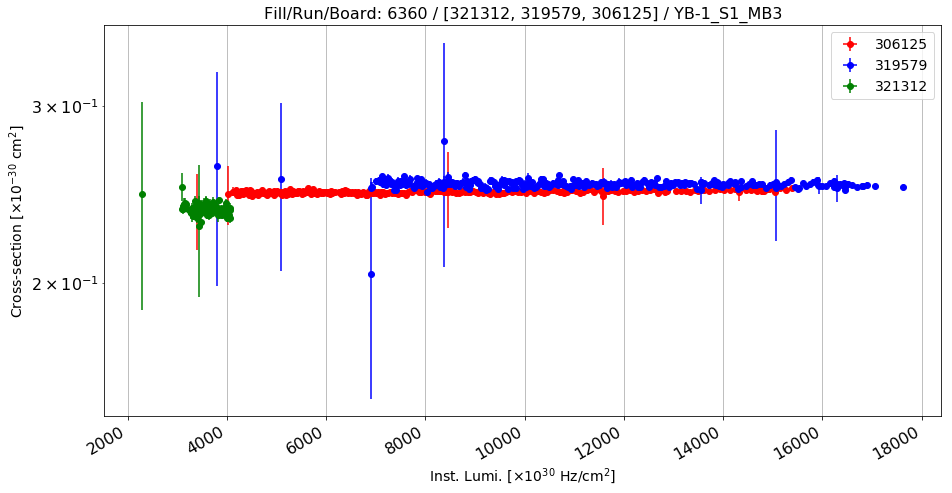

Anomalous CS: 0.24661438737 , Normal CS: 0.250616483128 , Ratio: 0.0159690045416


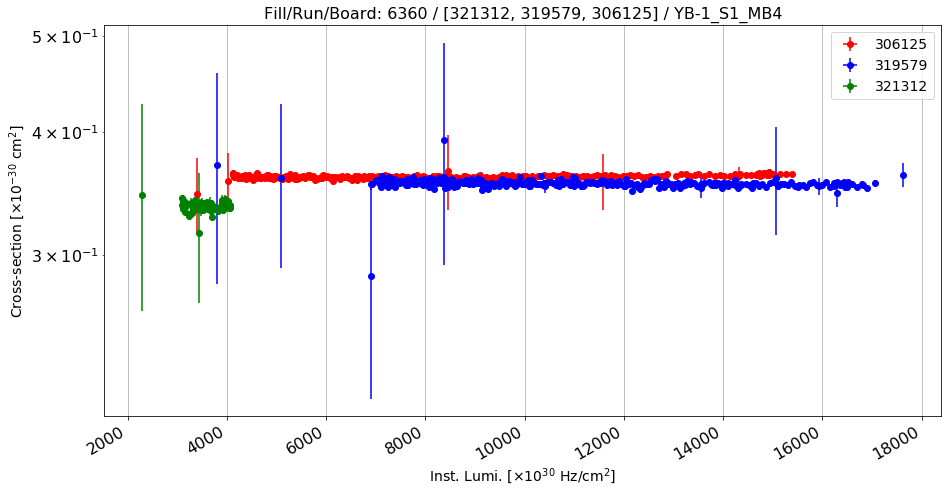

Anomalous CS: 0.360593952572 , Normal CS: 0.354264655613 , Ratio: -0.017866013045


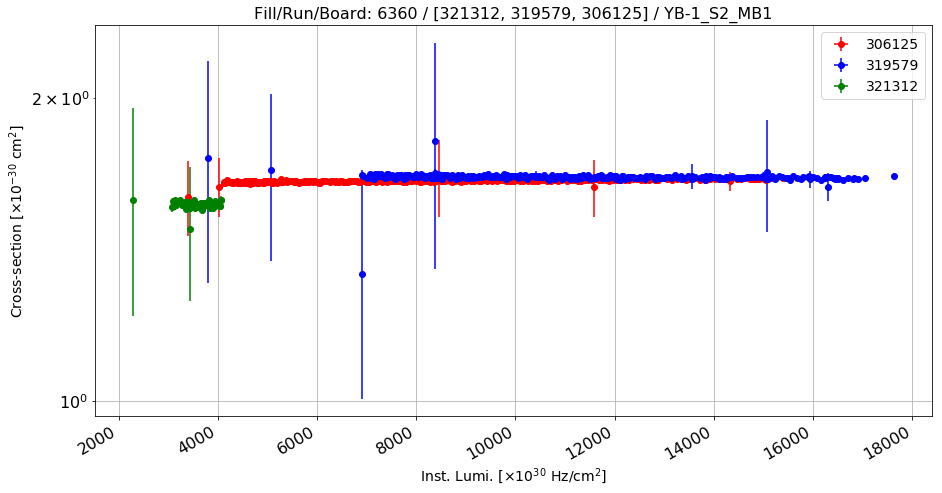

Anomalous CS: 1.65570242565 , Normal CS: 1.66711522494 , Ratio: 0.00684583712373


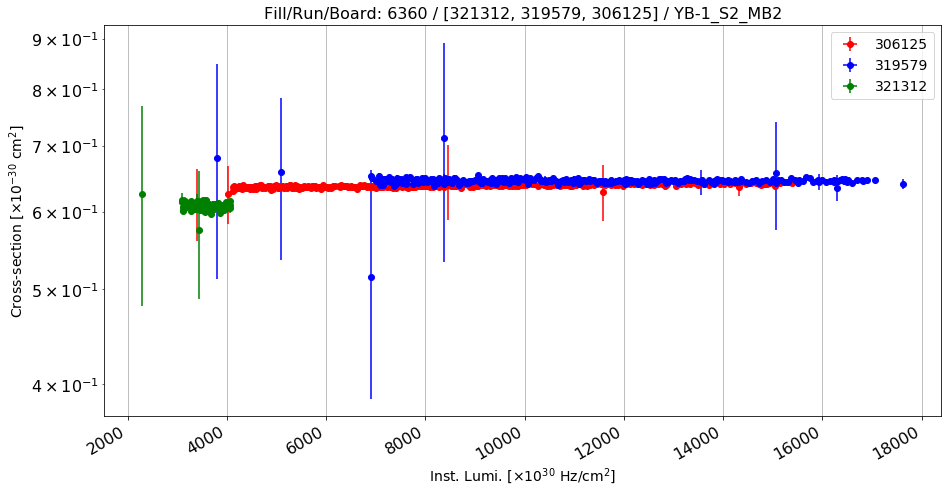

Anomalous CS: 0.638481257089 , Normal CS: 0.645202117618 , Ratio: 0.0104166746293


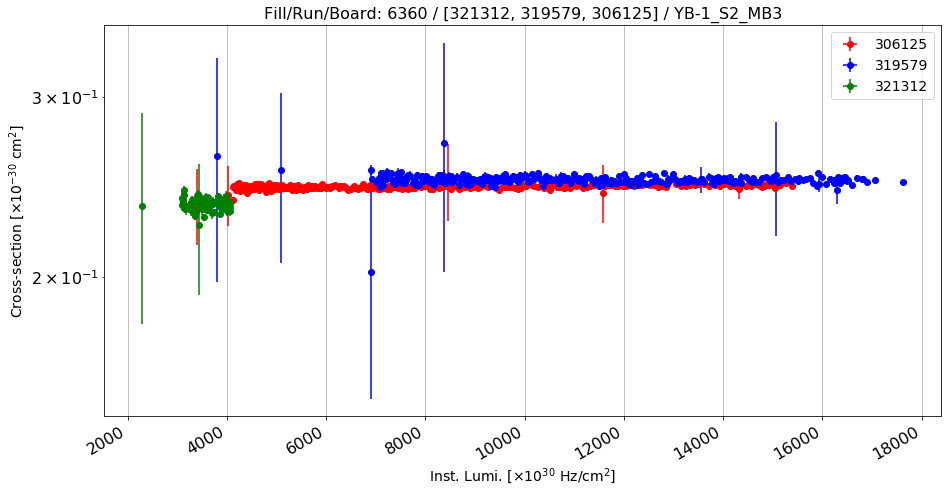

Anomalous CS: 0.245117685514 , Normal CS: 0.248670805589 , Ratio: 0.014288448807


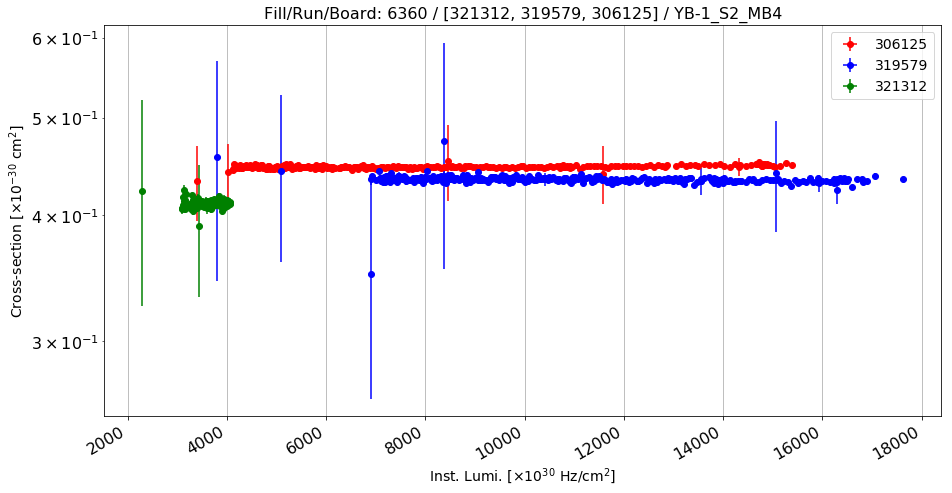

Anomalous CS: 0.447179223523 , Normal CS: 0.433631360494 , Ratio: -0.0312428118986


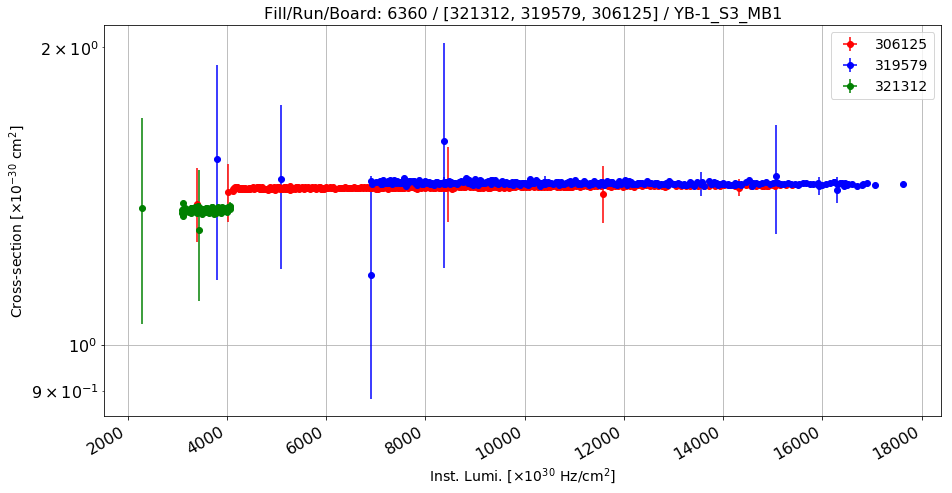

Anomalous CS: 1.4458109403 , Normal CS: 1.45739326989 , Ratio: 0.00794729180239


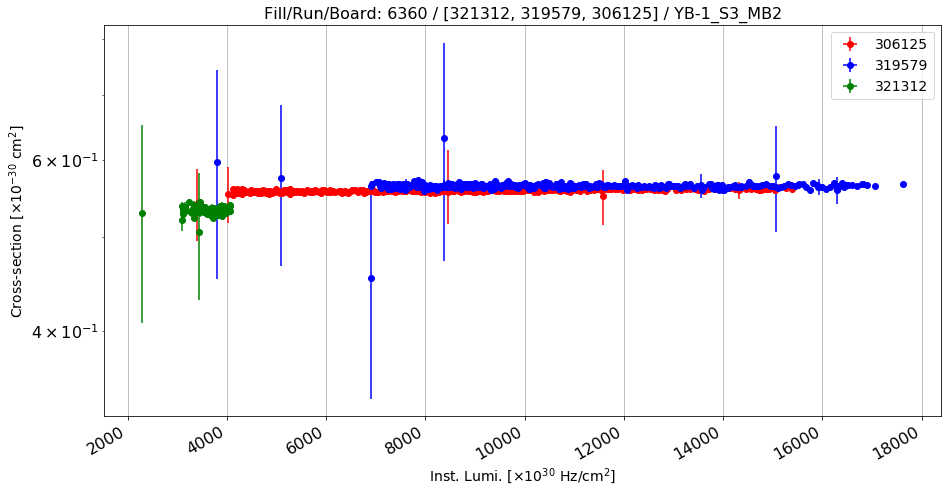

Anomalous CS: 0.558669474391 , Normal CS: 0.564511670225 , Ratio: 0.0103491143617


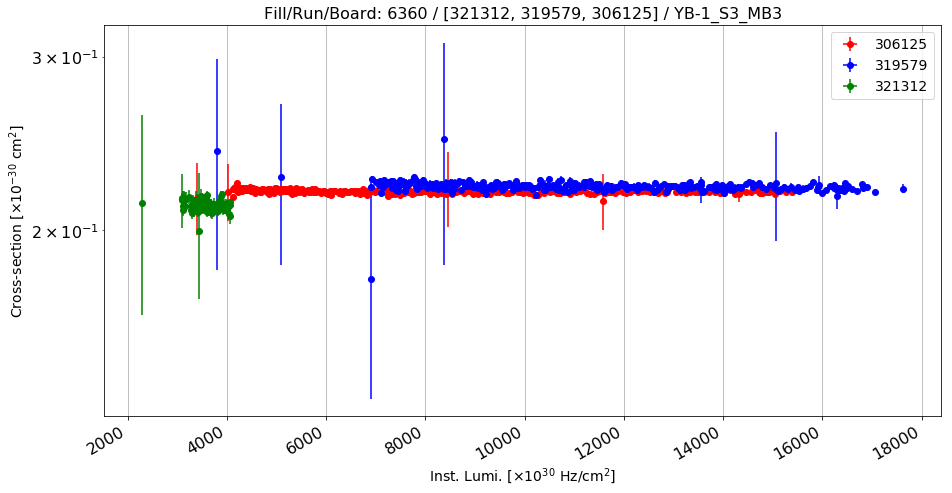

Anomalous CS: 0.218804335021 , Normal CS: 0.22139362416 , Ratio: 0.0116954096979


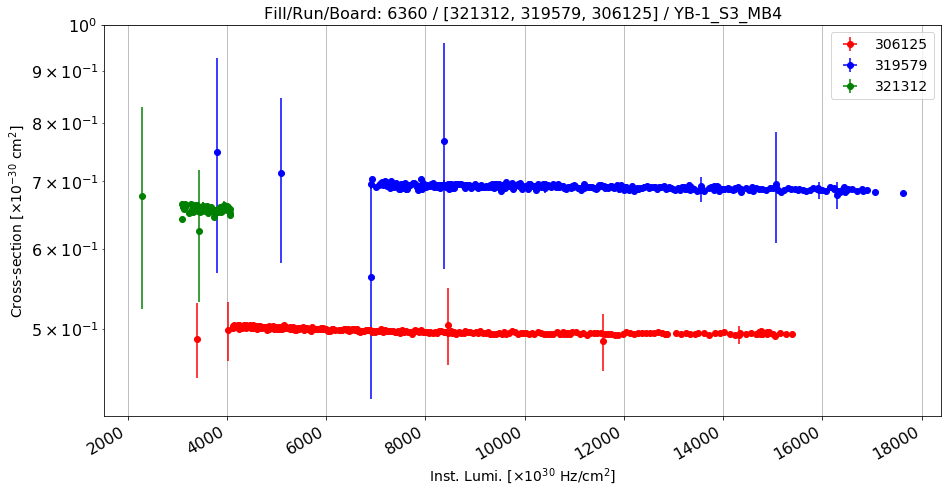

Anomalous CS: 0.496024263997 , Normal CS: 0.689348488881 , Ratio: 0.280444837411


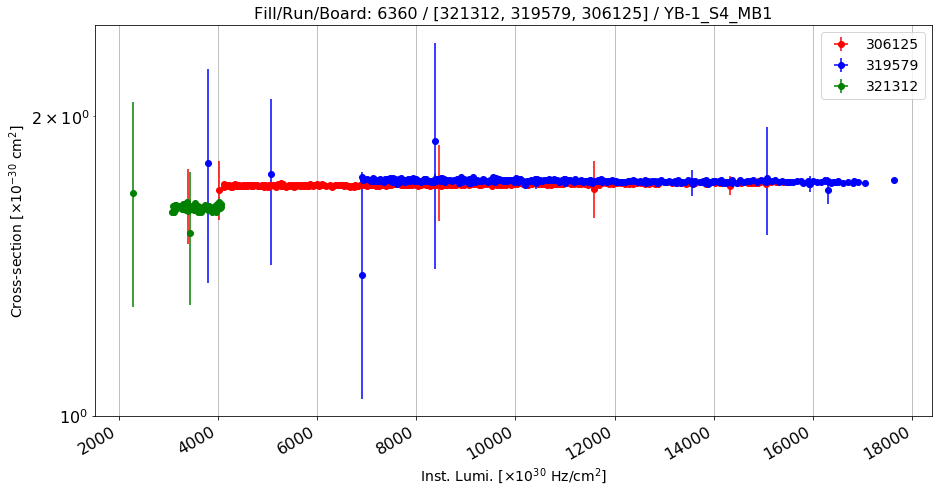

Anomalous CS: 1.70960361462 , Normal CS: 1.72094985158 , Ratio: 0.00659300847901


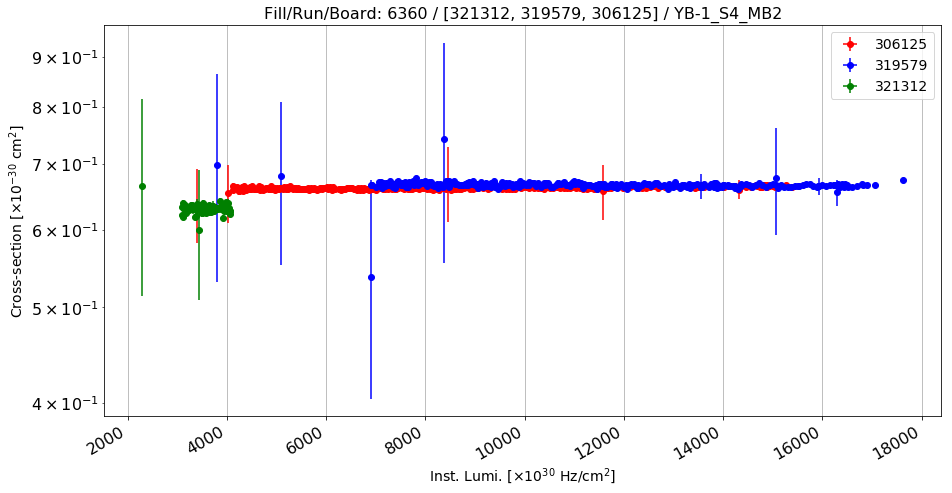

Anomalous CS: 0.662049041114 , Normal CS: 0.665873158044 , Ratio: 0.00574301108809


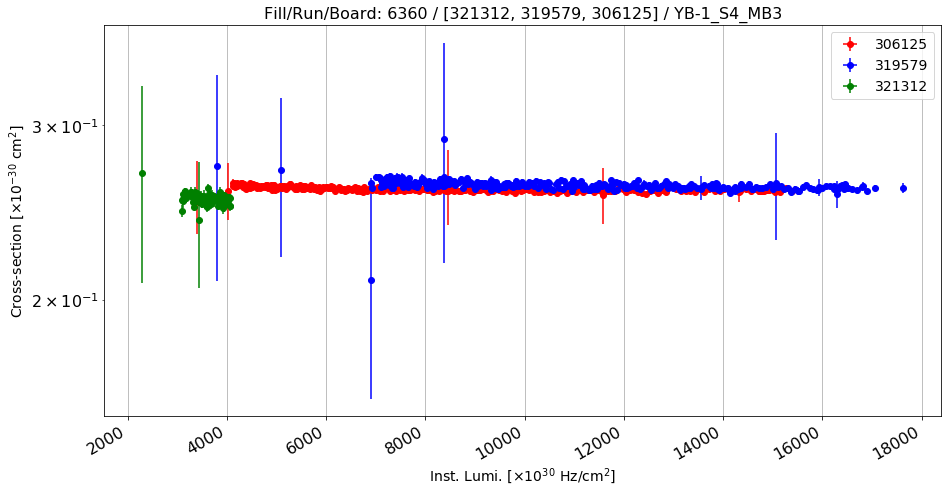

Anomalous CS: 0.258133814374 , Normal CS: 0.260222002432 , Ratio: 0.00802464064788


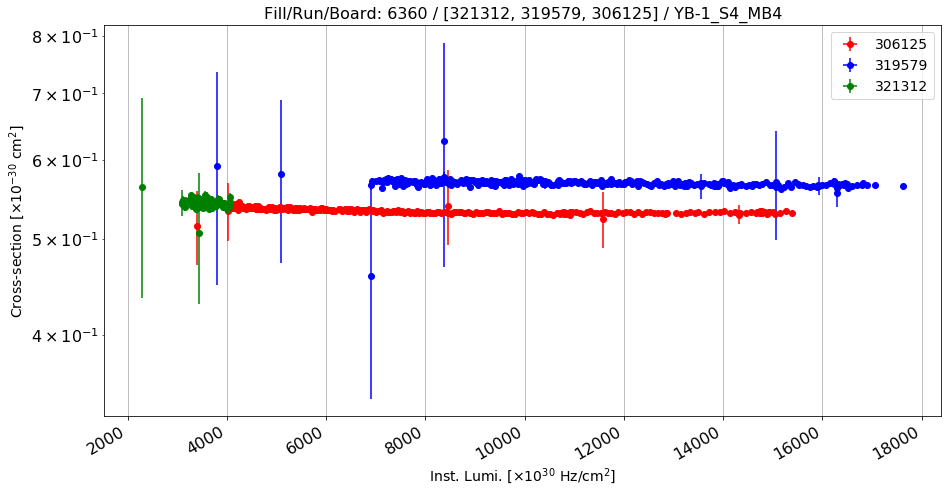

Anomalous CS: 0.531587659383 , Normal CS: 0.567955049941 , Ratio: 0.0640321633931


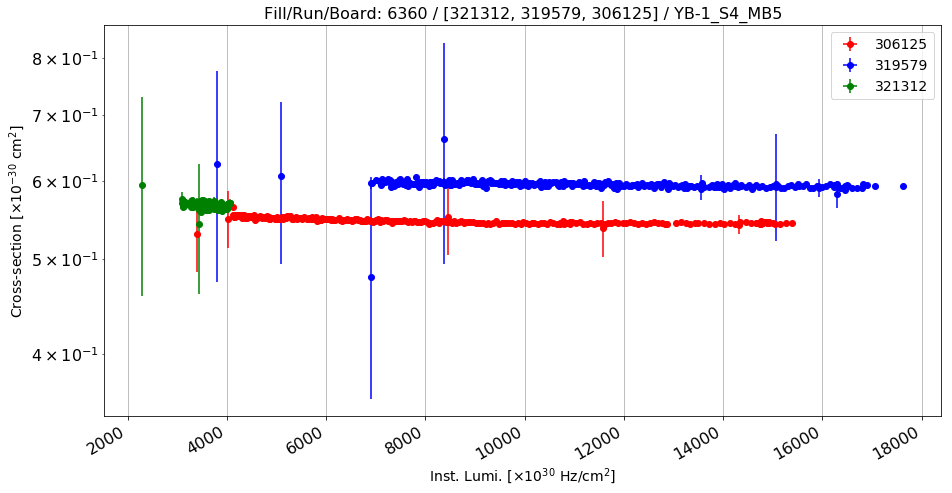

Anomalous CS: 0.544683262233 , Normal CS: 0.593736976577 , Ratio: 0.0826185942262


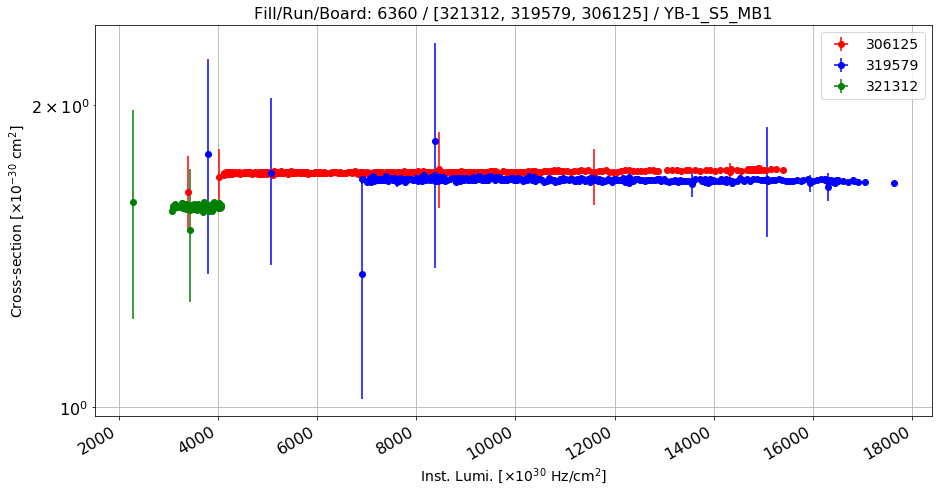

Anomalous CS: 1.71919869974 , Normal CS: 1.68463185719 , Ratio: -0.0205189296411


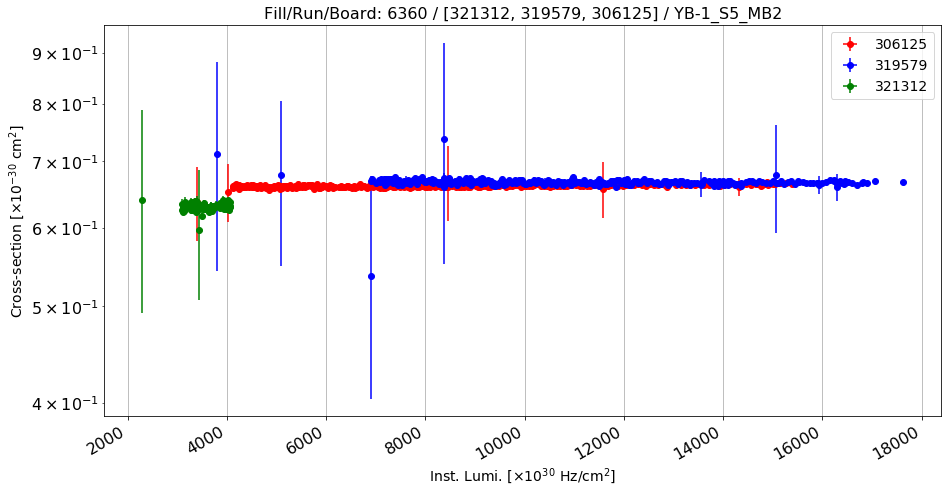

Anomalous CS: 0.661715740854 , Normal CS: 0.666463424746 , Ratio: 0.00712369758931


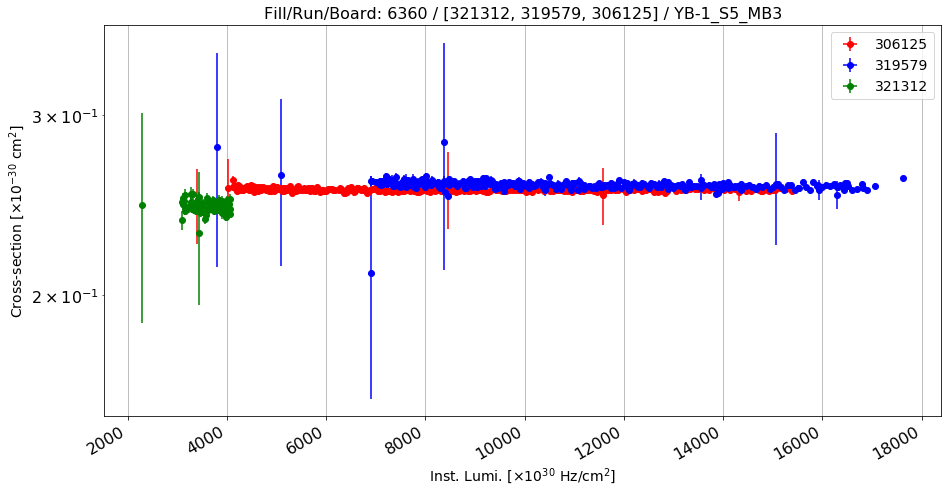

Anomalous CS: 0.253493749155 , Normal CS: 0.256011610176 , Ratio: 0.00983494857395


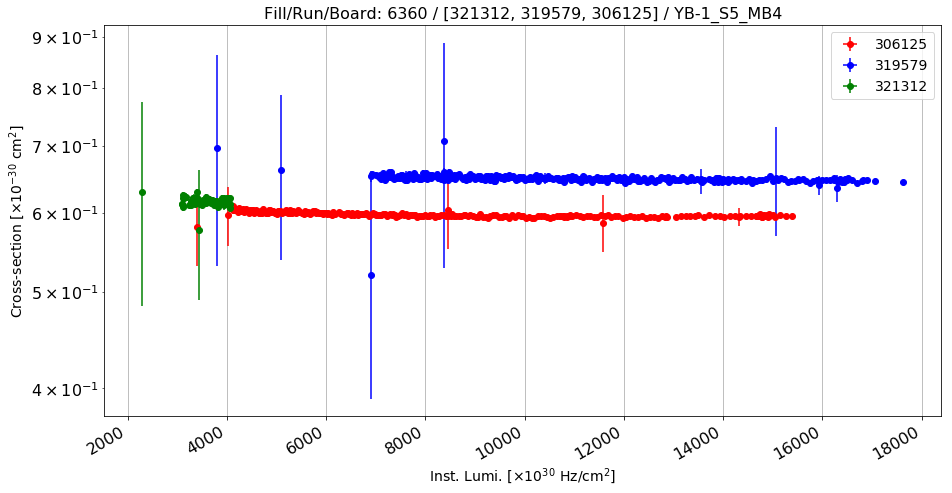

Anomalous CS: 0.595821600509 , Normal CS: 0.647517521689 , Ratio: 0.0798371000761


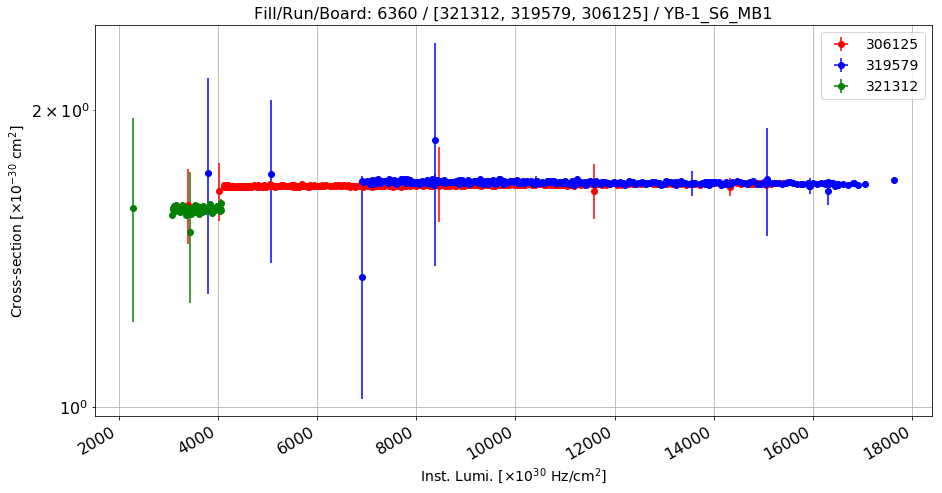

Anomalous CS: 1.67871179702 , Normal CS: 1.68650656042 , Ratio: 0.00462183995403


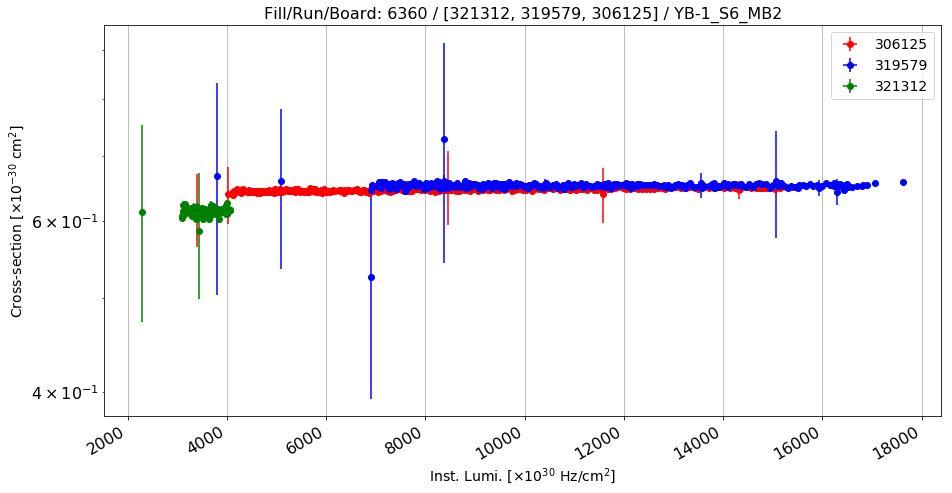

Anomalous CS: 0.646438335692 , Normal CS: 0.652146534343 , Ratio: 0.00875293871893


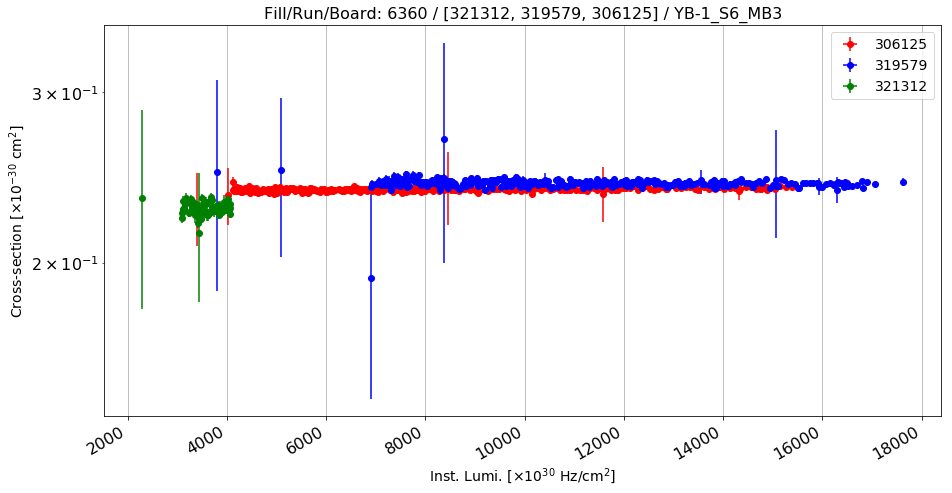

Anomalous CS: 0.238342306458 , Normal CS: 0.241512770904 , Ratio: 0.0131275229643


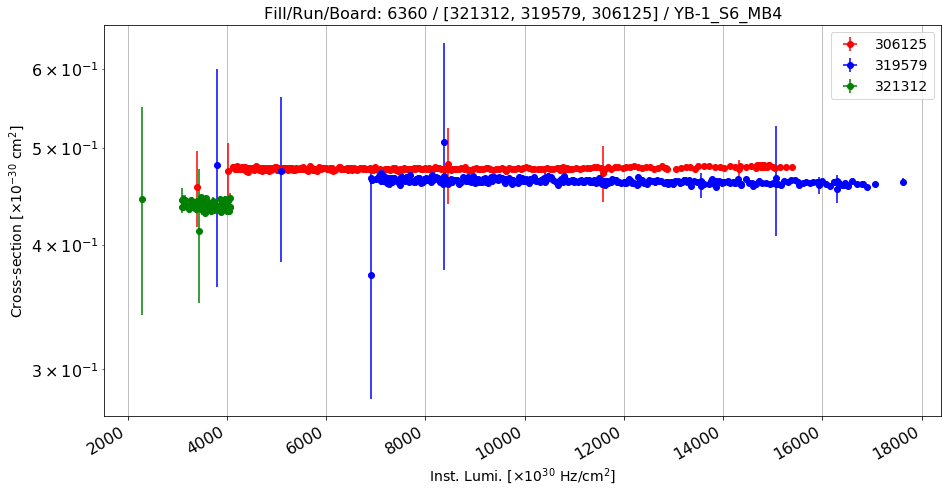

Anomalous CS: 0.477084828005 , Normal CS: 0.462139874027 , Ratio: -0.0323385944782


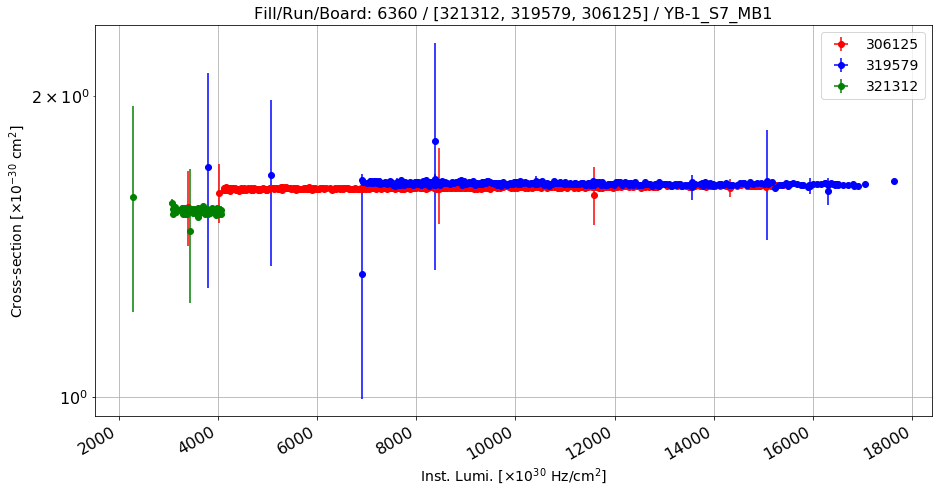

Anomalous CS: 1.61983122063 , Normal CS: 1.63318374996 , Ratio: 0.00817576670766


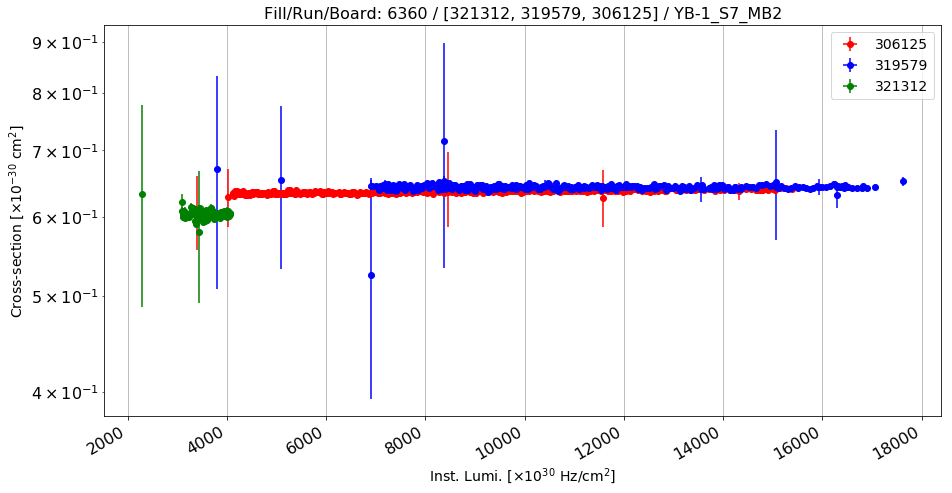

Anomalous CS: 0.636988625633 , Normal CS: 0.643317374301 , Ratio: 0.009837677204


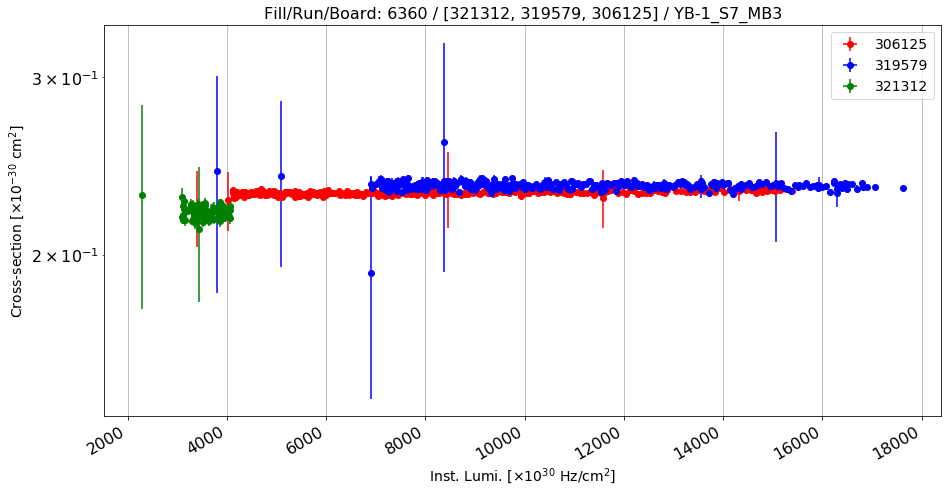

Anomalous CS: 0.230812515546 , Normal CS: 0.234365848707 , Ratio: 0.0151614801432


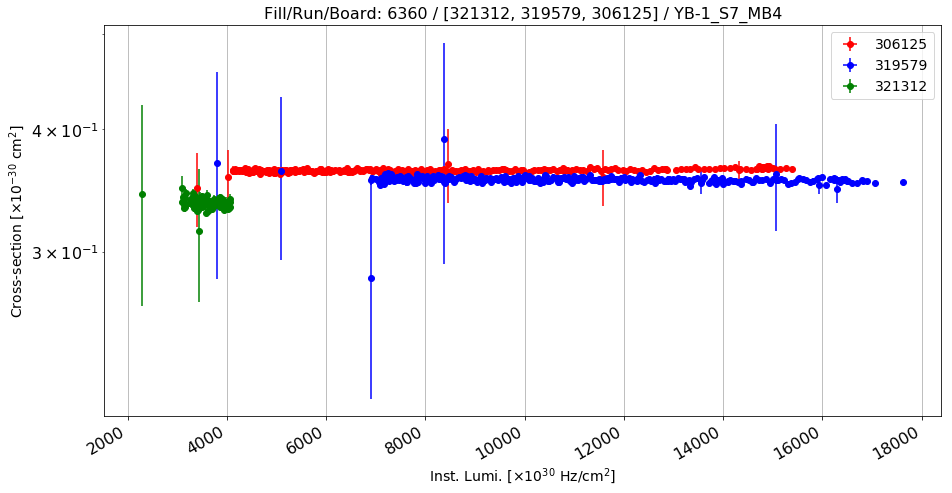

Anomalous CS: 0.363590081011 , Normal CS: 0.355085493095 , Ratio: -0.0239508177073


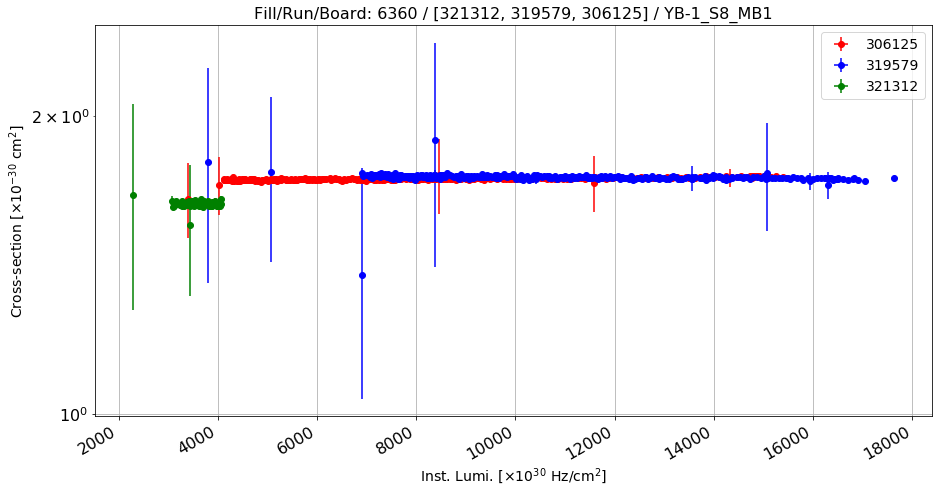

Anomalous CS: 1.72990267946 , Normal CS: 1.73207653704 , Ratio: 0.0012550586176


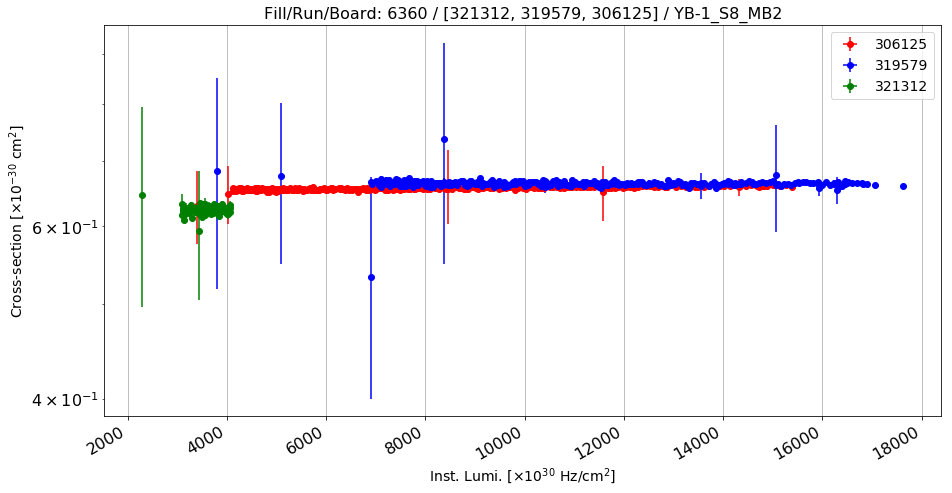

Anomalous CS: 0.657600398932 , Normal CS: 0.663580267089 , Ratio: 0.00901152197178


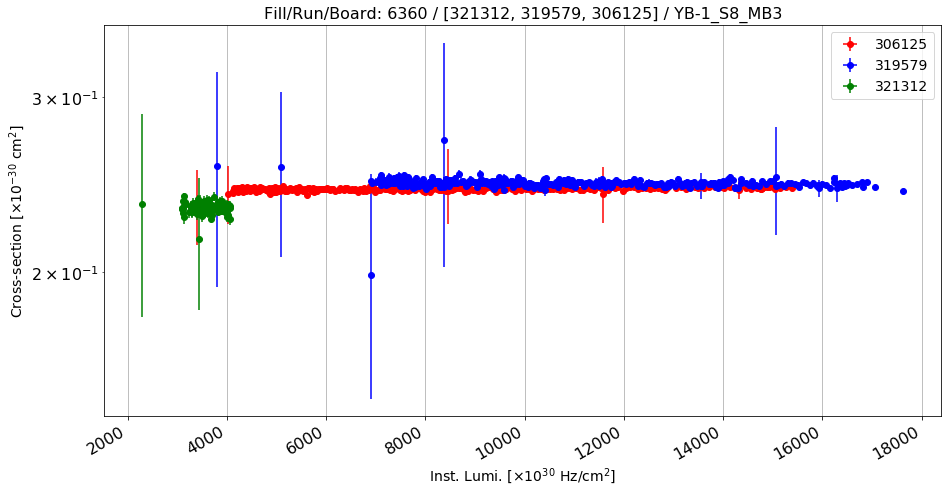

Anomalous CS: 0.242790804302 , Normal CS: 0.245570520418 , Ratio: 0.0113194210384


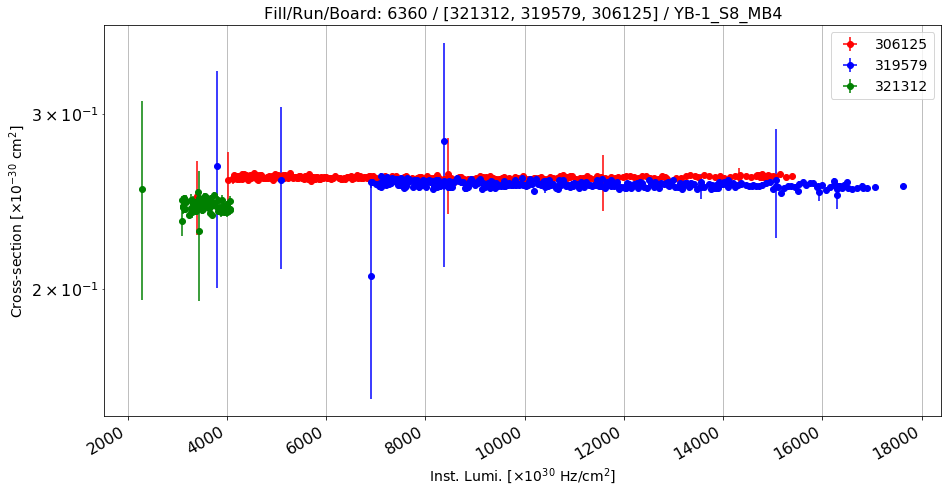

Anomalous CS: 0.258774803909 , Normal CS: 0.254280957845 , Ratio: -0.0176727589123


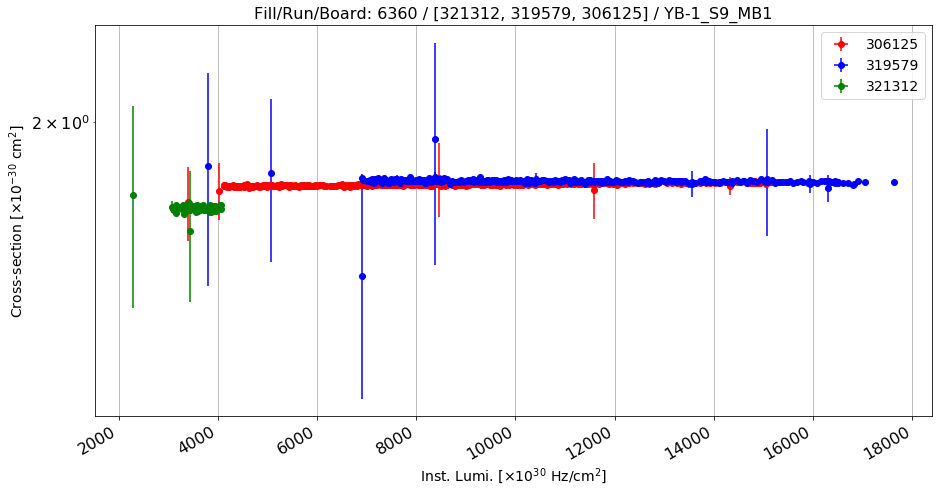

Anomalous CS: 1.7283793888 , Normal CS: 1.73926015502 , Ratio: 0.00625597394855


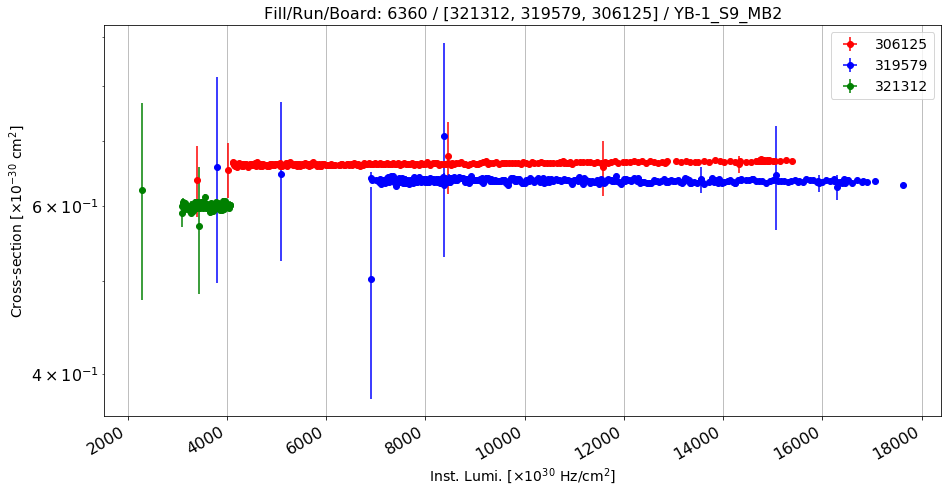

Anomalous CS: 0.665034188429 , Normal CS: 0.636717263811 , Ratio: -0.0444733105694


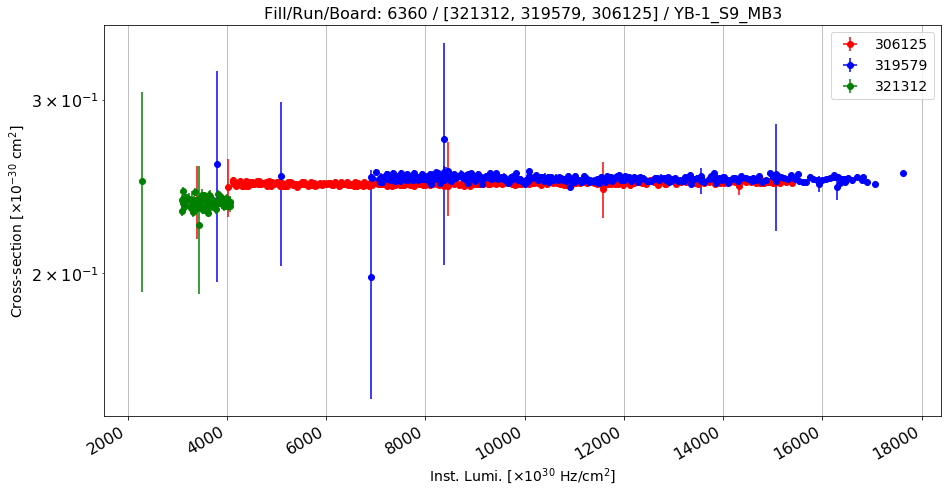

Anomalous CS: 0.246720987775 , Normal CS: 0.24930076938 , Ratio: 0.0103480691688


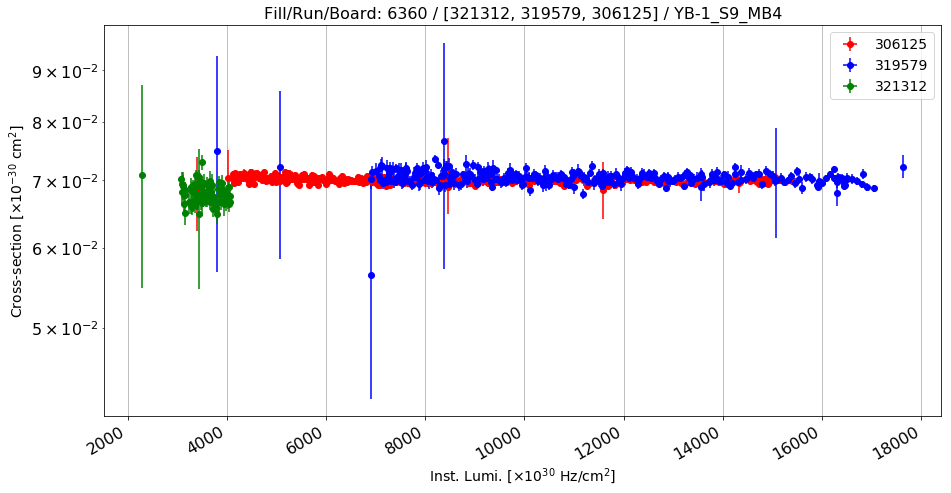

Anomalous CS: 0.0699227794669 , Normal CS: 0.0703125186532 , Ratio: 0.00554295584648


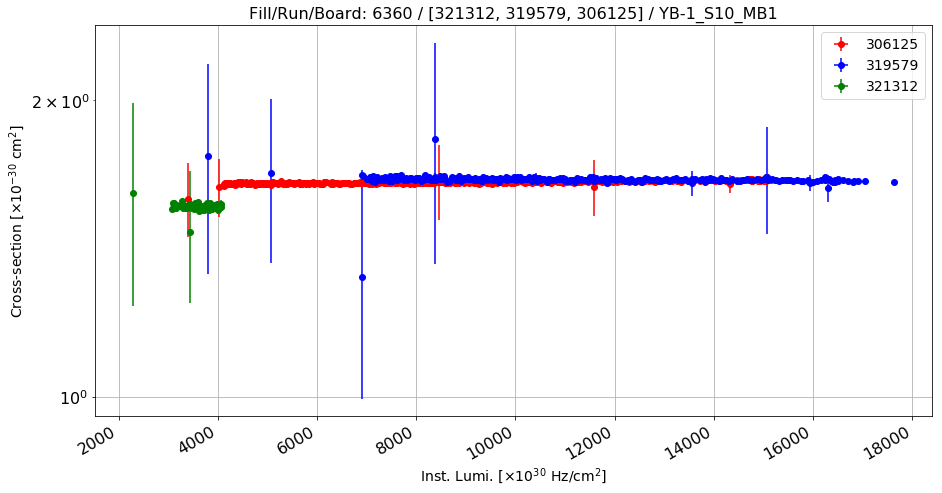

Anomalous CS: 1.65239017161 , Normal CS: 1.66091492697 , Ratio: 0.00513256592906


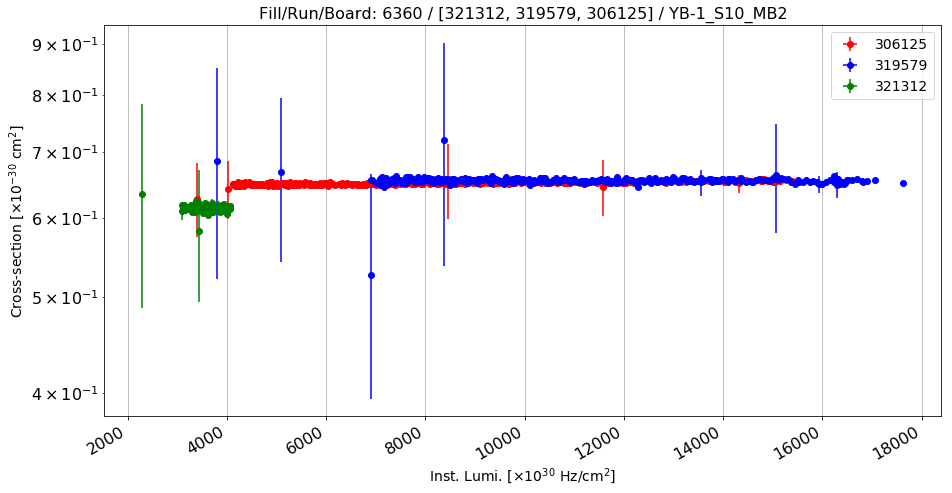

Anomalous CS: 0.651881438779 , Normal CS: 0.654803973253 , Ratio: 0.0044632204342


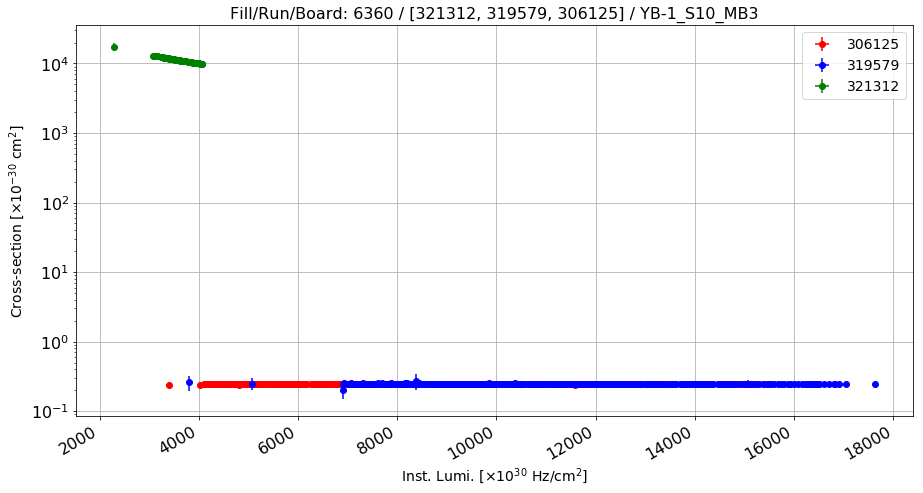

Anomalous CS: 0.24440533301 , Normal CS: 0.246690131232 , Ratio: 0.00926181445256


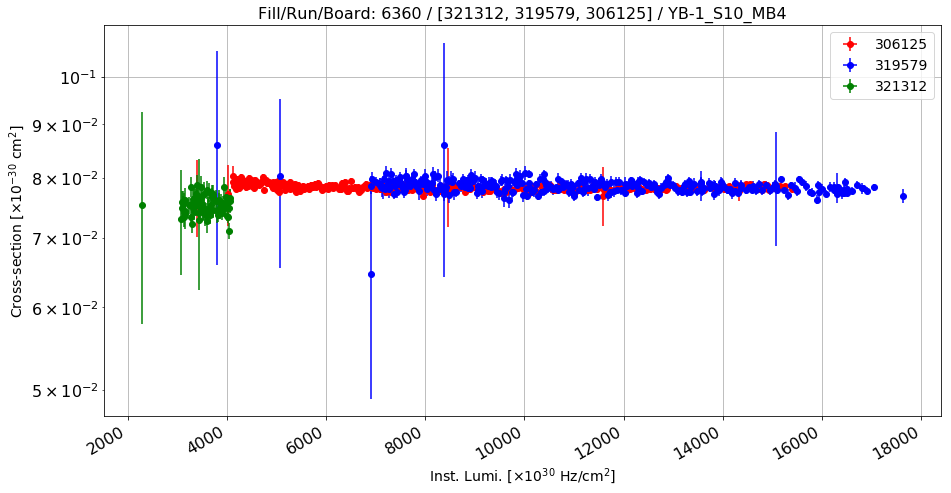

Anomalous CS: 0.0781751590833 , Normal CS: 0.0783244713254 , Ratio: 0.00190632939598


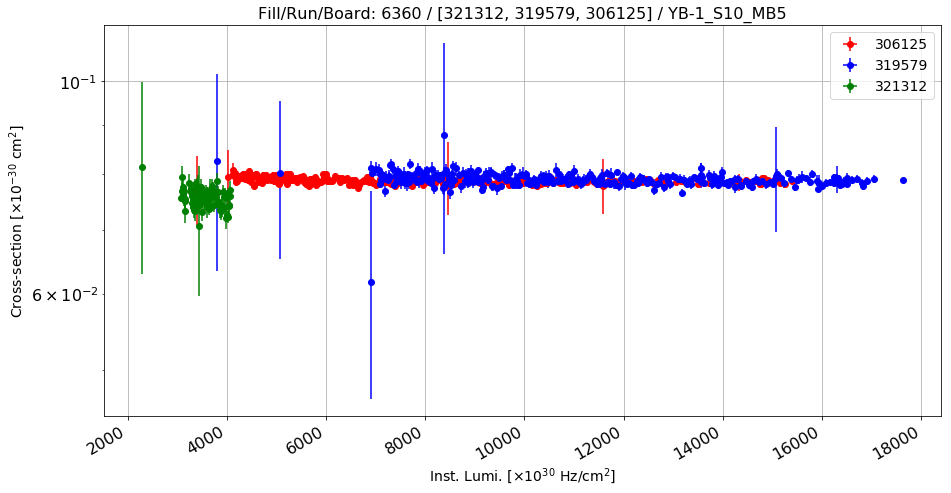

Anomalous CS: 0.0786344736675 , Normal CS: 0.078857522416 , Ratio: 0.0028285031241


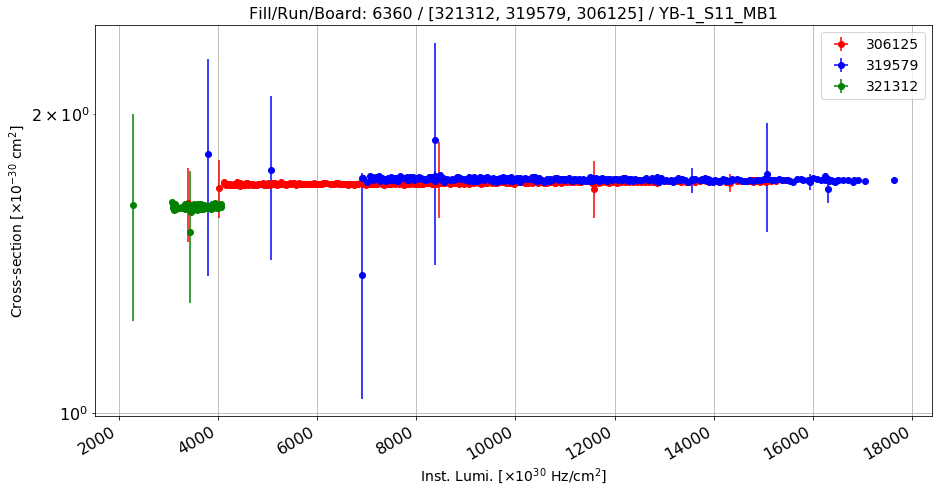

Anomalous CS: 1.70460681244 , Normal CS: 1.71588307126 , Ratio: 0.00657169419766


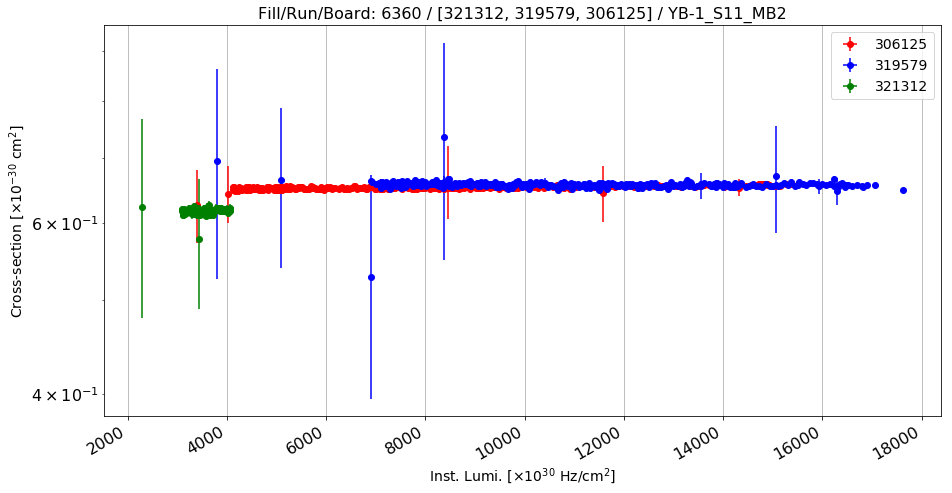

Anomalous CS: 0.653106733595 , Normal CS: 0.655918044325 , Ratio: 0.00428607011861


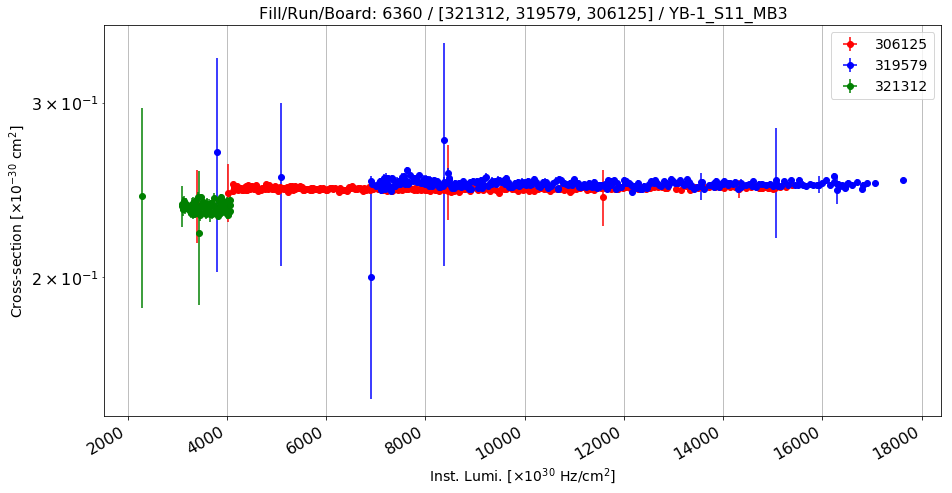

Anomalous CS: 0.24597500217 , Normal CS: 0.248444596224 , Ratio: 0.00994022044037


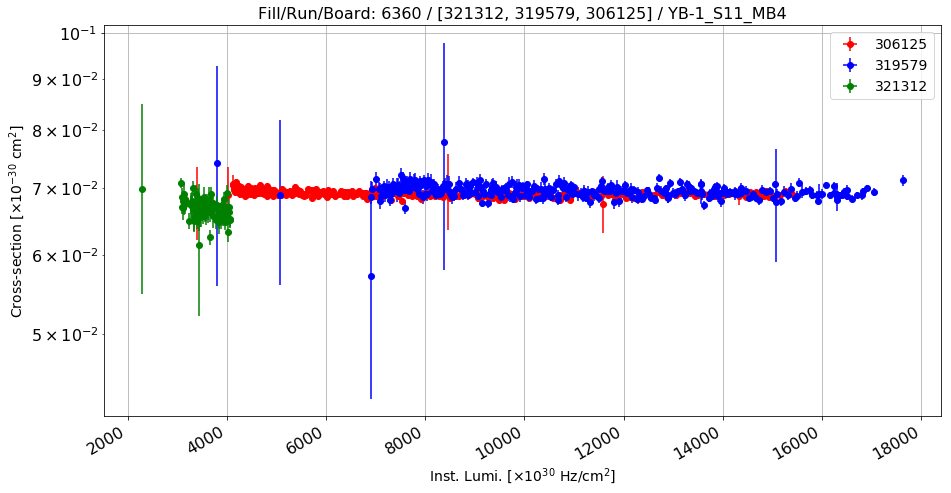

Anomalous CS: 0.0689400235009 , Normal CS: 0.0693209408464 , Ratio: 0.00549498233668


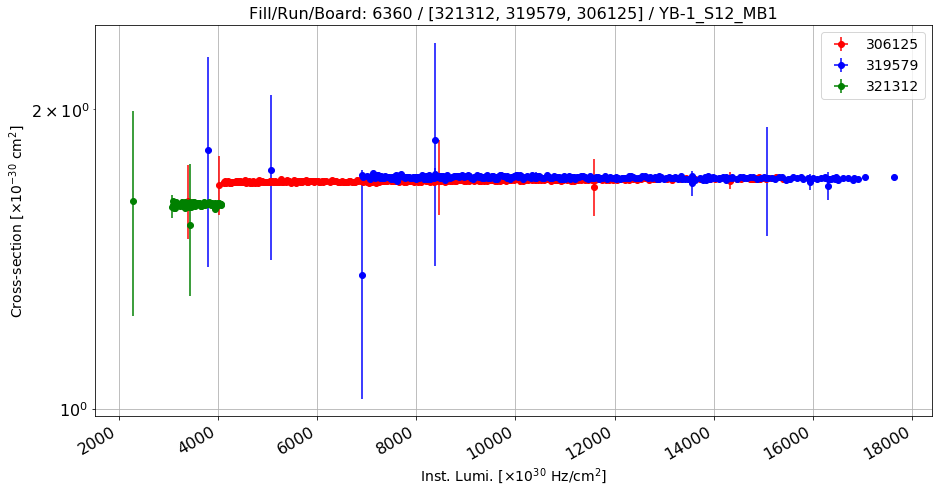

Anomalous CS: 1.69785184331 , Normal CS: 1.70721515504 , Ratio: 0.00548455284309


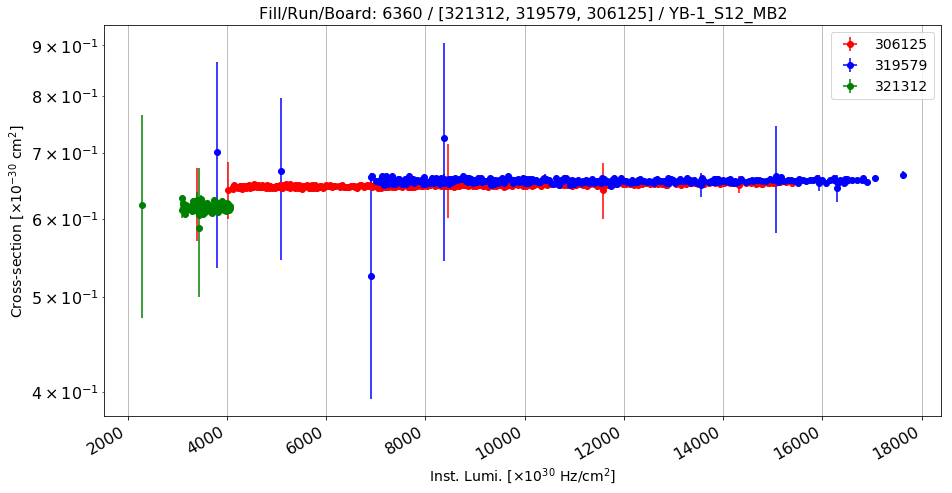

Anomalous CS: 0.649342257301 , Normal CS: 0.655485881258 , Ratio: 0.00937262591399


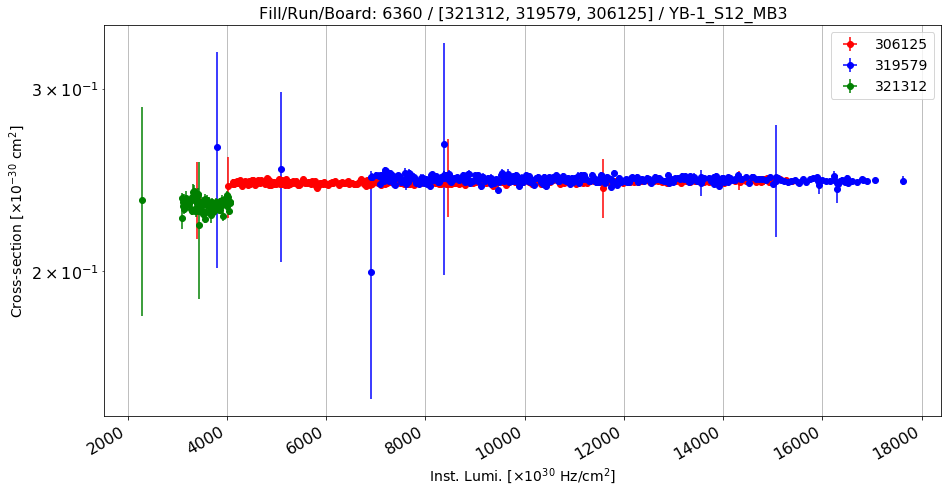

Anomalous CS: 0.244048187868 , Normal CS: 0.245262821402 , Ratio: 0.00495237528312


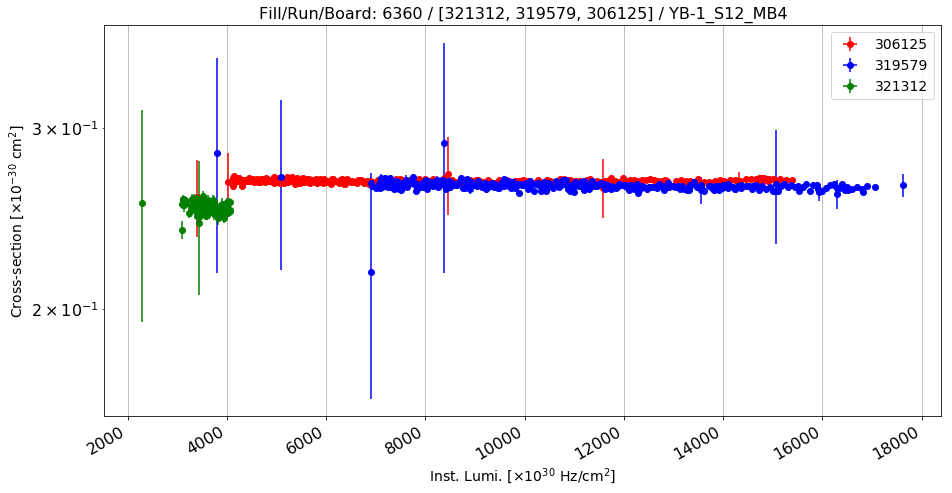

Anomalous CS: 0.266414714995 , Normal CS: 0.262977347222 , Ratio: -0.0130709652708


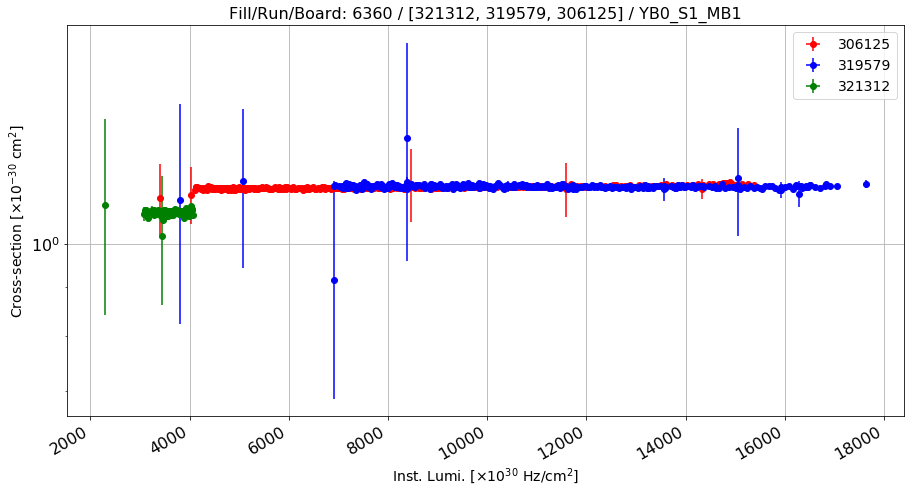

Anomalous CS: 1.14712546589 , Normal CS: 1.14740079368 , Ratio: 0.000239957816543


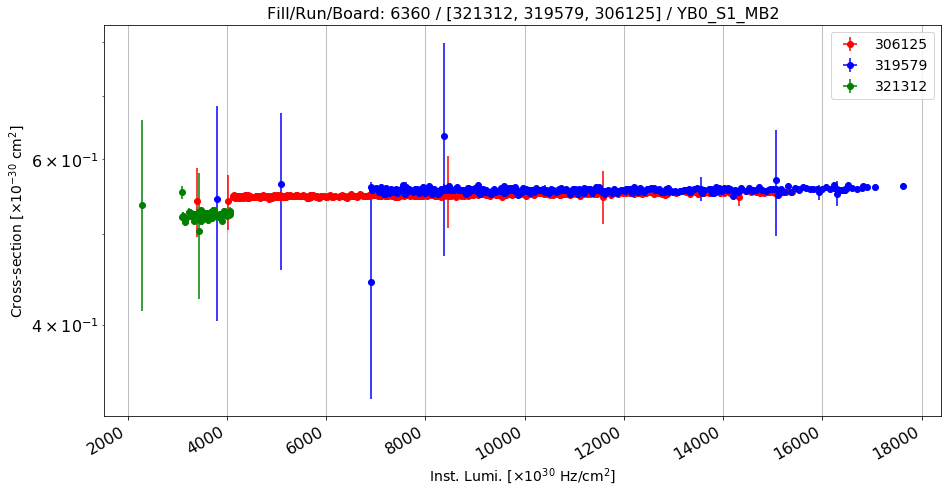

Anomalous CS: 0.550633433863 , Normal CS: 0.556662299637 , Ratio: 0.0108303827613


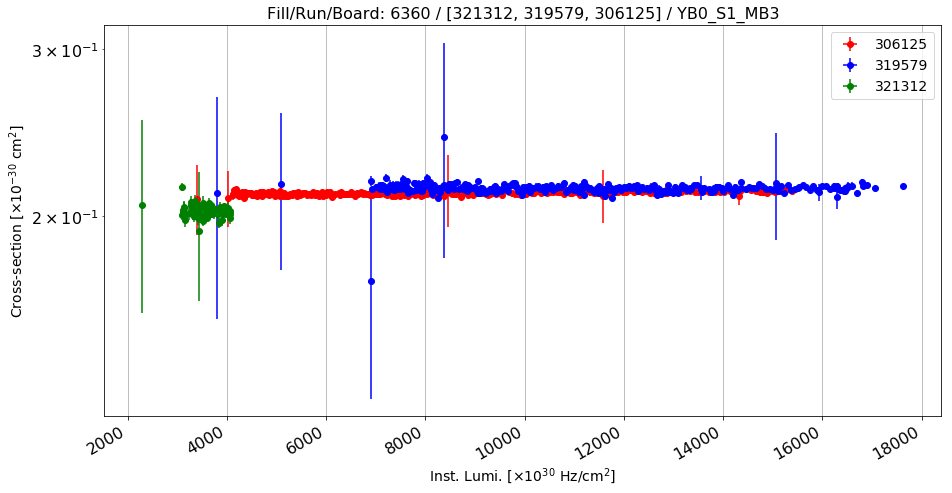

Anomalous CS: 0.211791157176 , Normal CS: 0.213988077173 , Ratio: 0.0102665532896


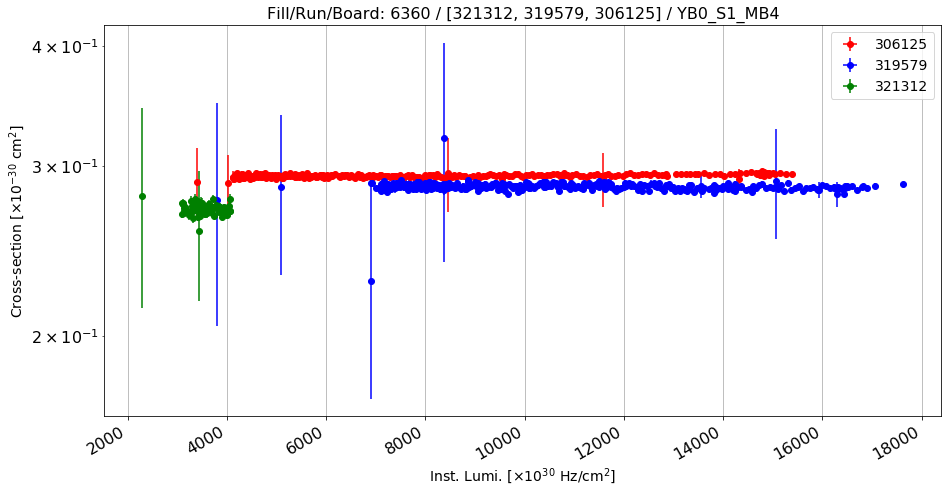

Anomalous CS: 0.293464506649 , Normal CS: 0.285516881326 , Ratio: -0.0278359208937


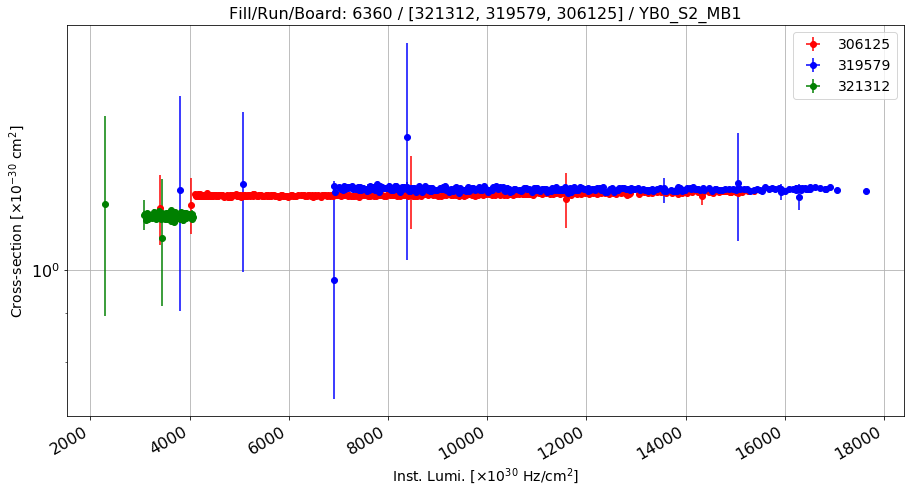

Anomalous CS: 1.19989606877 , Normal CS: 1.21391504938 , Ratio: 0.0115485680971


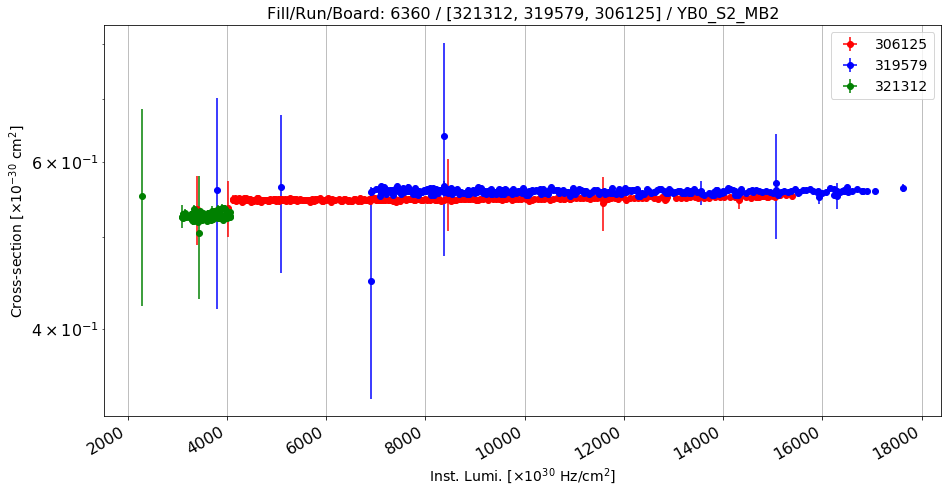

Anomalous CS: 0.549173648488 , Normal CS: 0.558601870323 , Ratio: 0.016878249674


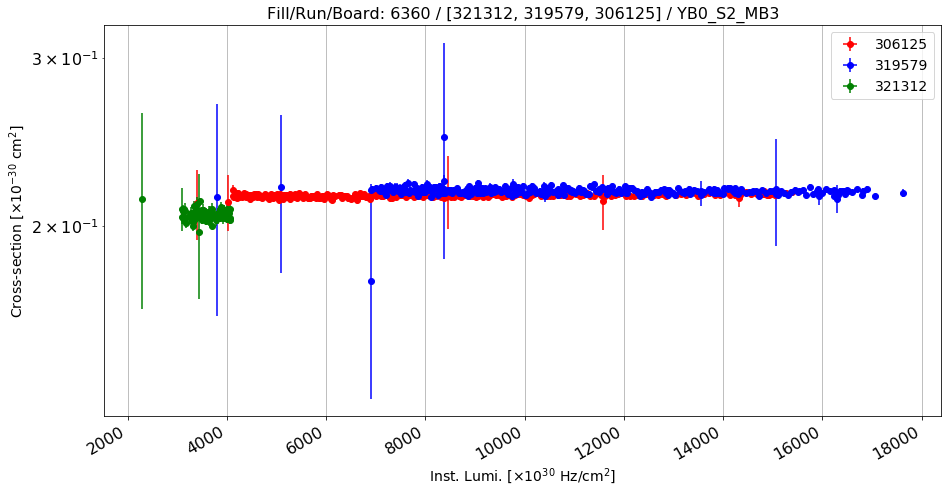

Anomalous CS: 0.21536530948 , Normal CS: 0.21735665056 , Ratio: 0.00916162939877


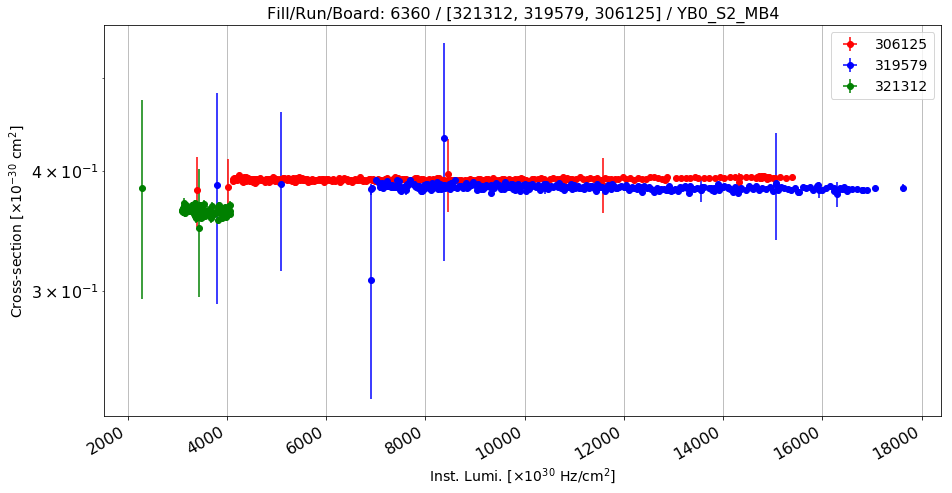

Anomalous CS: 0.392214151493 , Normal CS: 0.383853968076 , Ratio: -0.0217795935749


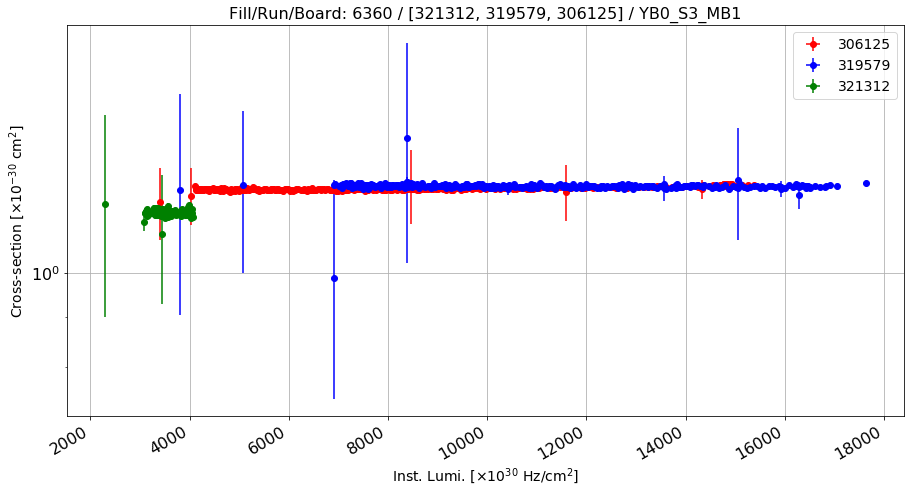

Anomalous CS: 1.22193138828 , Normal CS: 1.22674725335 , Ratio: 0.00392571905423


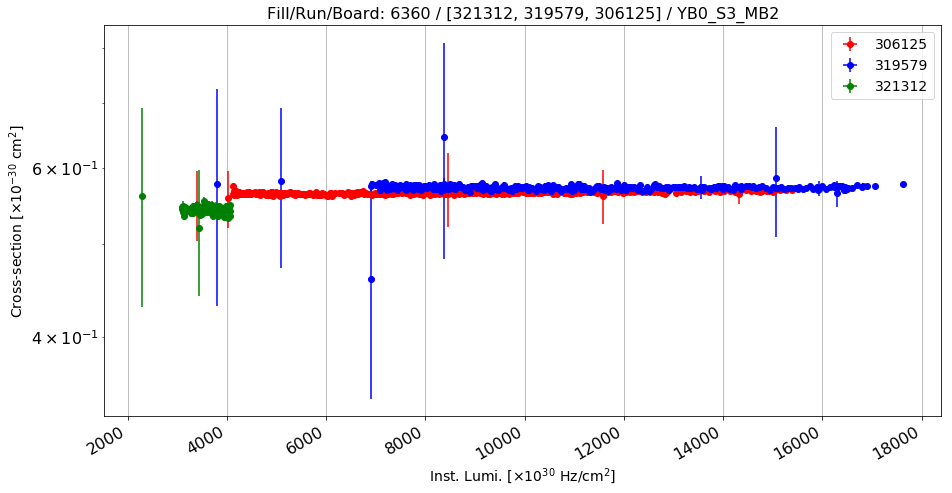

Anomalous CS: 0.565428551774 , Normal CS: 0.572170103828 , Ratio: 0.0117824262561


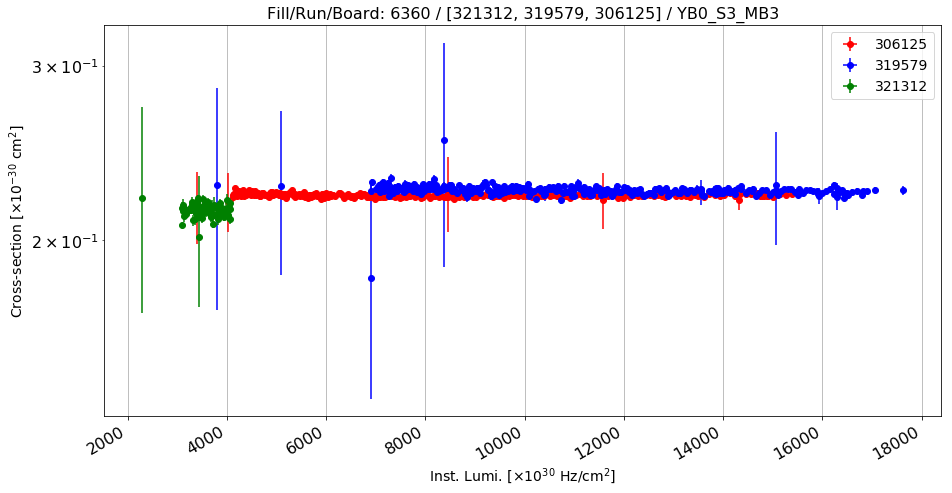

Anomalous CS: 0.22197349729 , Normal CS: 0.224322127397 , Ratio: 0.0104698994001


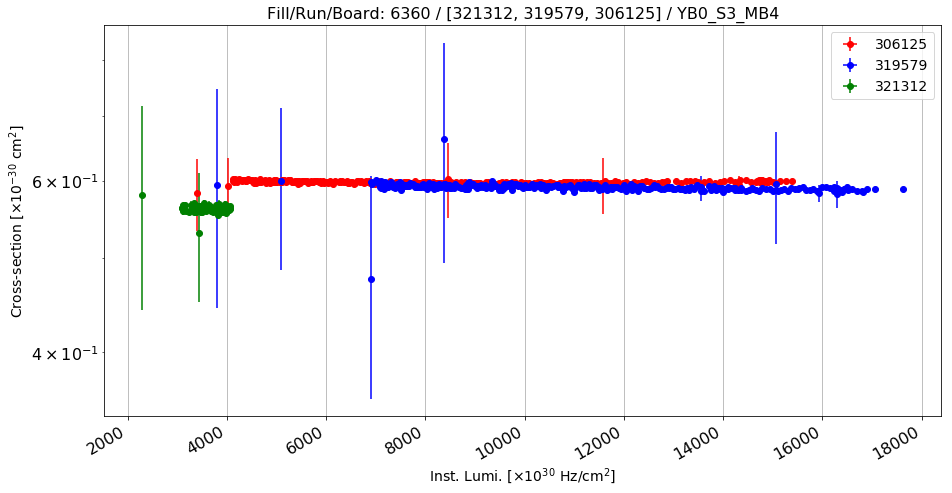

Anomalous CS: 0.598688055814 , Normal CS: 0.590386914952 , Ratio: -0.0140605095595


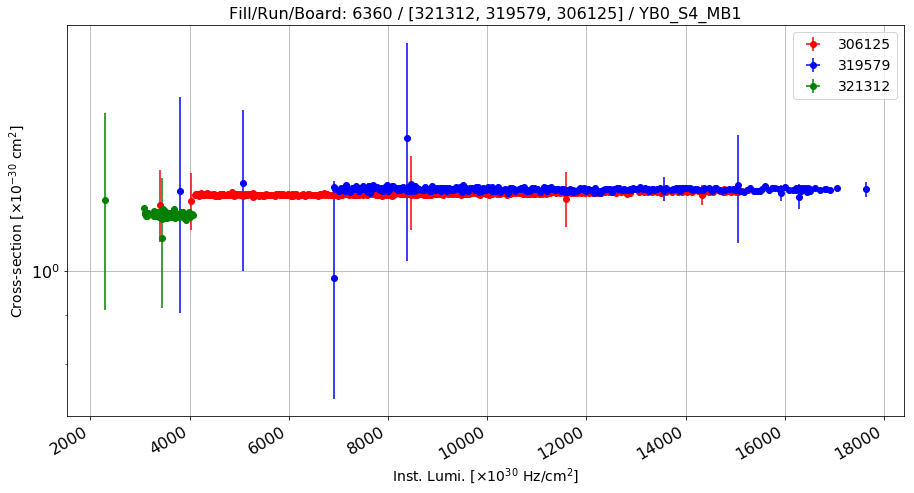

Anomalous CS: 1.20305938382 , Normal CS: 1.21474581775 , Ratio: 0.0096204767777


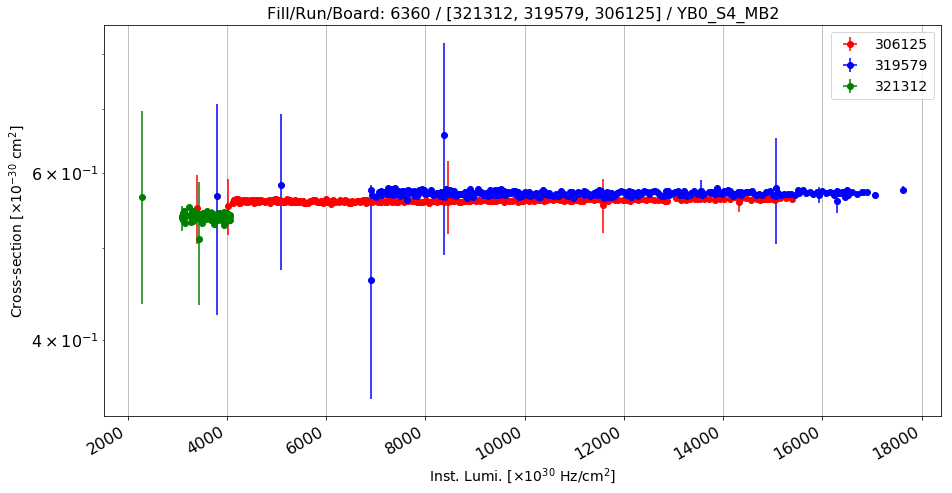

Anomalous CS: 0.561257973148 , Normal CS: 0.570772654698 , Ratio: 0.0166698272453


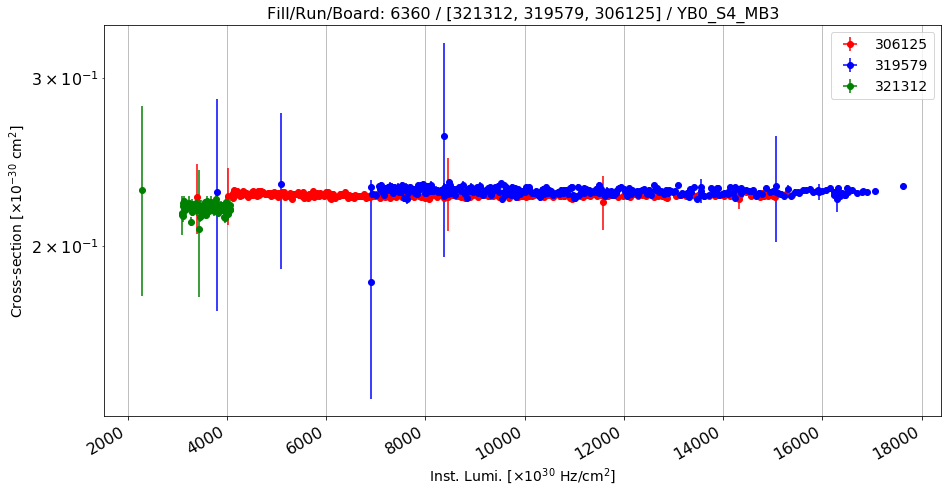

Anomalous CS: 0.225847752605 , Normal CS: 0.228003625029 , Ratio: 0.00945543047184


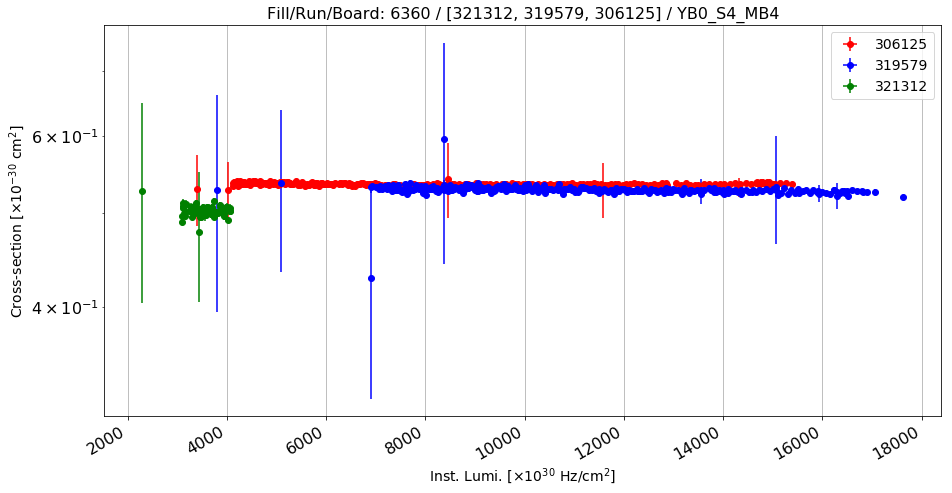

Anomalous CS: 0.534881169842 , Normal CS: 0.52701982792 , Ratio: -0.014916596122


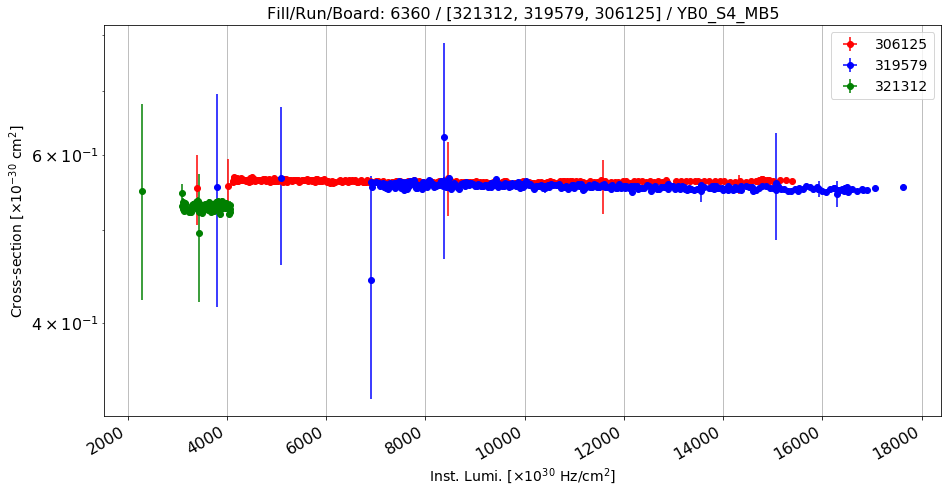

Anomalous CS: 0.562301054541 , Normal CS: 0.554461155525 , Ratio: -0.0141396722523


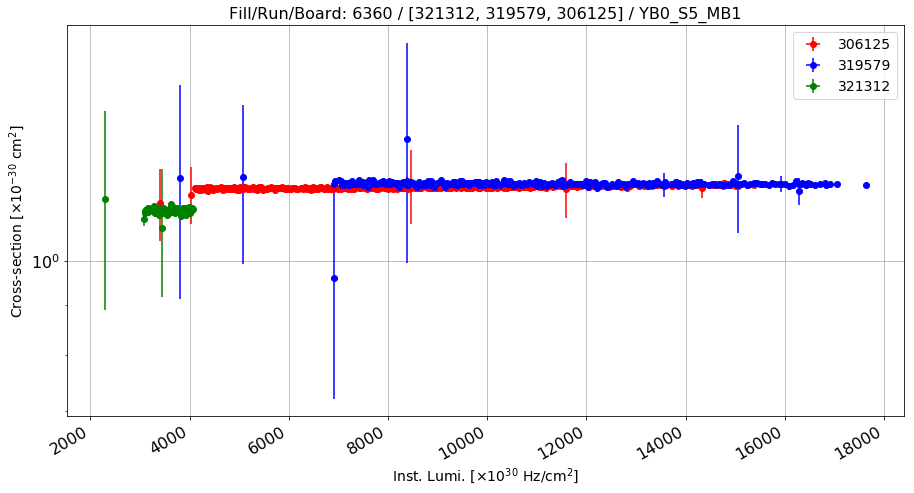

Anomalous CS: 1.19261353824 , Normal CS: 1.20142281087 , Ratio: 0.00733236671669


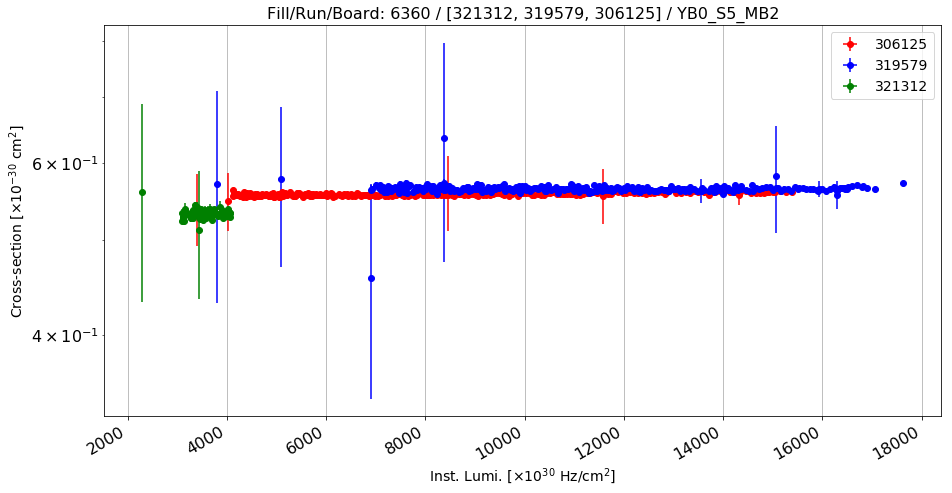

Anomalous CS: 0.557877624456 , Normal CS: 0.564275222322 , Ratio: 0.0113377260116


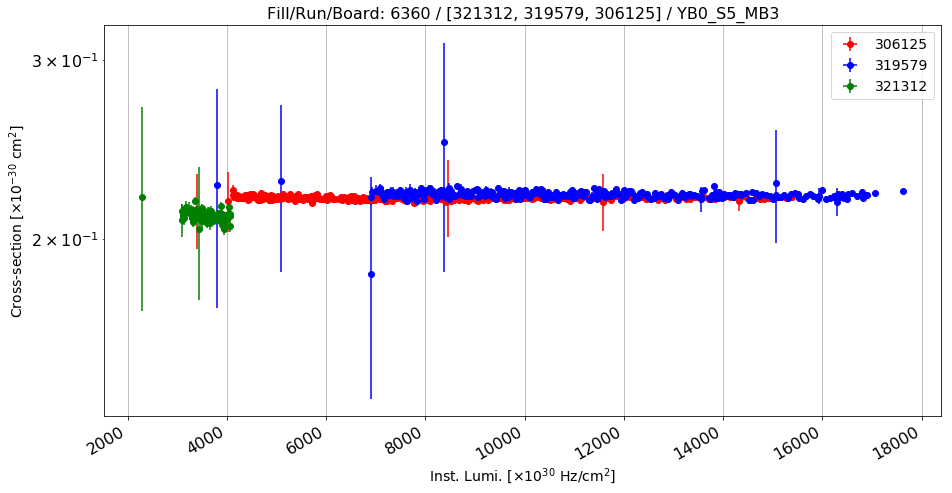

Anomalous CS: 0.219161099297 , Normal CS: 0.220828451001 , Ratio: 0.00755043879772


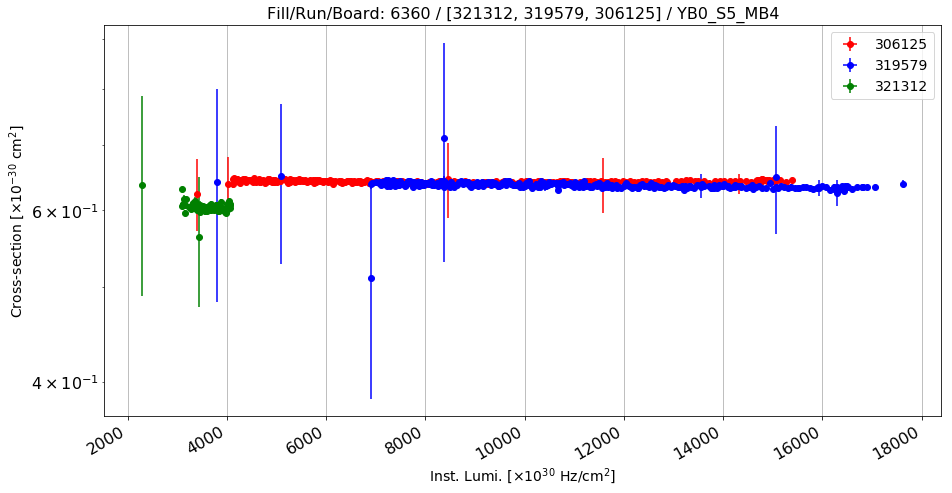

Anomalous CS: 0.642198610515 , Normal CS: 0.635420831903 , Ratio: -0.0106665980585


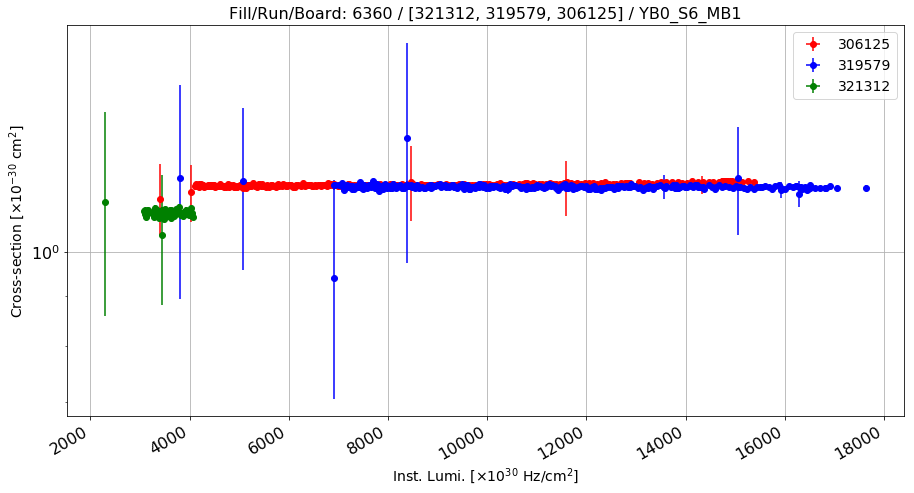

Anomalous CS: 1.17459920733 , Normal CS: 1.16641683656 , Ratio: -0.0070149628373


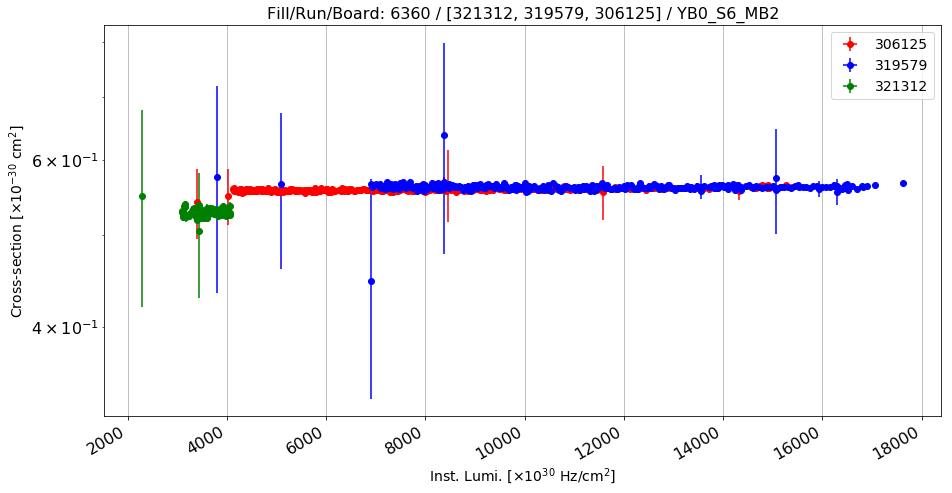

Anomalous CS: 0.559068692835 , Normal CS: 0.561482846337 , Ratio: 0.00429960330477


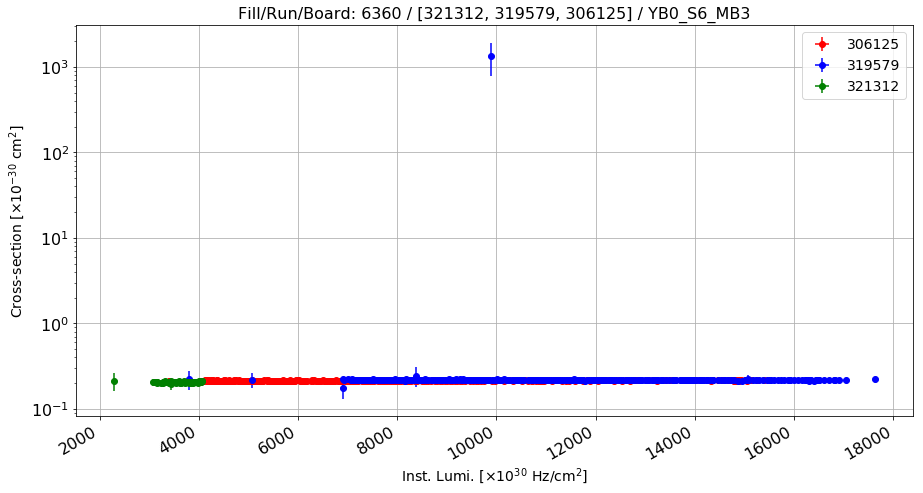

Anomalous CS: 0.214213856216 , Normal CS: 0.217135062936 , Ratio: 0.0134534085836


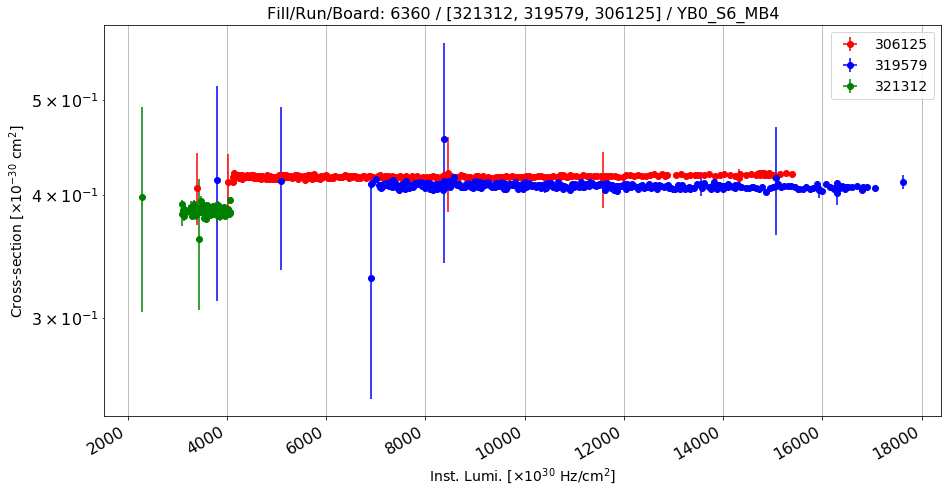

Anomalous CS: 0.418139573461 , Normal CS: 0.4081610656 , Ratio: -0.0244474760144


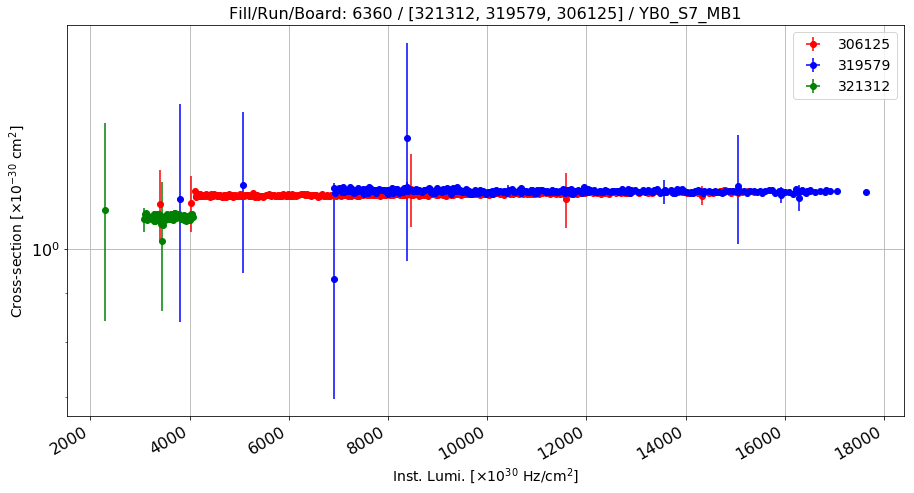

Anomalous CS: 1.14055461575 , Normal CS: 1.14727069697 , Ratio: 0.0058539638844


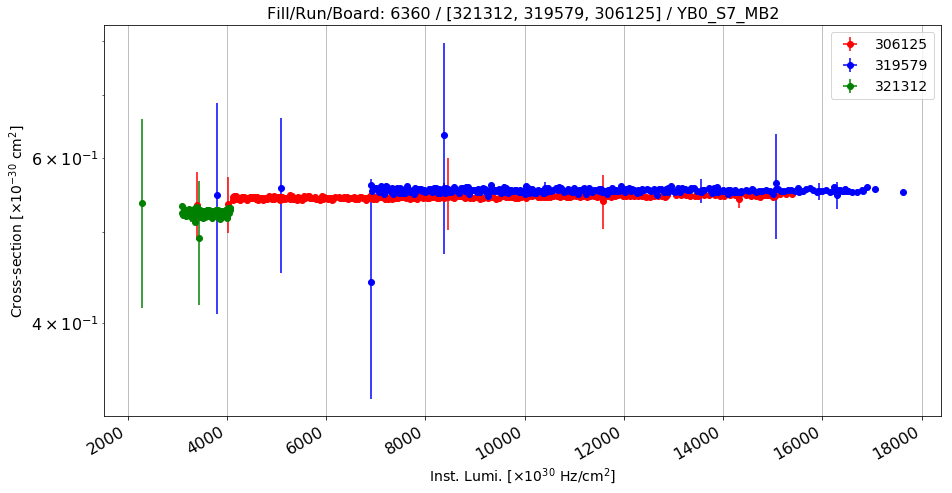

Anomalous CS: 0.545325734492 , Normal CS: 0.553782007767 , Ratio: 0.0152700397553


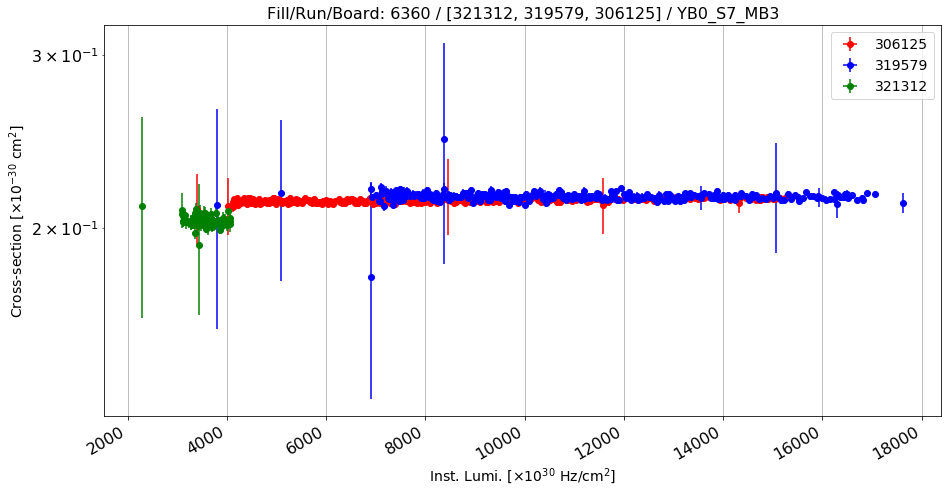

Anomalous CS: 0.21346631506 , Normal CS: 0.215121065287 , Ratio: 0.00769218126241


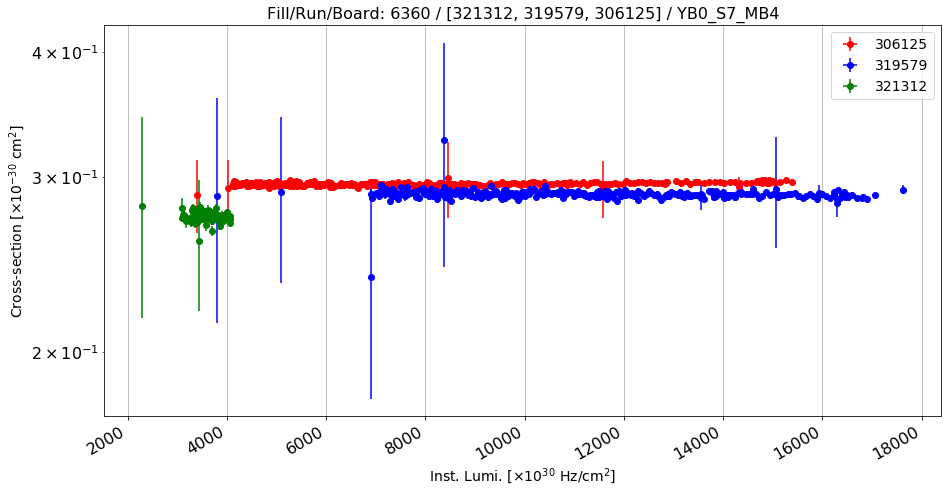

Anomalous CS: 0.295220330368 , Normal CS: 0.287882830806 , Ratio: -0.025487798428


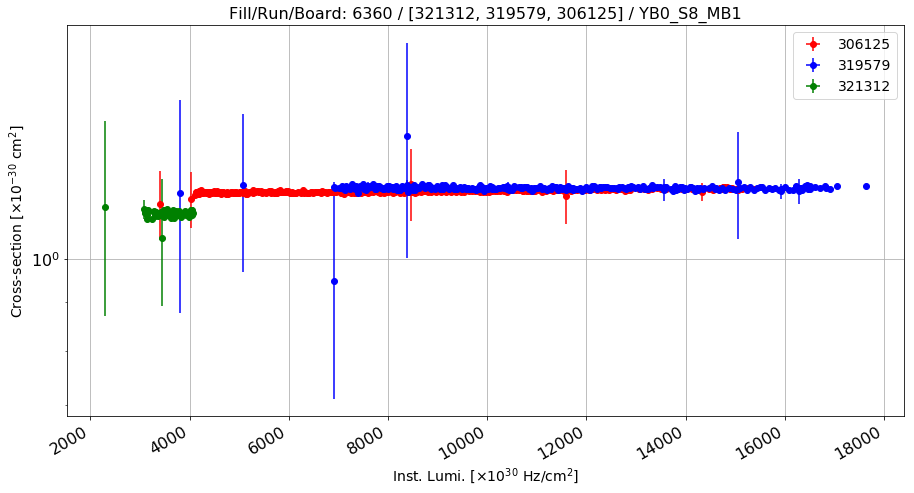

Anomalous CS: 1.18071560271 , Normal CS: 1.18862177225 , Ratio: 0.00665154360364


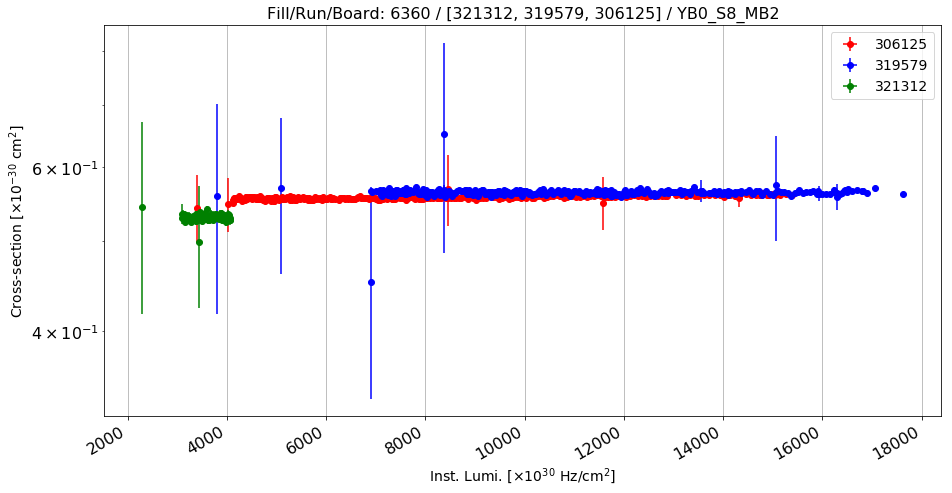

Anomalous CS: 0.557993355803 , Normal CS: 0.564129767185 , Ratio: 0.0108776592527


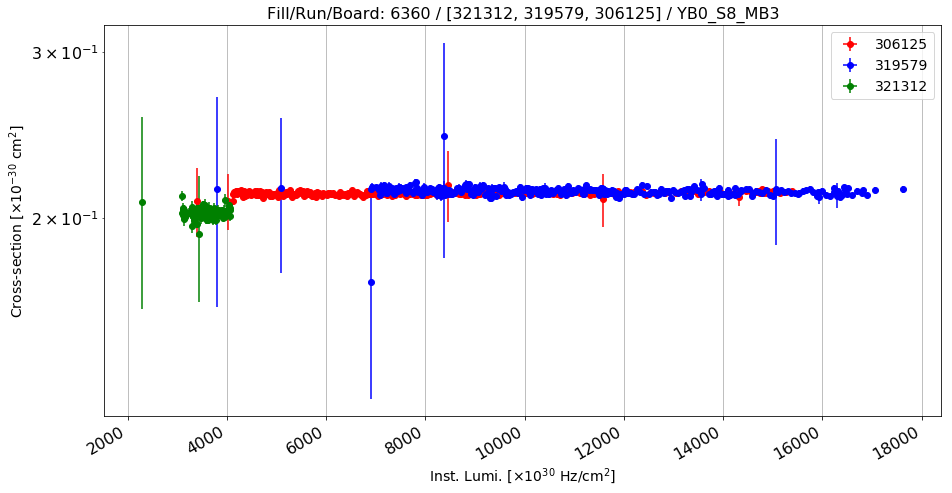

Anomalous CS: 0.212539785661 , Normal CS: 0.213255783258 , Ratio: 0.00335745922485


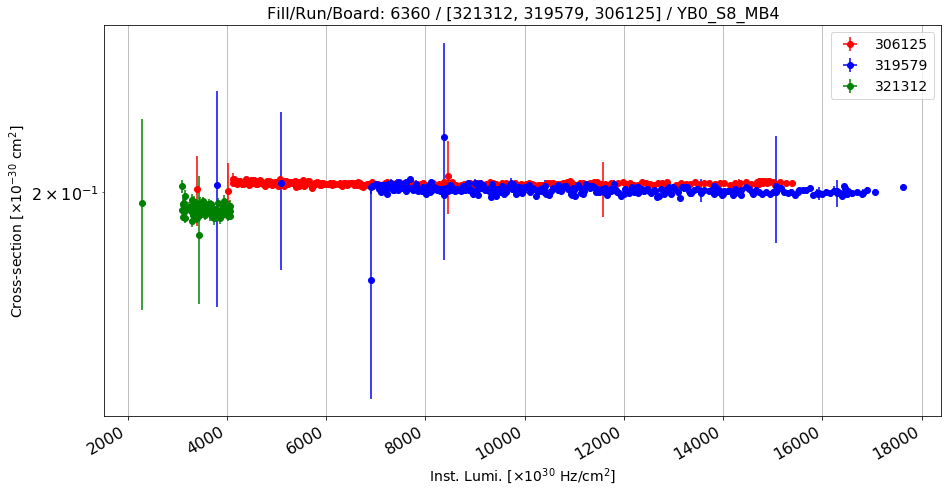

Anomalous CS: 0.204202617074 , Normal CS: 0.20085149272 , Ratio: -0.0166845877458


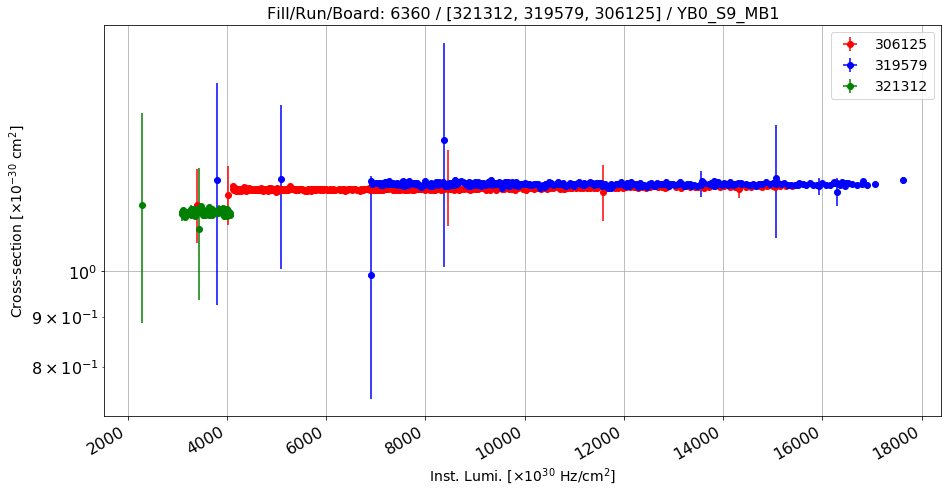

Anomalous CS: 1.21401551699 , Normal CS: 1.22492804988 , Ratio: 0.00890871336052


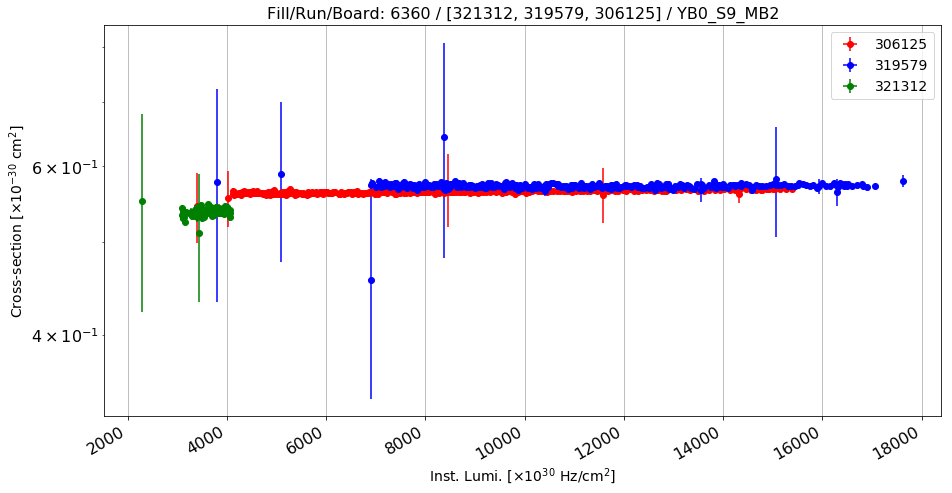

Anomalous CS: 0.56506744653 , Normal CS: 0.572257729556 , Ratio: 0.0125647634872


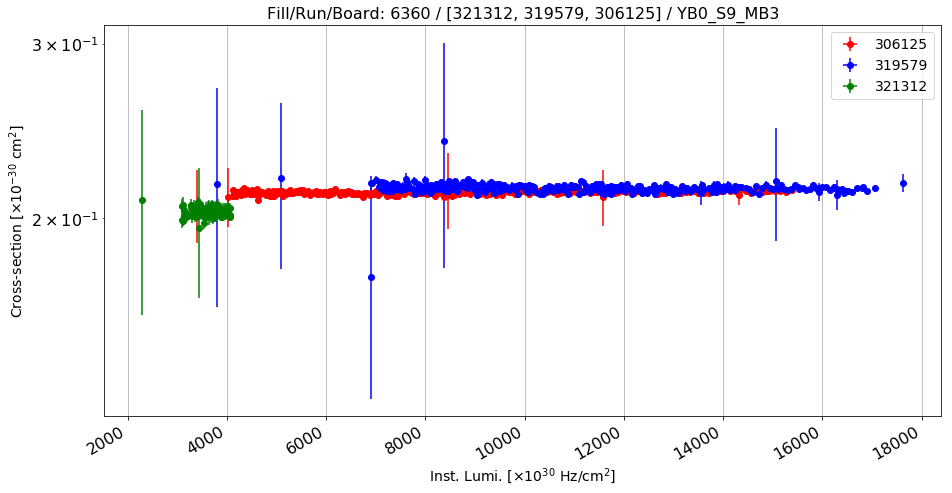

Anomalous CS: 0.212494376124 , Normal CS: 0.214200113827 , Ratio: 0.00796329036582


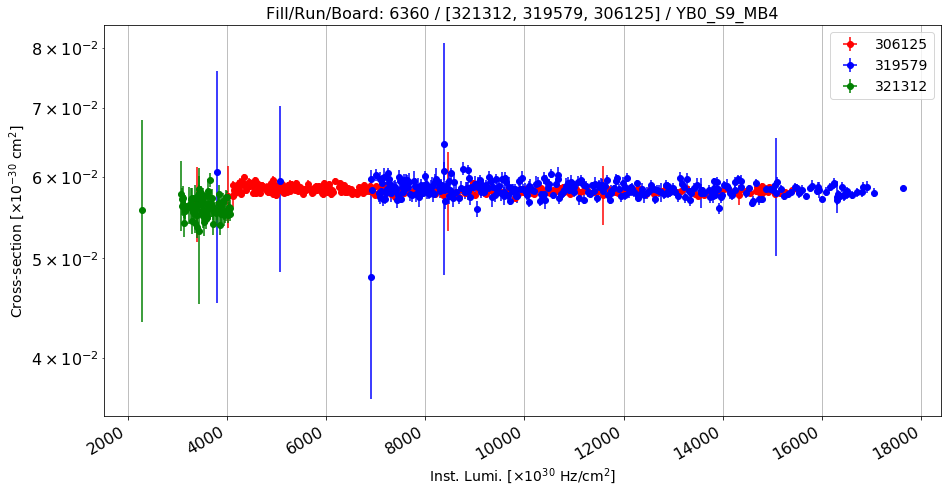

Anomalous CS: 0.0581602888854 , Normal CS: 0.058272513729 , Ratio: 0.00192586240745


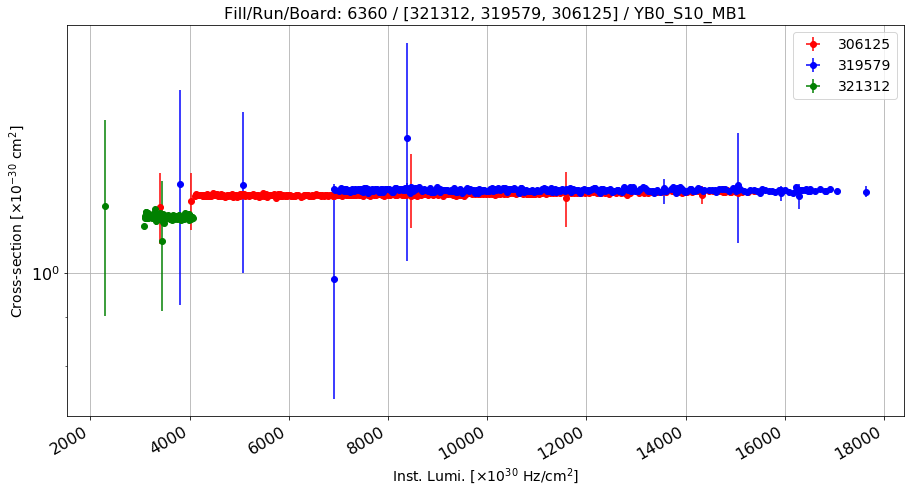

Anomalous CS: 1.2097328694 , Normal CS: 1.2203187432 , Ratio: 0.00867467934695


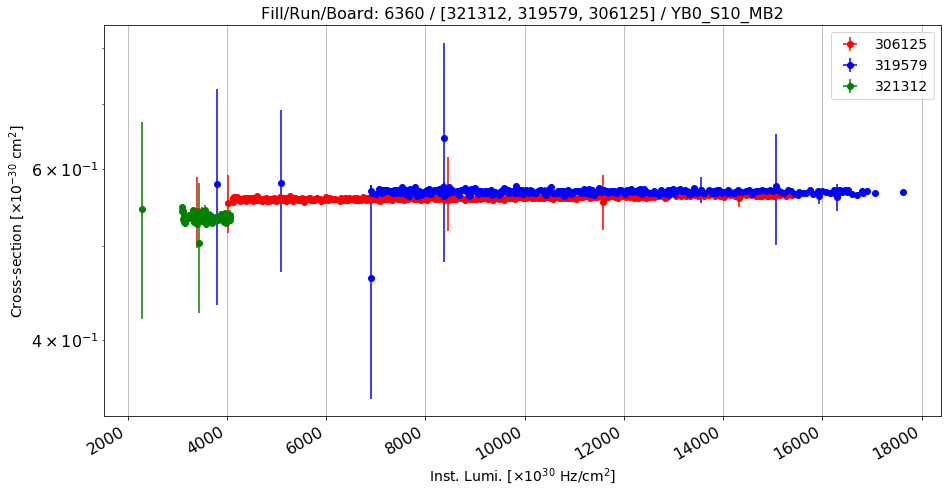

Anomalous CS: 0.560634163375 , Normal CS: 0.568663621454 , Ratio: 0.0141198729371


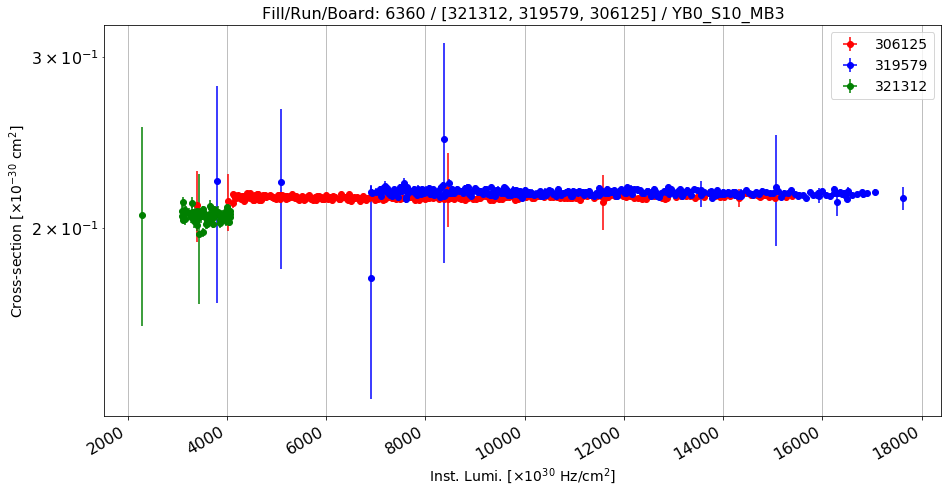

Anomalous CS: 0.215239209677 , Normal CS: 0.217379512982 , Ratio: 0.00984592924855


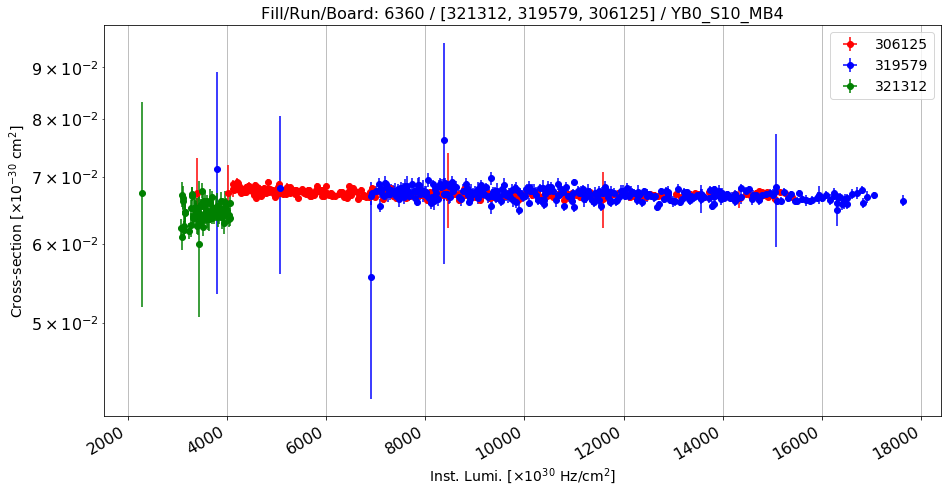

Anomalous CS: 0.067191895338 , Normal CS: 0.0670120006162 , Ratio: -0.00268451501535


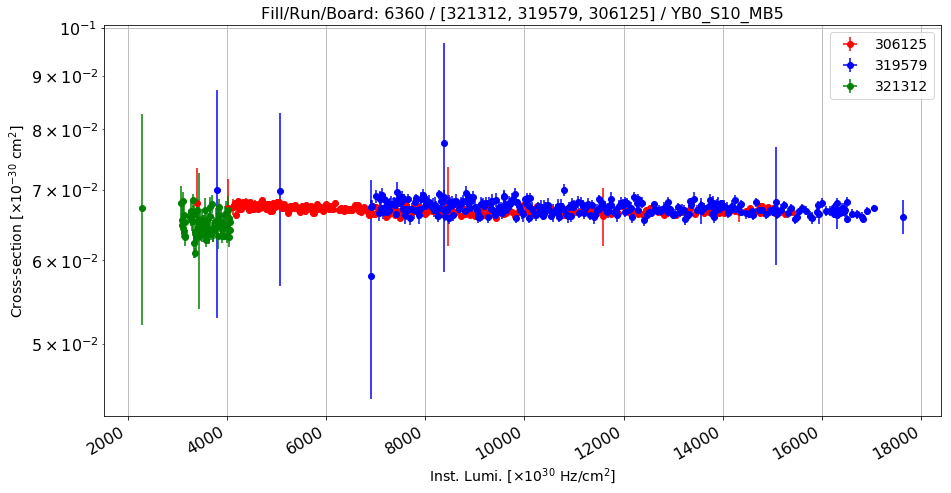

Anomalous CS: 0.0668932721037 , Normal CS: 0.067172339209 , Ratio: 0.00415449437397


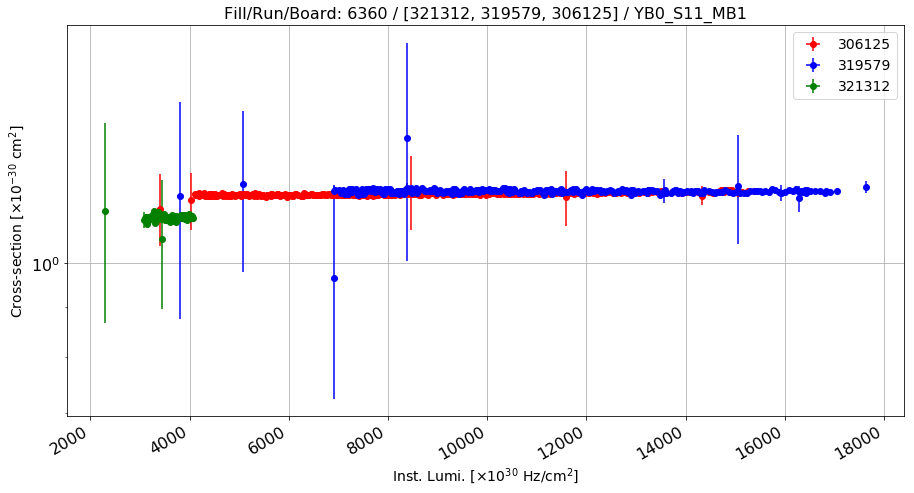

Anomalous CS: 1.18164723507 , Normal CS: 1.18798913355 , Ratio: 0.00533834721522


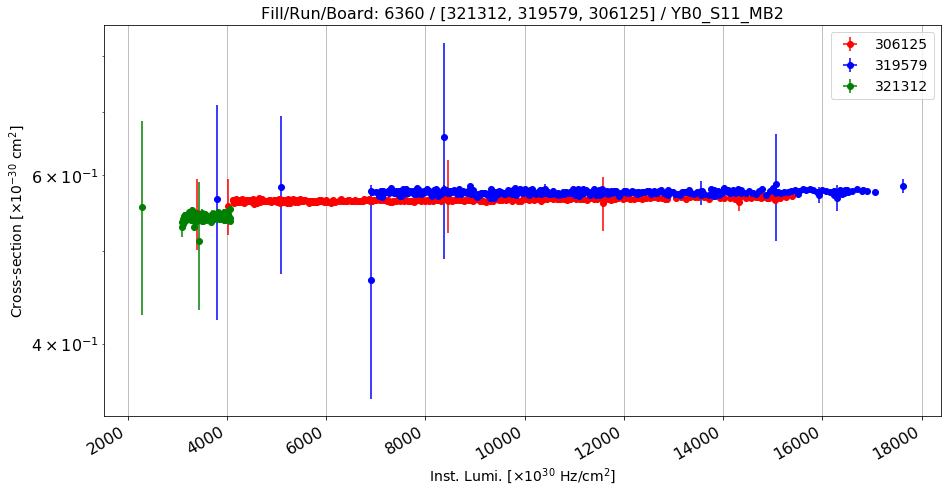

Anomalous CS: 0.566548603882 , Normal CS: 0.576514428358 , Ratio: 0.0172863400915


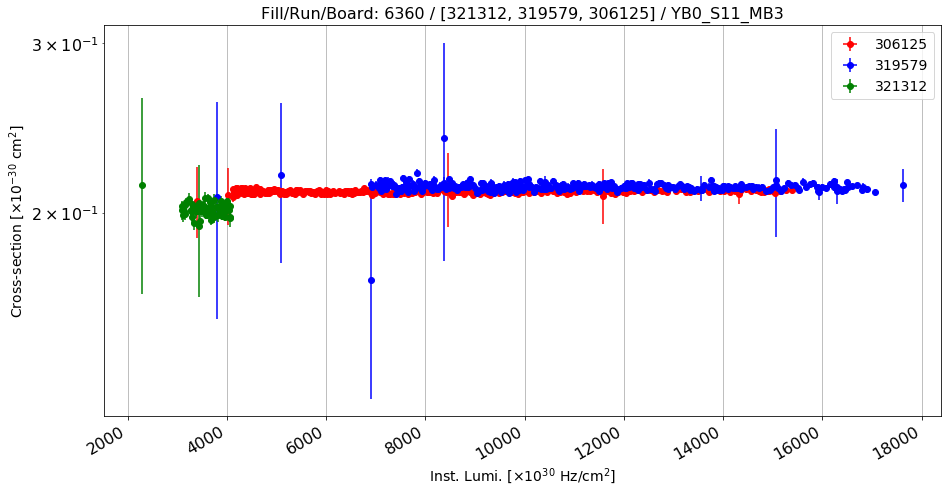

Anomalous CS: 0.210514051444 , Normal CS: 0.212888075446 , Ratio: 0.0111515123475


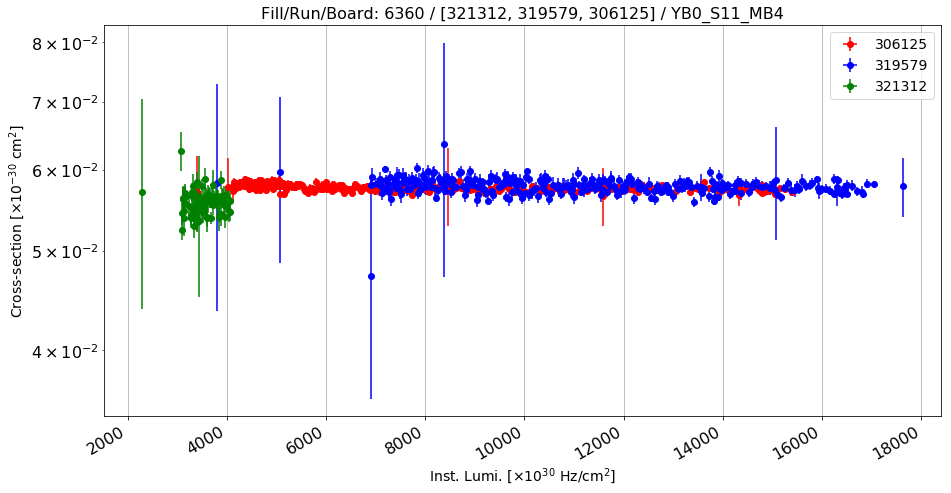

Anomalous CS: 0.057570486363 , Normal CS: 0.0577692588776 , Ratio: 0.00344080084244


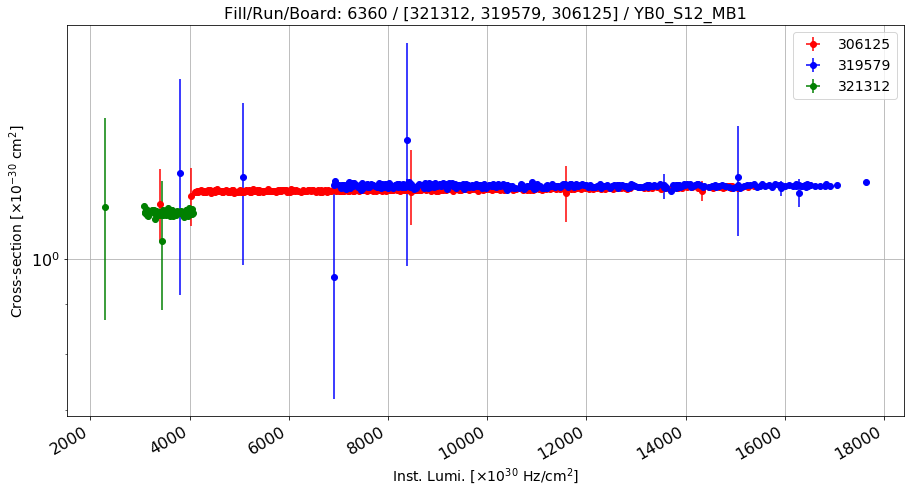

Anomalous CS: 1.17938859876 , Normal CS: 1.18859034777 , Ratio: 0.00774173291332


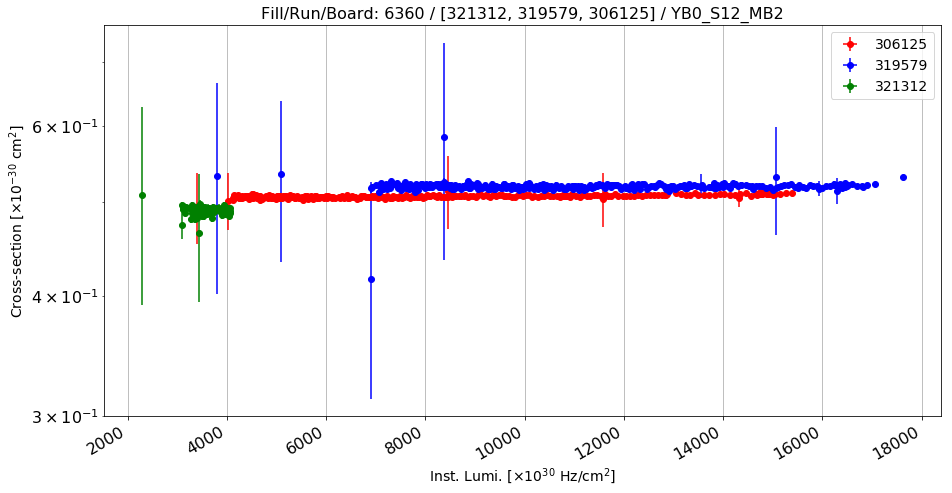

Anomalous CS: 0.507879132056 , Normal CS: 0.519457880782 , Ratio: 0.0222900626873


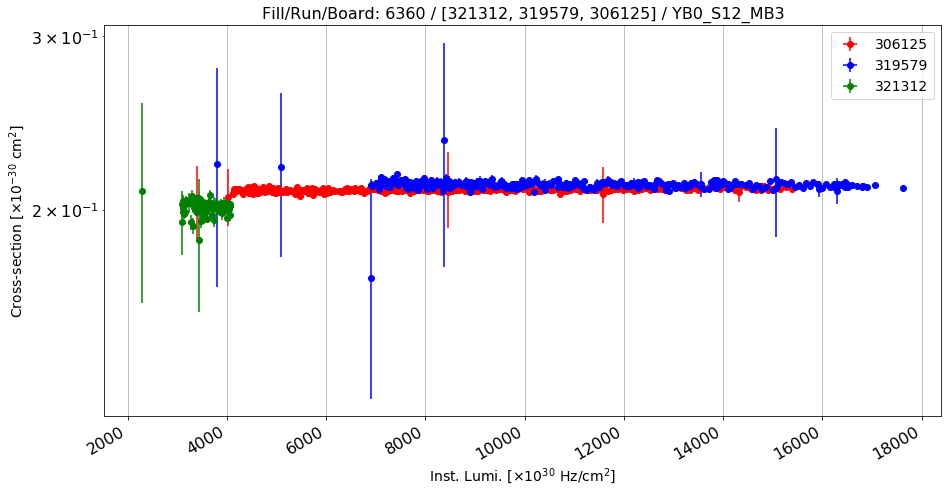

Anomalous CS: 0.209853563675 , Normal CS: 0.212194509717 , Ratio: 0.0110320763962


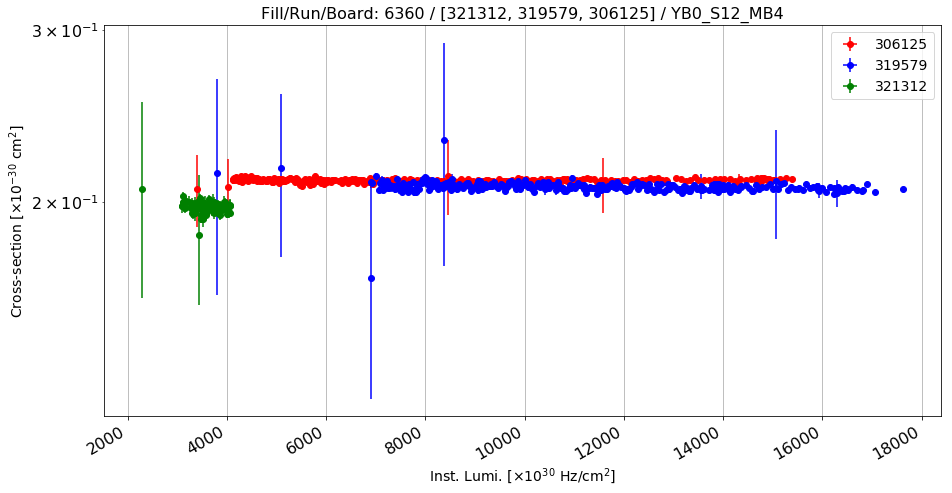

Anomalous CS: 0.210549665495 , Normal CS: 0.207062365591 , Ratio: -0.0168417852944


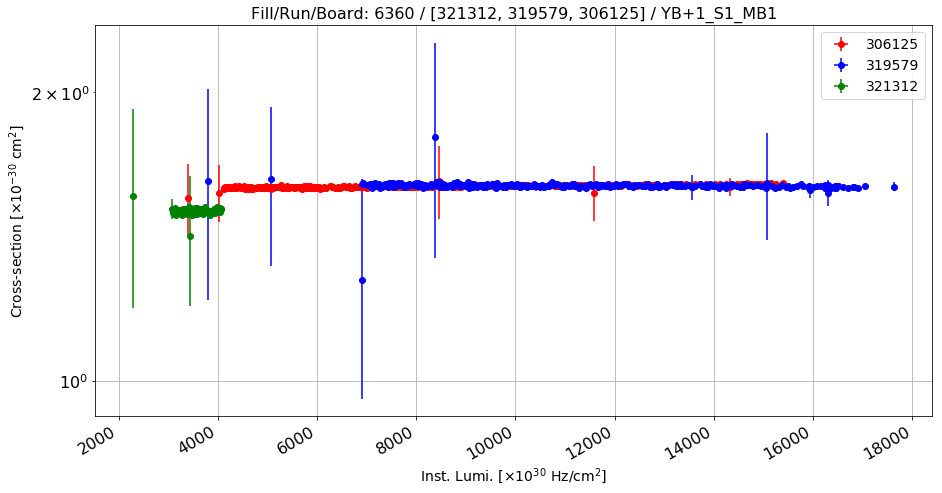

Anomalous CS: 1.59832813267 , Normal CS: 1.59768836567 , Ratio: -0.000400432911994


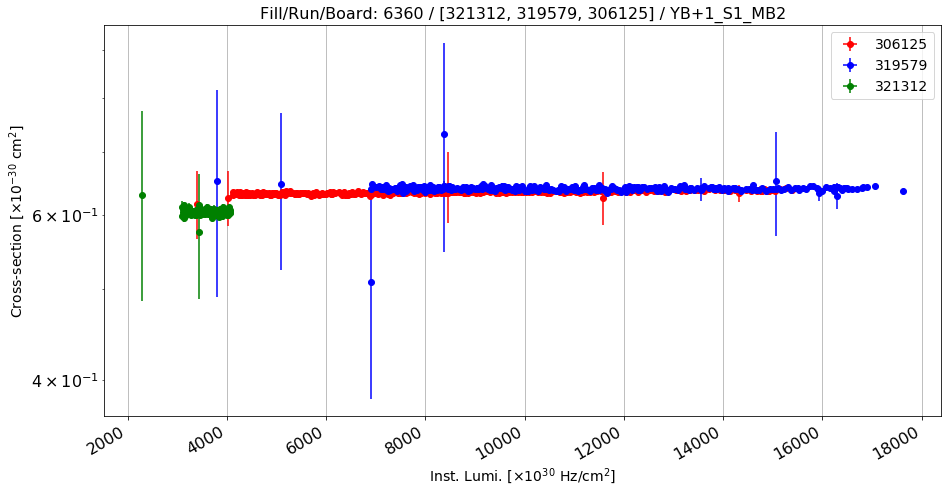

Anomalous CS: 0.634848142154 , Normal CS: 0.639769265151 , Ratio: 0.00769202783737


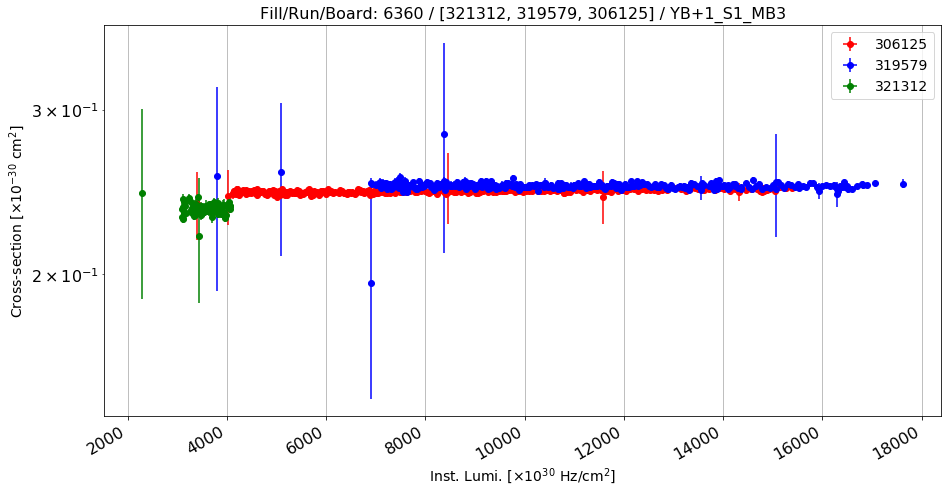

Anomalous CS: 0.245791037076 , Normal CS: 0.248742997947 , Ratio: 0.0118675134377


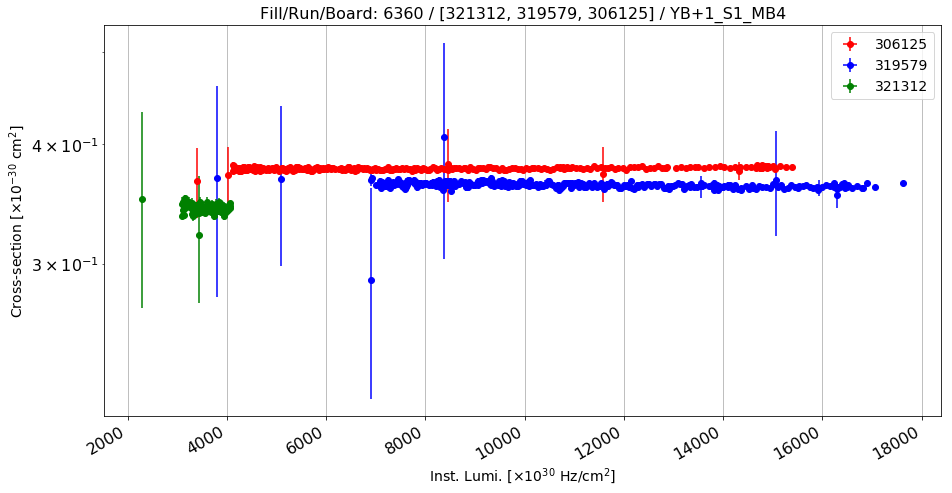

Anomalous CS: 0.37770029455 , Normal CS: 0.361997846595 , Ratio: -0.043377186087


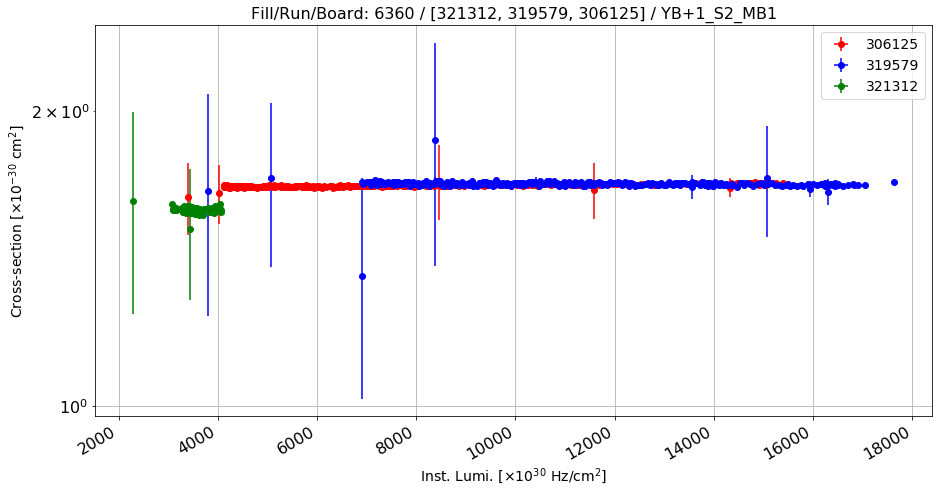

Anomalous CS: 1.67945501433 , Normal CS: 1.682831914 , Ratio: 0.00200667674164


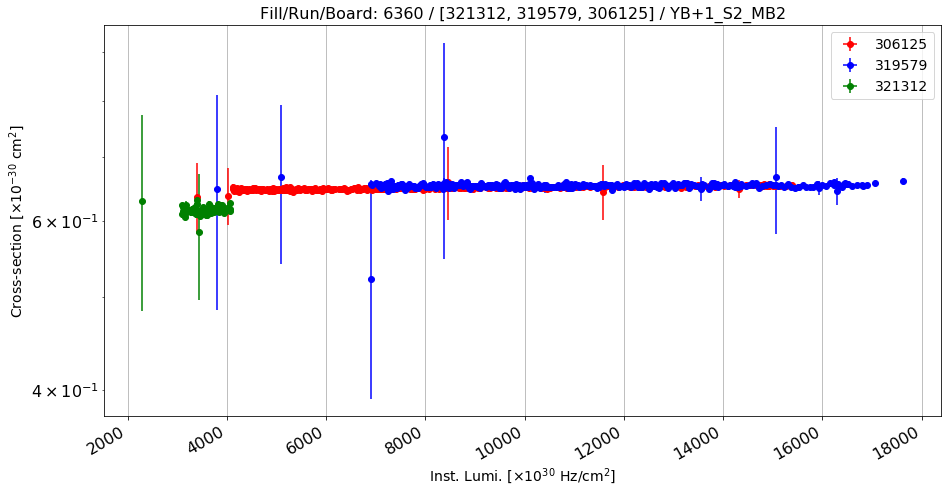

Anomalous CS: 0.650740019374 , Normal CS: 0.653855002605 , Ratio: 0.00476402752759


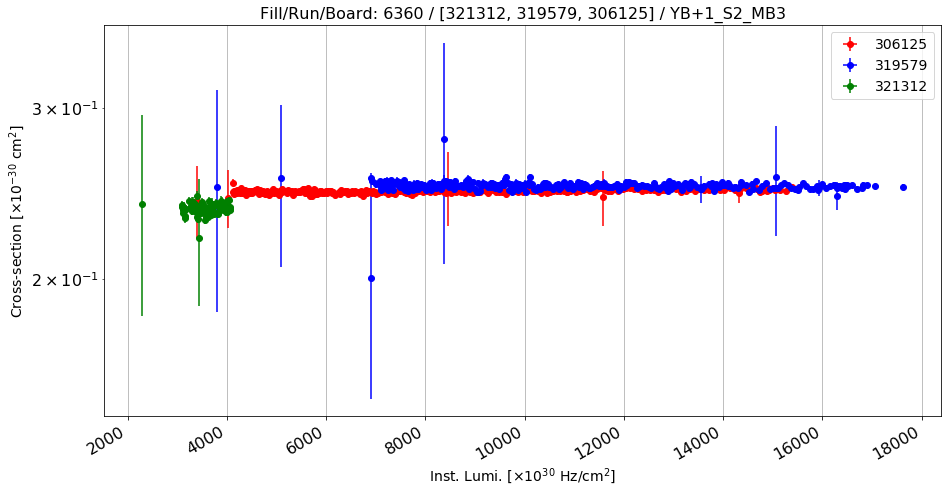

Anomalous CS: 0.246359390243 , Normal CS: 0.249273680156 , Ratio: 0.0116911256386


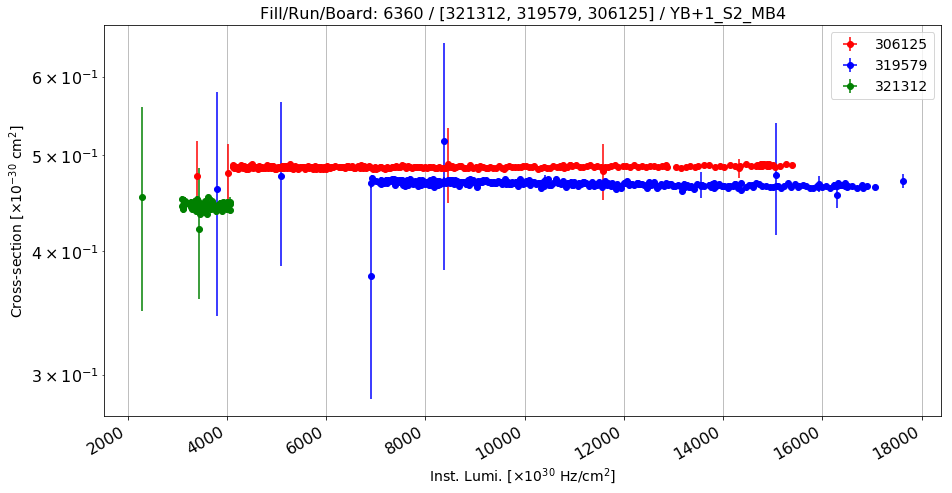

Anomalous CS: 0.487127133519 , Normal CS: 0.467026680916 , Ratio: -0.0430391954538


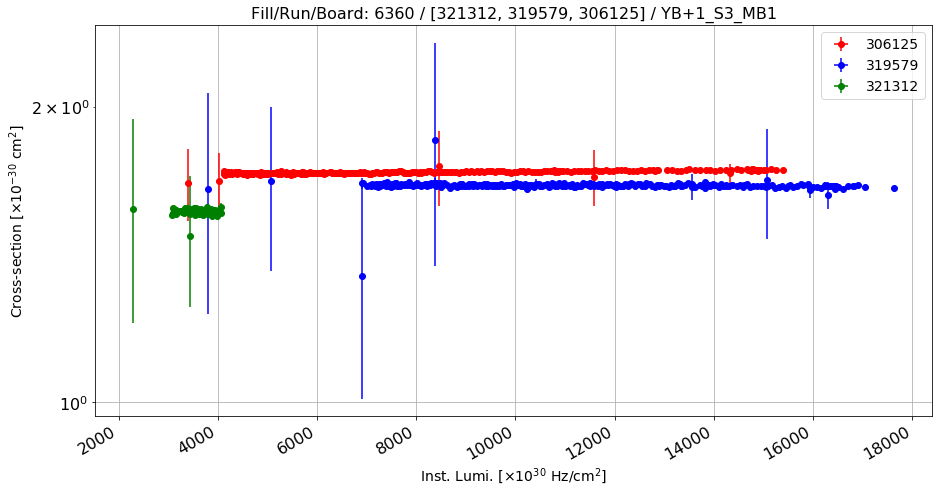

Anomalous CS: 1.7195486583 , Normal CS: 1.66379529471 , Ratio: -0.0335097495287


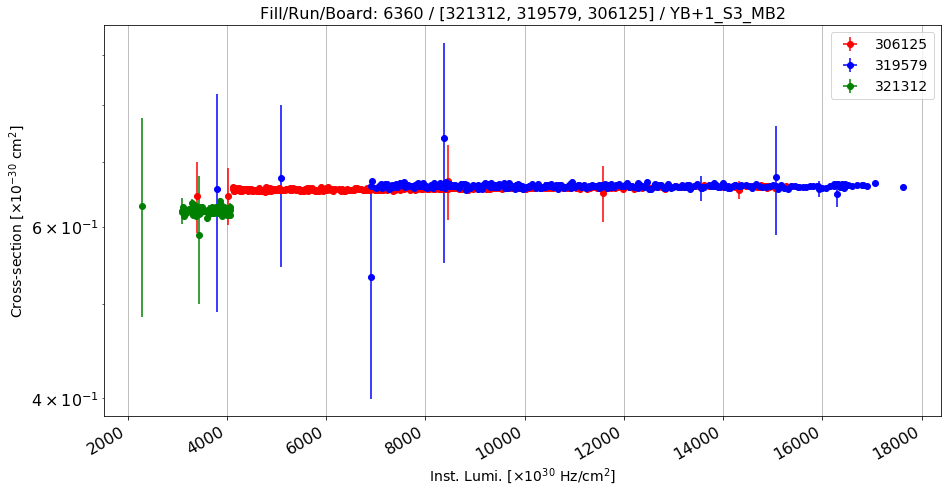

Anomalous CS: 0.657814185327 , Normal CS: 0.660730952289 , Ratio: 0.00441445485793


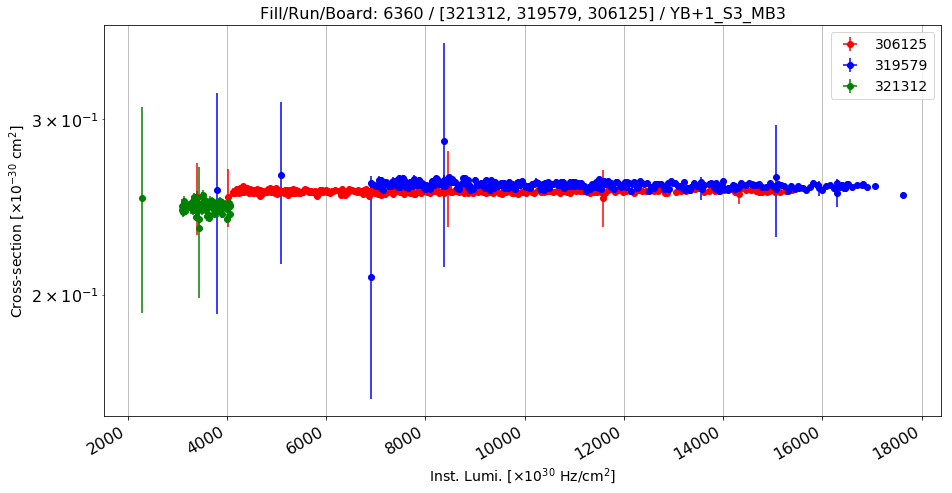

Anomalous CS: 0.253992969396 , Normal CS: 0.257440321691 , Ratio: 0.0133908793753


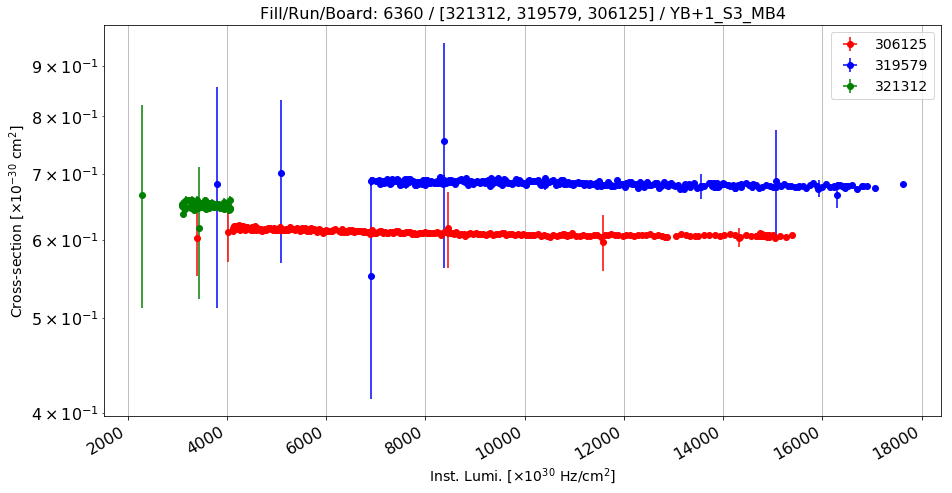

Anomalous CS: 0.607864365281 , Normal CS: 0.681973910755 , Ratio: 0.108669179723


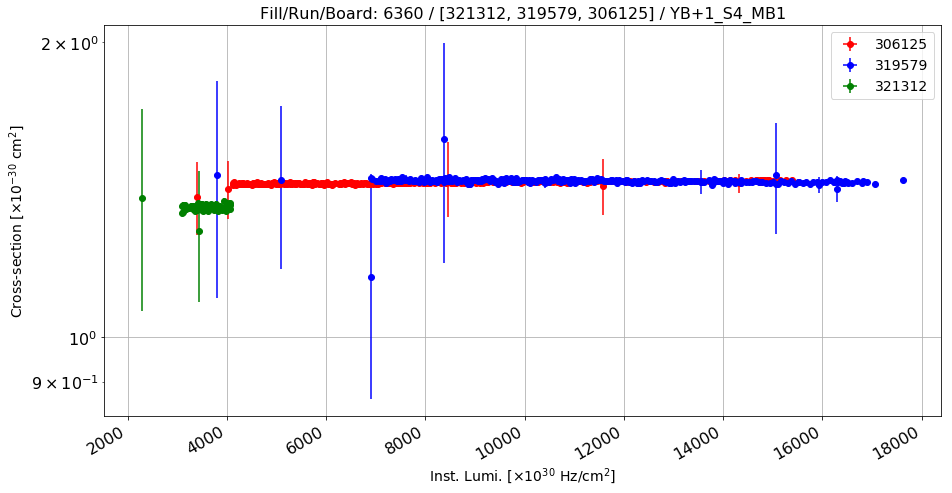

Anomalous CS: 1.44042671769 , Normal CS: 1.44292727364 , Ratio: 0.00173297434207


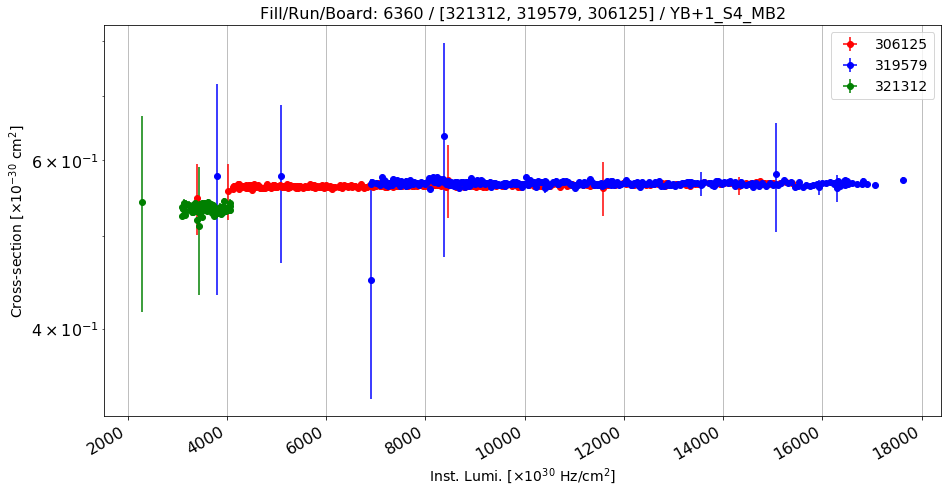

Anomalous CS: 0.565521862974 , Normal CS: 0.567607794602 , Ratio: 0.00367495240206


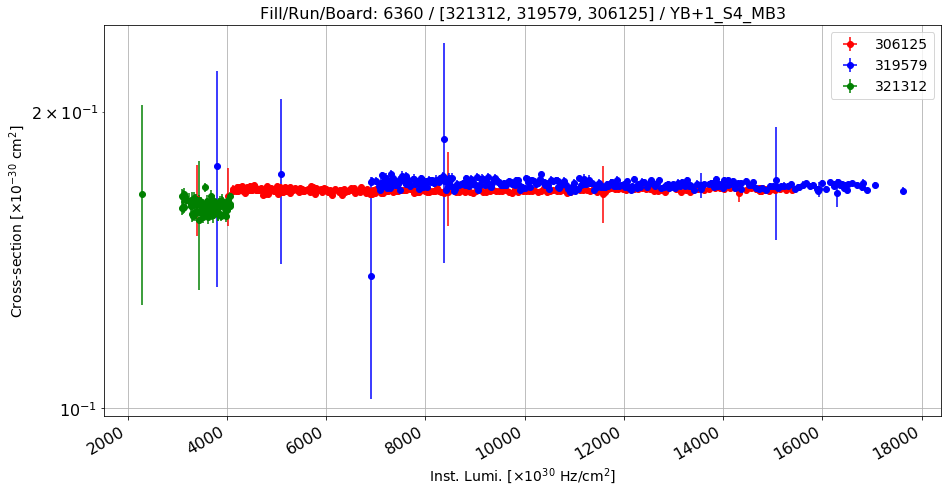

Anomalous CS: 0.166404796289 , Normal CS: 0.168554098919 , Ratio: 0.0127514112274


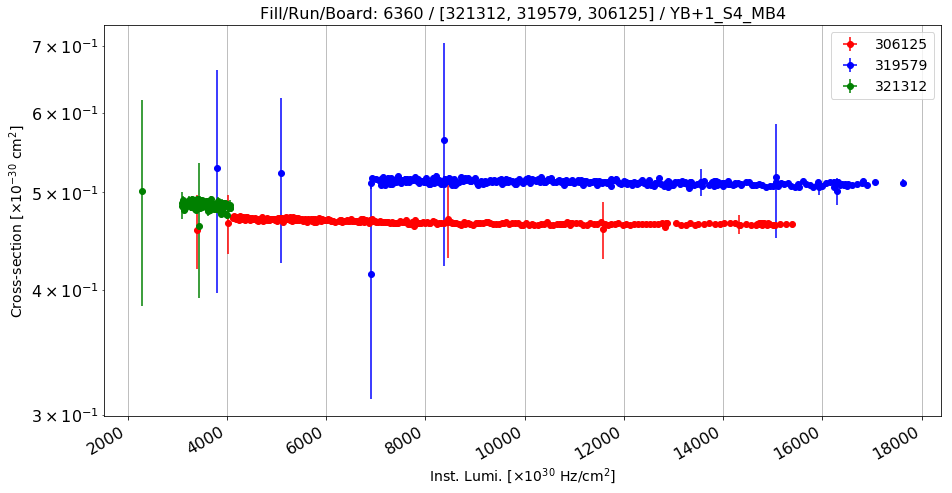

Anomalous CS: 0.466109352709 , Normal CS: 0.511206109981 , Ratio: 0.0882163894209


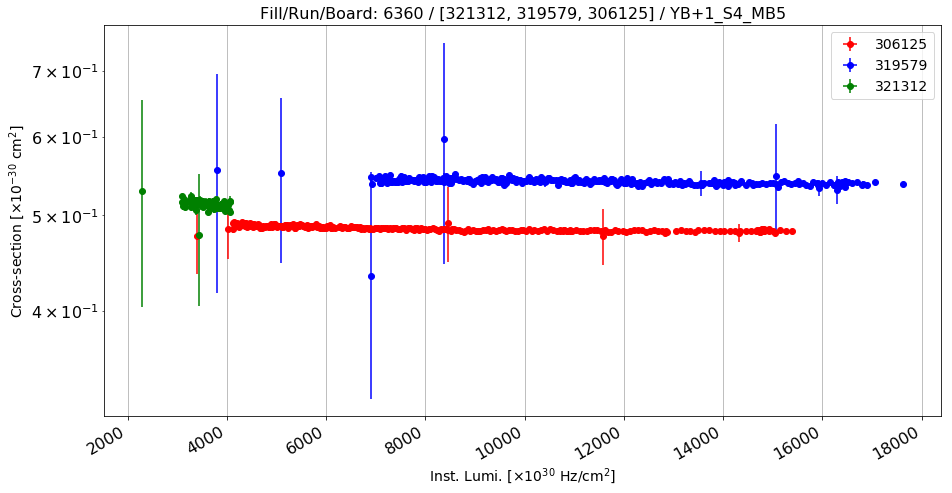

Anomalous CS: 0.483508190929 , Normal CS: 0.540014722458 , Ratio: 0.104638872199


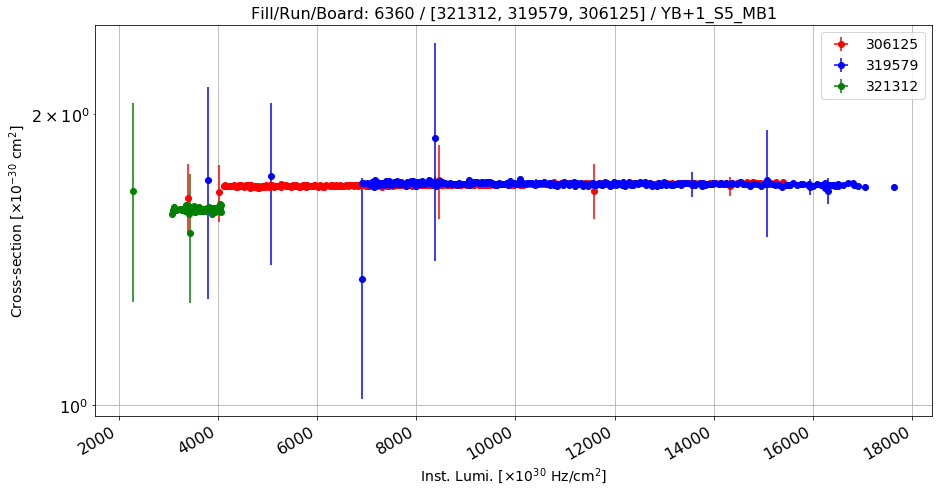

Anomalous CS: 1.69342406548 , Normal CS: 1.69431654219 , Ratio: 0.000526747322577


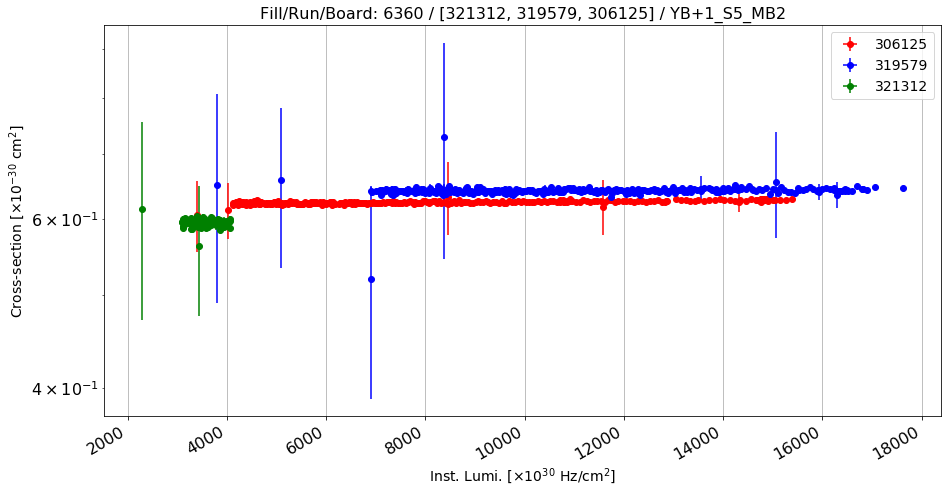

Anomalous CS: 0.624837679248 , Normal CS: 0.642074052141 , Ratio: 0.02684483641


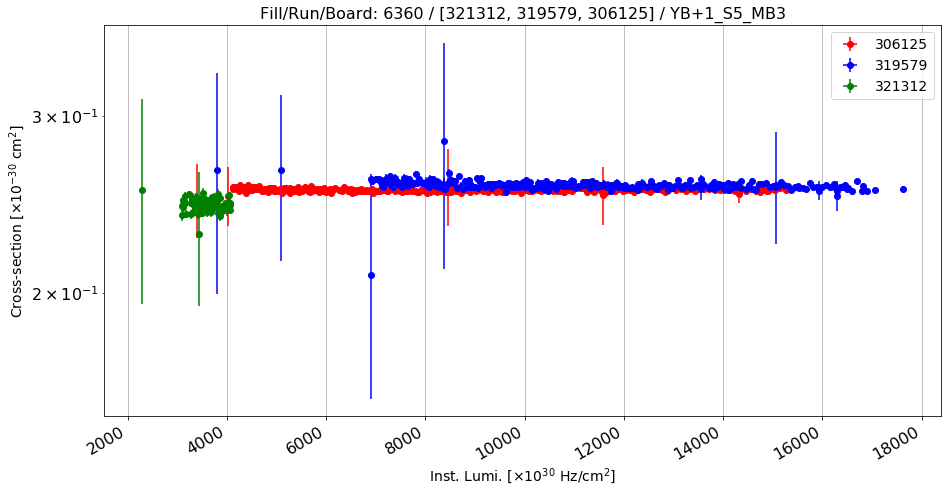

Anomalous CS: 0.252961511206 , Normal CS: 0.255460533881 , Ratio: 0.009782421718


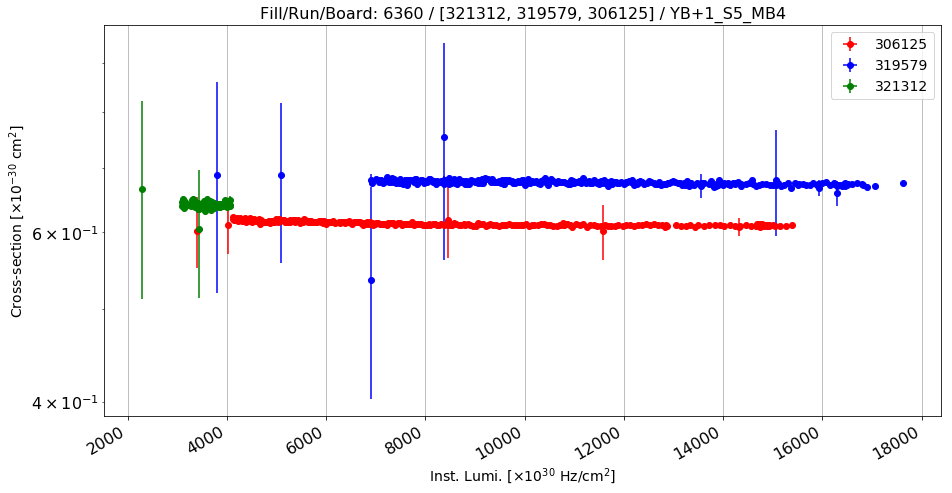

Anomalous CS: 0.611506718258 , Normal CS: 0.675083811279 , Ratio: 0.0941765925348


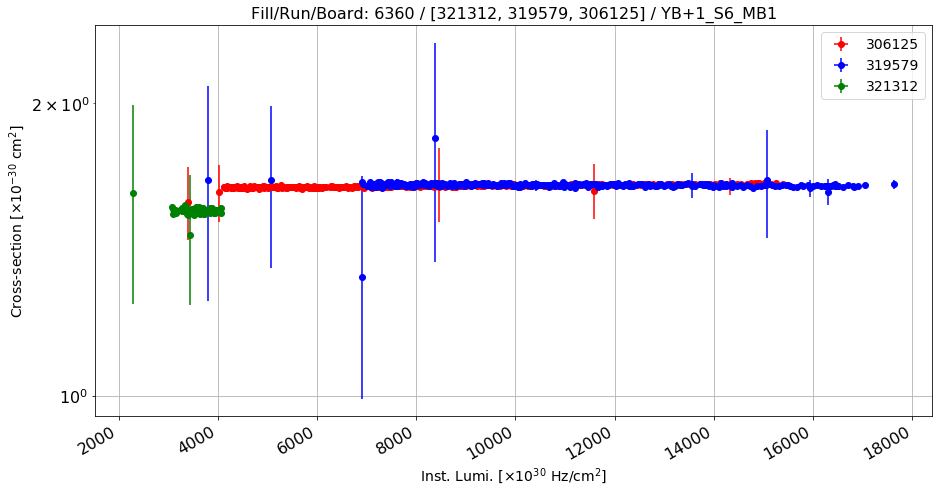

Anomalous CS: 1.64611826051 , Normal CS: 1.64717784337 , Ratio: 0.000643271681915


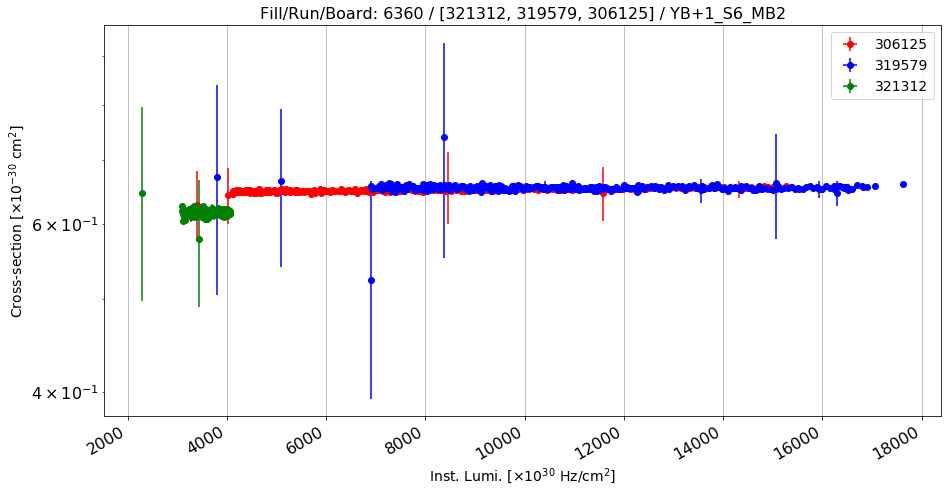

Anomalous CS: 0.652325824748 , Normal CS: 0.654786355436 , Ratio: 0.00375776108913


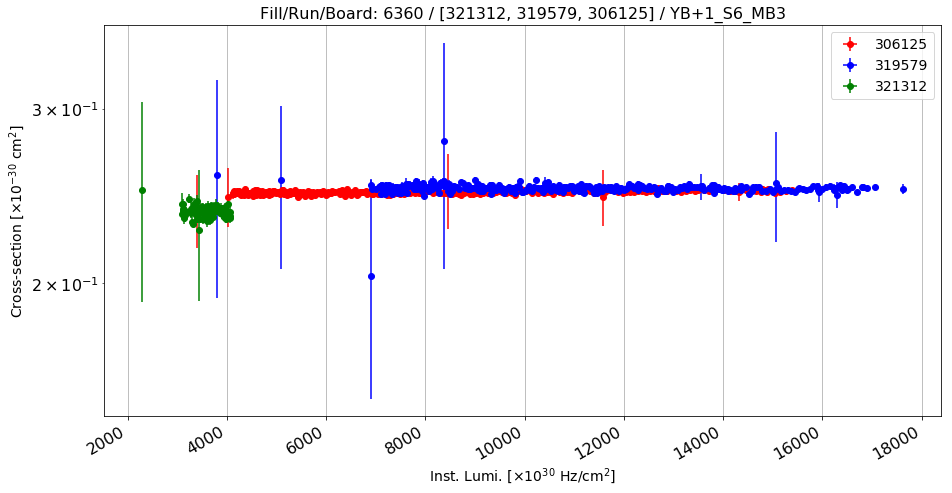

Anomalous CS: 0.247433081336 , Normal CS: 0.249422862909 , Ratio: 0.00797754283364


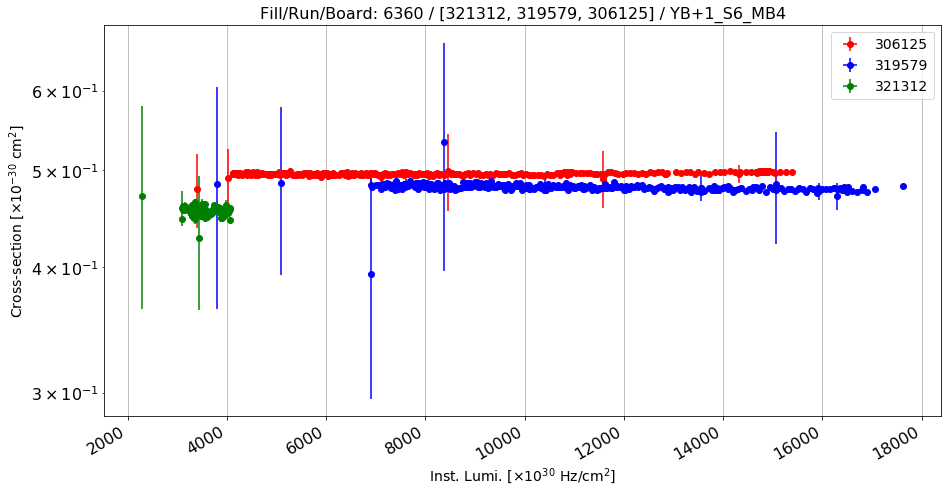

Anomalous CS: 0.496548980052 , Normal CS: 0.480017758548 , Ratio: -0.0344387706694


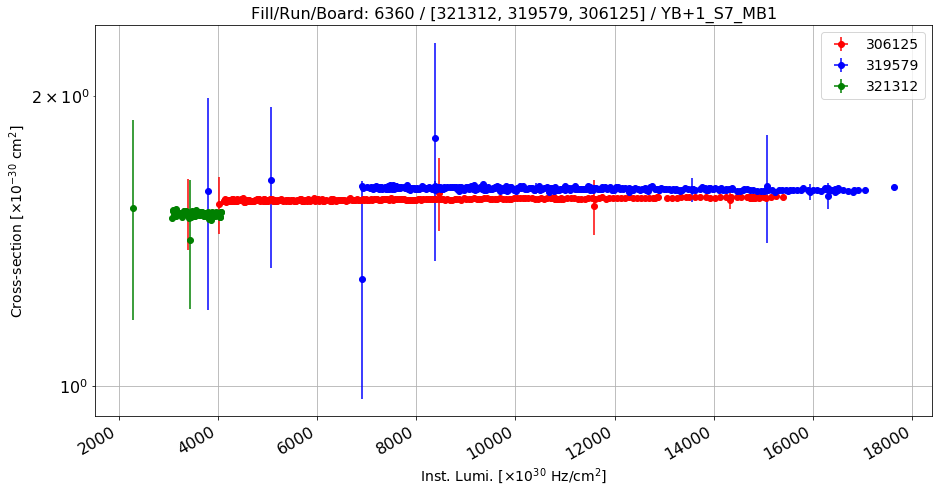

Anomalous CS: 1.56562736501 , Normal CS: 1.60169557906 , Ratio: 0.0225187698083


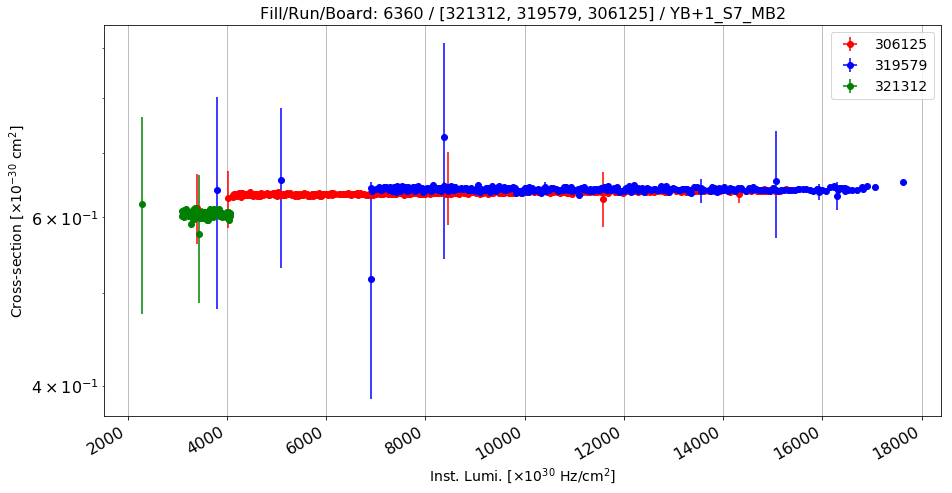

Anomalous CS: 0.636914447366 , Normal CS: 0.641873034958 , Ratio: 0.00772518445486


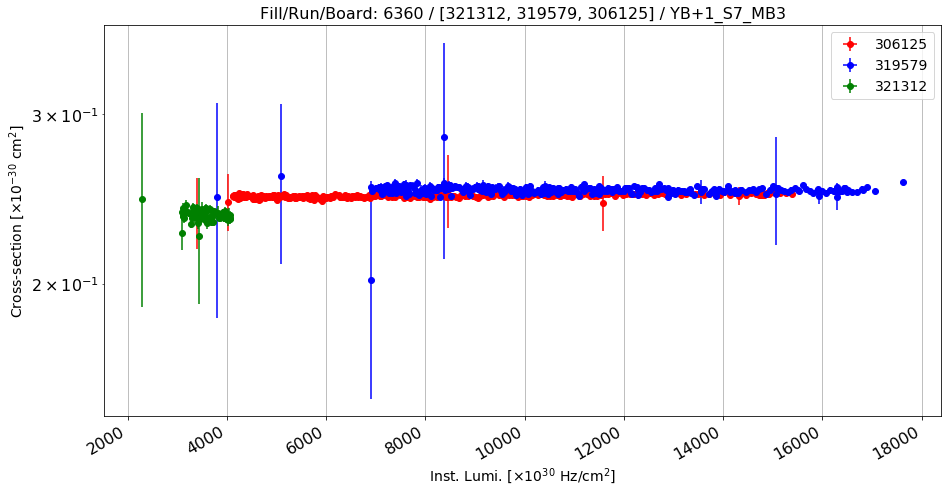

Anomalous CS: 0.247282593366 , Normal CS: 0.250232990076 , Ratio: 0.0117905984705


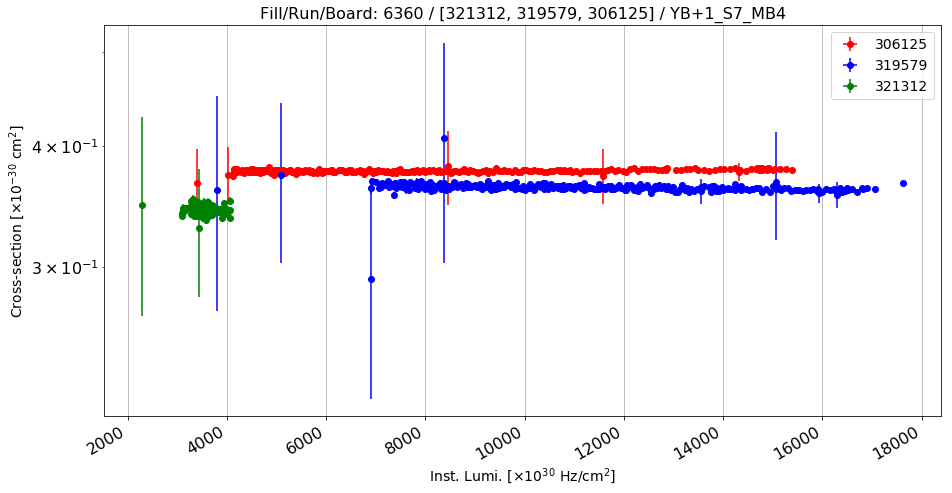

Anomalous CS: 0.377238138521 , Normal CS: 0.361790271485 , Ratio: -0.0426984036158


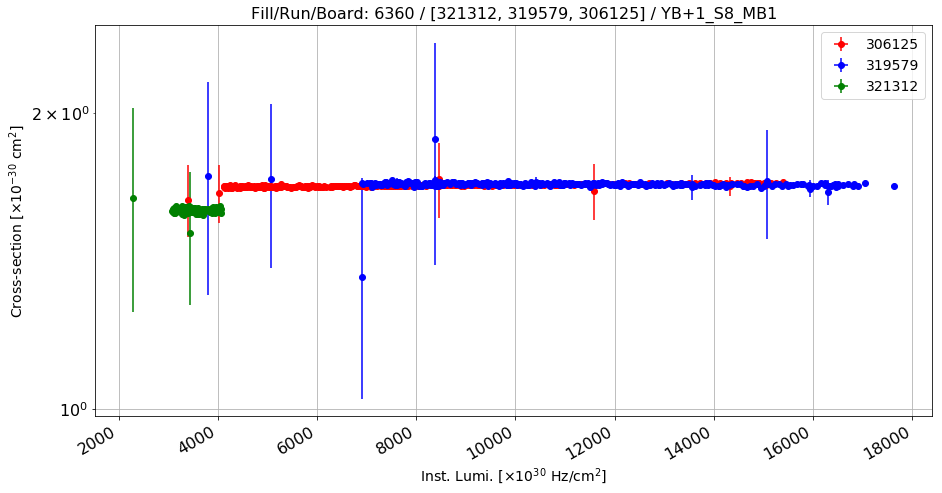

Anomalous CS: 1.69051522874 , Normal CS: 1.69152160551 , Ratio: 0.000594953537993


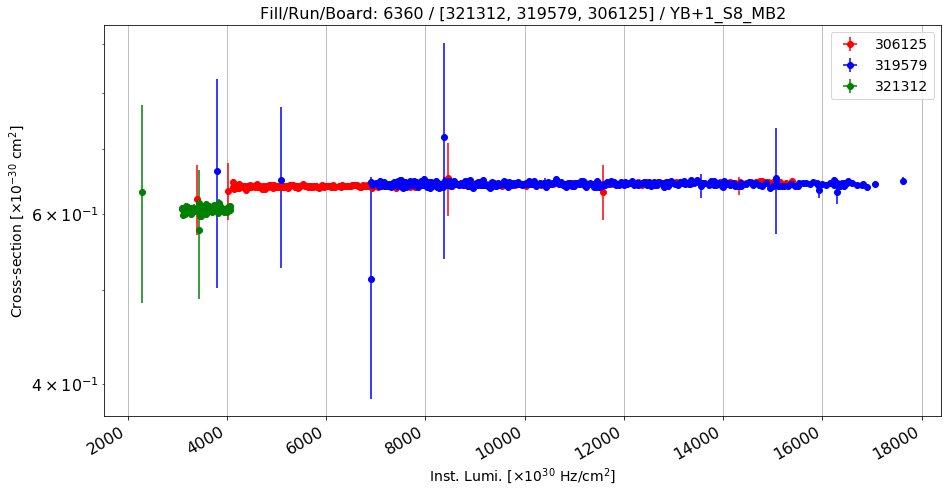

Anomalous CS: 0.64377928372 , Normal CS: 0.644505074649 , Ratio: 0.00112612135686


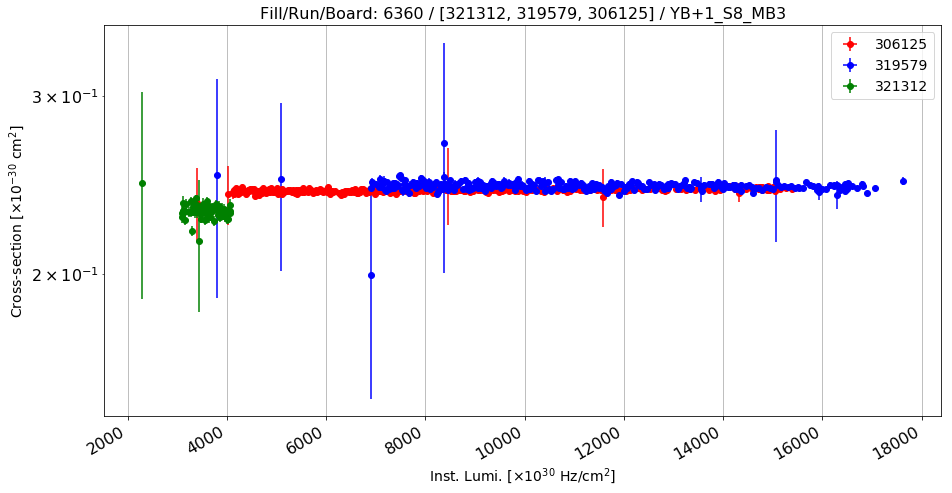

Anomalous CS: 0.242018642409 , Normal CS: 0.244097187314 , Ratio: 0.00851523496853


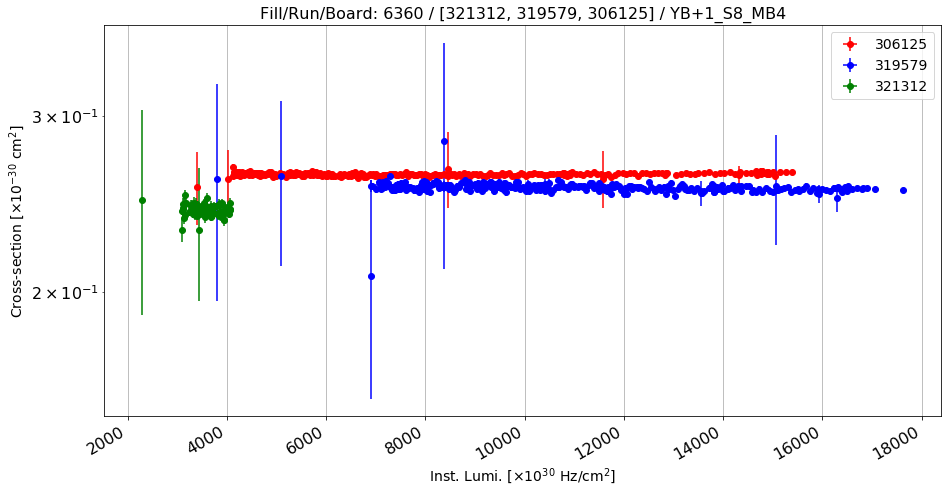

Anomalous CS: 0.262491693895 , Normal CS: 0.254096085009 , Ratio: -0.0330410792666


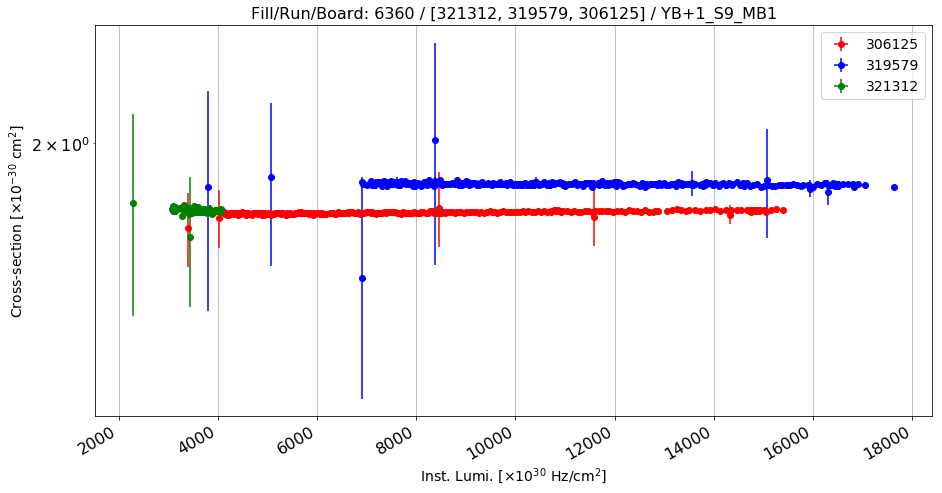

Anomalous CS: 1.70373796636 , Normal CS: 1.81731557027 , Ratio: 0.0624974582119


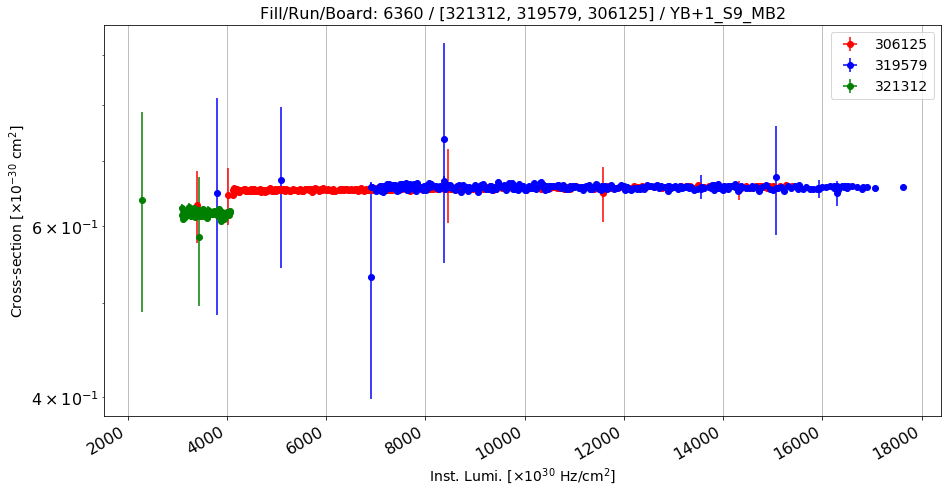

Anomalous CS: 0.65685052904 , Normal CS: 0.658076988776 , Ratio: 0.00186370250947


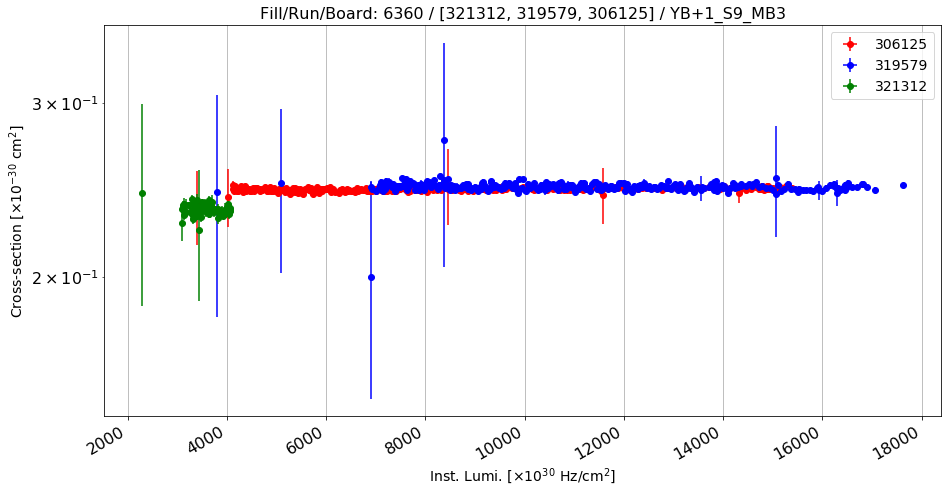

Anomalous CS: 0.245487133991 , Normal CS: 0.246592536023 , Ratio: 0.00448270677401


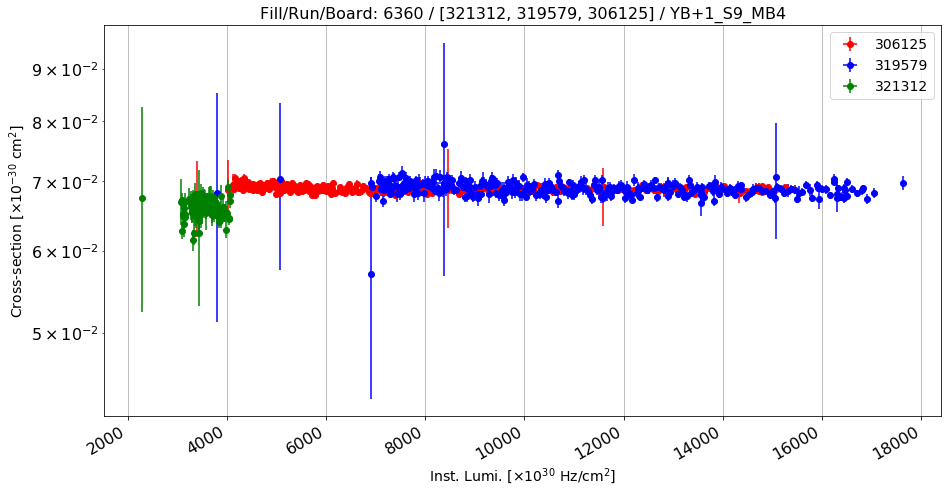

Anomalous CS: 0.0687673836777 , Normal CS: 0.0686881210982 , Ratio: -0.00115394886592


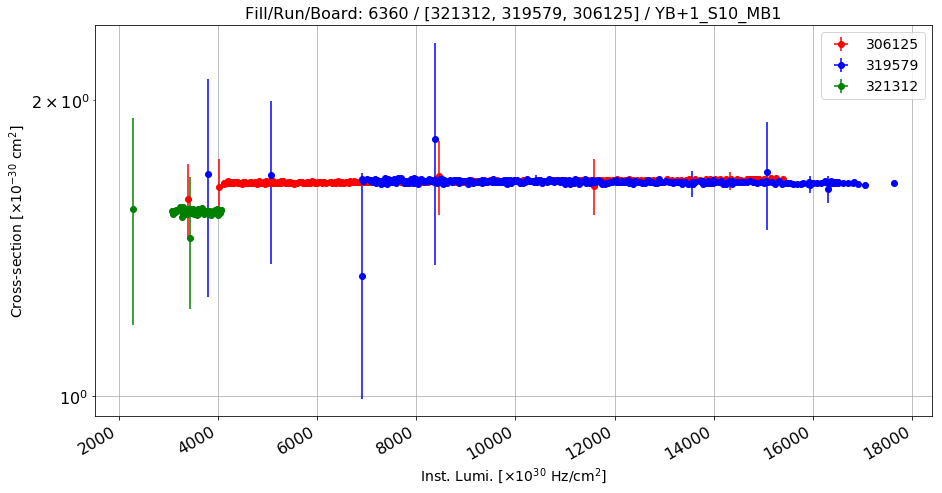

Anomalous CS: 1.65652604423 , Normal CS: 1.65176268738 , Ratio: -0.00288380218931


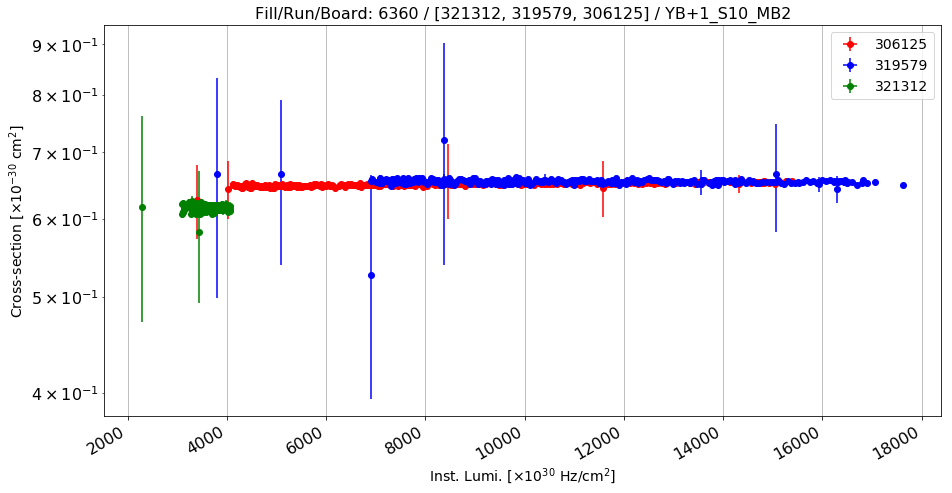

Anomalous CS: 0.650629042473 , Normal CS: 0.653957840761 , Ratio: 0.00509023377405


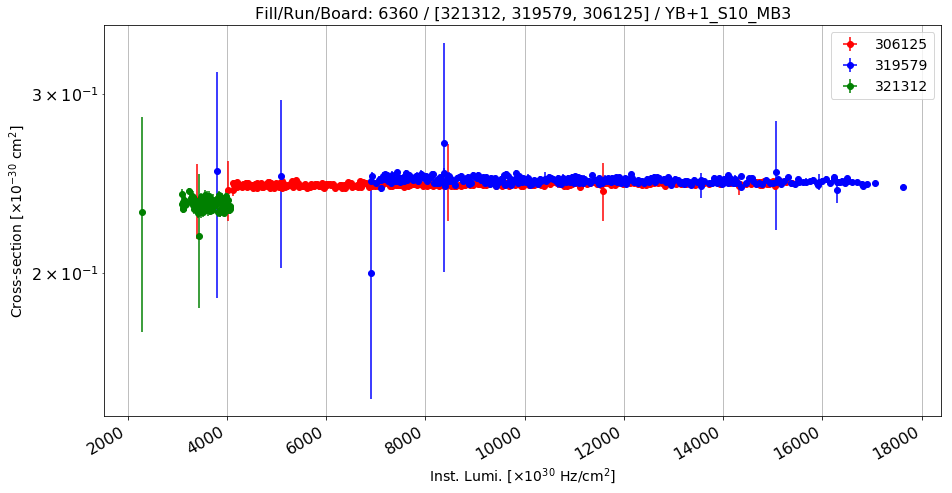

Anomalous CS: 0.244502915233 , Normal CS: 0.246336675116 , Ratio: 0.00744412045729


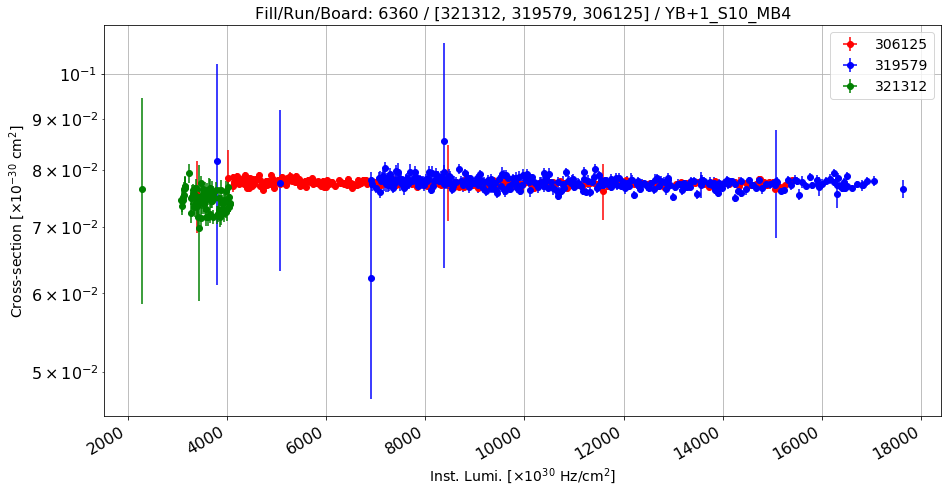

Anomalous CS: 0.0774693334196 , Normal CS: 0.0773789349312 , Ratio: -0.00116825707714


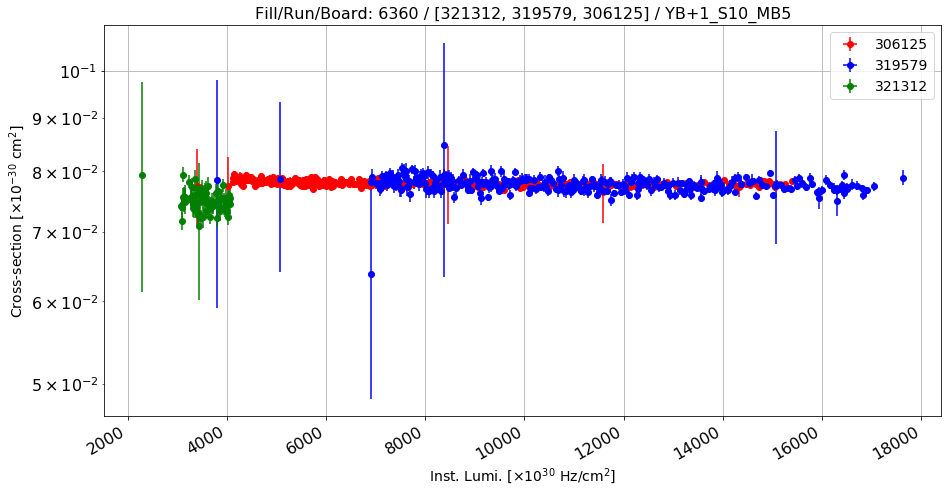

Anomalous CS: 0.0778271327225 , Normal CS: 0.0774898525394 , Ratio: -0.00435257226722


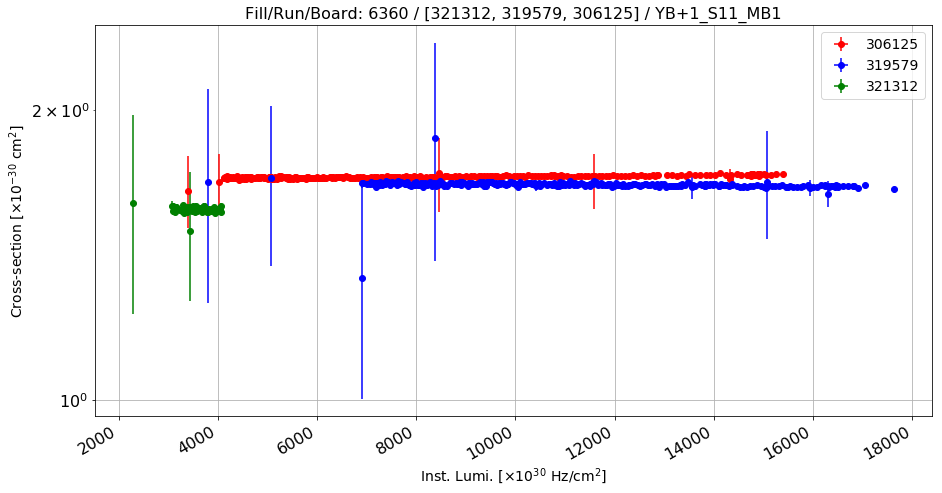

Anomalous CS: 1.70676608845 , Normal CS: 1.67096709006 , Ratio: -0.0214241193619


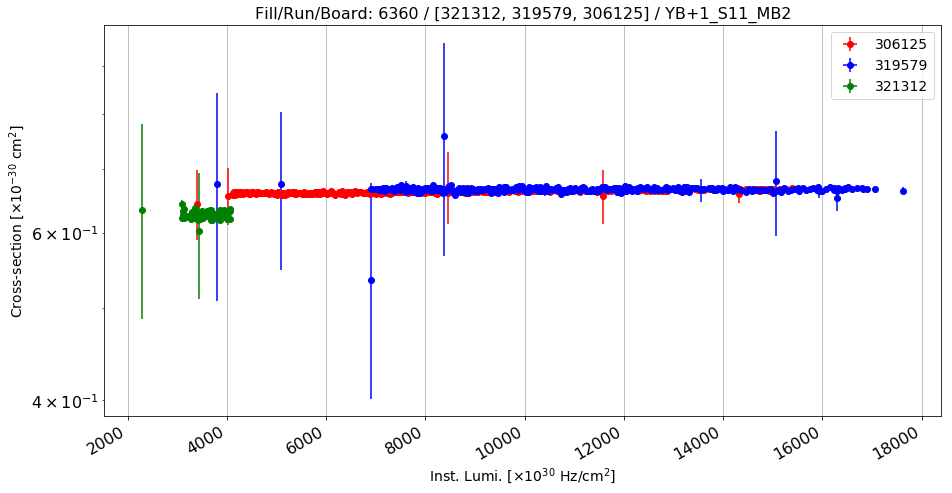

Anomalous CS: 0.663940409746 , Normal CS: 0.667097592029 , Ratio: 0.00473271425505


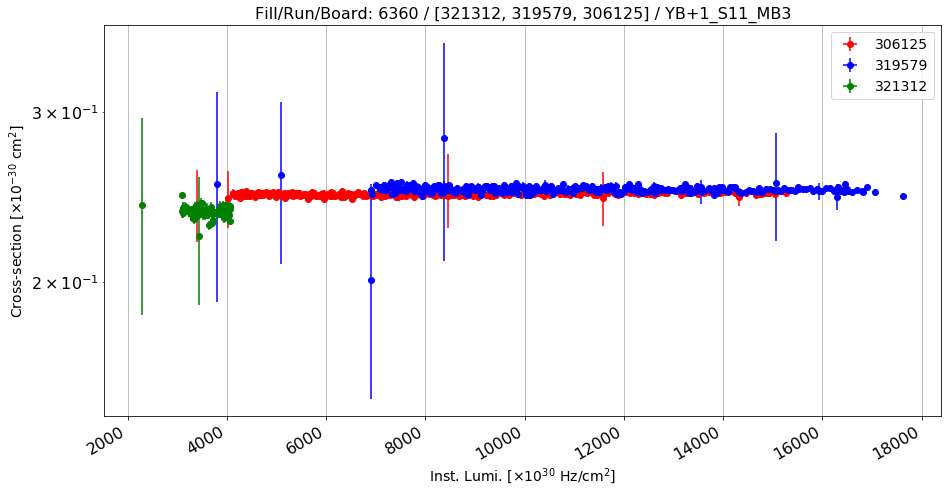

Anomalous CS: 0.246897082512 , Normal CS: 0.249459587485 , Ratio: 0.0102722248481


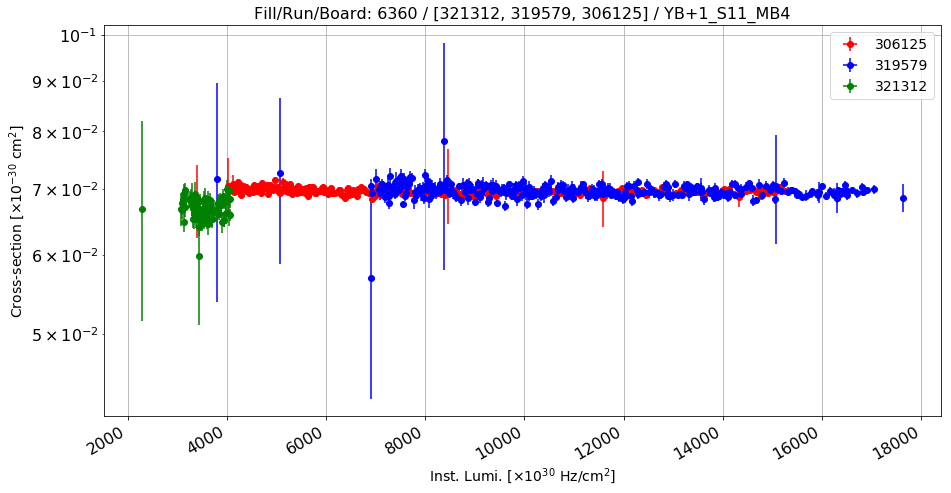

Anomalous CS: 0.0694873625981 , Normal CS: 0.0695432168628 , Ratio: 0.000803159059876


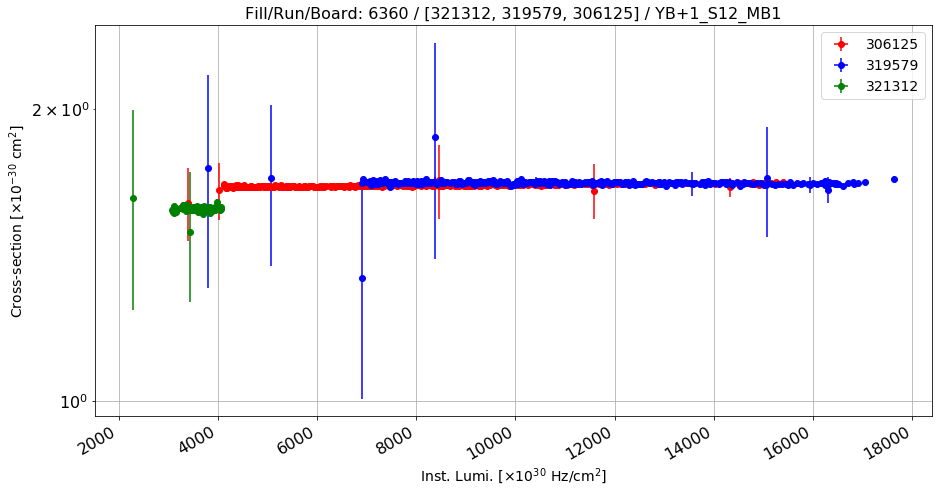

Anomalous CS: 1.66978640789 , Normal CS: 1.6773689973 , Ratio: 0.00452052554817


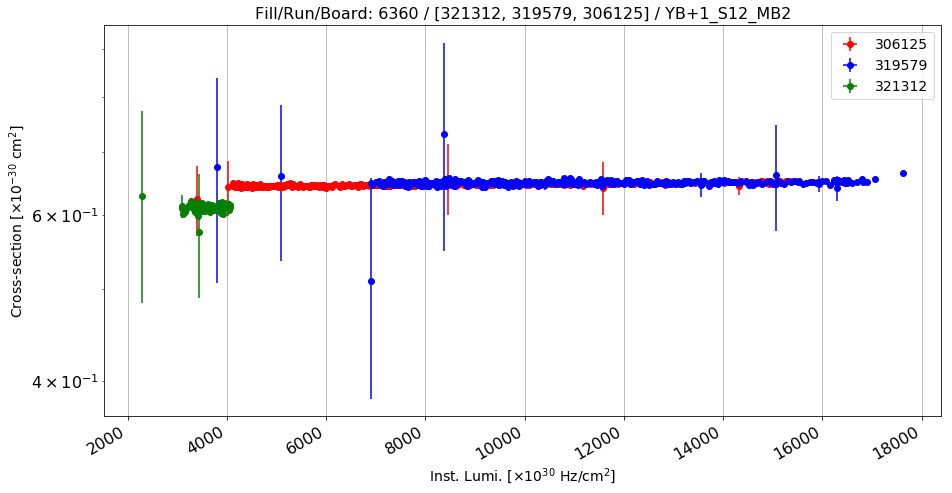

Anomalous CS: 0.647190266614 , Normal CS: 0.649826764326 , Ratio: 0.00405723164493


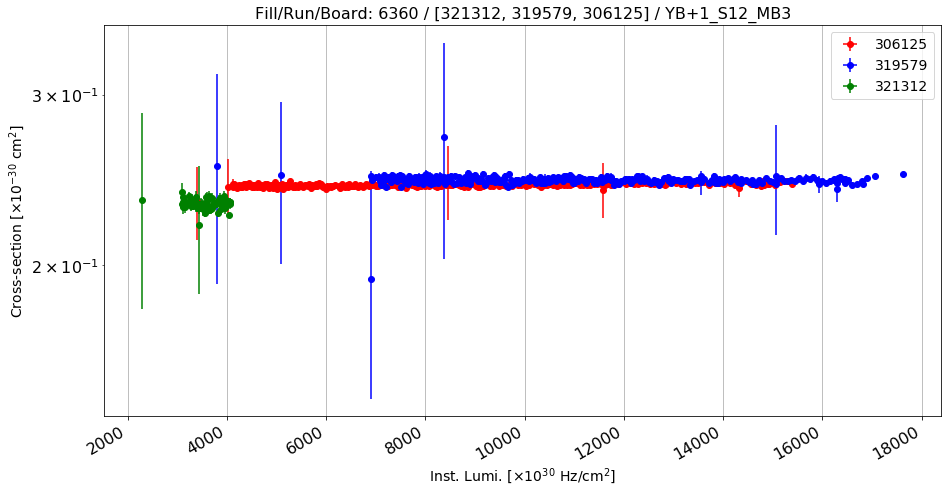

Anomalous CS: 0.242235687831 , Normal CS: 0.244842324628 , Ratio: 0.0106461854621


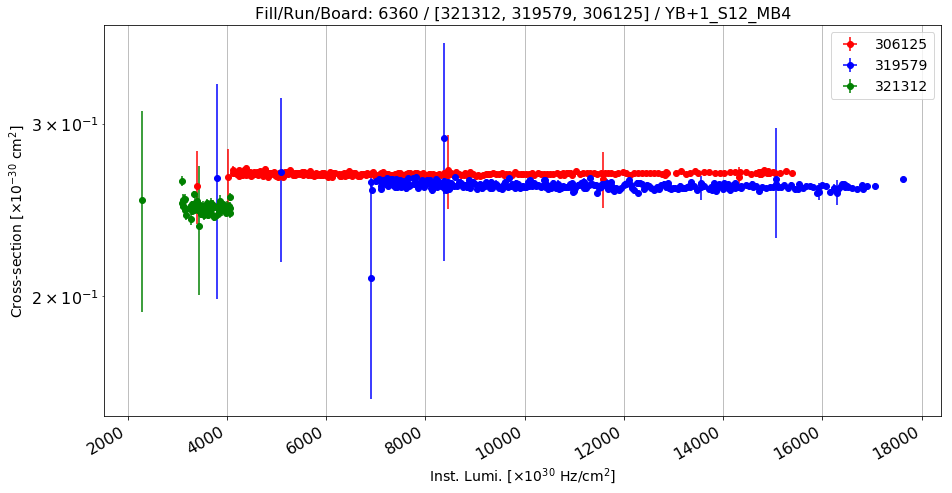

Anomalous CS: 0.266737811667 , Normal CS: 0.258926070815 , Ratio: -0.0301697732754


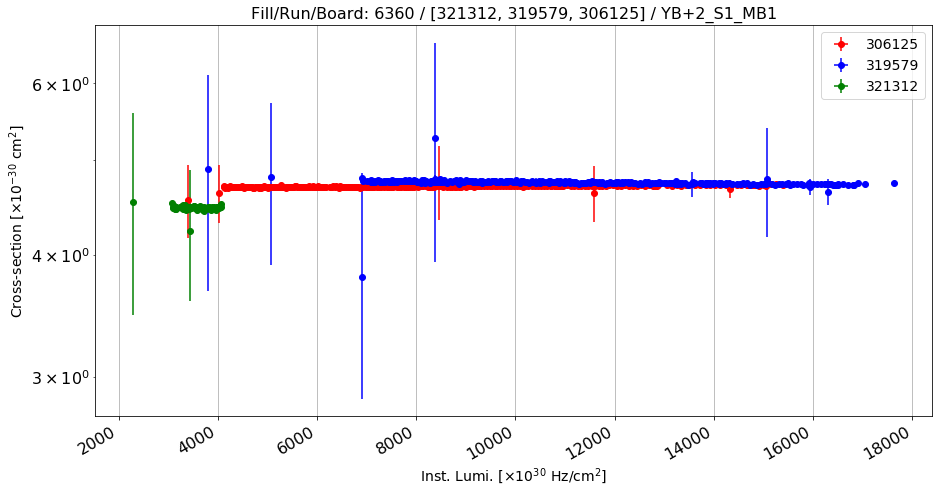

Anomalous CS: 4.70548379802 , Normal CS: 4.73918813904 , Ratio: 0.00711183857487


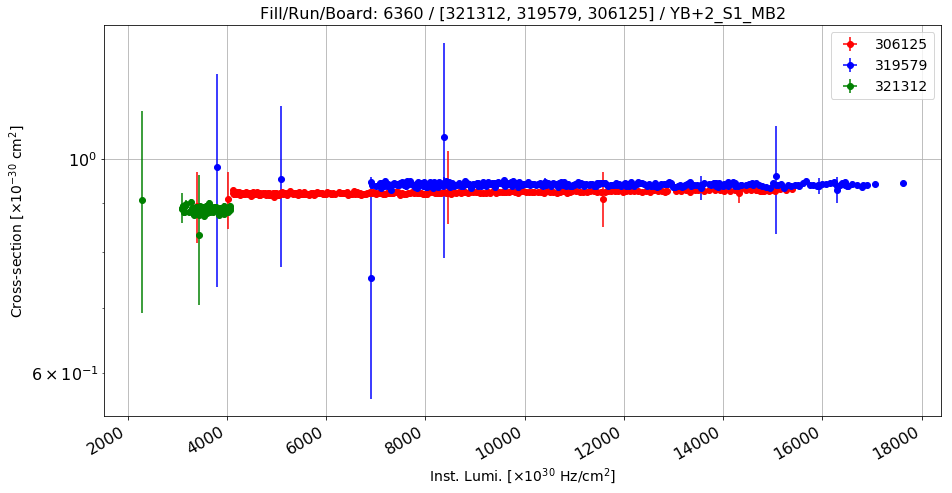

Anomalous CS: 0.923776215719 , Normal CS: 0.940358677985 , Ratio: 0.0176341885859


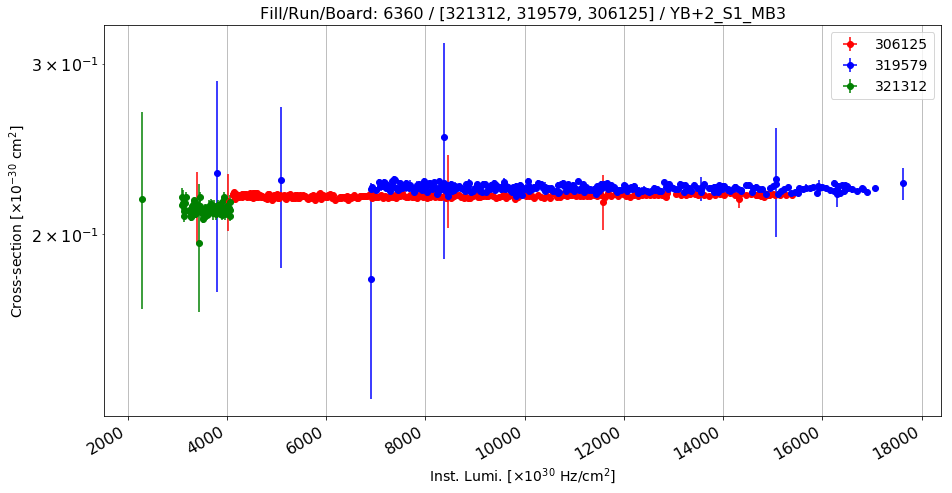

Anomalous CS: 0.219205670802 , Normal CS: 0.223207064996 , Ratio: 0.0179268259047


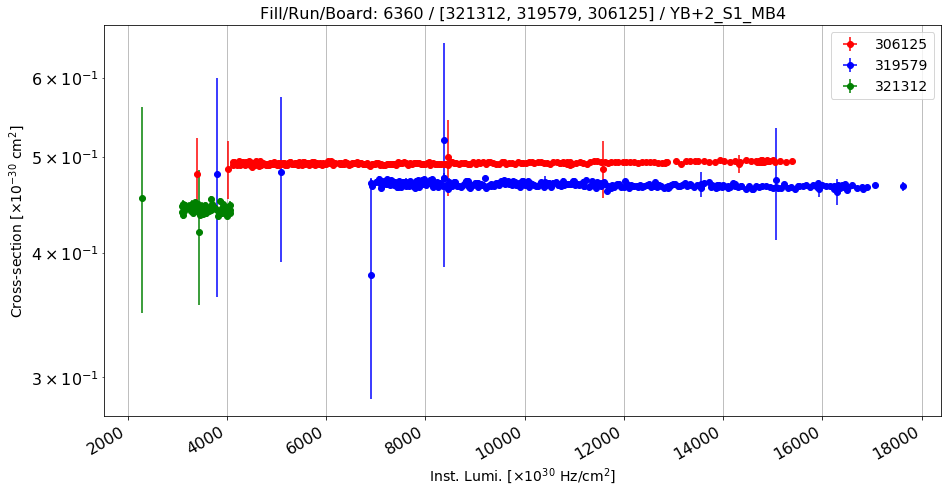

Anomalous CS: 0.493266608182 , Normal CS: 0.467912294824 , Ratio: -0.0541860379376


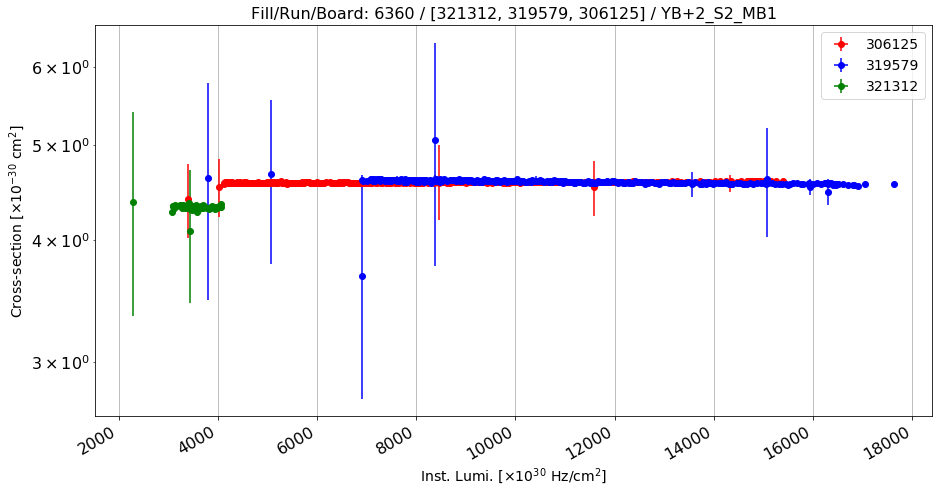

Anomalous CS: 4.5783568986 , Normal CS: 4.57294291782 , Ratio: -0.00118391610907


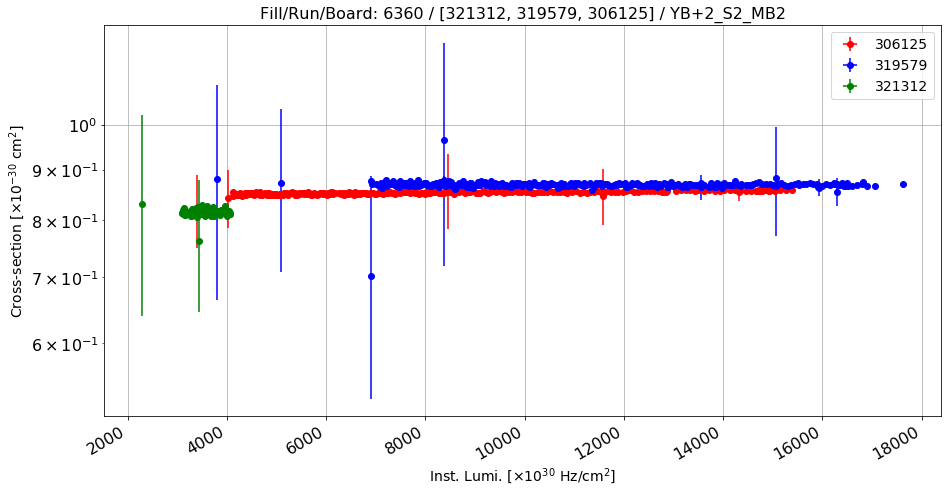

Anomalous CS: 0.855115321569 , Normal CS: 0.869735547928 , Ratio: 0.0168099675738


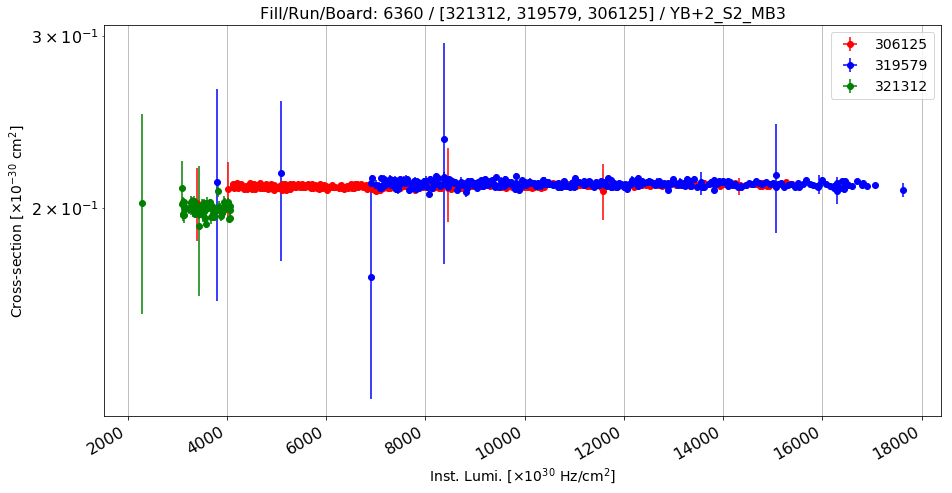

Anomalous CS: 0.210706632499 , Normal CS: 0.21167192017 , Ratio: 0.00456030100917


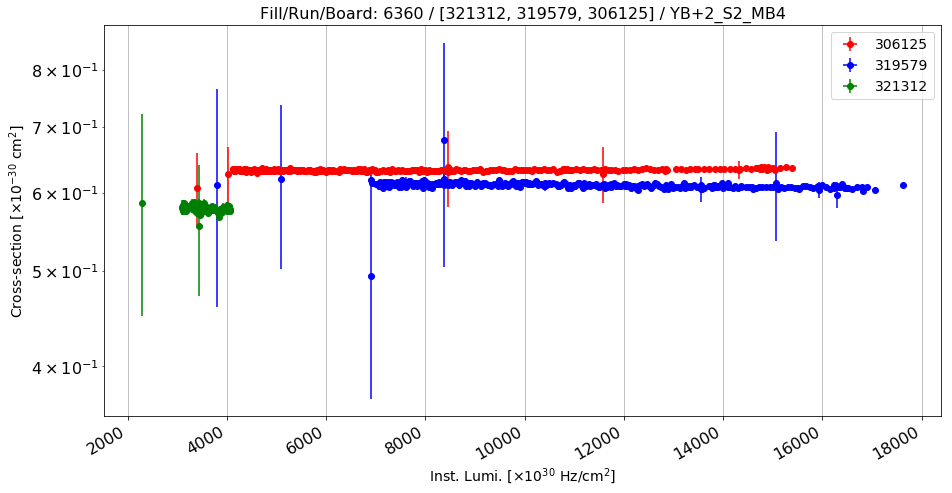

Anomalous CS: 0.633094294746 , Normal CS: 0.609612709924 , Ratio: -0.0385188570374


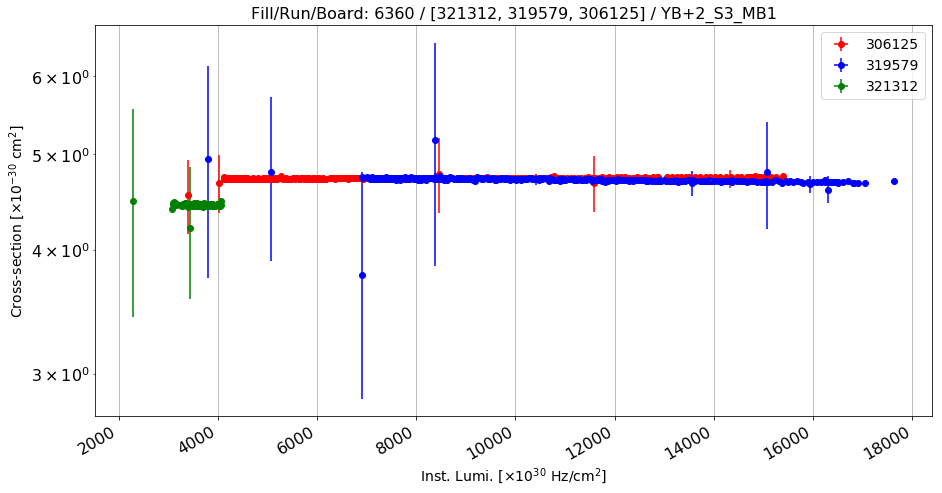

Anomalous CS: 4.73507546549 , Normal CS: 4.7047134259 , Ratio: -0.00645353645205


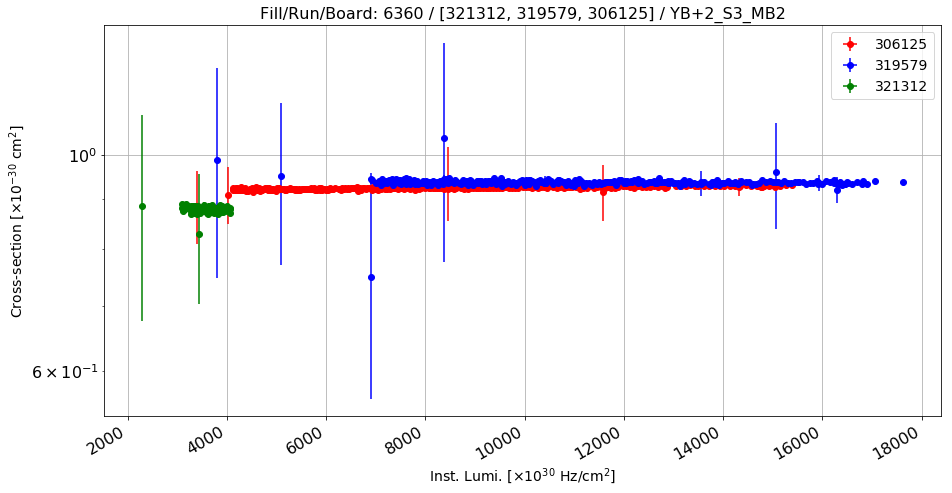

Anomalous CS: 0.925529050497 , Normal CS: 0.936372845159 , Ratio: 0.0115806376893


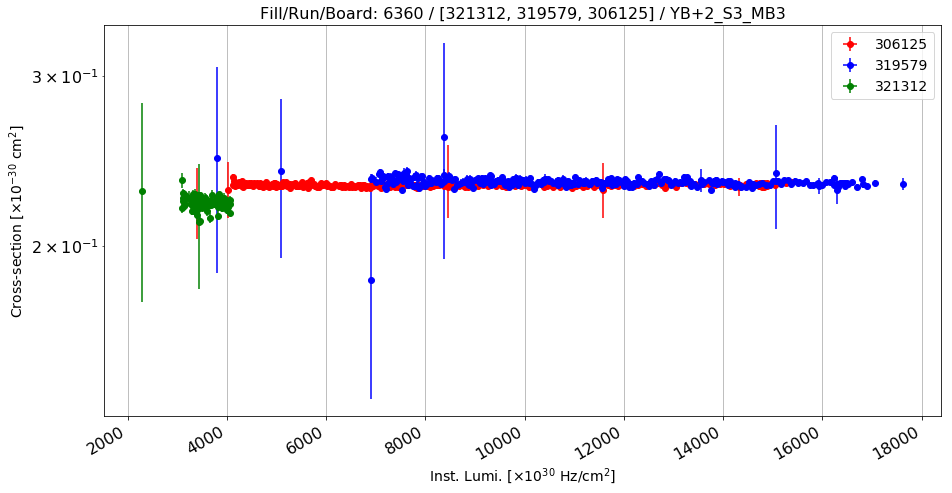

Anomalous CS: 0.231160137342 , Normal CS: 0.232660581805 , Ratio: 0.00644907036211


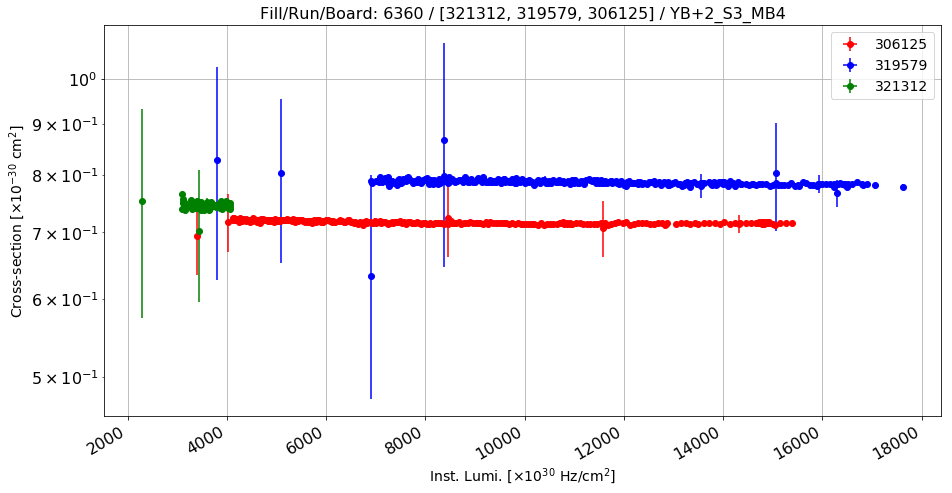

Anomalous CS: 0.715365055708 , Normal CS: 0.784881150224 , Ratio: 0.0885689438412


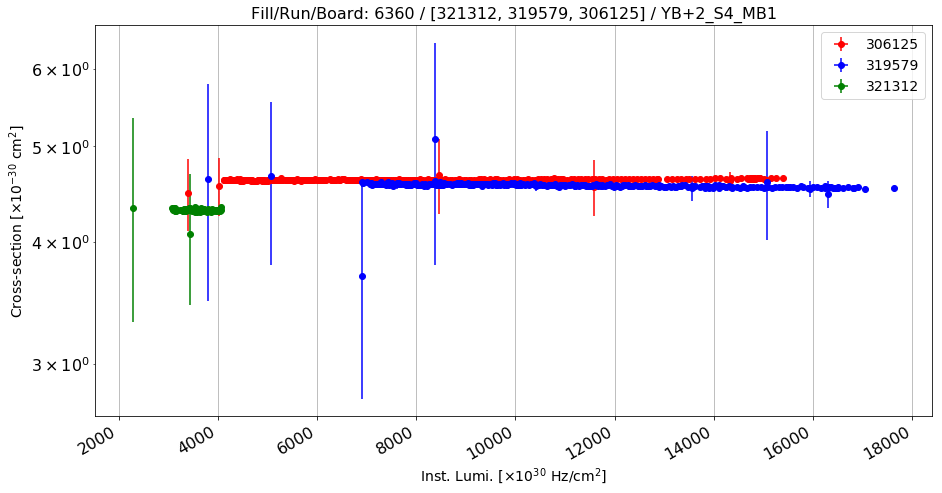

Anomalous CS: 4.62800247396 , Normal CS: 4.5559057585 , Ratio: -0.0158248917514


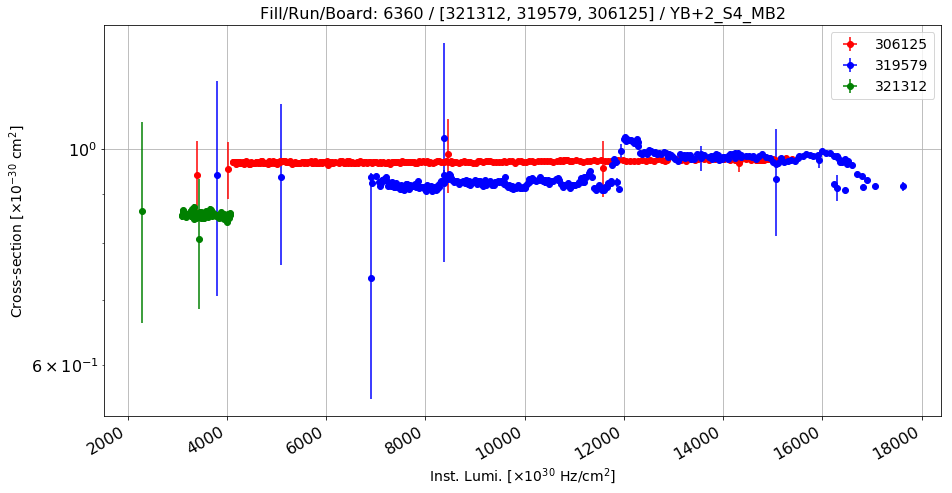

Anomalous CS: 0.972030147554 , Normal CS: 0.961749830575 , Ratio: -0.0106891799216


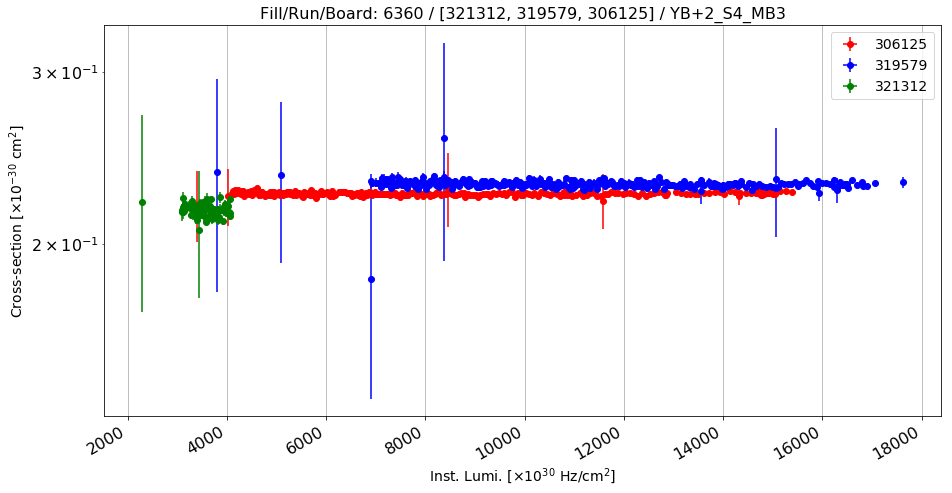

Anomalous CS: 0.225002605654 , Normal CS: 0.230008971793 , Ratio: 0.0217659602584


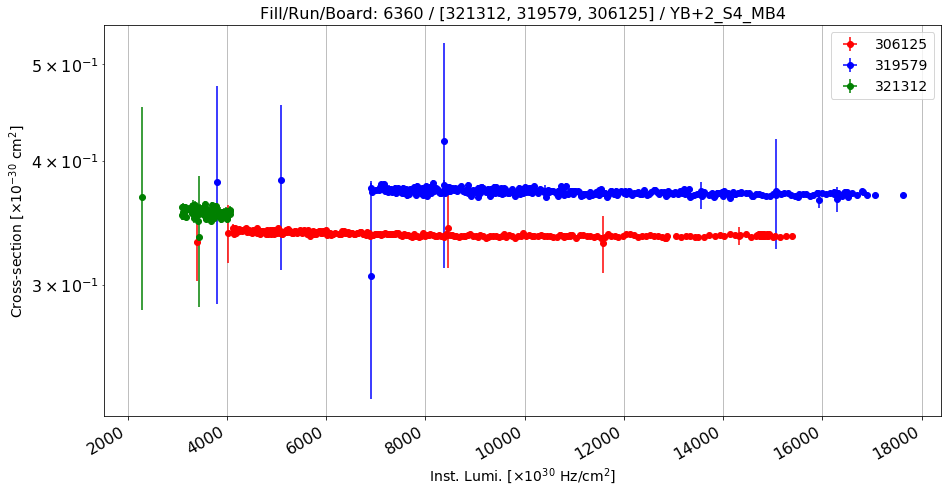

Anomalous CS: 0.336761788024 , Normal CS: 0.371247503085 , Ratio: 0.0928914397392


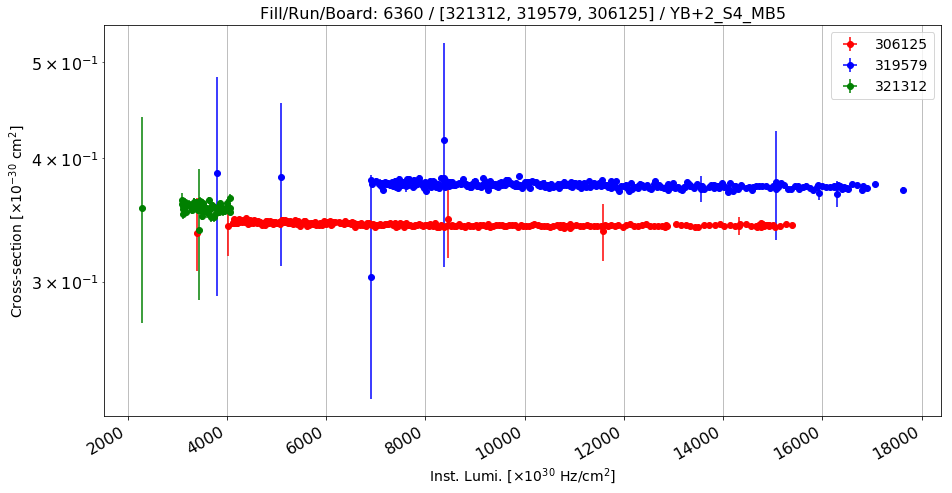

Anomalous CS: 0.342405659431 , Normal CS: 0.374970628447 , Ratio: 0.0868467195704


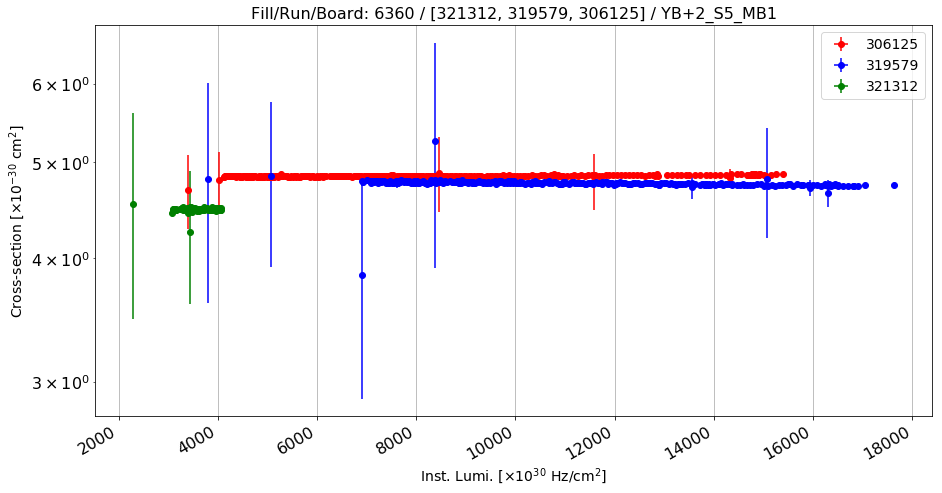

Anomalous CS: 4.84733492702 , Normal CS: 4.75500738839 , Ratio: -0.0194169075005


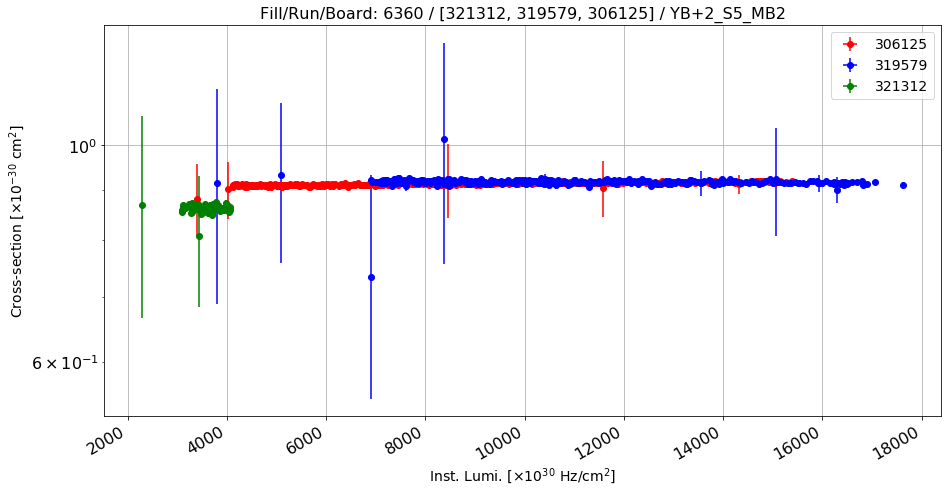

Anomalous CS: 0.914566602395 , Normal CS: 0.917048243804 , Ratio: 0.00270611870781


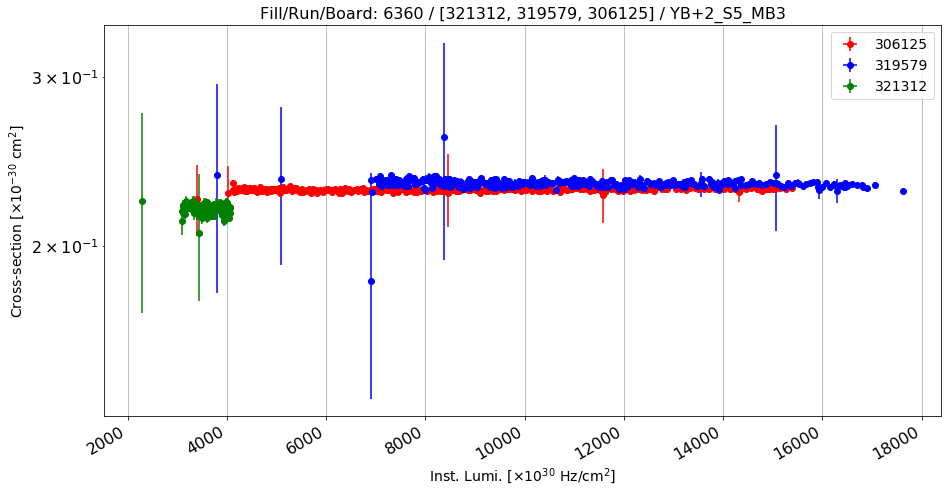

Anomalous CS: 0.22888339801 , Normal CS: 0.232200252845 , Ratio: 0.0142844583239


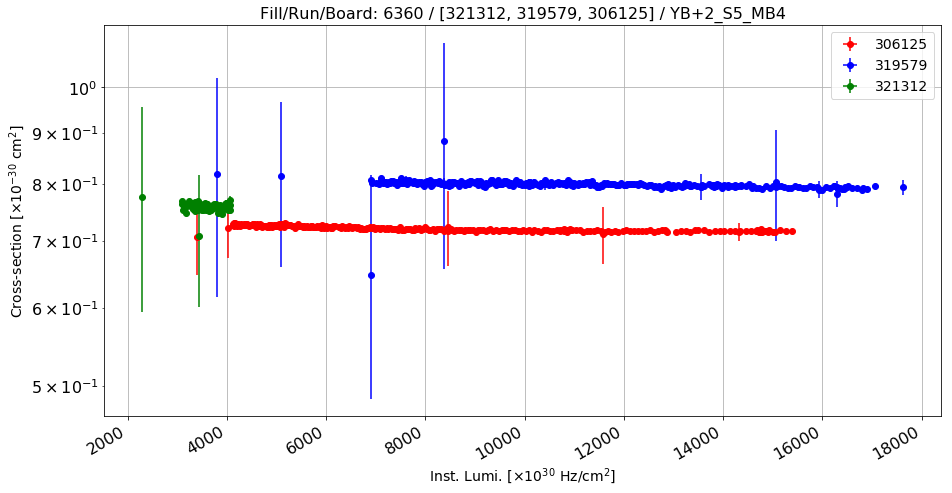

Anomalous CS: 0.718453228512 , Normal CS: 0.796559946005 , Ratio: 0.098055040157


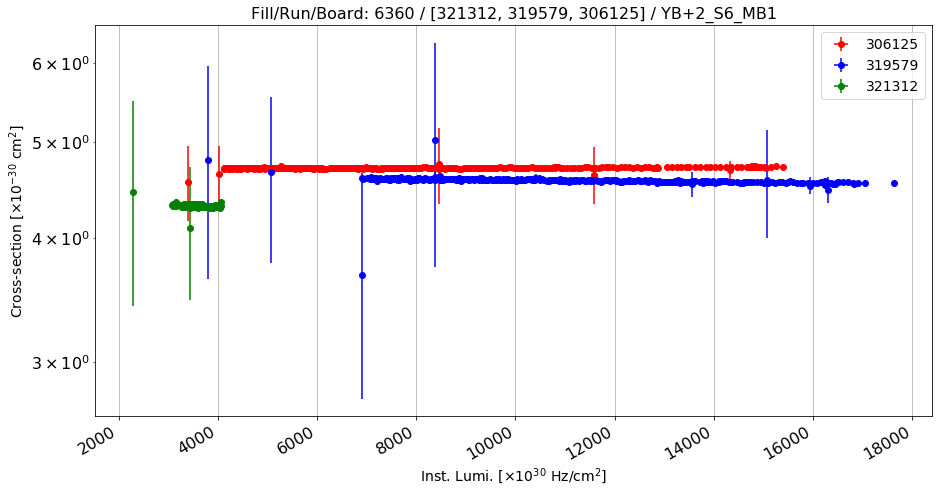

Anomalous CS: 4.70519670203 , Normal CS: 4.55895583308 , Ratio: -0.0320777112808


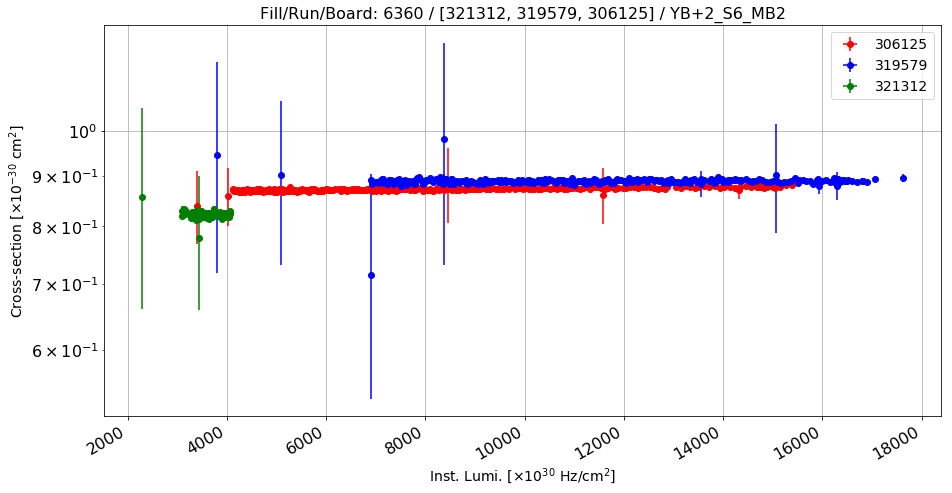

Anomalous CS: 0.873885156193 , Normal CS: 0.889142767664 , Ratio: 0.0171599118002


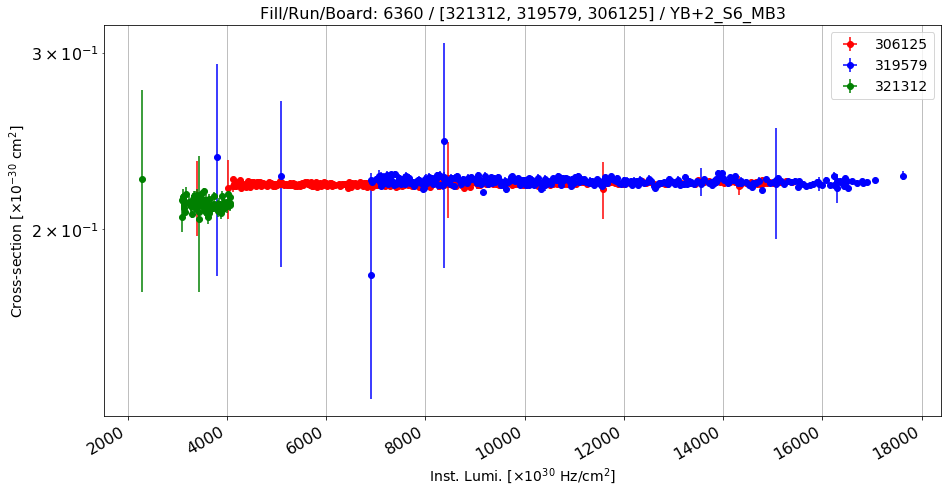

Anomalous CS: 0.222243669044 , Normal CS: 0.223219465476 , Ratio: 0.00437146657567


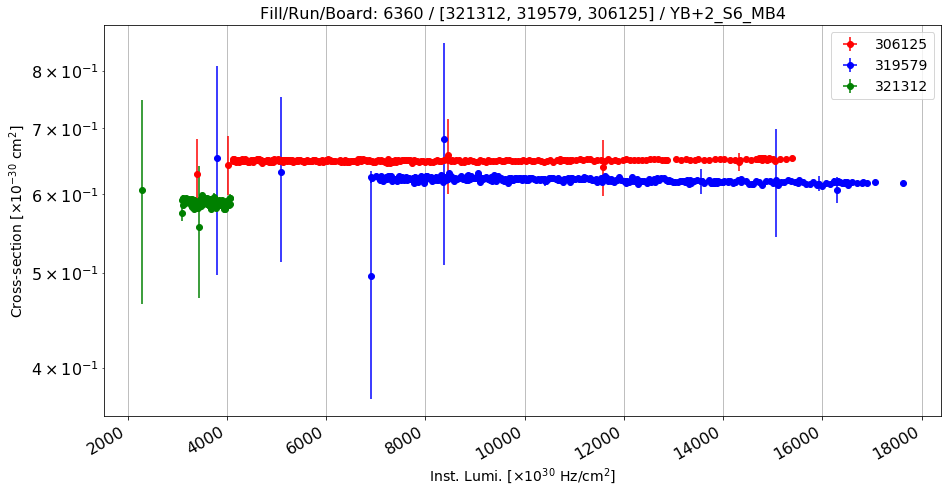

Anomalous CS: 0.64982239733 , Normal CS: 0.619258263949 , Ratio: -0.0493560363429


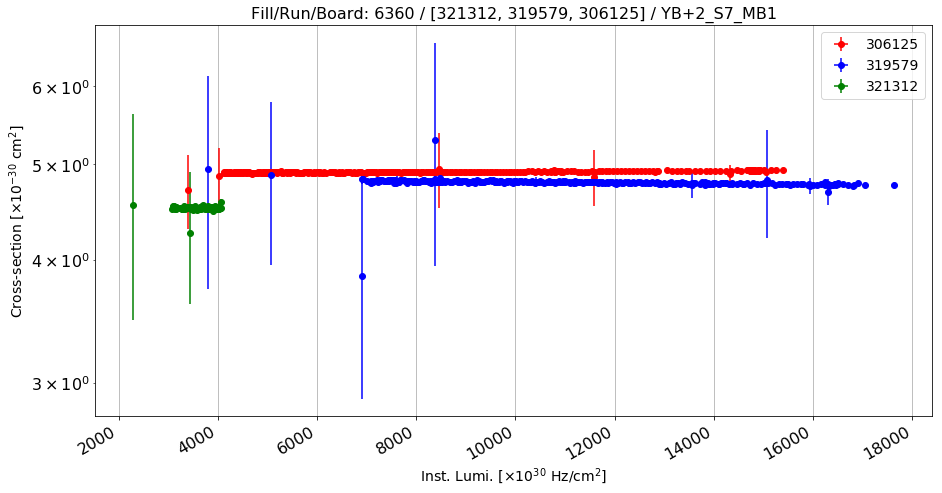

Anomalous CS: 4.9148753575 , Normal CS: 4.78570903444 , Ratio: -0.0269900075686


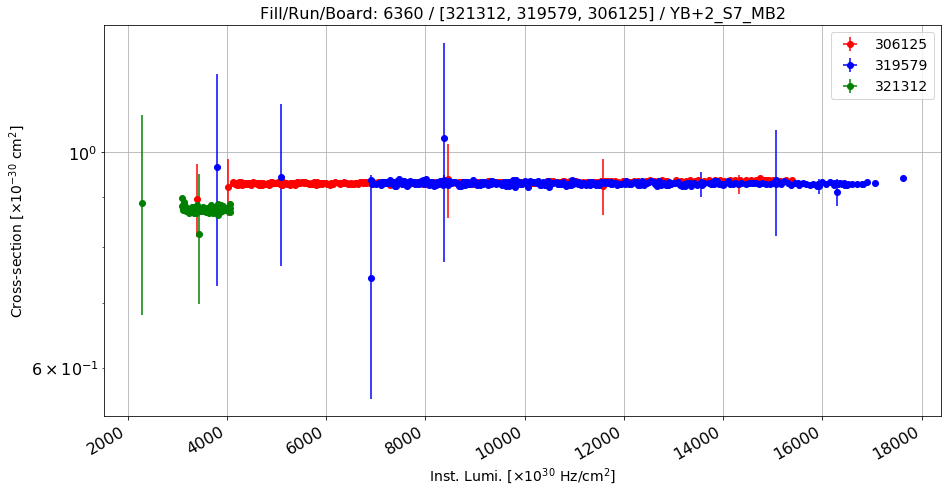

Anomalous CS: 0.93221794137 , Normal CS: 0.929058474433 , Ratio: -0.0034007191413


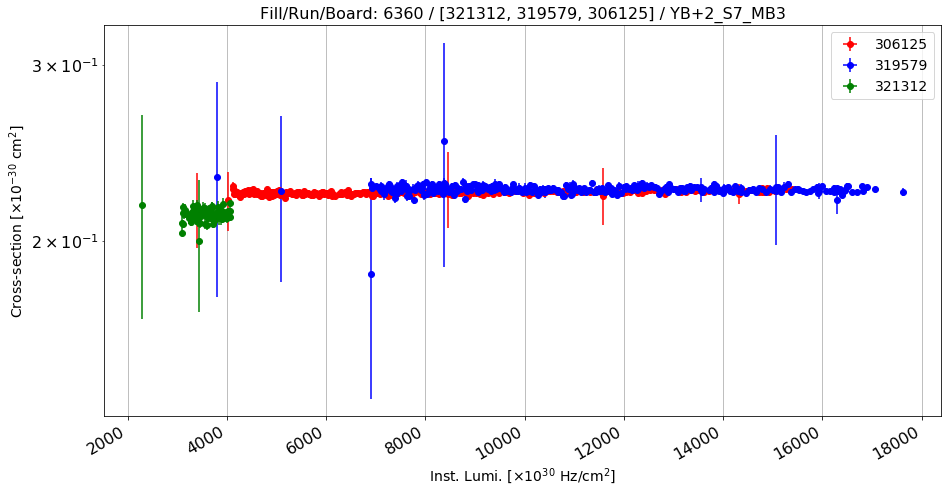

Anomalous CS: 0.223794271009 , Normal CS: 0.22511608666 , Ratio: 0.00587170677353


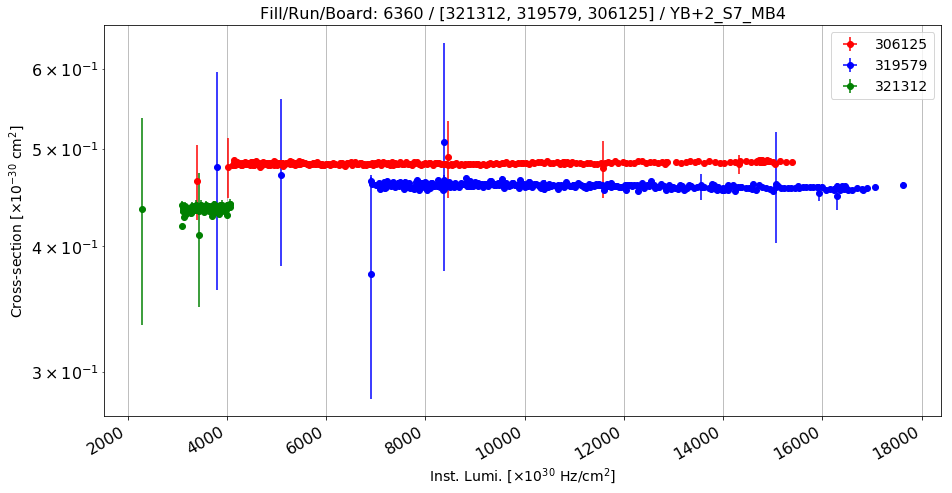

Anomalous CS: 0.484050704834 , Normal CS: 0.458396867074 , Ratio: -0.0559642519456


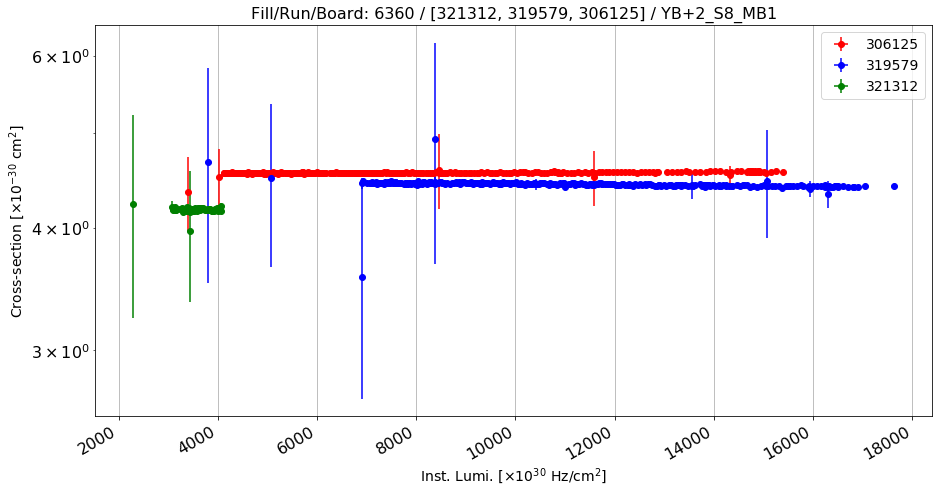

Anomalous CS: 4.55961000843 , Normal CS: 4.42768641309 , Ratio: -0.0297951532776


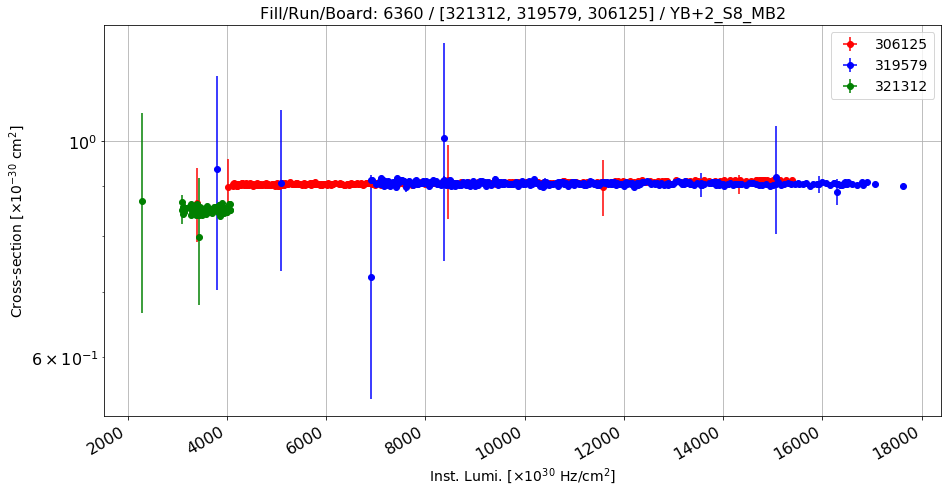

Anomalous CS: 0.907546103416 , Normal CS: 0.904909868161 , Ratio: -0.00291325727325


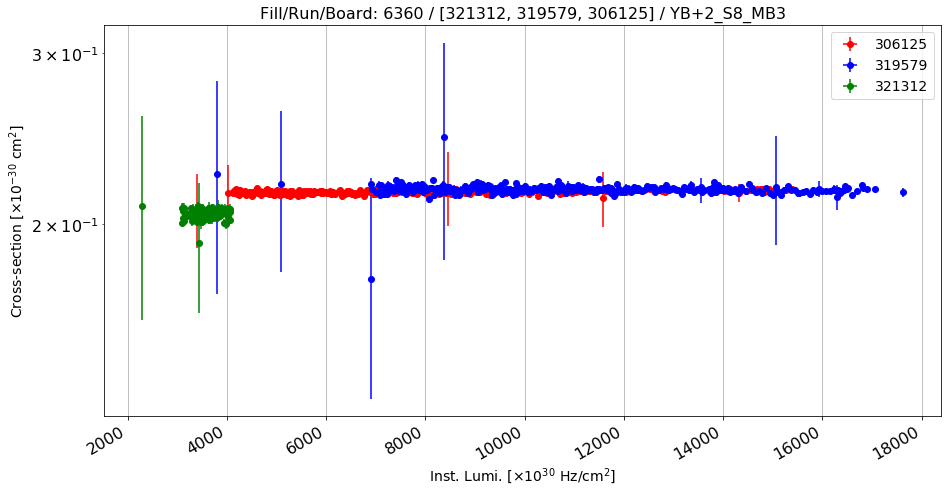

Anomalous CS: 0.216122006576 , Normal CS: 0.217232701314 , Ratio: 0.00511292605161


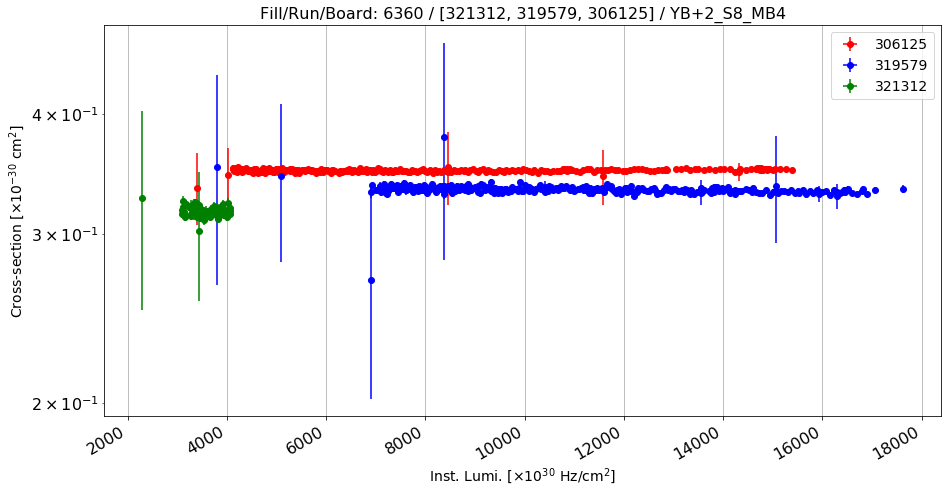

Anomalous CS: 0.349377917759 , Normal CS: 0.333193188555 , Ratio: -0.0485746100449


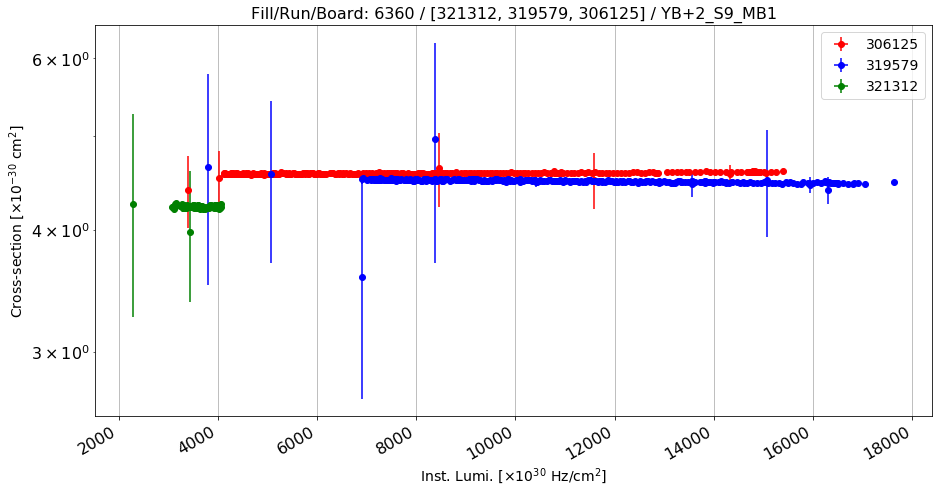

Anomalous CS: 4.57994463279 , Normal CS: 4.48372470226 , Ratio: -0.0214598212255


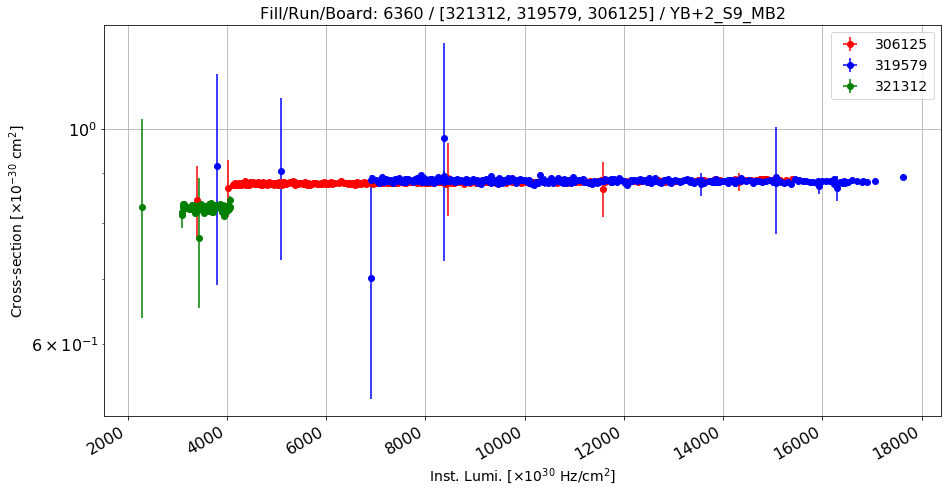

Anomalous CS: 0.882189137319 , Normal CS: 0.883200840339 , Ratio: 0.00114549598901


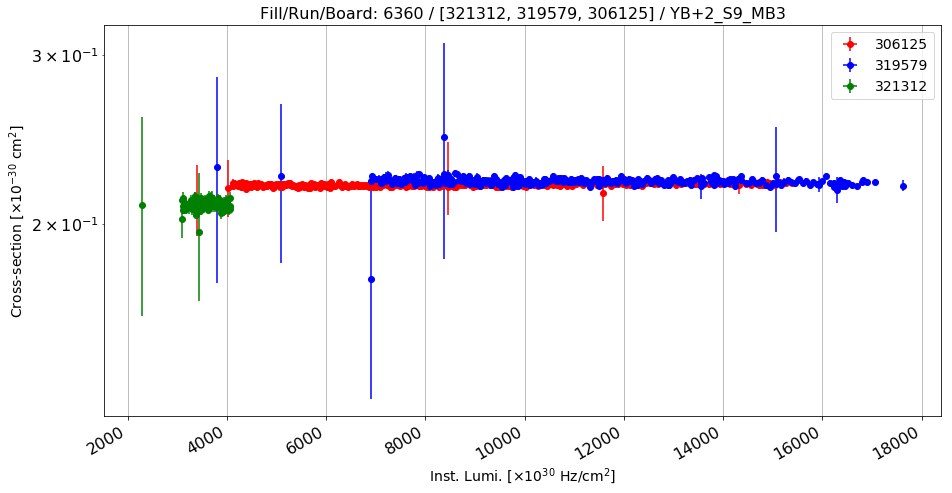

Anomalous CS: 0.219766882107 , Normal CS: 0.221371174918 , Ratio: 0.00724707185363


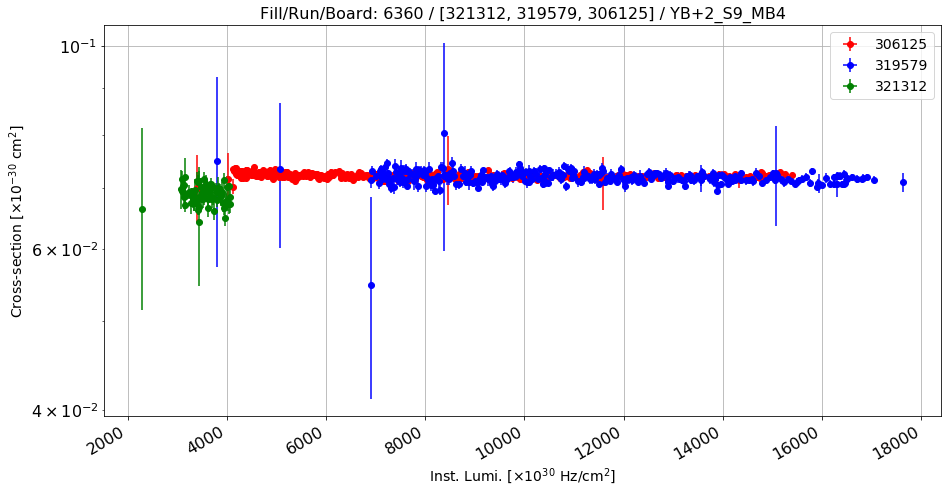

Anomalous CS: 0.0720903092621 , Normal CS: 0.0717678090255 , Ratio: -0.00449366144775


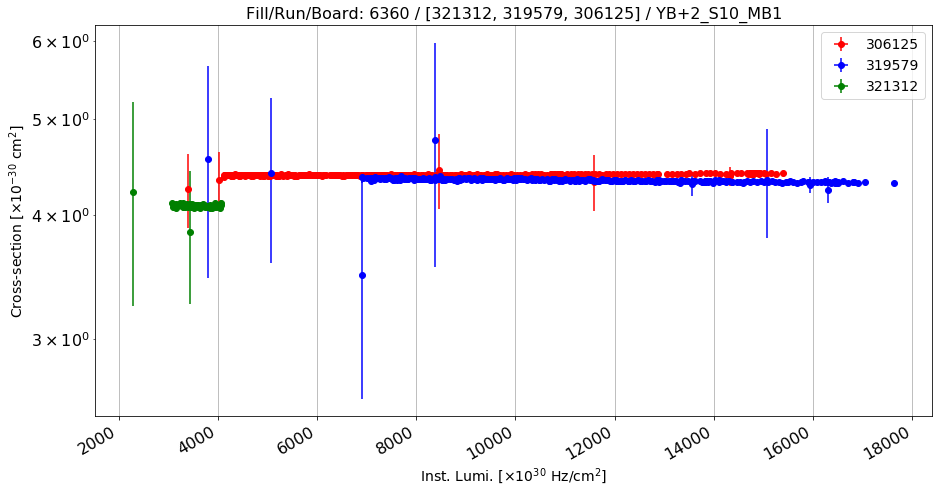

Anomalous CS: 4.39726682402 , Normal CS: 4.33156476801 , Ratio: -0.015168203531


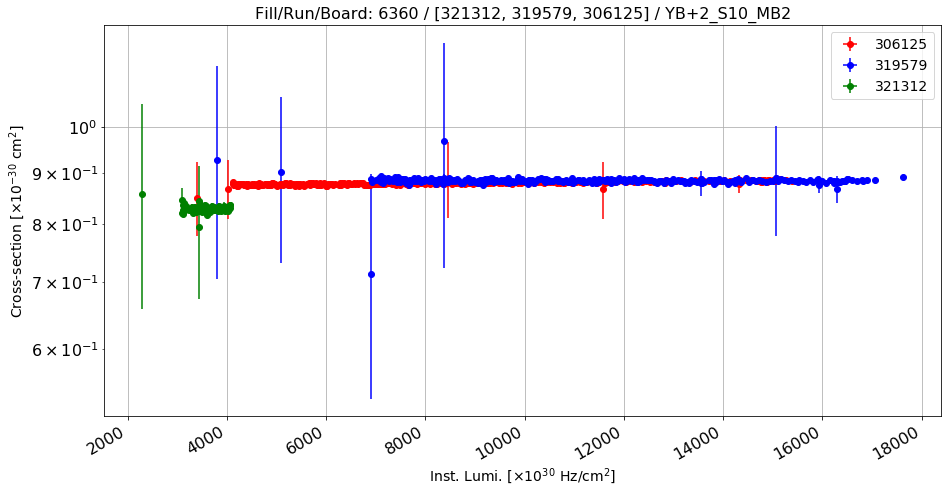

Anomalous CS: 0.880270325911 , Normal CS: 0.883788913557 , Ratio: 0.00398125343198


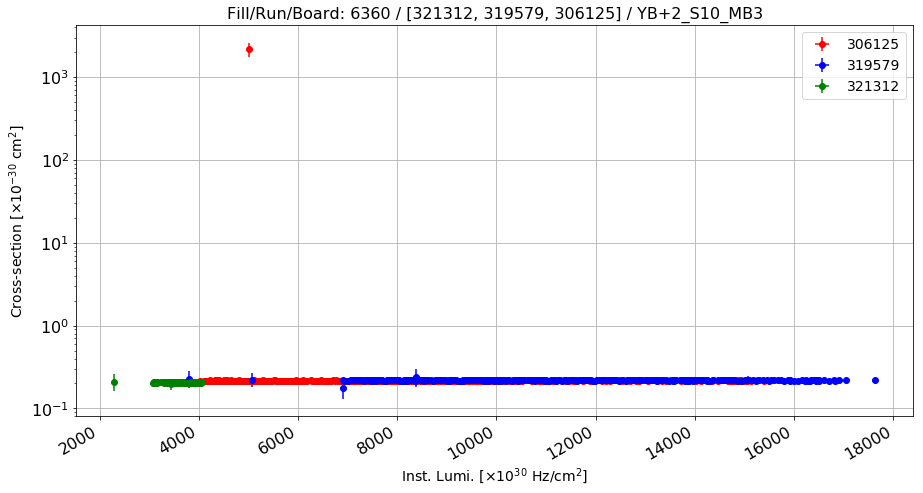

Anomalous CS: 0.216723414143 , Normal CS: 0.218274529614 , Ratio: 0.00710625959922


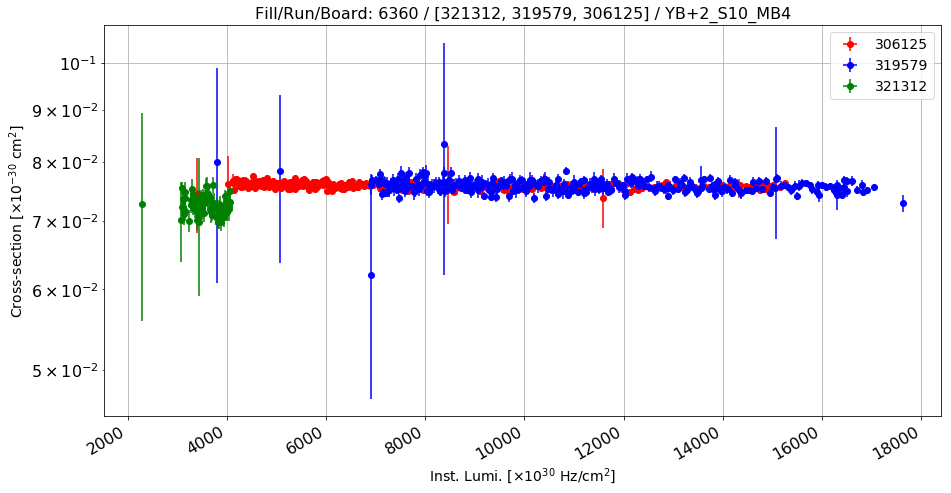

Anomalous CS: 0.0757163436594 , Normal CS: 0.0757003635972 , Ratio: -0.000211096241191


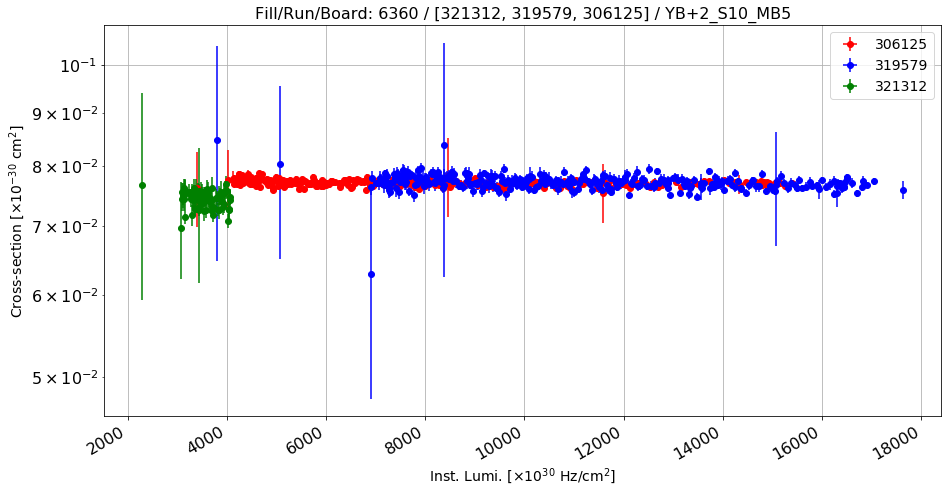

Anomalous CS: 0.0768748773922 , Normal CS: 0.0769251760898 , Ratio: 0.000653865225795


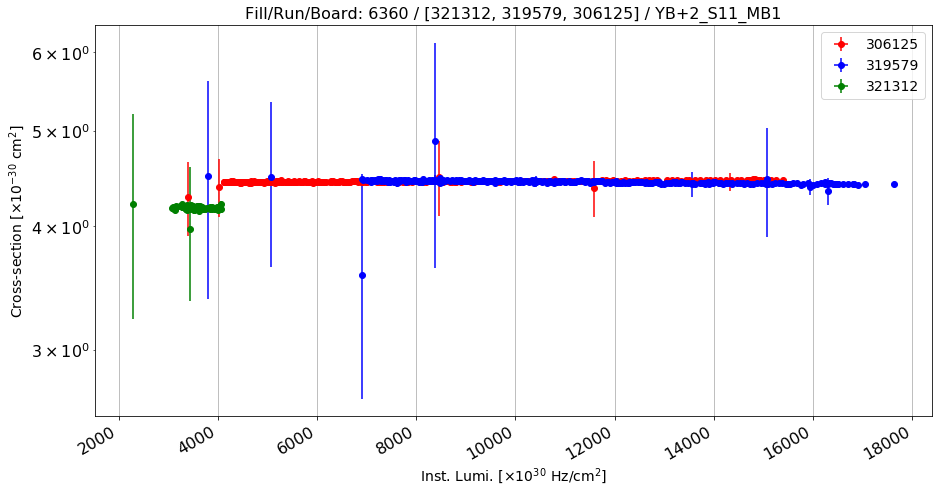

Anomalous CS: 4.44720280029 , Normal CS: 4.43024830922 , Ratio: -0.00382698437911


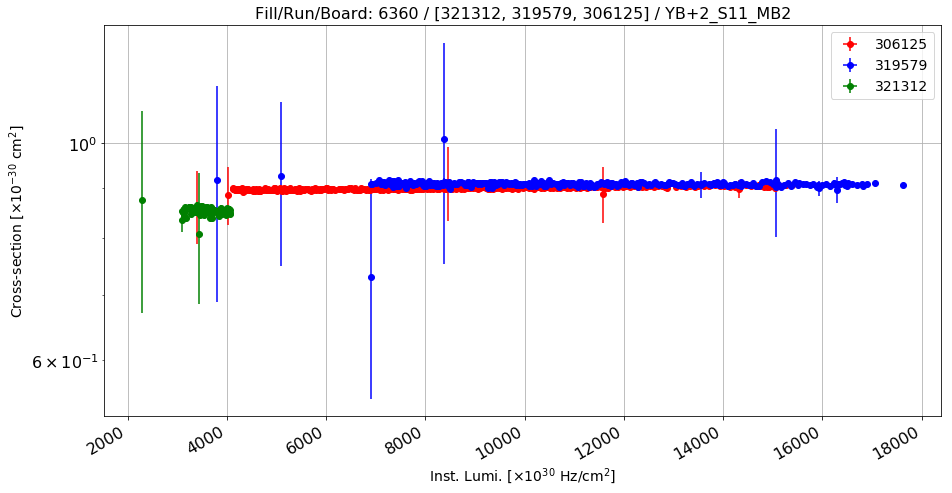

Anomalous CS: 0.900667258971 , Normal CS: 0.908546207757 , Ratio: 0.00867203970331


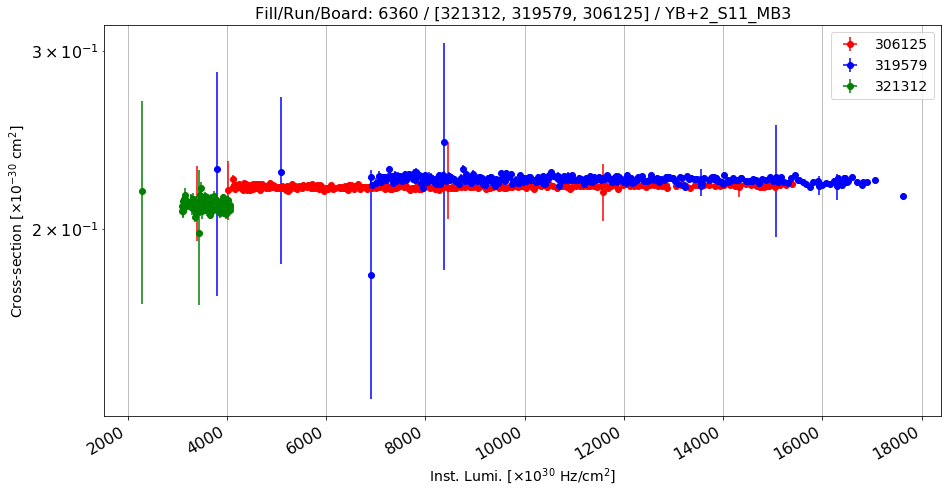

Anomalous CS: 0.220186685068 , Normal CS: 0.223602076253 , Ratio: 0.0152744162431


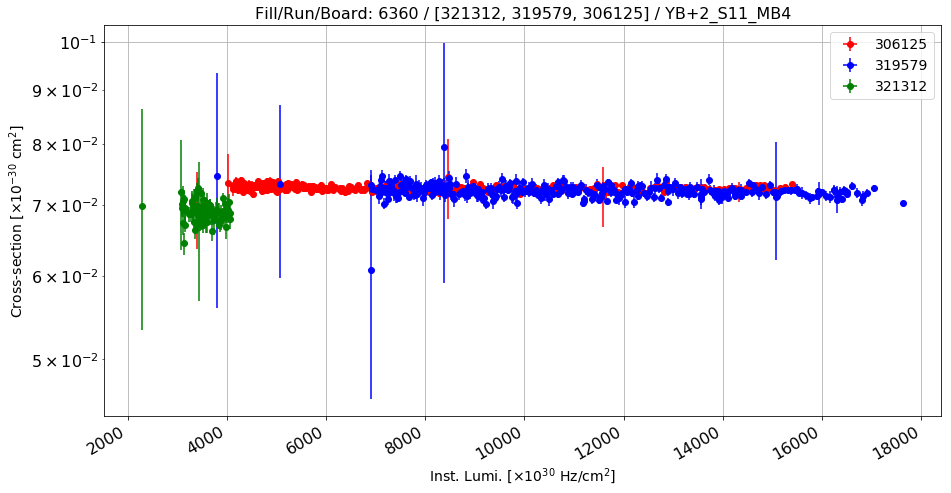

Anomalous CS: 0.0726080170761 , Normal CS: 0.0720741841526 , Ratio: -0.00740671475863


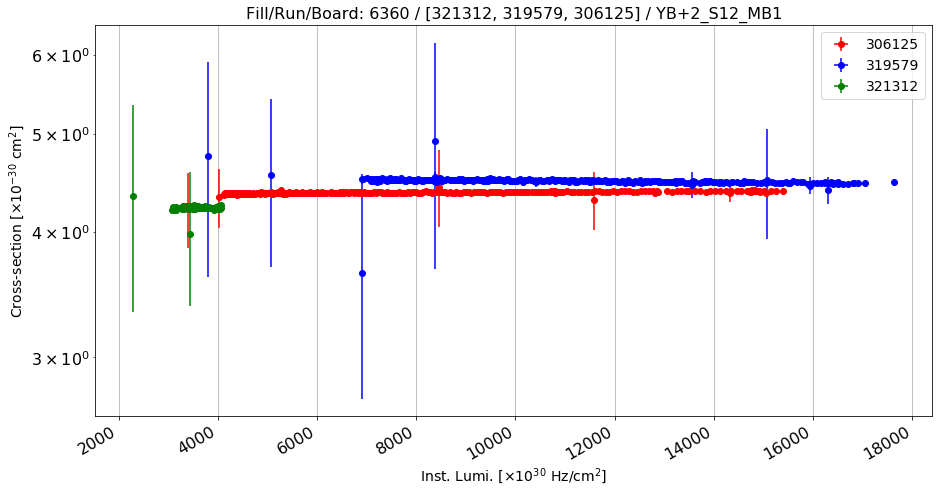

Anomalous CS: 4.37992182254 , Normal CS: 4.48470247399 , Ratio: 0.0233640140134


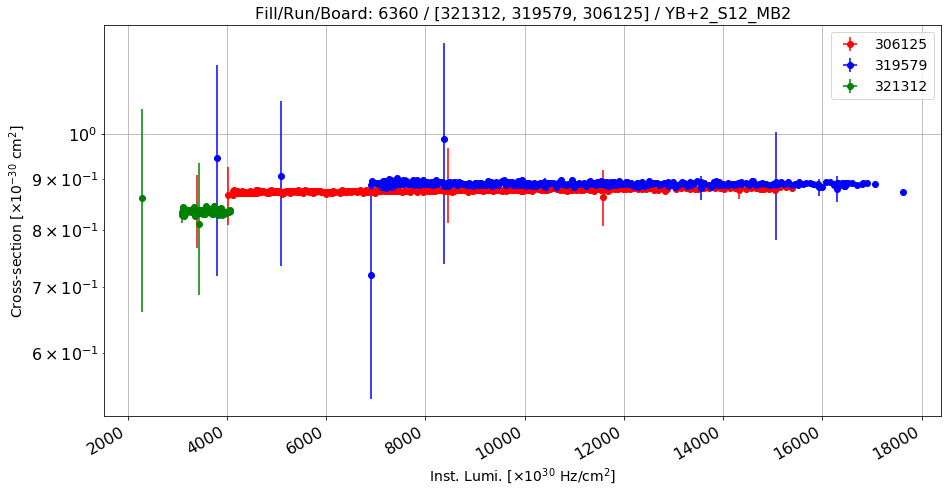

Anomalous CS: 0.877438581855 , Normal CS: 0.889949320044 , Ratio: 0.0140578097055


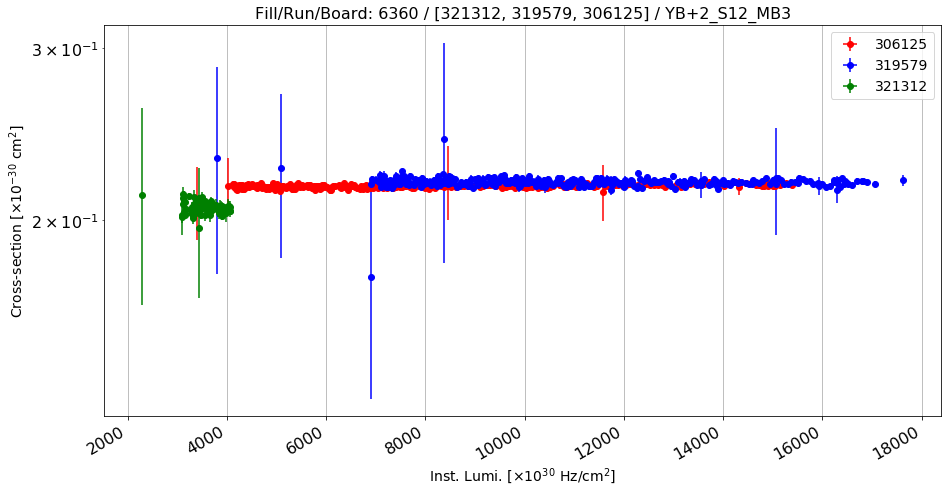

Anomalous CS: 0.217010987889 , Normal CS: 0.218664727724 , Ratio: 0.00756290167481


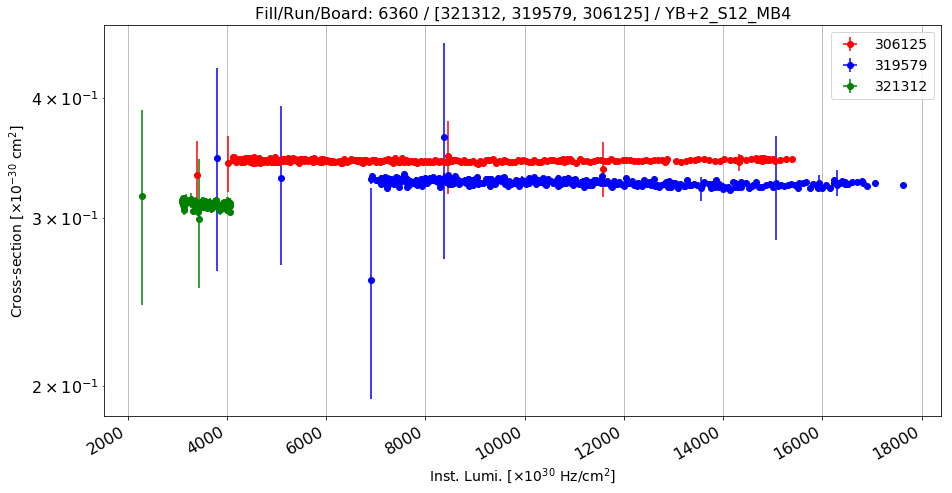

Anomalous CS: 0.344085819336 , Normal CS: 0.325597832782 , Ratio: -0.0567816634264


In [100]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio", "cs_norm", "cs_anomal"])

for i in [-2, -1, 0, +1, +2]:
#for i in [+2]:
    for j in range(1, 13):
    #for j in [10]:
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:
        #for k in [3]:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[321312, 319579, 306125]")+" / " + board + "_MB" + str(k)
                
            #N.B.: The second run is the one used as reference
            (a, b, c) = plot_ratio_vs_ls(df_rates, [306125, 319579, 321312], "lumi", station, board, 0,\
                            error, r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{-30}$ cm$^{2}$]", title, ["ro", "bo", "go"], True)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c, "cs_norm": b,\
                                  "cs_anomal": a}, ignore_index = True)
            
            print "Anomalous CS:", a, ", Normal CS:", b, ", Ratio:", c
            

In [101]:
print ratio[(ratio.wheel == +1) & (ratio.sector == 4) & (ratio.station == 3)]
print ratio[(ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)]

     wheel  sector  station     ratio   cs_norm  cs_anomal
164    1.0     4.0      3.0  0.012751  0.168554   0.166405
    wheel  sector  station     ratio   cs_norm  cs_anomal
60   -1.0     3.0      3.0  0.011695  0.221394   0.218804


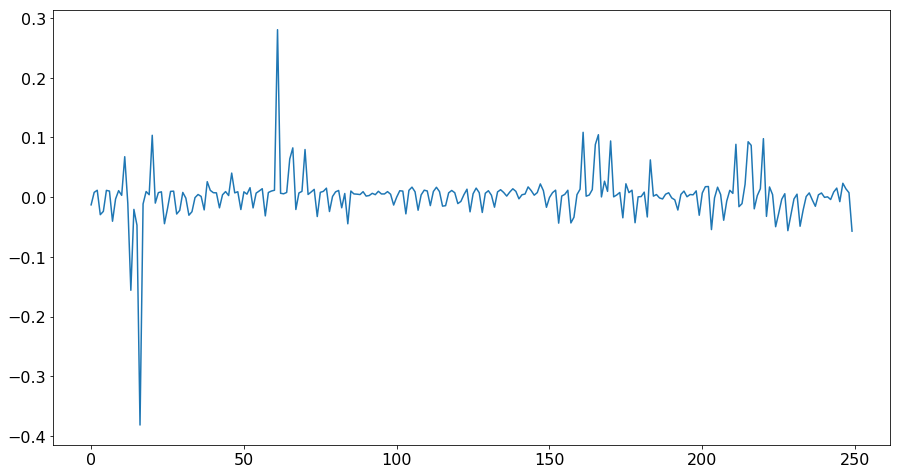

In [103]:
plt.plot(ratio[ratio.wheel != -3].ratio)

Create a new dataframe with the input features already organized in a numpy array:

In [104]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

41580
374220


In [105]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
                     yerr=df_temp[rule][y_err], fmt=opt, ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

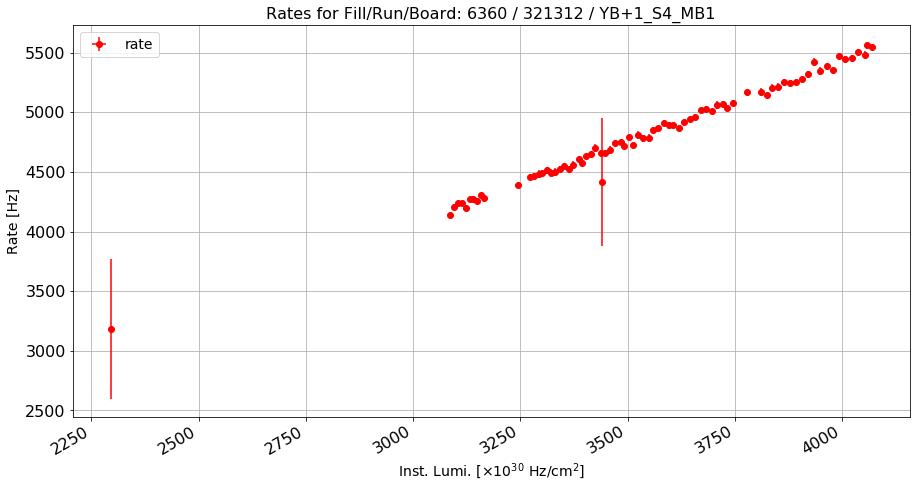

In [106]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB1"
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [321312],\
                "lumi", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [107]:
def plot_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt=opt, ecolor='r')
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["lumi"], xerr=x_err, yerr=df_temp[rule]["errLumi"],\
                     fmt='bo', ecolor='b')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

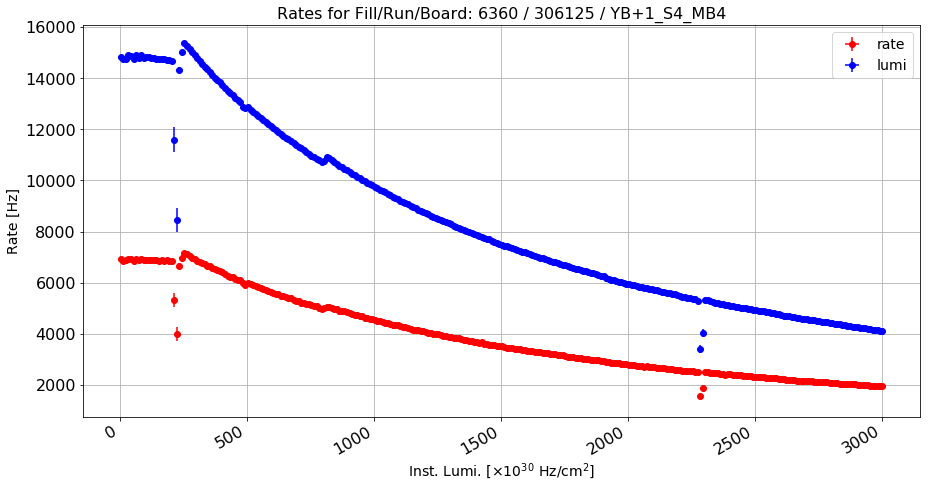

In [108]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 306125 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [306125],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

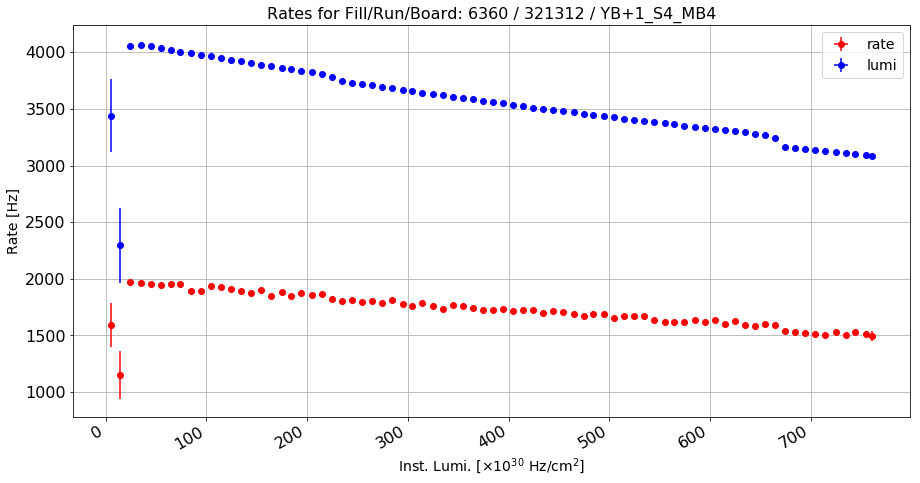

In [109]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [321312],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [110]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["rate"]/df_rates_new["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["lumi"])*\
np.sqrt(df_rates_new["err"]**2 + df_rates_new["CS"]**2 * df_rates_new["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [111]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [112]:
print len(array)
print len(df_rates_new)

374220
374220


In [113]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [114]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [115]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

Add a column with the percentage difference in CS:

In [116]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print i, j, k, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

## Creating the train and test samples

In [117]:
df_rates_new_2 = df_rates_new.copy()
print df_rates_new["content"].loc[166321]

[2 1 10 1 14832.761313432853 5.083580794736273 24659.597014925374
 31.025762625525786 1.6625088541398652 0.0021679220980458445]


In [118]:
#To be run just one time!!!!!!
df_rates_new["content_in"] = df_rates_new["content"].copy()
def change_data(data):
    temp = data.copy()
    temp[2] = temp[2] - 6
    temp[3] = temp[3] - 3
    return temp

df_rates_new["content"] = df_rates_new["content"].apply(change_data)

In [119]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [120]:
print df_rates_new["content"].loc[166321]

[2 1 4 -2 14832.761313432853 5.083580794736273 24659.597014925374
 31.025762625525786 1.6625088541398652 0.0021679220980458445]


In [121]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

173250 173250


In [122]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [123]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 -3 0 9744.584855072457 1.8061767199476344 2131.521739130435
 5.884748761520032 0.218739101853158 0.0006052588318100501]
Anomalous chimney:
[2 1 -2 0 9744.584855072457 1.8061767199476344 1611.9130434782608
 5.309465687505742 0.16541628683536927 0.0005457251647561998]


In [124]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

In [125]:
def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[4] = temp[4]*red #Increase lumi by "red"
    temp[5] = temp[5]*red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
anomalies["content_2"] = anomalies["content"].apply(change)
print anomalies["content_2"].iloc[0]

[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]
[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]


In [126]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column

    if (scaler_type == 0):
        return data
    if (scaler_type == 1):
        data = data.reshape(-1, 1)
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 2):
        data = data.reshape(-1, 1)
        scaler = MaxAbsScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 3):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 4):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 5):
        data = data.reshape(1, -1)
        scaler = Normalizer(norm='l2').fit_transform(data)
        return scaler.reshape(1, -1)
    if (scaler_type == 6):
        data = data.reshape(-1, 1)
        scaler = MinMaxScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)

In [127]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_2"] = anomalies["content_2"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)
#anomalies["content_scaled"] = anomalies["content_2"].apply(scale_data)

Testing on 2018 data:

In [128]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 319579) | (anomalies.run == 321312)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 98000
Normalies: 97608
Anomalies 392


In [129]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

## Simple test

In [155]:
factors = pd.DataFrame()

print("Loading SF")
path = "./factors_2018.csv"
factors = factors.append(pd.read_csv(path,\
        names=["wheel", "sector", "station", "CS", "factor"]),\
        ignore_index=True)

print("Done.")

Loading SF
Done.


In [156]:
def simple_test(cross_sections, df, coeff):
    for i in df.index:
        wheel = df.wheel.loc[i]
        sector = df.sector.loc[i]
        station = df.station.loc[i]
        cs = df.CS.loc[i]
        #err_cs = df.errCS.loc[i]
        #print cs
        rule = ((cross_sections.wheel == wheel) & (cross_sections.sector == sector) &\
                (cross_sections.station == station))
        cs_norm = cross_sections[rule].CS.iloc[0]
        #err_cs_norm = cross_sections[rule].errCS.iloc[0]
        #low = cs_norm - coeff*err_cs_norm
        #hi = cs_norm + coeff*err_cs_norm
        delta = abs(cs_norm - cs) / cs_norm
        #low = cs_norm*(1 - coeff)
        #hi = cs_norm*(1 + coeff)
        #print low, hi
        #if ((cs > low) & (cs < hi)):
        #    res = 0
        #else:
        #    res = +1
        df.loc[i, "st_score"] = delta

In [157]:
layers_test["st_score"] = 0
layers_test.index = pd.RangeIndex(len(layers_test.index))
simple_test(factors, layers_test, 0.05)

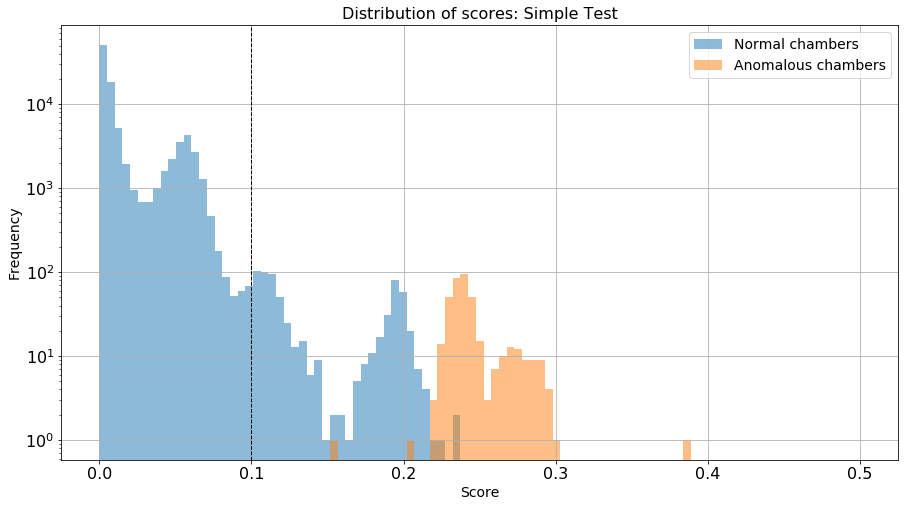

In [158]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.5, 100)
plt.hist(layers_test[layers_test["score"] < 0]["st_score"], bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["st_score"], bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.1, color='k', linestyle='dashed', linewidth=1)
plt.show()

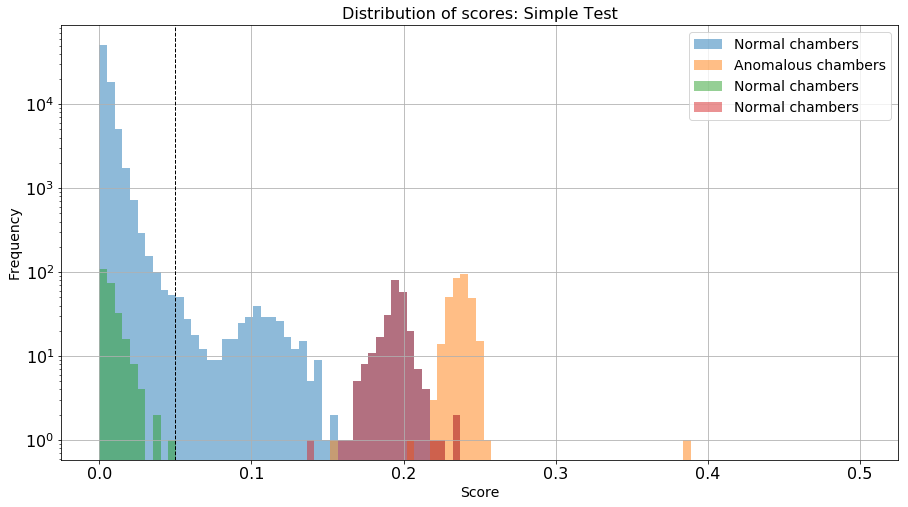

In [159]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.5, 100)
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 319579)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] > 0) & (layers_test.run == 319579)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 319579) &\
                     (layers_test.ls < 41)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 319579) &\
                     (layers_test.ls > 3168)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.05, color='k', linestyle='dashed', linewidth=1)
plt.show()

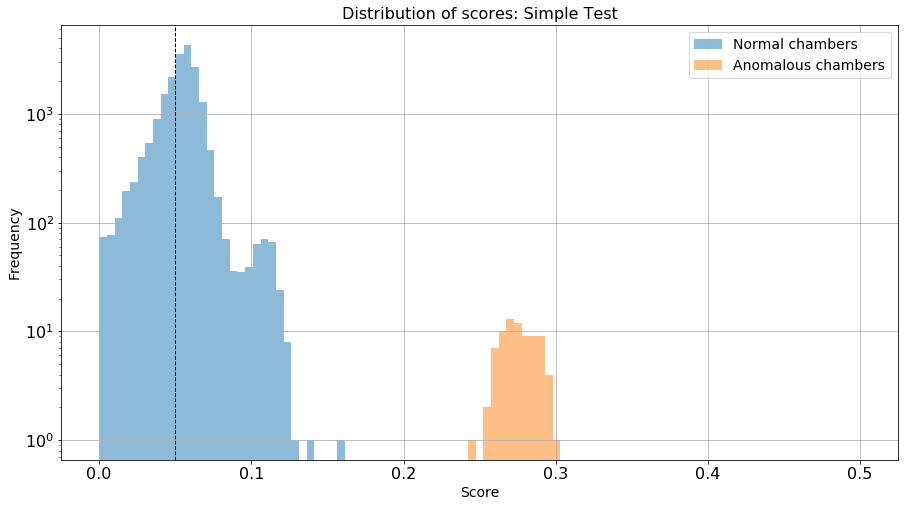

In [160]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 0.5, 100)
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] > 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.05, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [161]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[ 0.31106243  0.68893757]
 [ 0.          1.        ]]


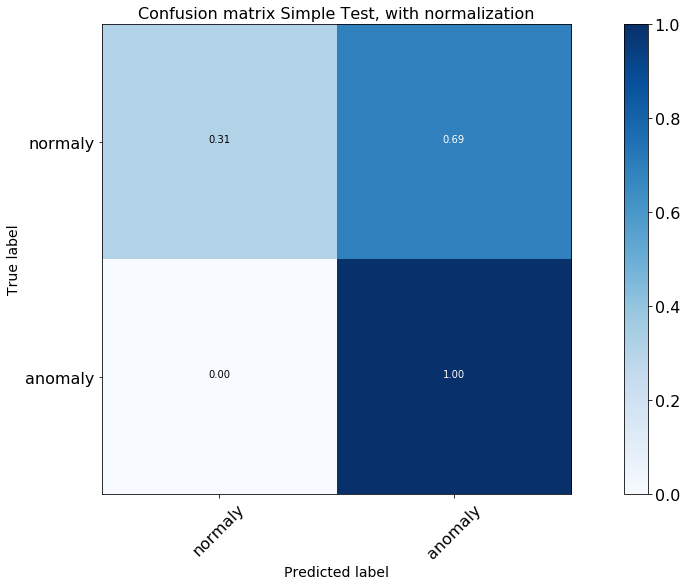

In [162]:
th_km = 0.05
rule = (layers_test.run == 321312)
y_pred = 2*(layers_test[rule]["st_score"] > th_km)-1
cnf_matrix = confusion_matrix(layers_test[rule]["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix Simple Test, with normalization')

In [163]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

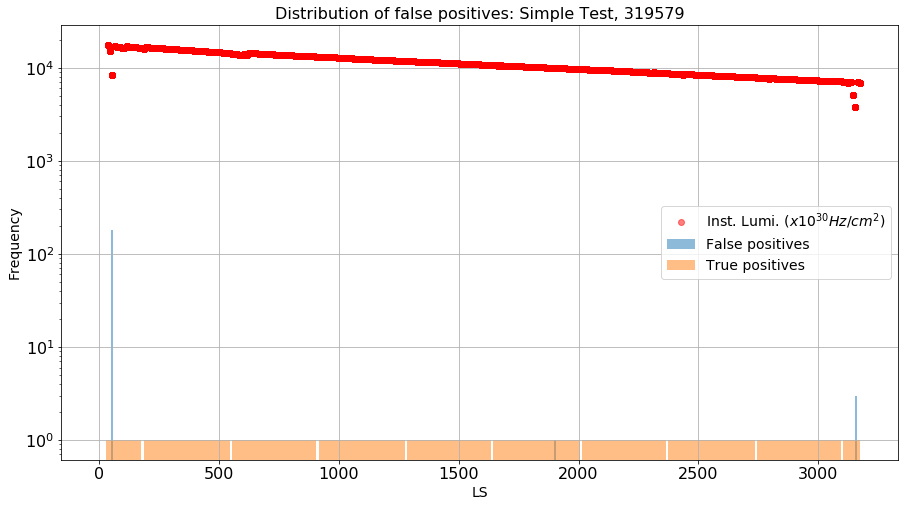

array([   0.,    0.,    0.,    0.,    0.,  182.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          0.,    0.,

In [164]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.1
plotFpVsLs(319579, 0, 0, 0, "Distribution of false positives: Simple Test, ",\
           layers_test, "st_score",\
           threshold, True, boundaries[boundaries["run"] == 319579]["ls_end"])

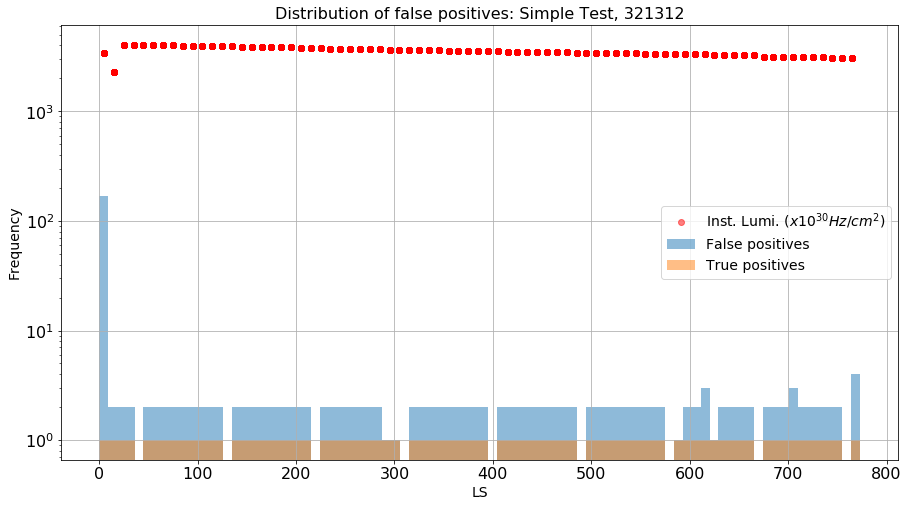

array([ 170.,    2.,    2.,    2.,    0.,    2.,    2.,    2.,    2.,
          2.,    2.,    2.,    2.,    2.,    0.,    2.,    2.,    2.,
          2.,    2.,    2.,    2.,    2.,    2.,    0.,    2.,    2.,
          2.,    2.,    2.,    2.,    2.,    1.,    1.,    0.,    2.,
          2.,    2.,    2.,    2.,    2.,    2.,    2.,    2.,    0.,
          2.,    2.,    2.,    2.,    2.,    2.,    2.,    2.,    2.,
          0.,    2.,    2.,    2.,    2.,    2.,    2.,    2.,    2.,
          2.,    0.,    1.,    2.,    2.,    3.,    1.,    2.,    2.,
          2.,    2.,    0.,    2.,    2.,    2.,    3.,    2.,    2.,
          2.,    2.,    2.,    0.,    4.])

In [165]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.1
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: Simple Test, ",\
           layers_test, "st_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])

## Inference

Making an inference using the model and the test sample:

In [166]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

In [167]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity

In [168]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

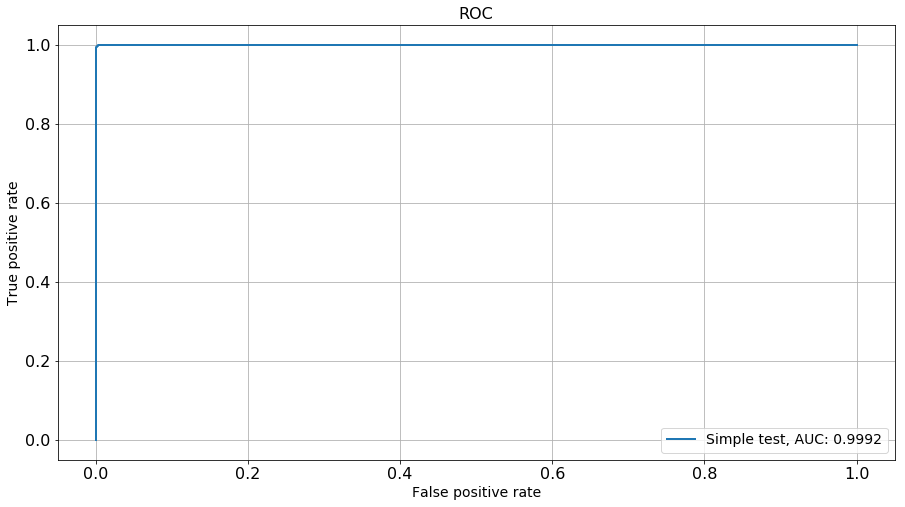

In [169]:
get_roc_curve(layers_test, 
              [
               #("AE", "cae_score"),
               #("SNN", "ann_score_1"),
               #("DNN (2 layers)", "ann_score_2"),
               #("DNN (3 layers)", "ann_score_3"),
               #("DNN (4 layers)", "ann_score_4"),
               ("Simple test", "st_score"),
               ], #(specificity_ann, sensitivity_ann)
             )

In [170]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [171]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [172]:
def plot_scatter_2(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule][arg].values)
        if (i == 5):
            tmp = list(temp[rule][arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

Decrease in rate per station and sector in each wheel:

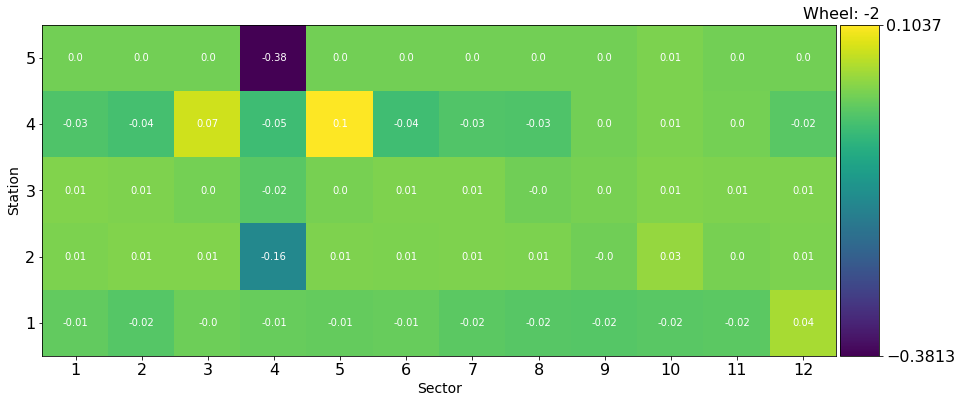

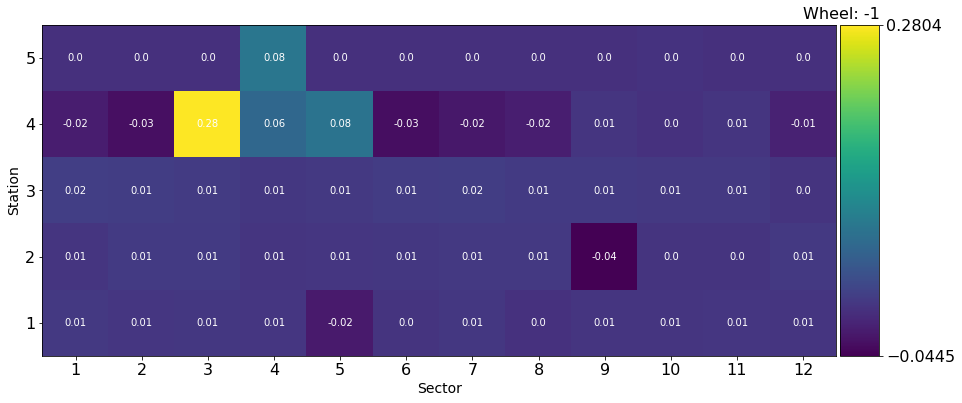

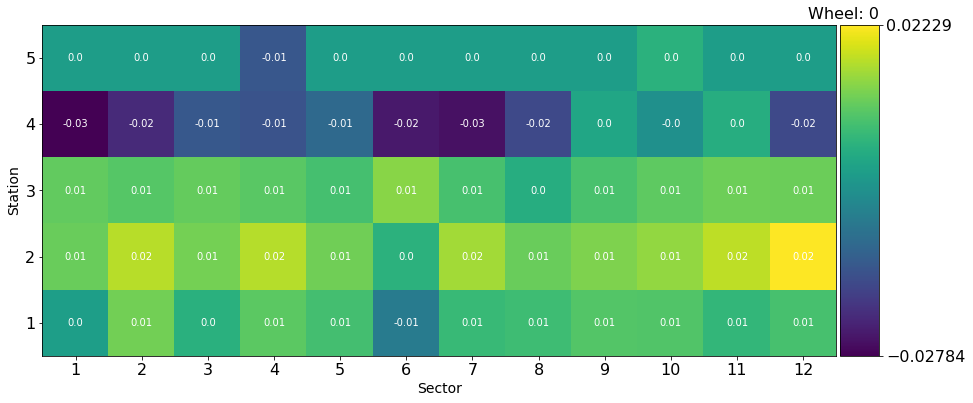

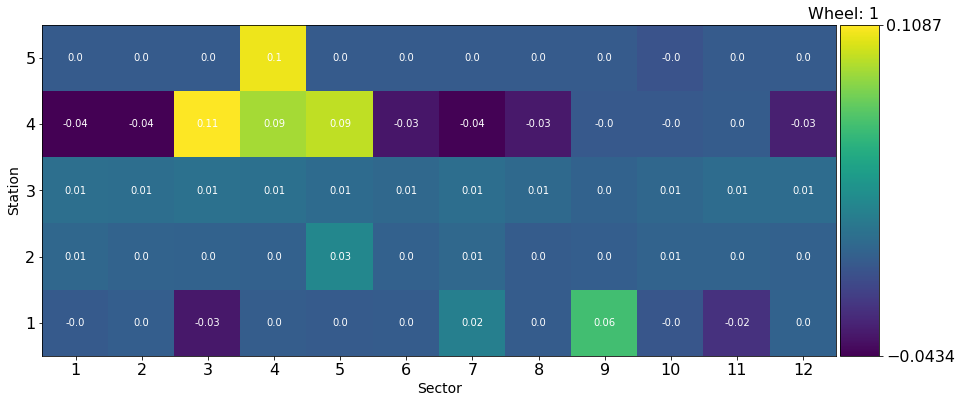

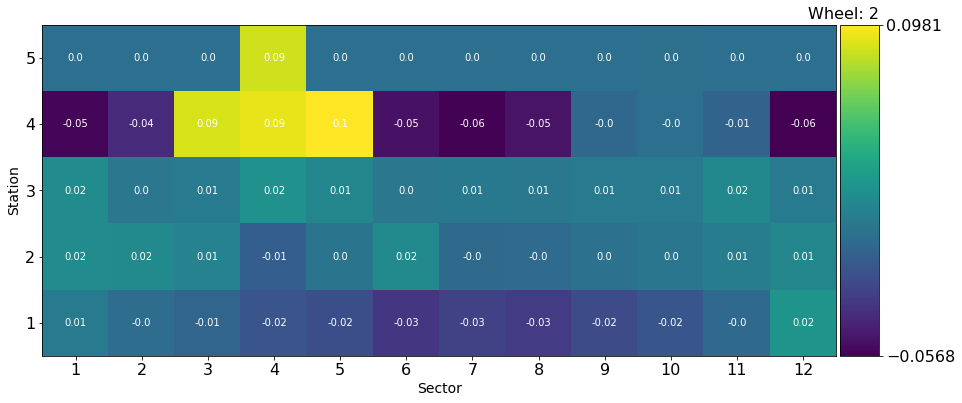

In [173]:
plot_scatter_2(ratio, "ratio", -2)
plot_scatter_2(ratio, "ratio", -1)
plot_scatter_2(ratio, "ratio", 0)
plot_scatter_2(ratio, "ratio", +1)
plot_scatter_2(ratio, "ratio", +2)

Cross-section per station and sector in each wheel for the reference run:

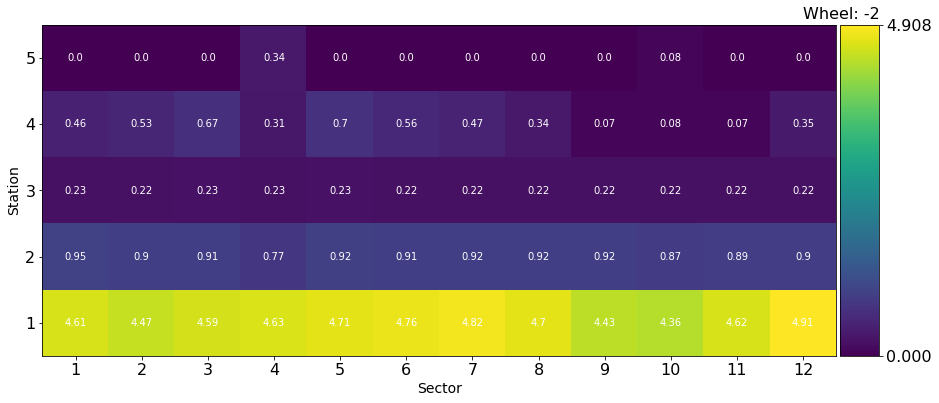

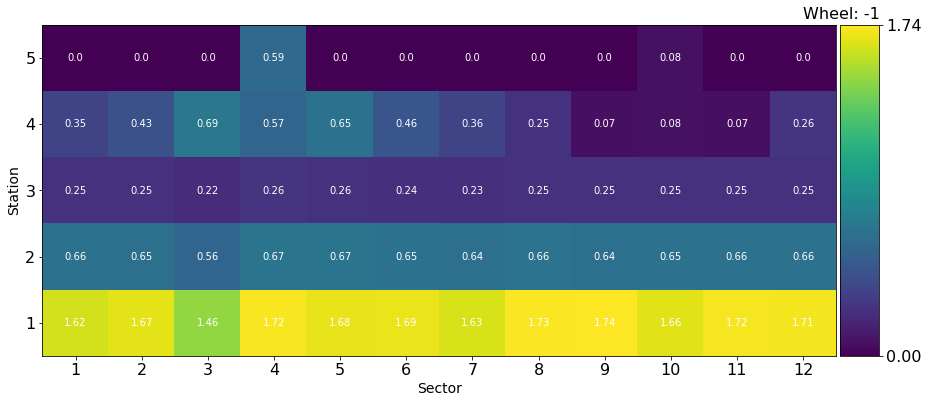

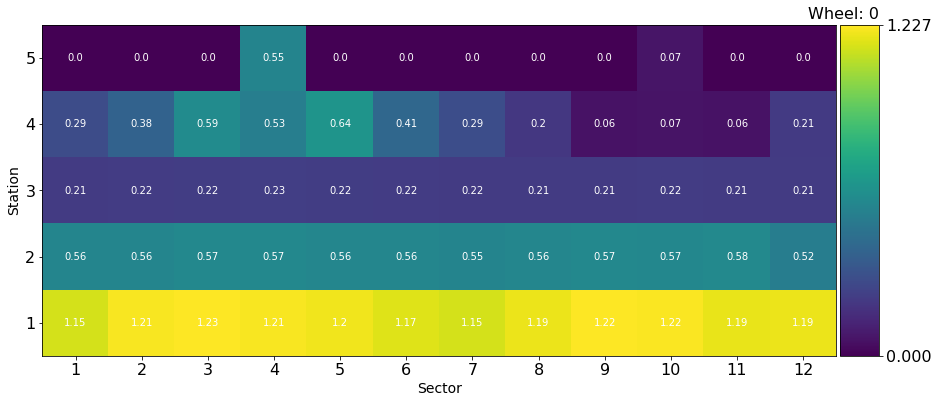

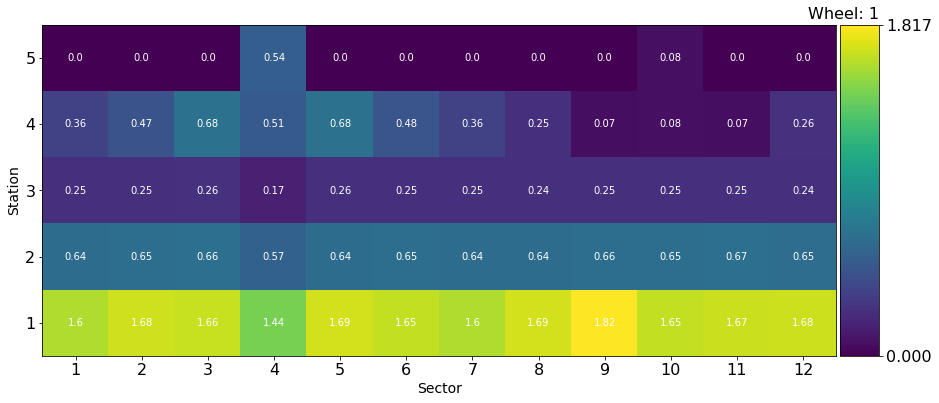

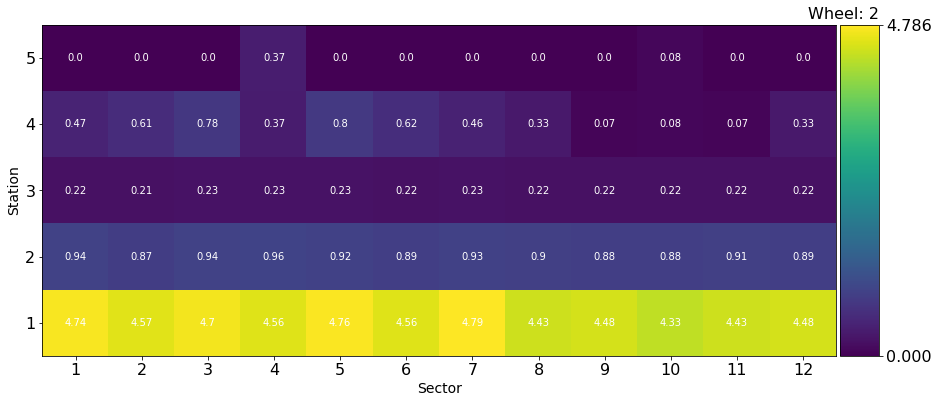

In [174]:
plot_scatter_2(ratio, "cs_norm", -2)
plot_scatter_2(ratio, "cs_norm", -1)
plot_scatter_2(ratio, "cs_norm", 0)
plot_scatter_2(ratio, "cs_norm", +1)
plot_scatter_2(ratio, "cs_norm", +2)

Cross-section per station and sector in each wheel for the anomalous run:

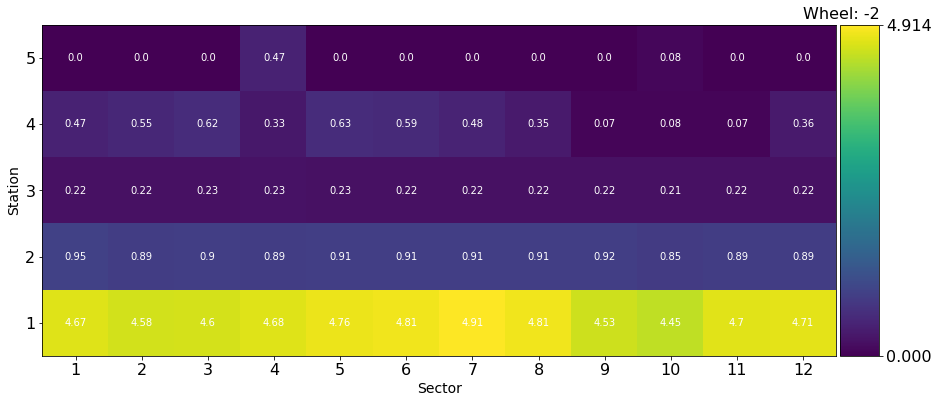

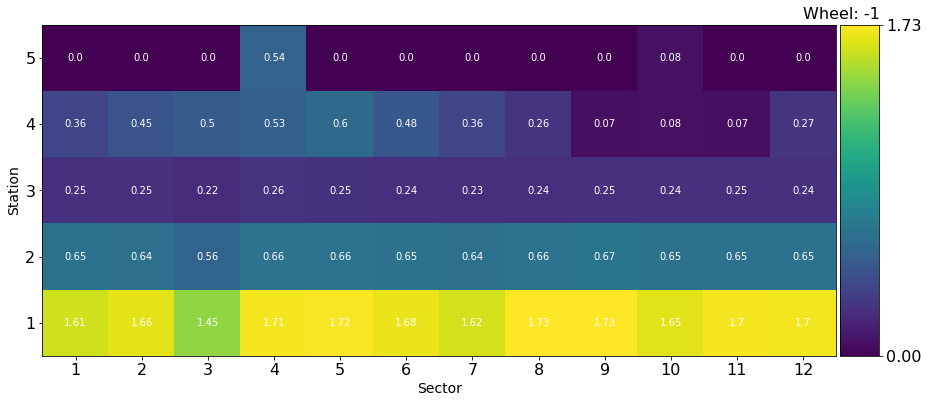

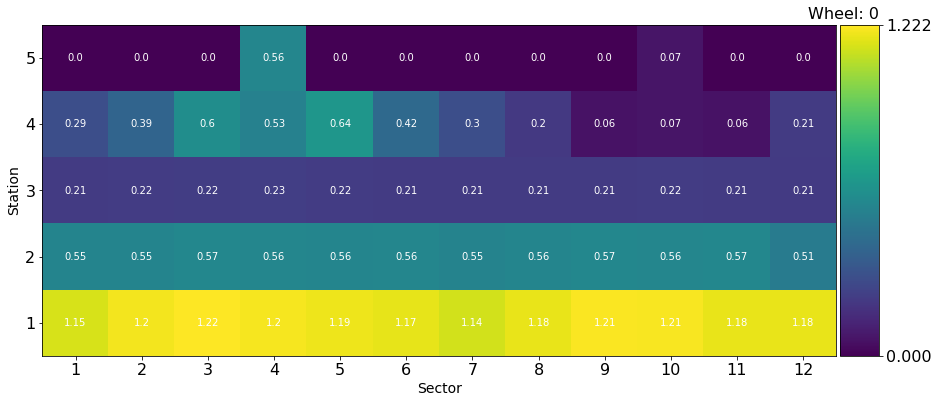

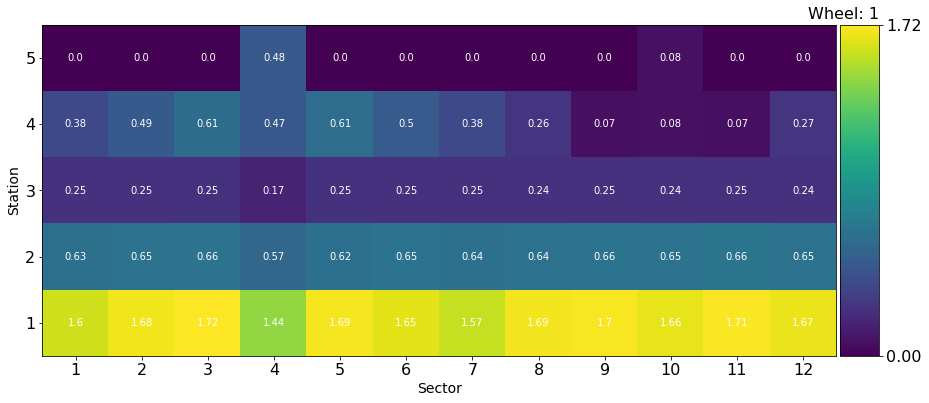

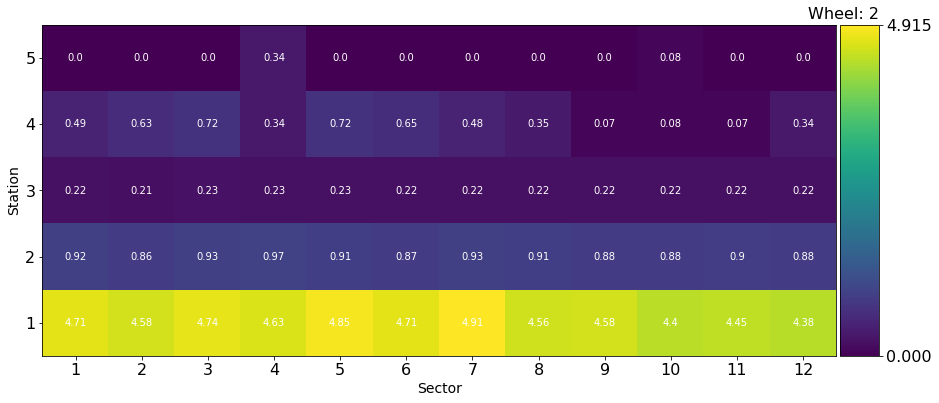

In [175]:
plot_scatter_2(ratio, "cs_anomal", -2)
plot_scatter_2(ratio, "cs_anomal", -1)
plot_scatter_2(ratio, "cs_anomal", 0)
plot_scatter_2(ratio, "cs_anomal", +1)
plot_scatter_2(ratio, "cs_anomal", +2)

Trying unsupervised algorithms:

In [176]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=1201,
                            contamination=0.2
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))

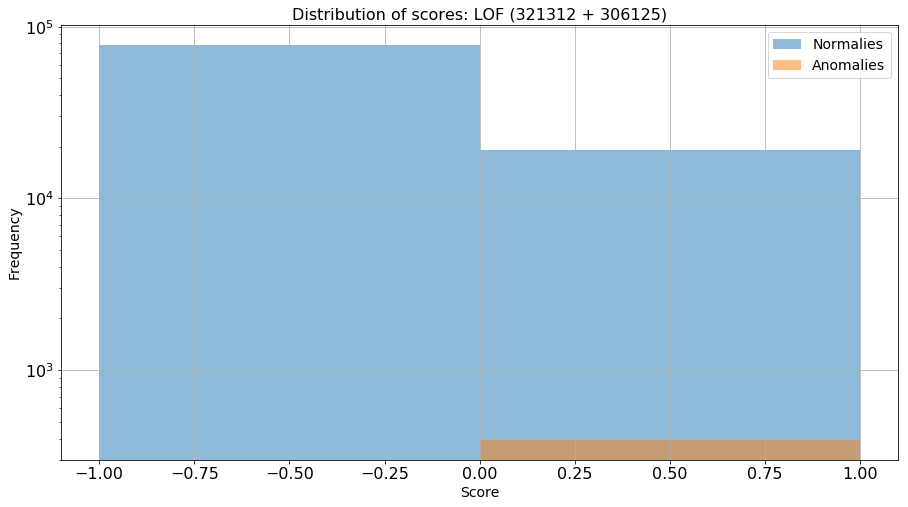

In [177]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF (321312 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


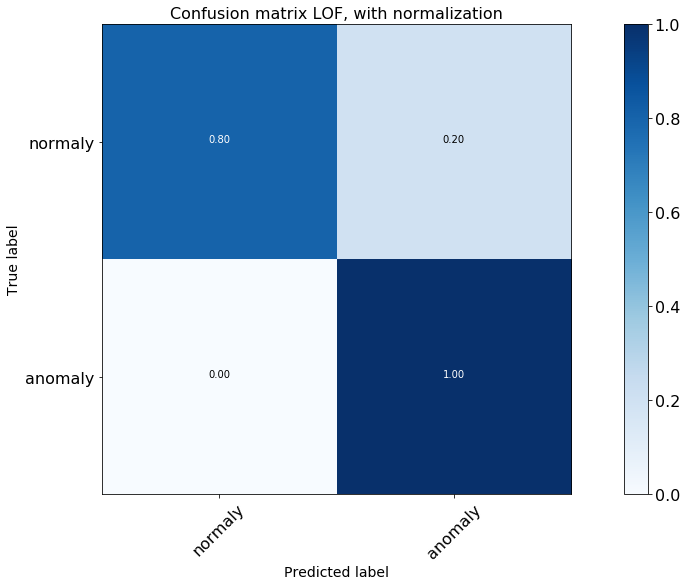

In [178]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

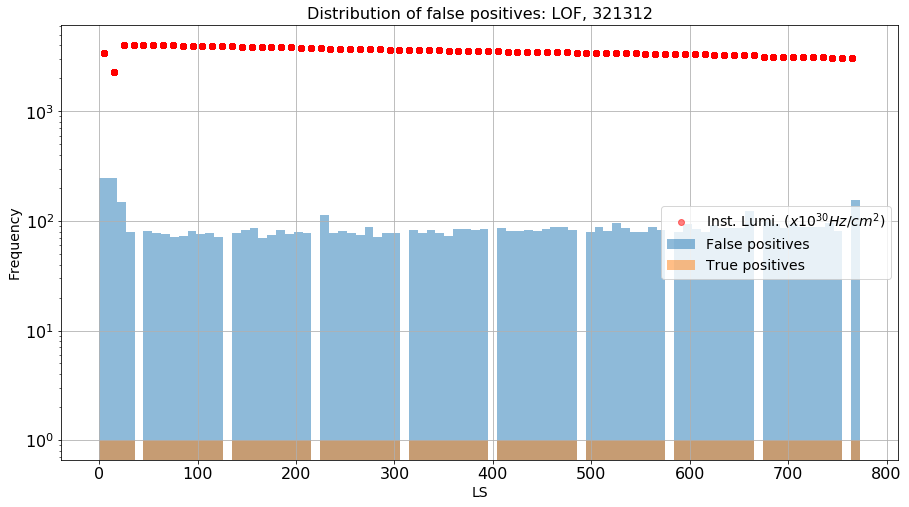

array([ 249.,  249.,  150.,   79.,    0.,   81.,   77.,   76.,   71.,
         73.,   81.,   76.,   78.,   71.,    0.,   78.,   83.,   87.,
         70.,   74.,   83.,   76.,   80.,   78.,    0.,  114.,   78.,
         81.,   78.,   74.,   88.,   72.,   77.,   78.,    0.,   83.,
         78.,   82.,   78.,   73.,   85.,   85.,   82.,   84.,    0.,
         87.,   81.,   81.,   82.,   81.,   85.,   88.,   88.,   82.,
          0.,   80.,   89.,   81.,   95.,   87.,   79.,   79.,   88.,
         82.,    0.,   80.,   94.,   84.,   80.,   92.,   87.,   86.,
         86.,  124.,    0.,  101.,   93.,   87.,   94.,   89.,   88.,
         89.,   95.,   81.,    0.,  156.])

In [179]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

## K-Means clustering reduced

In [180]:
# 0.system, 1.wheel, 2.sector, 3.station, 4.lumi, 5.err, 6.rate, 7.err, 8.CS, 9.err
def removeItem(data):
    index = [0, 4, 5, 6, 7, 9] #leaving only position and CS
    #index = [0, 5, 7, 9] #removing system and errors
    temp = data.copy()
    temp = np.delete(temp, index)
    return temp

layers_test["content_red"] = layers_test["content"].apply(removeItem)
layers_test["content_red"] = layers_test["content_red"].apply(np.array)

In [181]:
#Reindex because otherwise anomalies and normalies have the same labels/indexes in W+3_S4_MB3
layers_test.index = pd.RangeIndex(len(layers_test.index))

def scale_cs(df, factors):
    for i in [-2, -1, 0, +1, +2]:
        for j in range(1, 13):
             for k in range(1, 6):
                rule = (df.wheel == i) & (df.sector == j) & (df.station == k)
                rule_f = (factors.wheel == i) & (factors.sector == j) & (factors.station == k)
                indexes = df[rule].index
                indexes_f = (factors[rule_f].index)
                if ((len(indexes) == 0) | (len(indexes_f) == 0)):
                    continue
                #print factors.loc[indexes_f[0], "factor"]
                for m in indexes:
                    #print i, j, k, m, df.loc[m, "content_red"]
                    content =  df.loc[m, "content_red"].copy()
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    content[3] = content[3]*factors.loc[indexes_f[0], "factor"]
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    df.at[m, "content_red"] = content

scale_cs(layers_test, factors)

In [182]:
#0.No rescaling
#1.RobustScaler
#2.MaxAbsScaler 
#3.QuantileTransformerUniform: NO
#4.QuantileTransformerNormal: NO
#5.Normalizer
#6.MinMaxScaler

scaler_type = 5
layers_test["content_red_scaled"] = layers_test["content_red"].apply(scale_data, args=[scaler_type])

In [183]:
print layers_test["content_red"].iloc[100]
print layers_test["content_red_scaled"].iloc[100]

[-2 -4 -2 6.0530008874154468]
[[-0.25683525 -0.5136705  -0.25683525  0.77731199]]


In [184]:
def extract_cs(data):
    #print data[0][3]
    return data[3]

layers_test["CS_red"] = layers_test["content_red"].apply(extract_cs)

In [185]:
def plot_scatter_3(df, arg, wheel, range_ = False):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    if (range_):
        temp = temp[temp.lumi > 10000]
    temp = temp.groupby(['run', 'board', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        if (i == 5):
            tmp = list(temp2[arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule][arg].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

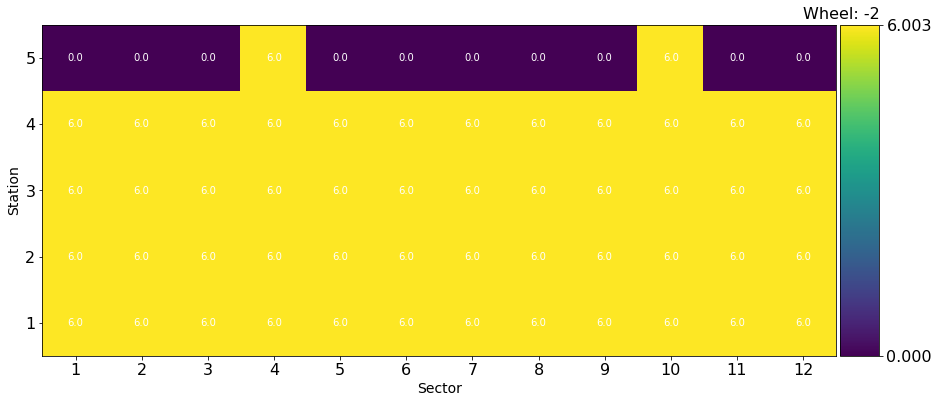

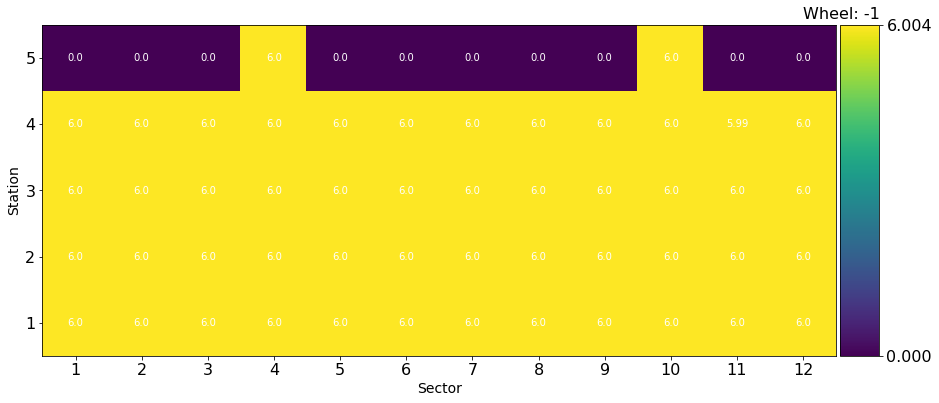

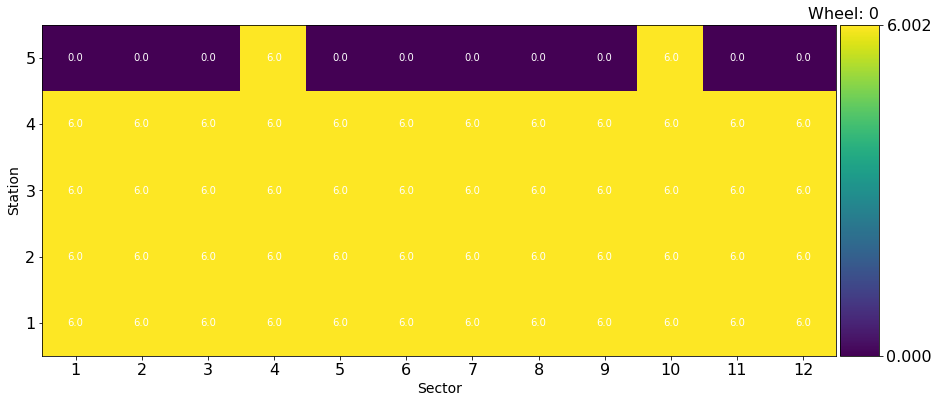

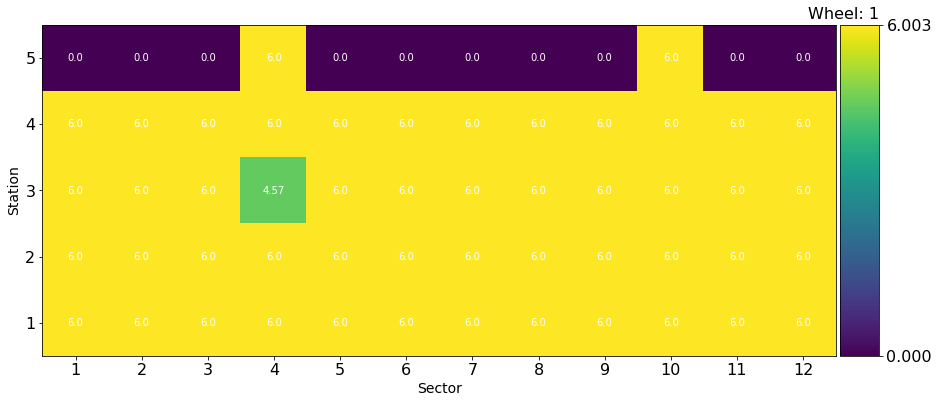

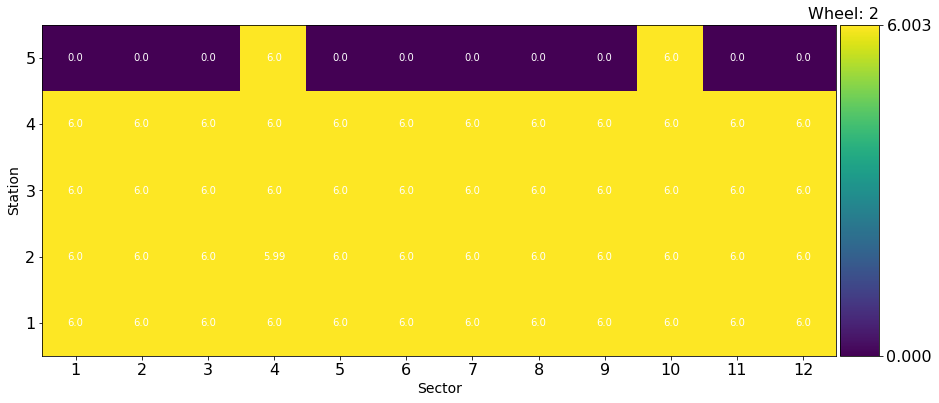

In [186]:
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", -2, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", -1, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", 0, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", +1, True)
plot_scatter_3(layers_test[layers_test.run == 319579], "CS_red", +2, True)

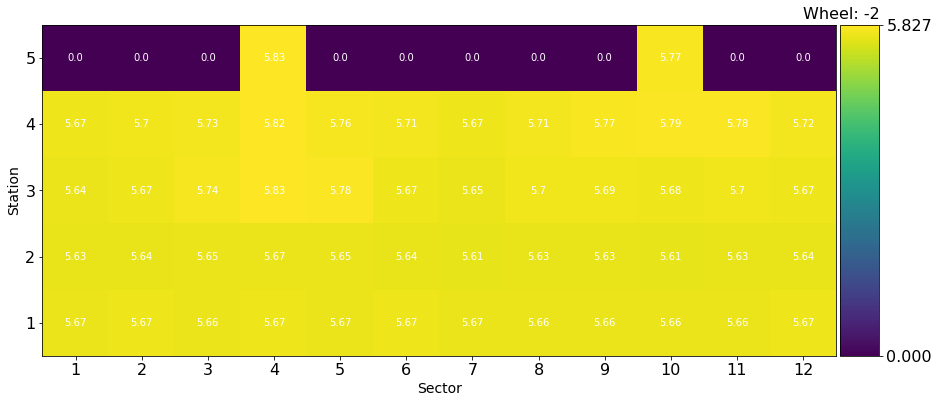

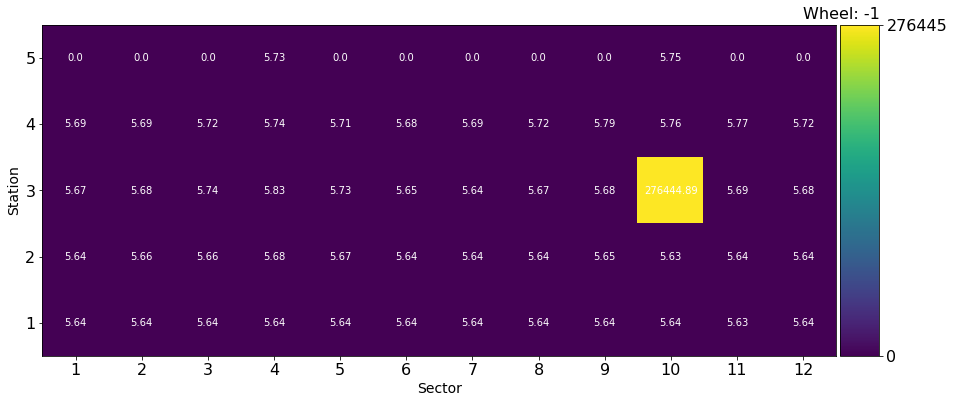

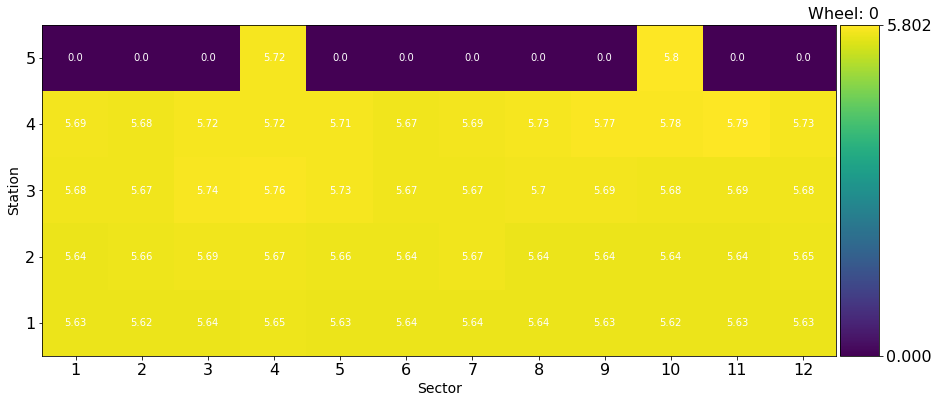

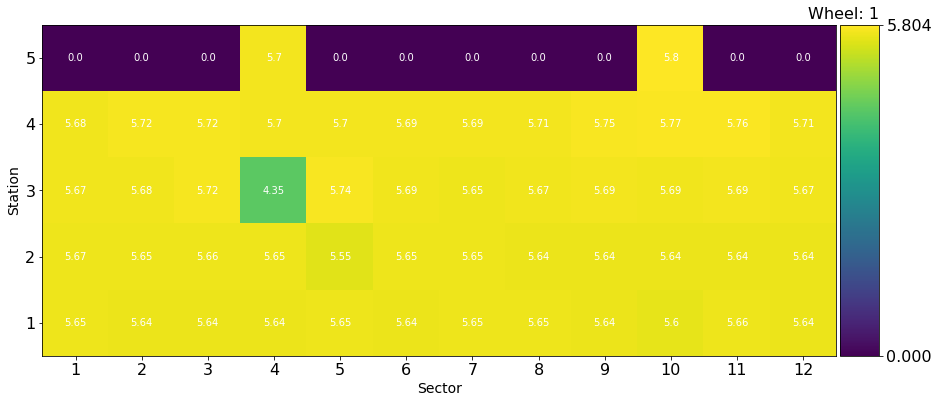

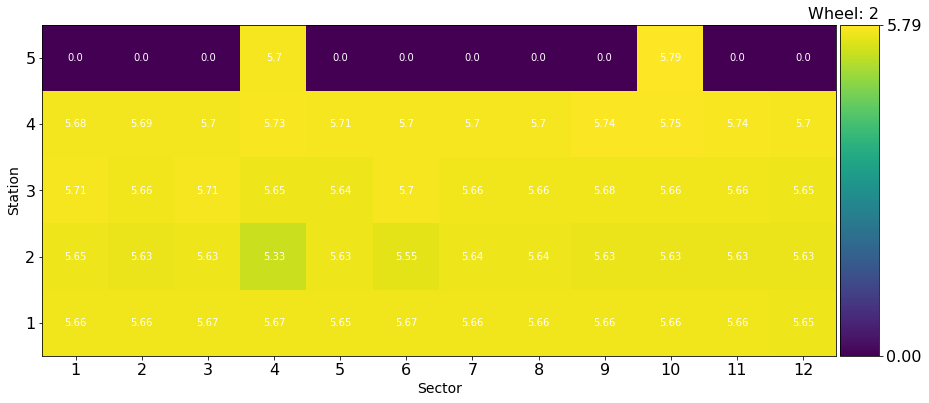

In [187]:
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -2)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", 0)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +2)

In [188]:
#n_cls = 150
#from sklearn import cluster, datasets
#k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(layers_test["content_red"].values))
#layers_test["kmeans_score"] = k_means.labels_

In [189]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans_red_2018.sav'
k_means = joblib.load(filename)

Removing the lumi oscillations:

In [190]:
rule = (layers_test.run == 321312) & (layers_test.ls > 50)
#& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [191]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_red"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

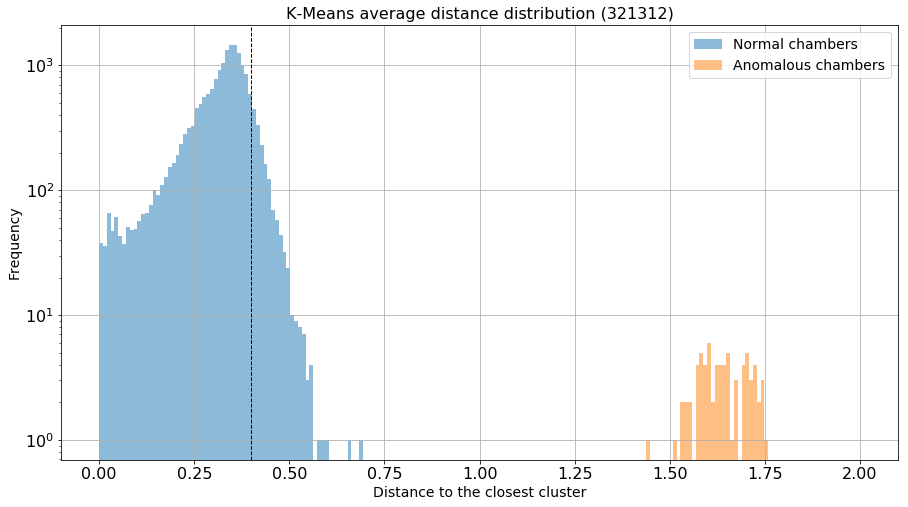

In [192]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.set_xscale('log')
ax.grid()
bins = np.linspace(0, 2.0, 200)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins,\
         alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins,\
         alpha=0.5, label="Anomalous chambers")
plt.axvline(0.4, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (321312)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

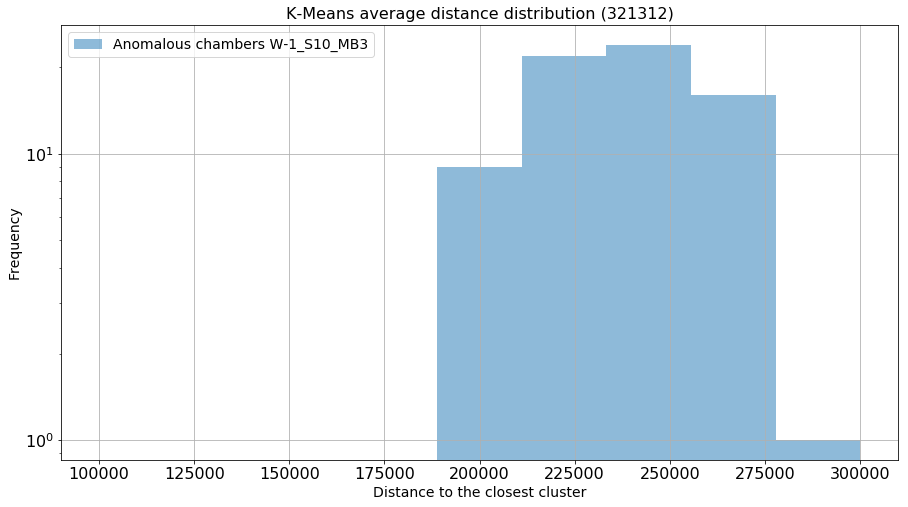

In [193]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.set_xscale('log')
ax.grid()
bins = np.linspace(100000, 300000.0, 10)
rule = (reduced_anom.wheel == -1) & (reduced_anom.sector == 10) & (reduced_anom.station == 3)
plt.hist(reduced_anom[rule & (reduced_anom["score"] < 0)]["dist"], bins=bins,\
         alpha=0.5, label="Anomalous chambers W-1_S10_MB3")
#plt.axvline(0.4, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (321312)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[ 0.90294511  0.09705489]
 [ 0.          1.        ]]


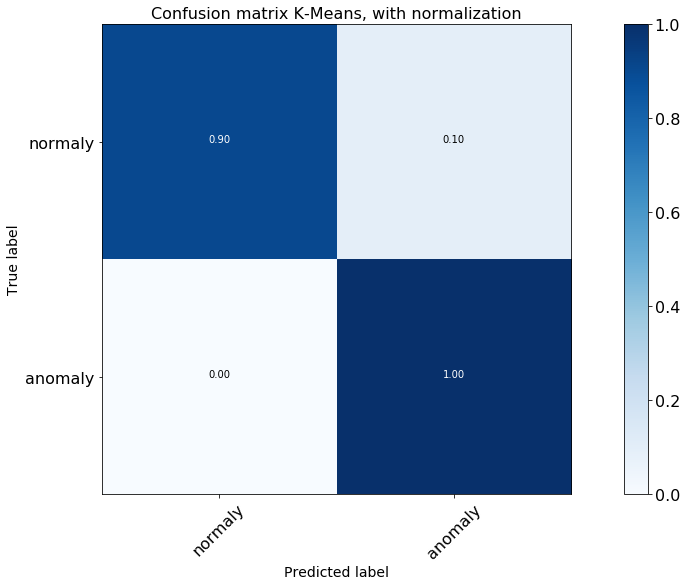

In [194]:
th_km = 0.4
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

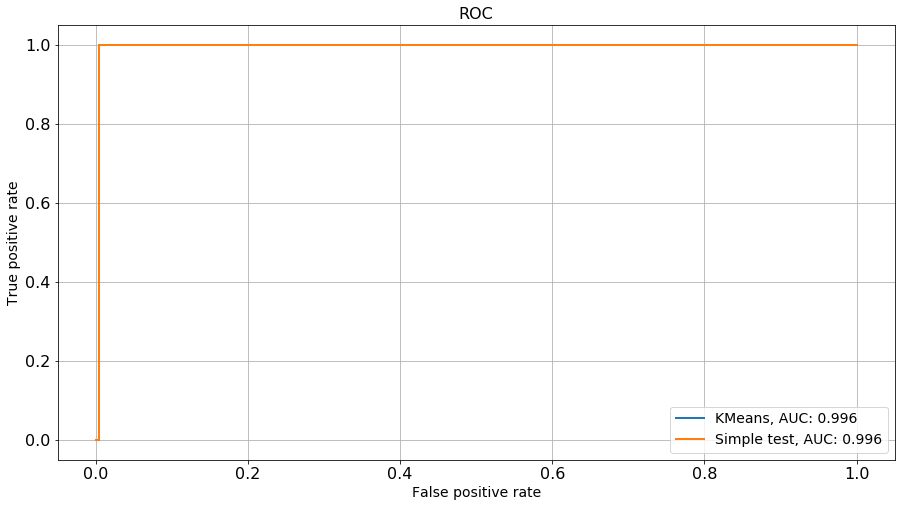

In [195]:
get_roc_curve(reduced_anom,[
                           #("Variance", "variance_score"),
                           #("IF", "if_score"),
                           #("SVM", "svm_score"),
                           #("AE", "cae_score"),
                           ("KMeans", "dist"),
                           #("DNN", "ann_score_4"),
                           ("Simple test", "st_score"),
                          ]
             )

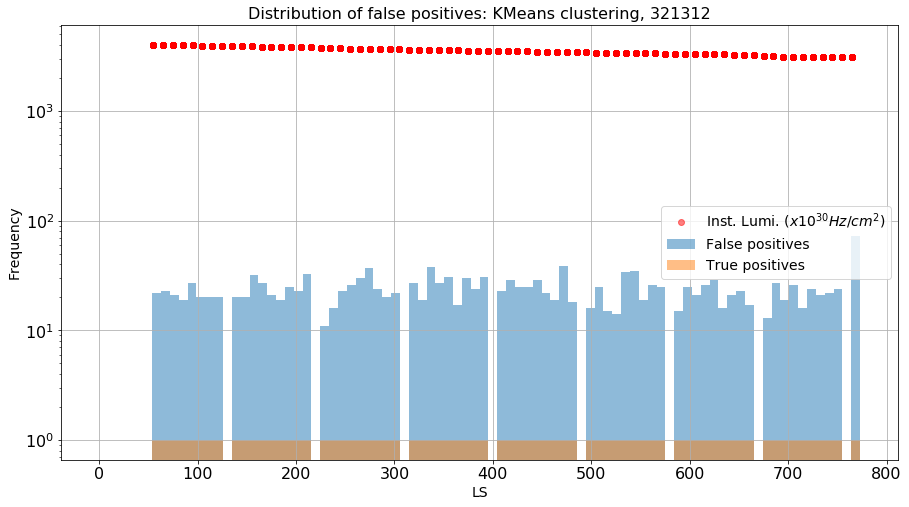

array([  0.,   0.,   0.,   0.,   0.,   0.,  22.,  23.,  21.,  19.,  27.,
        20.,  20.,  20.,   0.,  20.,  20.,  32.,  27.,  21.,  19.,  25.,
        23.,  33.,   0.,  11.,  16.,  23.,  26.,  30.,  37.,  24.,  20.,
        22.,   0.,  27.,  19.,  38.,  27.,  31.,  17.,  30.,  24.,  31.,
         0.,  23.,  29.,  25.,  25.,  29.,  22.,  19.,  39.,  18.,   0.,
        16.,  25.,  15.,  14.,  34.,  35.,  19.,  26.,  25.,   0.,  15.,
        25.,  21.,  26.,  29.,  16.,  21.,  23.,  17.,   0.,  13.,  27.,
        19.,  26.,  16.,  24.,  21.,  22.,  24.,   0.,  72.])

In [196]:
threshold = th_km
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: KMeans clustering, ", reduced_anom, "dist",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

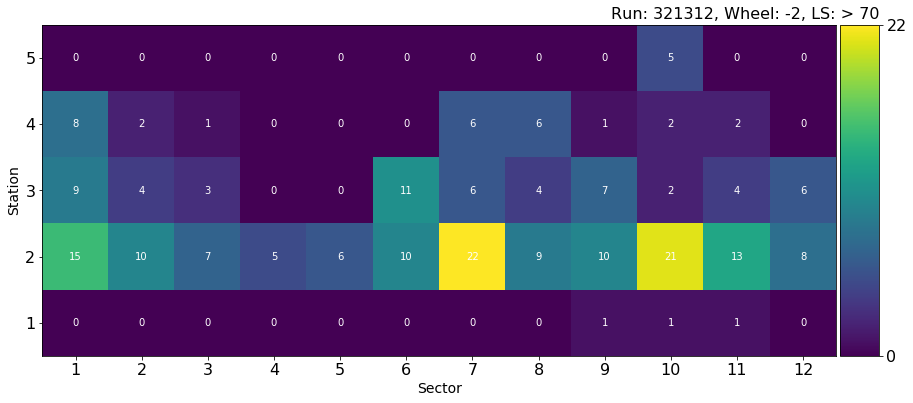

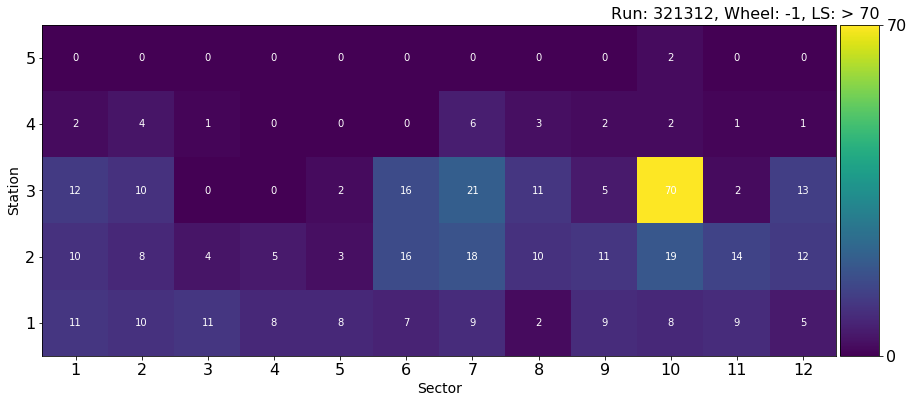

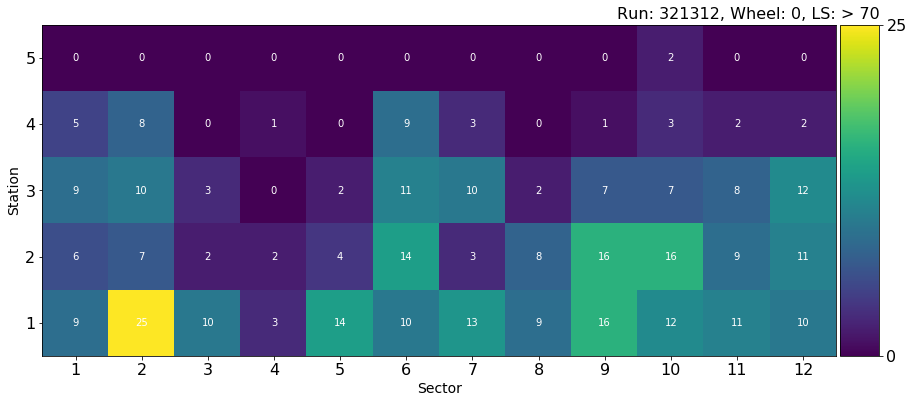

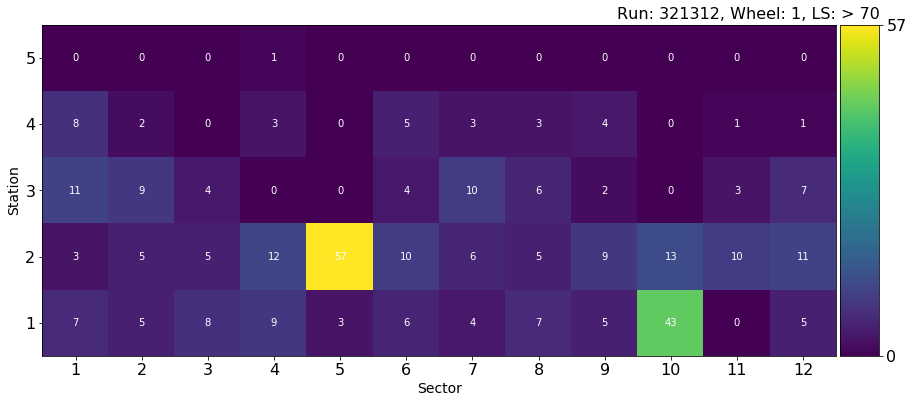

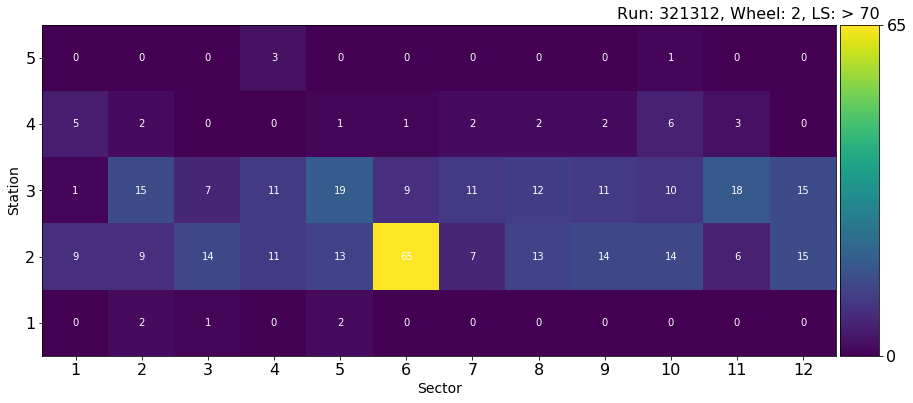

In [197]:
dis_nn = "dist"
rule = (reduced_anom["score"] == -1) & (reduced_anom[dis_nn] > th_km)

plot_scatter(reduced_anom[rule], 321312, -2, 70, -1)
plot_scatter(reduced_anom[rule], 321312, -1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, 0, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +2, 70, -1)

## LOF reduced

Removing the lumi oscillations:

In [198]:
rule1 = (layers_test.run == 321312) & ((layers_test.ls > 50))
rule2 = (layers_test.run == 319579) & ((layers_test.ls > 50)) & ((layers_test.ls < 3000))
reduced_anom_2 = layers_test[rule1 | rule2].copy()

In [199]:
# fit the model
lofclf = LocalOutlierFactor(n_neighbors=1201, contamination=0.2)#It has to be a odd number
reduced_anom_2["lof_score_red"] = -lofclf.fit_predict(np.vstack(reduced_anom_2["content_red"].values))

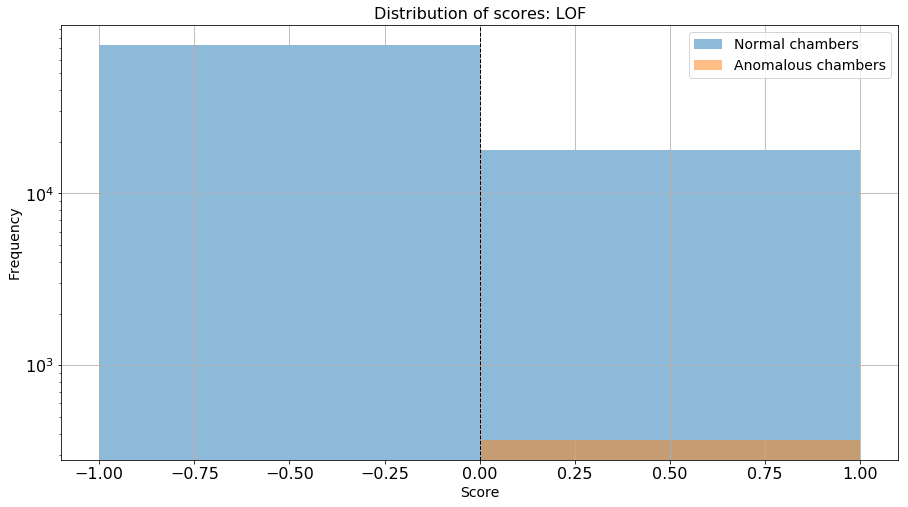

In [200]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(reduced_anom_2[reduced_anom_2["score"] < 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom_2[reduced_anom_2["score"] > 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Anomalous chambers")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.0, color='k', linestyle='dashed', linewidth=1)
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


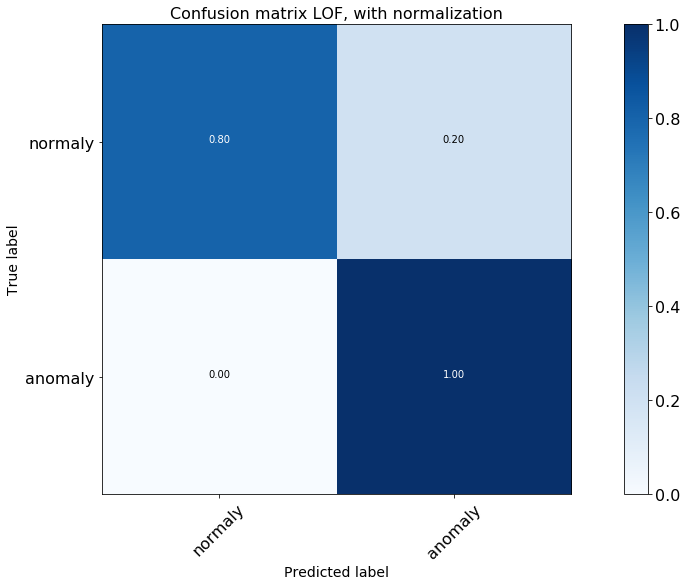

In [201]:
threshold = 0.0
y_pred = 2*(reduced_anom_2["lof_score_red"] > threshold)-1
cnf_matrix = confusion_matrix(reduced_anom_2["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

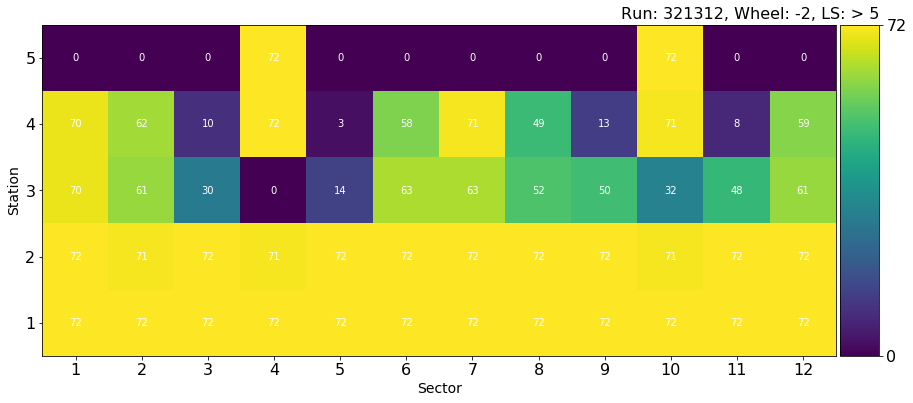

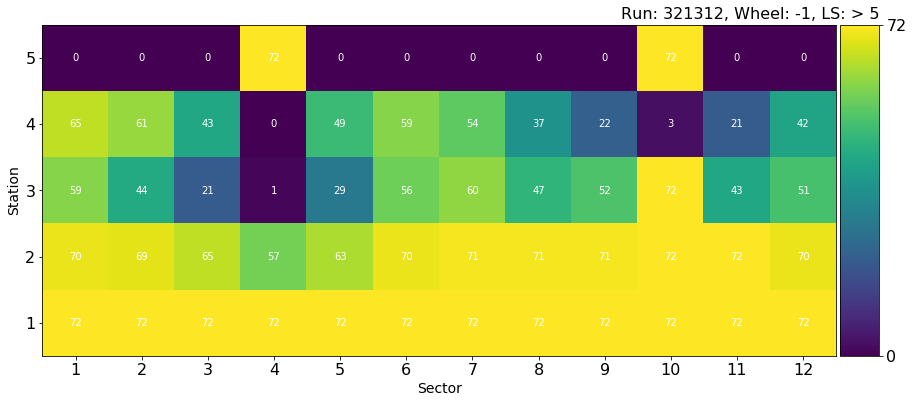

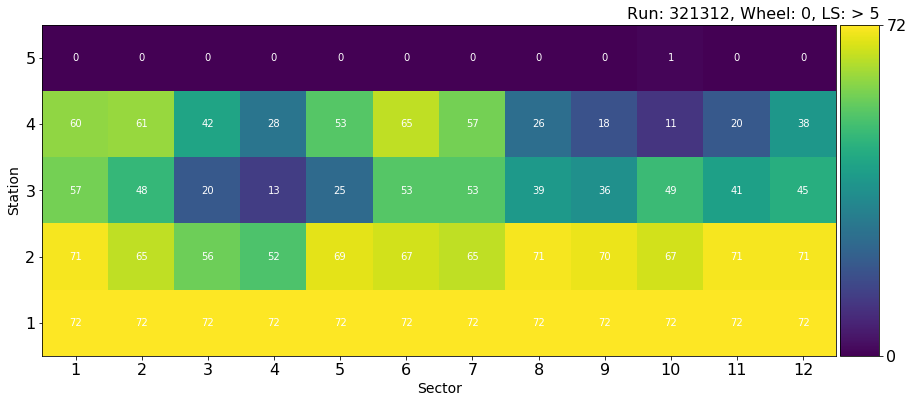

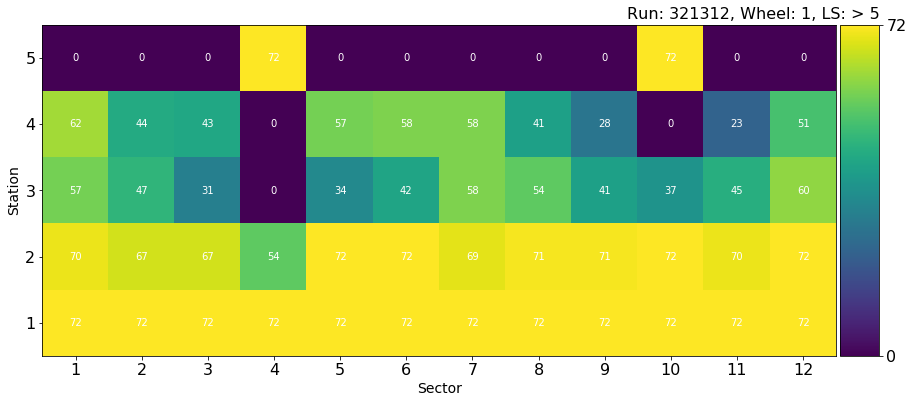

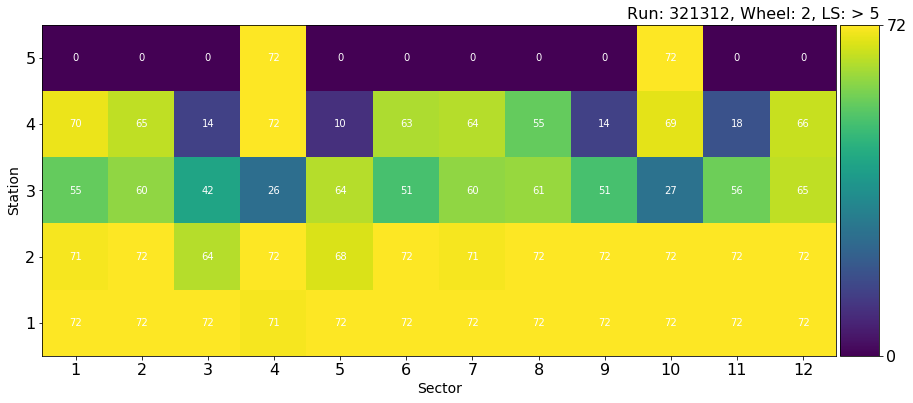

In [202]:
dis_nn = "lof_score_red"
rule = (reduced_anom_2["score"] == -1) & (reduced_anom_2[dis_nn] > th_km)

plot_scatter(reduced_anom_2[rule], 321312, -2, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, -1, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, 0, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, +1, 5, -1)
plot_scatter(reduced_anom_2[rule], 321312, +2, 5, -1)

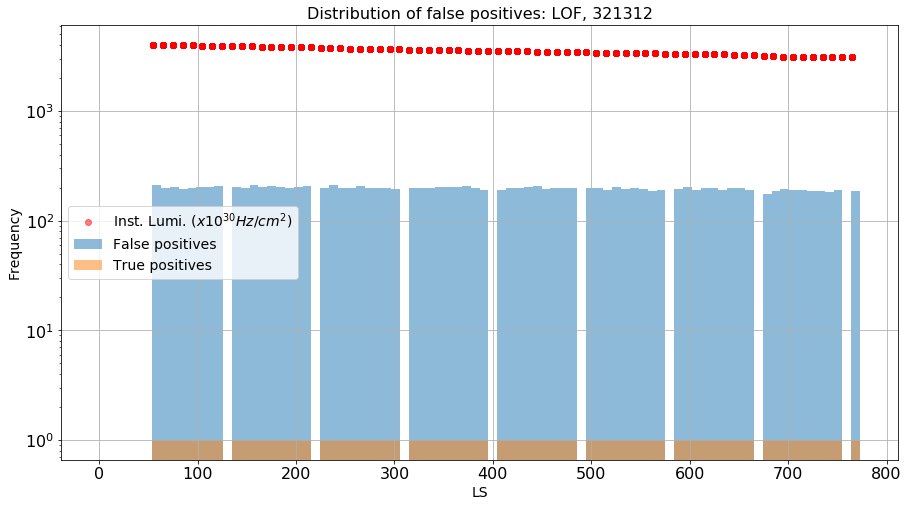

array([   0.,    0.,    0.,    0.,    0.,    0.,  212.,  198.,  205.,
        194.,  201.,  205.,  203.,  209.,    0.,  205.,  200.,  210.,
        205.,  206.,  202.,  200.,  204.,  209.,    0.,  197.,  210.,
        197.,  201.,  206.,  198.,  199.,  200.,  196.,    0.,  198.,
        201.,  197.,  204.,  203.,  203.,  209.,  198.,  192.,    0.,
        189.,  201.,  199.,  202.,  206.,  194.,  201.,  197.,  198.,
          0.,  198.,  197.,  192.,  205.,  196.,  200.,  193.,  187.,
        192.,    0.,  195.,  204.,  189.,  197.,  200.,  190.,  198.,
        200.,  191.,    0.,  177.,  185.,  193.,  190.,  190.,  188.,
        188.,  182.,  189.,    0.,  188.])

In [203]:
reduced_anom_2["averageLS"] = reduced_anom_2["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", reduced_anom_2, "lof_score_red",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])